## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model training section](#fourth-bullet)

In [101]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, MaxPooling1D, AveragePooling1D,\
UpSampling1D, InputLayer

from scipy import ndimage, misc

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler
from sklearn.externals import joblib
#from sklearn.neighbors import LocalOutlierFactor
from sklearn import cluster, datasets

In [102]:
from pandas.tseries import converter
converter.register() 

In [103]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [104]:
import os
cwd = os.getcwd()
print cwd

/eos/user/c/calabria/Merve/L1MTriggerRateMonitoringWithML


In [105]:
runs = [297179, 297180, 297181, 306459]
lumi_directory = "./lumi"
rates_directory = "./rates"
runs_ref = [306125]
lumi_directory_ref = "/eos/user/c/calabria/DTTriggerRateMonitoringWithML/lumi"
rates_directory_ref = "/eos/user/c/calabria/DTTriggerRateMonitoringWithML/rates"

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [106]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 297179
Loading 297180
Loading 297181
Loading 306459
Done.


In [107]:
for run in runs_ref:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory_ref, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory_ref, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 306125
Done.


# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [108]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [109]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [110]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [111]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [112]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [113]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs+runs_ref:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1],\
                                    "nLS": nLS}, ignore_index = True)

297179 2017-06-20 07:09:38 2017-06-20 07:49:39 1 104 104
297180 2017-06-20 07:49:55 2017-06-20 08:43:55 1 140 140
297181 2017-06-20 08:44:01 2017-06-20 09:20:32 1 95 95
306459 2017-11-09 22:00:10 2017-11-10 12:47:56 1 2286 2286
306125 2017-11-03 14:46:12 2017-11-04 10:14:06 1 3007 3007


In [114]:
boundaries = boundaries.sort_values('run')
boundaries = boundaries.reset_index()

Reindexing the dataframe after removing some lines:

In [115]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [116]:
print len(int_lumi2.index)

5632


Filling end time column:

In [117]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

Selecting only beam status STABLE BEAM:

In [118]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

In [119]:
int_lumi2.to_csv("int_lumi2.csv", sep='\t')

Plotting the instantaneous luminosities:

In [120]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel(r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

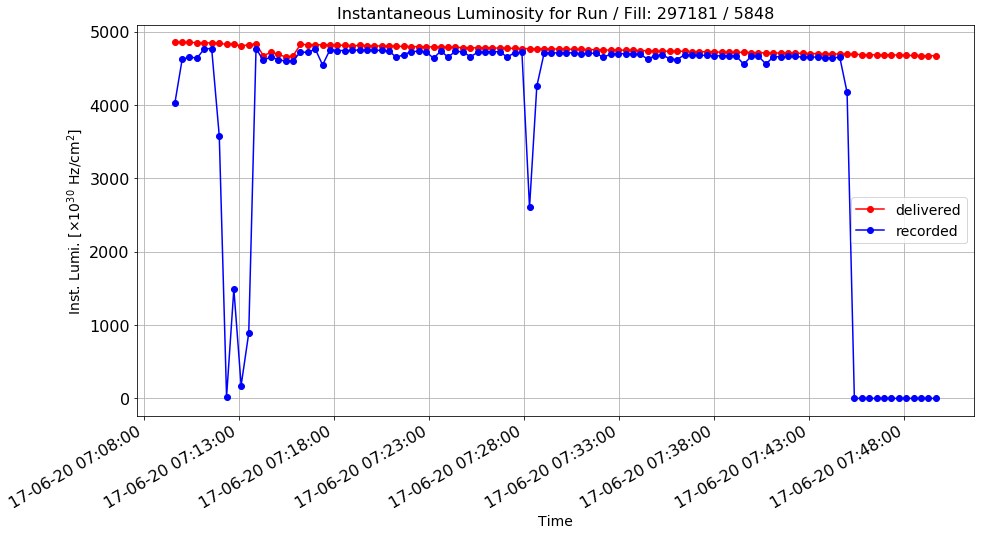

In [121]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 297179]["time"], 
               int_lumi2[int_lumi2["run"] == 297179]["delivered"], 
               int_lumi2[int_lumi2["run"] == 297179]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("297181", int_lumi2["fill"].iloc[0])))

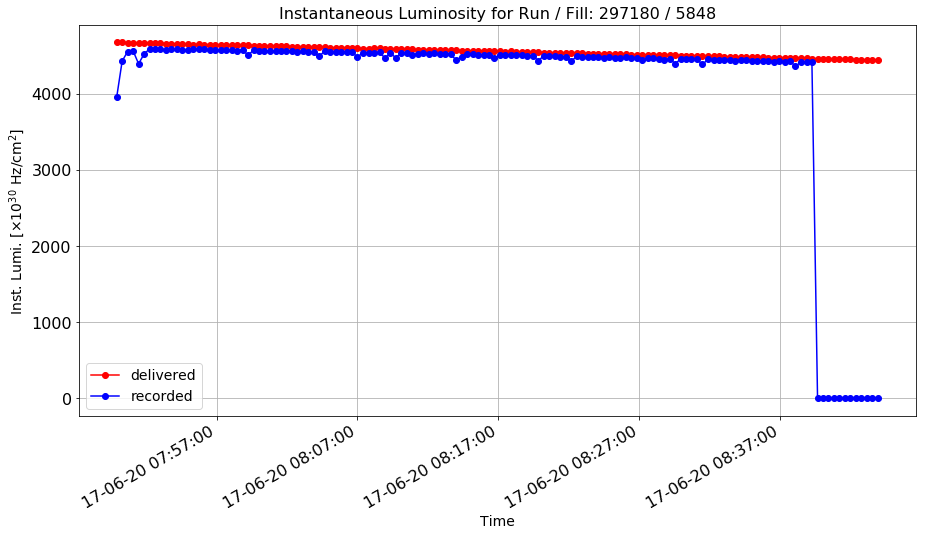

In [122]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 297180]["time"], 
               int_lumi2[int_lumi2["run"] == 297180]["delivered"], 
               int_lumi2[int_lumi2["run"] == 297180]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("297180", int_lumi2["fill"].iloc[0])))

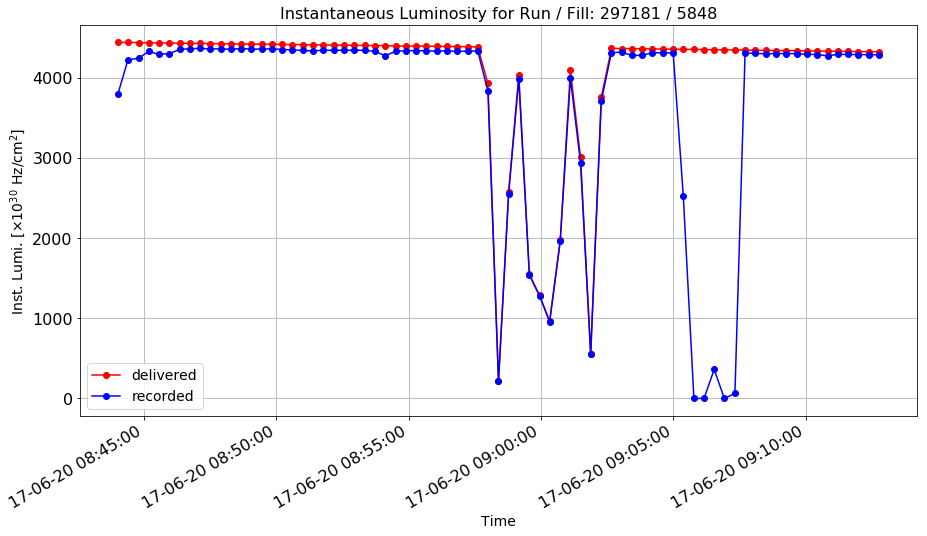

In [123]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 297181]["time"], 
               int_lumi2[int_lumi2["run"] == 297181]["delivered"], 
               int_lumi2[int_lumi2["run"] == 297181]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("297181", int_lumi2["fill"].iloc[0])))

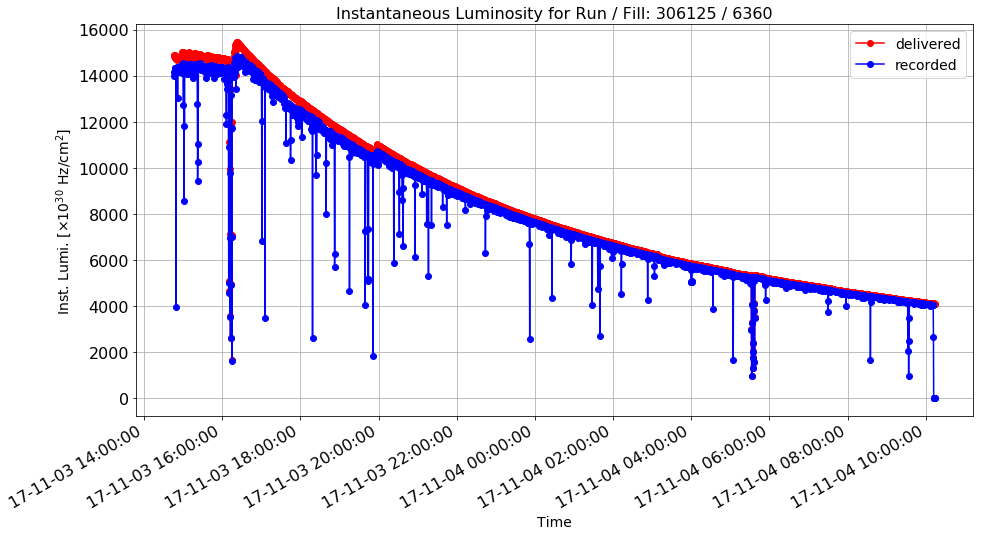

In [124]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 306125]["time"], 
               int_lumi2[int_lumi2["run"] == 306125]["delivered"], 
               int_lumi2[int_lumi2["run"] == 306125]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("306125", int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])))

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [125]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [126]:
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [127]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

In [128]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show()

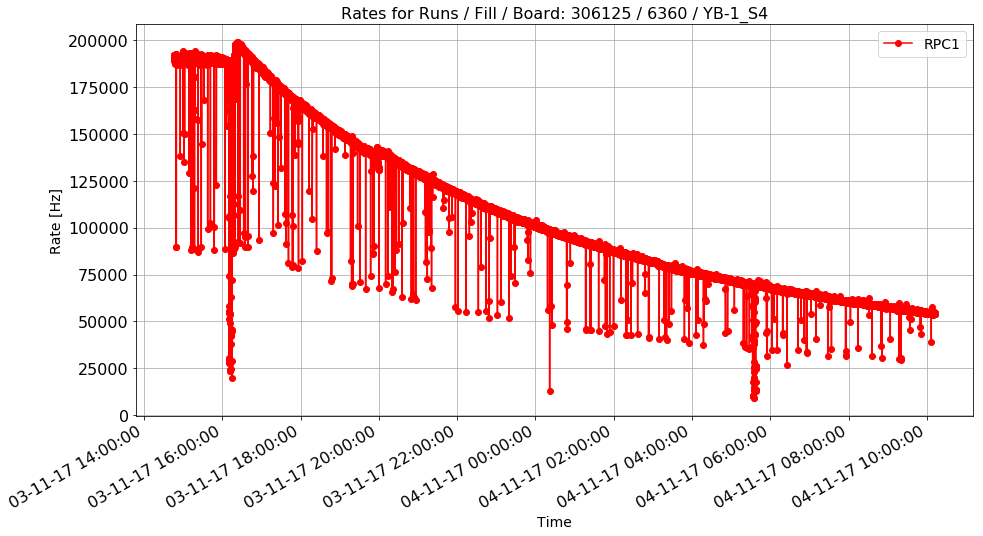

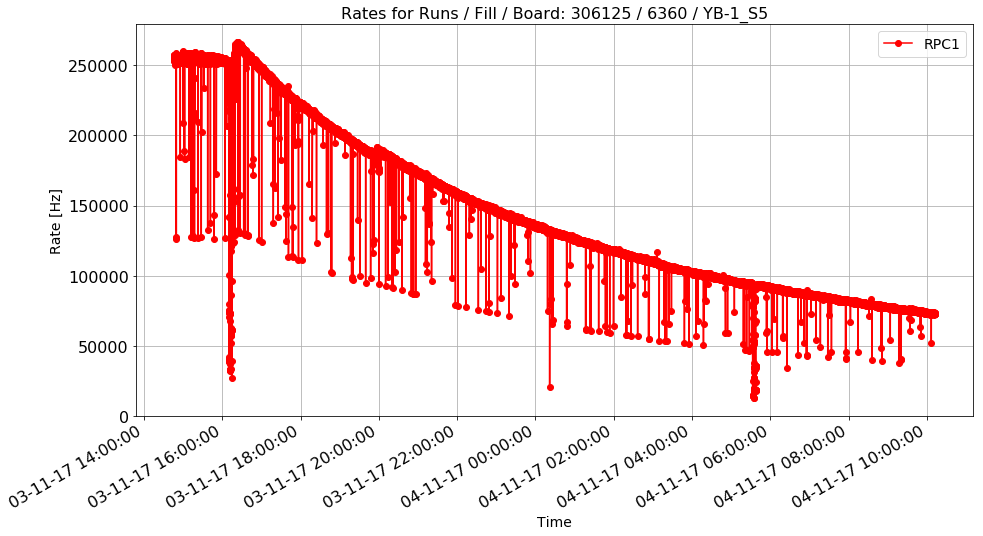

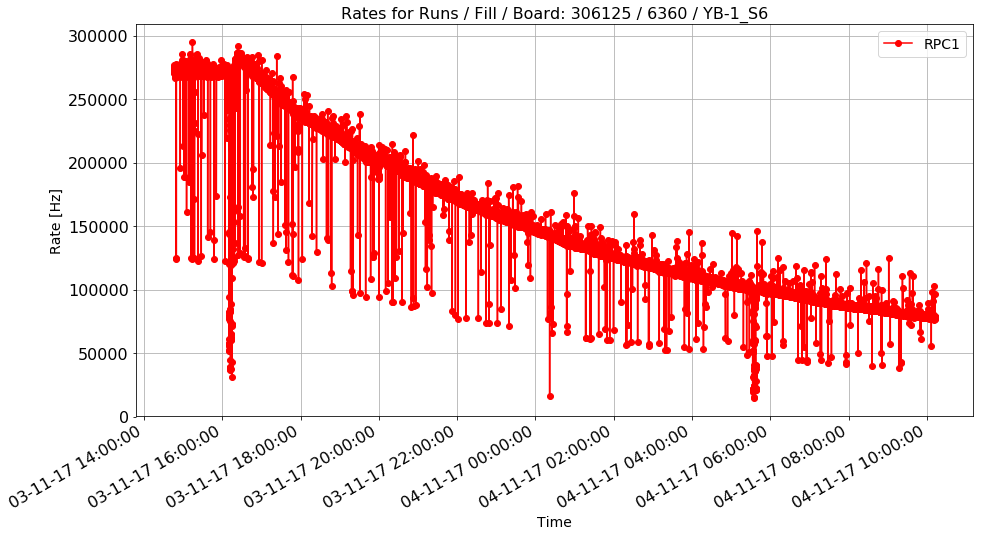

In [129]:
rule = (df_rates.run == 306125)
boards = ["YB-1_S4", "YB-1_S5", "YB-1_S6"]
for board in boards:
    plot_rate_vs_time(df_rates[rule],\
                      "time", "RPC1", board, "Rates for Runs / Fill / Board: %s / %s / %s" % 
                      ("306125", int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0], board))

Associating a LS and an instantaneous luminosity to each rate:

In [130]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [131]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [132]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-06-20 07:09:38 2017-11-10 12:47:56
Duplicates: 2238460


In [133]:
print len(df_rates_noduplicates)

37940


Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [134]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000


Removing the few cases not assigned and that are still at -1:

In [135]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

37918


Save in a csv file:

In [136]:
df_rates.to_csv("df_rates.csv", sep='\t')
df_rates_noduplicates.to_csv("df_rates_nodup.csv", sep='\t')

In [137]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [138]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000
1380000
1410000
1440000
1470000
1500000
1530000
1560000
1590000
1620000
1650000
1680000
1710000
1740000
1770000
1800000
1830000
1860000
1890000
1920000
1950000
1980000
2010000
2040000
2070000
2100000
2130000
2160000
2190000
2220000
2250000


In [139]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [140]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

In [141]:
#print df_rates[df_rates.ls <= 0]
df_rates.to_csv("df_rates.csv", sep='\t')

Averaging the rates associated to the same LS:

In [142]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [143]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [144]:
bunch = 50
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [145]:
#print df_rates["group"]

In [146]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4",\
  "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4",\
  "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4",\
  "DT1", "DT2", "DT3", "DT4", "DT5"]].size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3", "DT4":\
                                         "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [147]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

In [148]:
#print df_rates

Check for null or NaN values:

In [149]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
#df_rates = df_rates.fillna(0)
#print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []


In [150]:
#Another backup
#df_rates_backup = df_rates.copy()
df_rates.to_csv("df_rates.csv", sep='\t')

In [151]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [152]:
print len(df_rates)

6840


Uncomment to check just one case case:

In [153]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [180]:
def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log,\
                    fit = True, fmin = 5000, fmax = 15000):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err,\
        yerr=df_temp[rule][y_err], fmt=opt[i], ecolor=newstr, label=str(run[i]))
        plt.legend(loc="best")
        
        if ((run[i] == 306125) & fit):
            rule2 = (df_temp[x_val] > fmin) & (df_temp[x_val] < fmax)
            val1 = df_temp[rule & rule2][x_val]
            val2 = df_temp[rule & rule2][y_val]
            coeff, pcov = np.polyfit(val1, val2, 1, cov = True)
            #print pcov
            perr3 = np.sqrt(np.diag(pcov))
            inter.append(coeff)
            inter.append(perr3)
            p = np.poly1d(coeff)
            xp = np.linspace(3000, 16000, 1000)
            _ = plt.plot(xp, p(xp), '-')
            print "Linear fit parameters:", coeff
            print "Paramenters uncertainty:", perr3
        
    plt.title(title)
    plt.show()
    if ((run[i] == 306125) & fit):
        return inter

Linear fit parameters: [   12.59668881  2451.89986378]
Paramenters uncertainty: [  2.14570342e-02   2.09750967e+02]


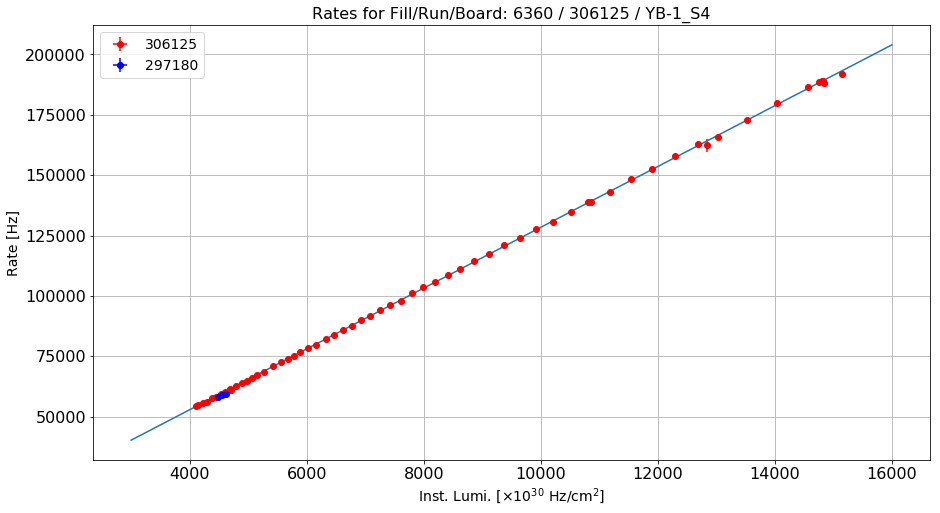

Linear fit parameters: [  3.73126505e+00   6.10905559e+04]
Paramenters uncertainty: [  6.12160708e-02   5.98411222e+02]


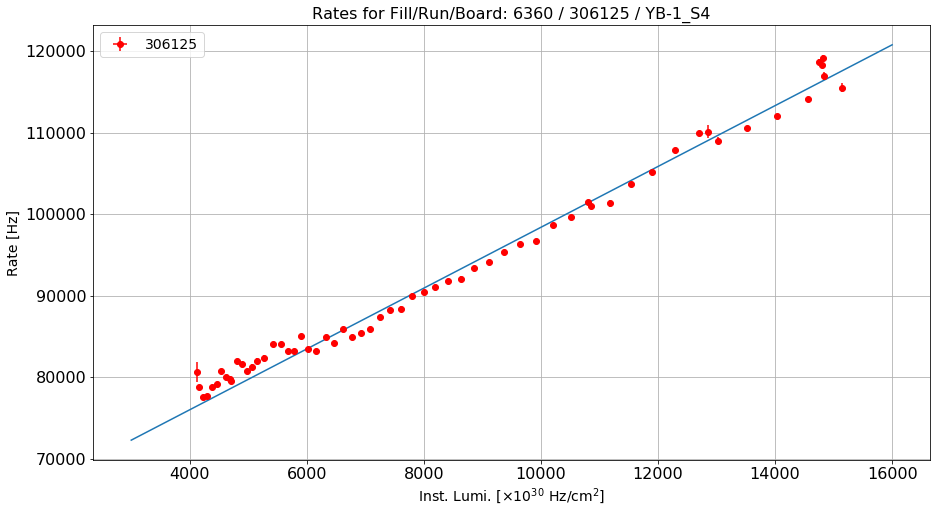

Linear fit parameters: [  9.42529381e-01   1.42233967e+04]
Paramenters uncertainty: [  1.34470047e-02   1.31449771e+02]


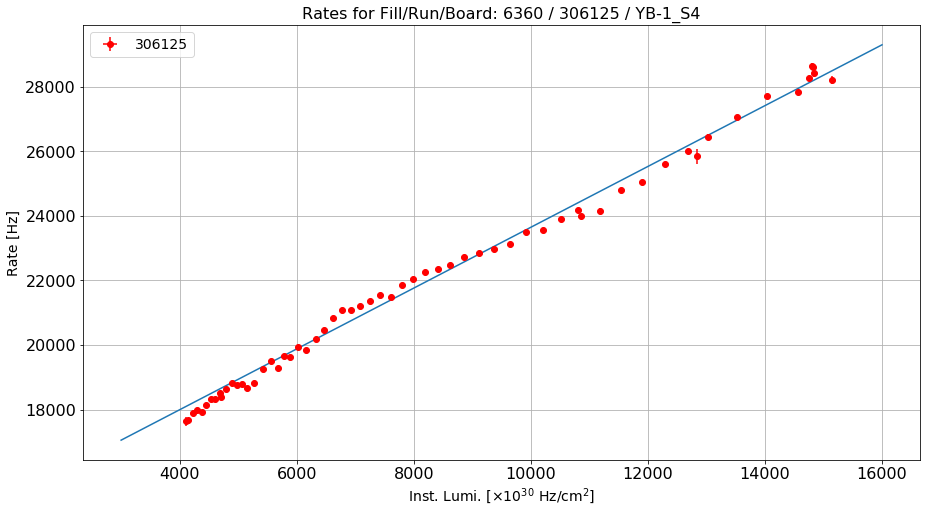

Linear fit parameters: [   28.34079322  8287.39325386]
Paramenters uncertainty: [  4.76736990e-02   4.66029199e+02]


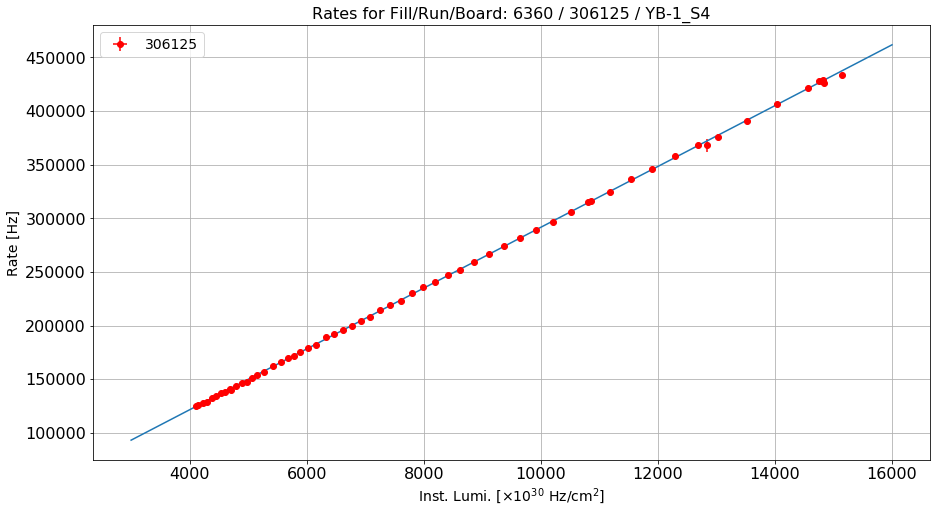

[array([   28.34079322,  8287.39325386]),
 array([  4.76736990e-02,   4.66029199e+02])]

In [181]:
#boards = ["YB-1_S4", "YB-1_S5", "YB-1_S6"]    
    
title = "Rates for Fill/Run/Board: "+str(int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])+" / "\
+str(boundaries["run"].iloc[3])+" / YB-1_S4"

plot_rate_vs_ls(df_rates, [306125, 297180], "lumi", "RPC1", "YB-1_S4", 0, "errRPC1",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro", "bo"], False)
plot_rate_vs_ls(df_rates, [306125], "lumi", "RPC2", "YB-1_S4", 0, "errRPC2",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro"], False)
plot_rate_vs_ls(df_rates, [306125], "lumi", "RPC3", "YB-1_S4", 0, "errRPC3",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro"], False)
plot_rate_vs_ls(df_rates, [306125], "lumi", "RPC4", "YB-1_S4", 0, "errRPC4",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro"], False)

Create a new dataframe with the input features already organized in a numpy array:

In [156]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4']
df_rates_new_2 = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new_2 = pd.concat([df_rates_new_2, temp], ignore_index=True)

print len(df_rates_new_2)

6840
27360


Adding the lumi/rate ratio:

In [157]:
df_rates_new_2["CS"] = -1
df_rates_new_2["errCS"] = -1

df_rates_new_2["CS"] = df_rates_new_2["rate"]/df_rates_new_2["lumi"]
print "Number of NaN's in CS before:"
print len(df_rates_new_2["CS"][df_rates_new_2["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new_2["CS"][np.isinf(df_rates_new_2["CS"])])

df_rates_new_2["CS"] = df_rates_new_2["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new_2["CS"] = df_rates_new_2["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new_2["CS"][df_rates_new_2["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new_2["CS"][np.isinf(df_rates_new_2["CS"])])

df_rates_new_2["errCS"] = (1/df_rates_new_2["lumi"])*\
np.sqrt(df_rates_new_2["err"]**2 + df_rates_new_2["CS"]**2 * df_rates_new_2["errLumi"]**2)

print "Number of NaN's in errCS before:"
print len(df_rates_new_2["errCS"][df_rates_new_2["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new_2["errCS"][np.isinf(df_rates_new_2["errCS"])])

df_rates_new_2["errCS"] = df_rates_new_2["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new_2["errCS"] = df_rates_new_2["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new_2["errCS"][df_rates_new_2["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new_2["errCS"][np.isinf(df_rates_new_2["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
0
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
0
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [158]:
array = df_rates_new_2.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

In [159]:
df_rates_new_2["content"] = np.empty((len(df_rates_new_2), 0)).tolist()
for index, rows in df_rates_new_2.iterrows():
    #print index, array[index]
    df_rates_new_2.at[index, "content"] = array[index]
df_rates_new_2["score"] = -1

Check if the two dataframes are exactly the same:

In [160]:
def plot_rate_vs_ls_2(df1, df2, x_val, y_val, x_err, y_err, title_x, title_y, title, opt, log = False):
    fig, ax = plt.subplots()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    plt.errorbar(df1[x_val], df1[y_val], xerr=x_err, yerr=df1[y_err], fmt='ro', ecolor='r')
    num = y_val
    num = num.replace("RPC", "")
    tmp = df2[df2.station == int(num)]
    plt.errorbar(tmp[x_val], tmp["rate"], xerr=x_err, yerr=tmp["err"], fmt='b+', ecolor='b')
    plt.title(title)
    plt.legend(loc="best")
    plt.show()

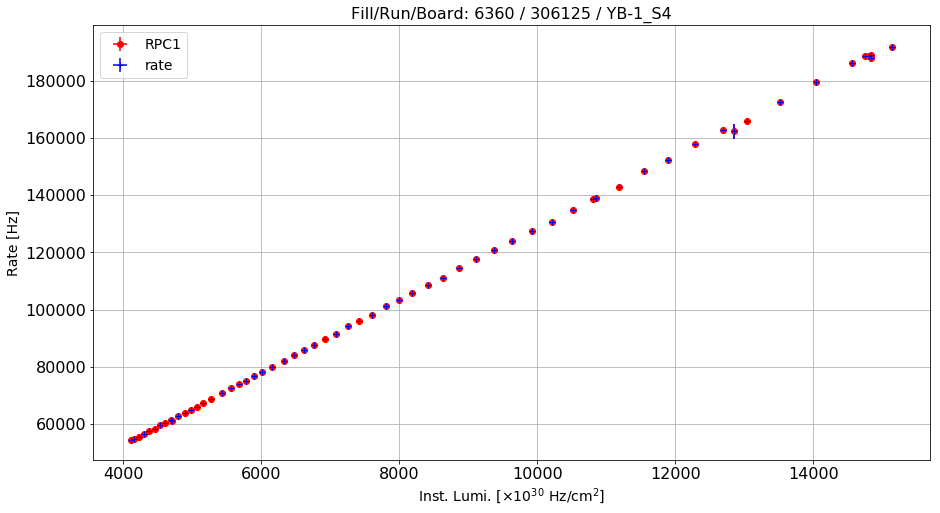

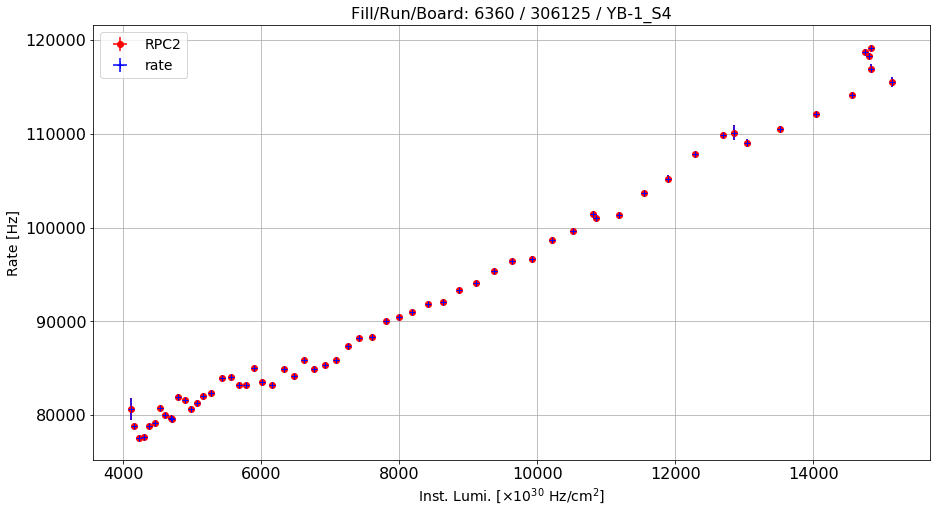

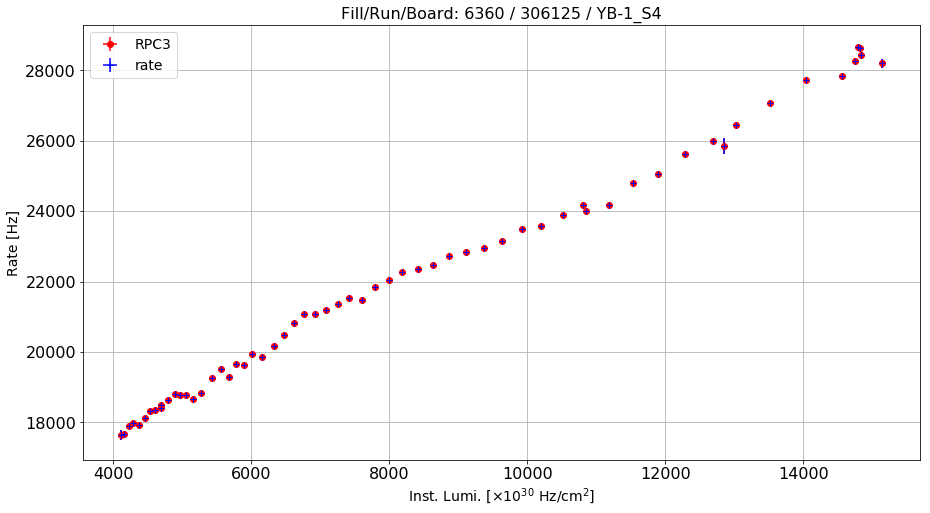

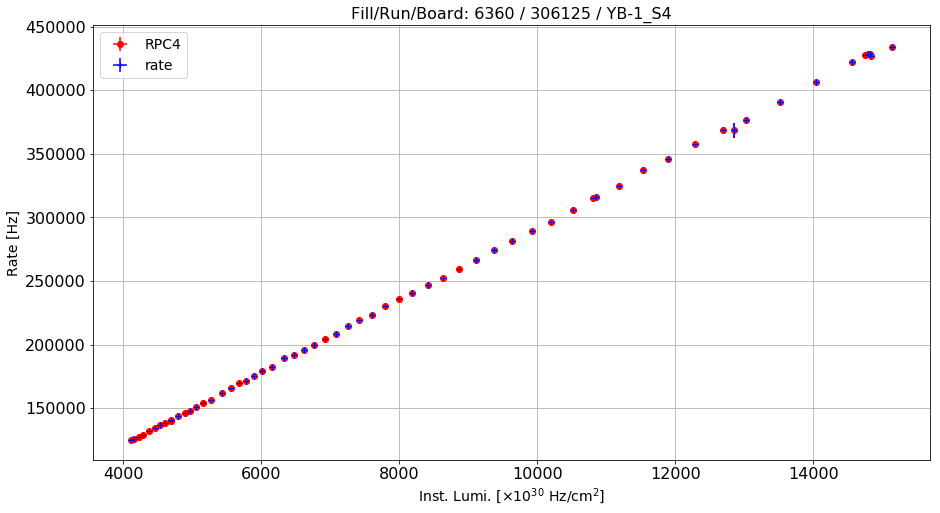

In [161]:
title = "Fill/Run/Board: "+str(int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])+\
" / "+str(boundaries["run"].iloc[3])+" / YB-1_S4"

rule_1 = ((df_rates["wheel"] == -1) & (df_rates["sector"] == 4) & (df_rates["run"] == 306125))
rule_2 = ((df_rates_new_2["wheel"] == -1) & (df_rates_new_2["sector"] == 4)\
          & (df_rates_new_2["run"] == 306125))

temp1 = df_rates[rule_1]
temp2 = df_rates_new_2[rule_2]

plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC1", 0, "errRPC1", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC2", 0, "errRPC2", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC3", 0, "errRPC3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC4", 0, "errRPC4", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")

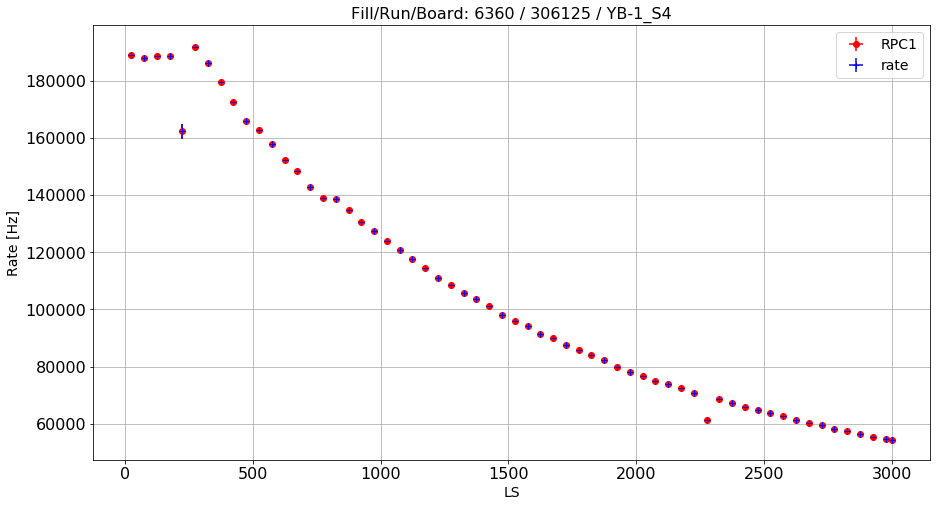

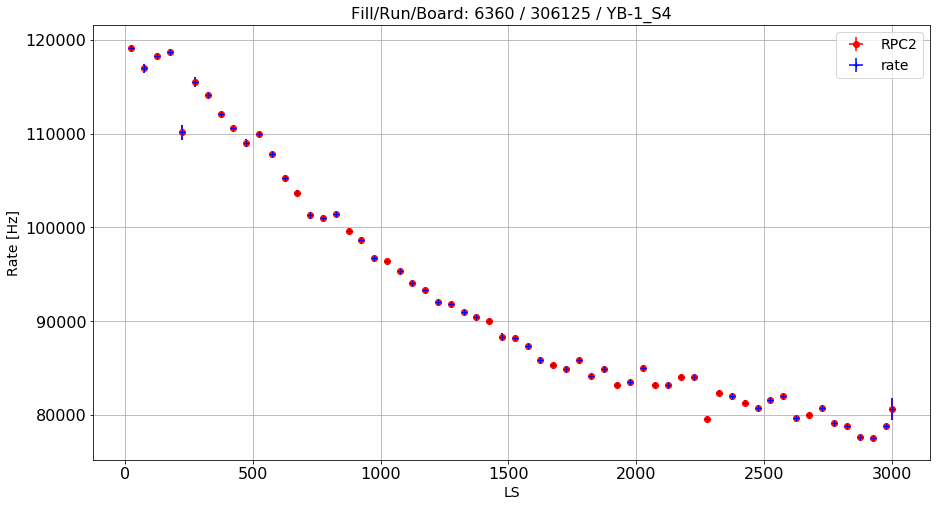

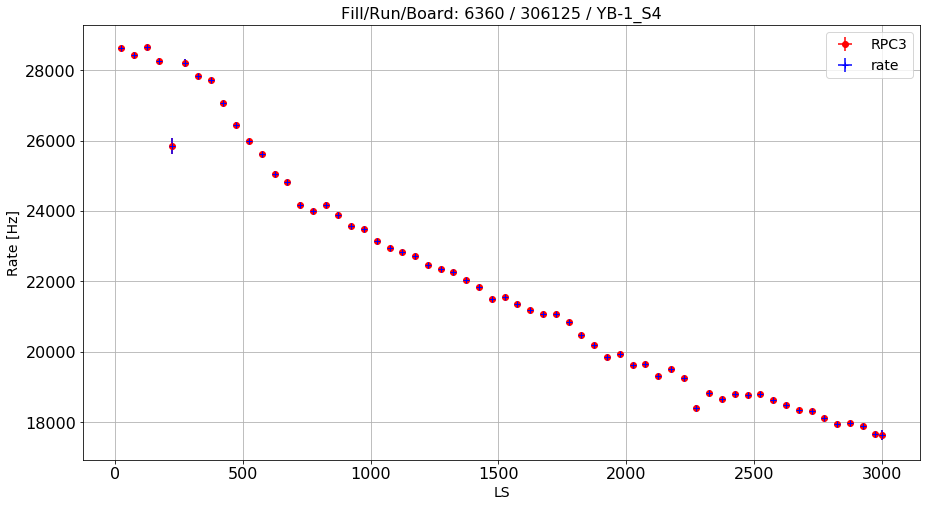

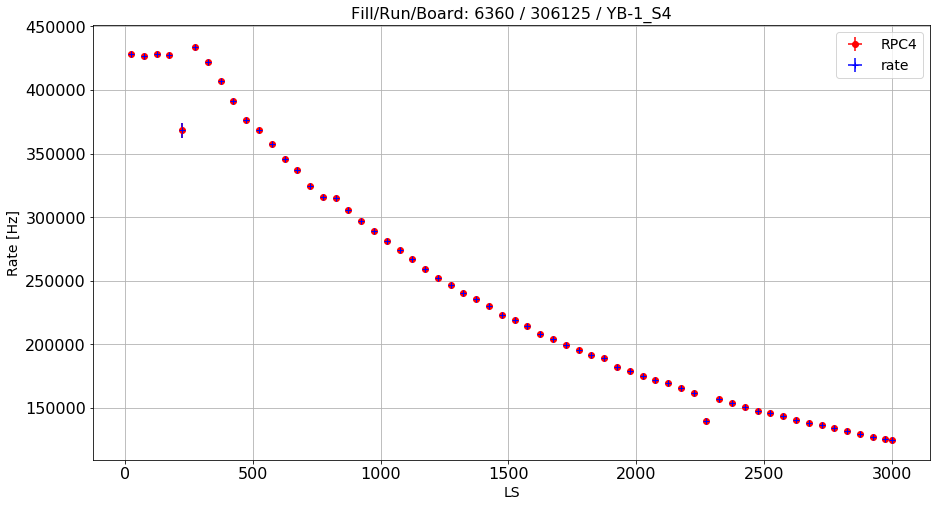

In [162]:
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC1", 0, "errRPC1", "LS", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC2", 0, "errRPC2", "LS", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC3", 0, "errRPC3", "LS", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC4", 0, "errRPC4", "LS", 
                "Rate [Hz]", title, "ro")

Checking cross-sections for some chambers:

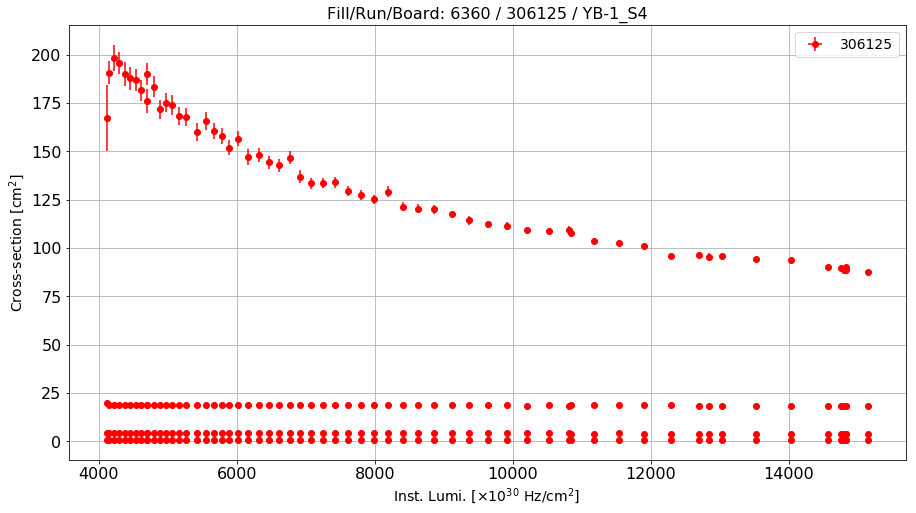

In [163]:
title = "Fill/Run/Board: "+str(int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])+\
" / "+str(boundaries["run"].iloc[3])+" / YB-1_S4"

plot_rate_vs_ls(df_rates_new_2, [306125], "lumi", "CS", "YB-1_S6", 0, "errCS",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Cross-section [cm$^{2}$]", title, ["ro"], False, False)

Defining the fit ranges for all the chambers:

In [190]:
df_rates_new_2["fmin"] = 5000
df_rates_new_2["fmax"] = 15000
df_rates_new_2["slope"] = 9999
df_rates_new_2["inter"] = 9999
df_rates_new_2["err_a"] = 9999
df_rates_new_2["err_b"] = 9999
df_rates_new_2["rate_low"] = df_rates_new_2["rate"].copy()
df_rates_new_2["rate_high"] = df_rates_new_2["rate"].copy()
df_rates_new_2["rate_mid"] = df_rates_new_2["rate"].copy()

In [191]:
def set_range(df, wh, sec, st, fmin, fmax):
    rule = (df_rates_new_2.wheel == wh) &\
           (df_rates_new_2.sector == sec) &\
           (df_rates_new_2.station == st)
    indexes = df[rule].index
    for m in indexes:
        df.loc[m, "fmin"] = fmin
        df.loc[m, "fmax"] = fmax

In [192]:
set_range(df_rates_new_2, -2, 7, 3, 5000, 10000)
set_range(df_rates_new_2, -2, 10, 3, 8000, 15000)
set_range(df_rates_new_2, 0, 3, 2, 5000, 12000)
set_range(df_rates_new_2, 0, 9, 2, 5000, 10000)
set_range(df_rates_new_2, +1, 8, 1, 6000, 15000)
set_range(df_rates_new_2, +1, 8, 3, 5000, 15000)

In [193]:
def plot_scatter_2(df, arg, wheel, norm = False, show = True, fit = False, fmin = 5000, fmax = 15000):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    temp = temp.groupby(['run', 'wheel', 'sector', 'system', 'station'])\
    [[arg]].mean().reset_index()
    #print temp
    
    if fit:
        for j in range(1, 13):
            for k in range(1, 5):
    
                rule = (df.wheel == wheel) & (df.sector == j) & (df.station == k) & (df.system == 1)
                rule2 = (df.lumi > df.fmin) & (df.lumi < df.fmax)
                val1 = df[rule & rule2]["lumi"]
                val2 = df[rule & rule2]["rate"]
                coeff = np.polyfit(val1, val2, 1)
                #print "Linear fit parameters:", wheel, j, k, coeff[0]

                rule = (temp.sector == j) & (temp.station == k) & (temp.system == 1)
                ind = temp[rule].index
                temp.loc[ind[0], arg] = coeff[0]
                #print temp.loc[ind[0]]
    
    mat = []
    for i in [4, 3, 2, 1]:
        rule = (temp.station == i)
        temp2 = temp[rule].sort_values(["sector"], ascending=True)
        vec = list(temp2[arg].values)
        mat.append(vec)      
        #print i, temp[rule][arg].values
    if norm:
        mat = mat/np.matrix(mat).sum()
        mat = [100*i for i in mat]
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4"])
    ax.set_yticks([3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    title = "Wheel: "+wheel_s
    plt.title(title, loc="left")   

    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    if show:
        for i in range(0,4):
            for j in range(0,12):
                if (mat[i][j] == 0):
                    ax.text(j, i, -1,\
                    ha="center", va="center", color="r")
                else:
                    text = ax.text(j, i, round(mat[i][j], 2),\
                    ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    plt.show()

Checking the slope of the rate vs. inst. lumi. for each chamber during the good reference run:

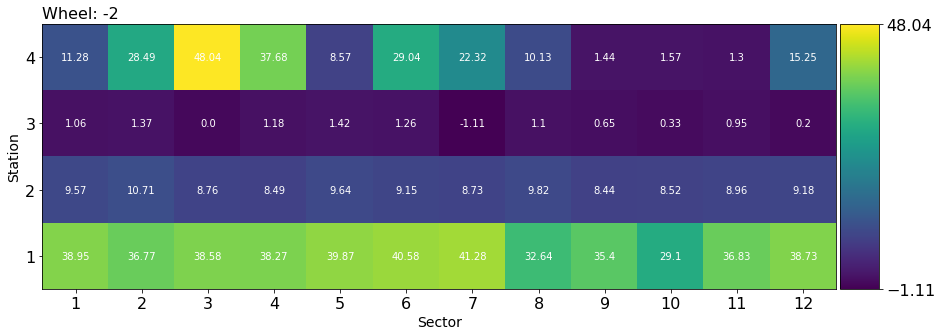

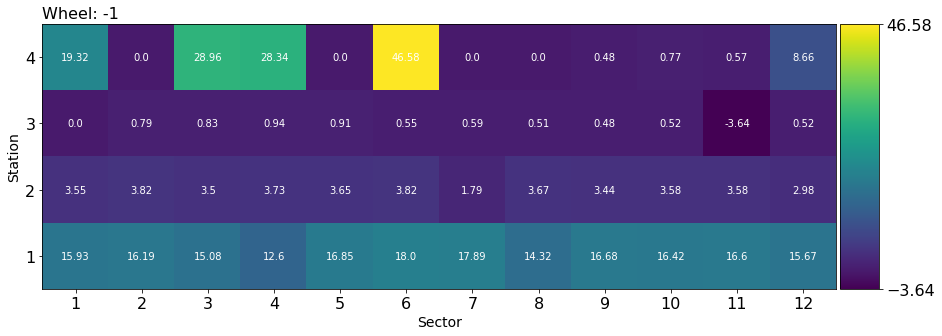

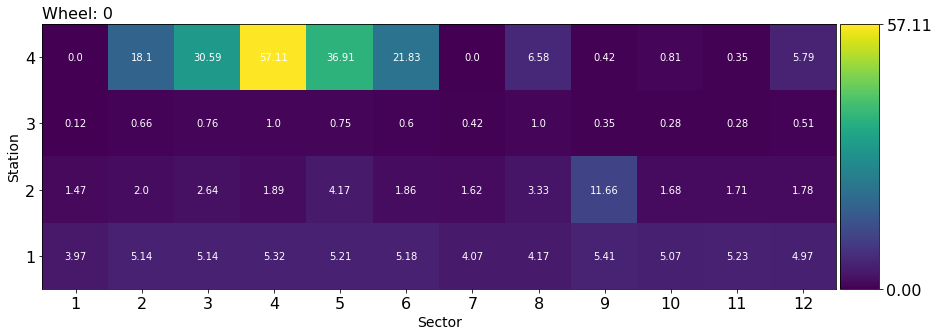

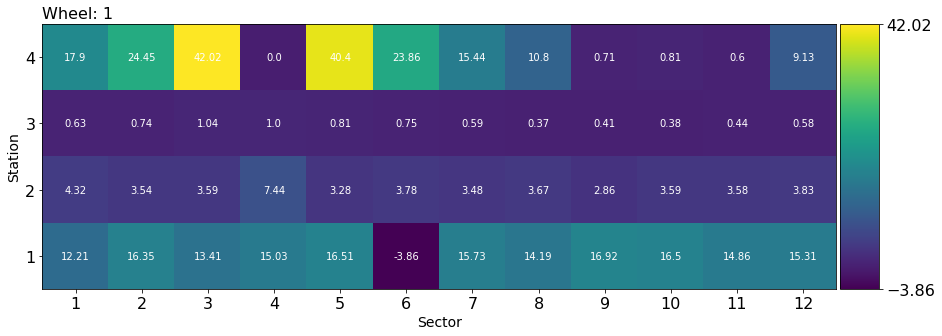

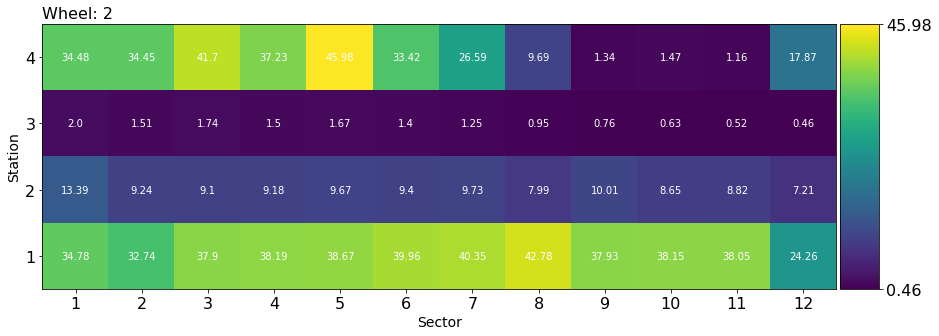

In [194]:
plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", -2, False, True, True)
plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", -1, False, True, True)
plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", 0, False, True, True)
plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", +1, False, True, True)
plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", +2, False, True, True)

Plotting the cross-sections for the good and anomalous runs on the same canvas:

In [195]:
def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log,\
                     fit = False, fmin = 5000, fmax = 15000):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    df_temp["ratio"] = df_temp[y_val]/df_temp[x_val]
    df_temp["errRatio"] = (1/df_temp[x_val])*\
    np.sqrt(df_temp[y_err]**2 + df_temp["errLumi"]**2*df_temp["ratio"]**2)
    inter = []
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        if ((run[i] == 306125) & fit):
            rule2 = (df_temp[x_val] > fmin) & (df_temp[x_val] < fmax)
            val1 = df_temp[rule & rule2][x_val]
            val2 = df_temp[rule & rule2]["ratio"]
            coeff = np.polyfit(val1, val2, 2)
            inter.append(coeff)
            p = np.poly1d(coeff)
            xp = np.linspace(3000, 16000, 1000)
            _ = plt.plot(xp, p(xp), '-')
        
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"], fmt=opt[i], ecolor=newstr, label=str(run[i]))
        
    print "Linear fit for the reference run:", inter[0]
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S1_RB1
Linear fit parameters: [   38.94927231  6835.75861067]
Paramenters uncertainty: [  7.12593311e-02   6.96588050e+02]


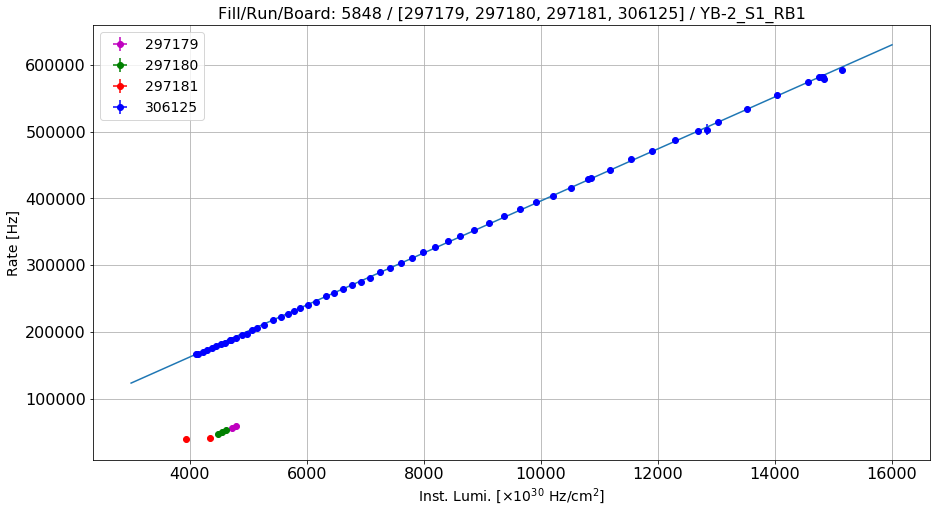

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S1_RB2
Linear fit parameters: [    9.57189766  4418.29297771]
Paramenters uncertainty: [  2.20433871e-02   2.15482797e+02]


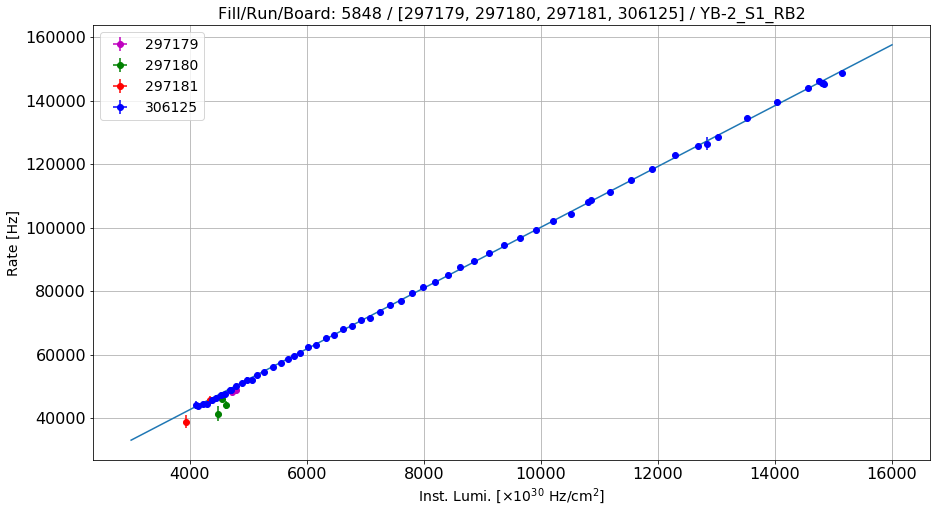

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S1_RB3
Linear fit parameters: [  1.05524570e+00   4.22711923e+03]
Paramenters uncertainty: [  3.35985618e-02   3.28439185e+02]


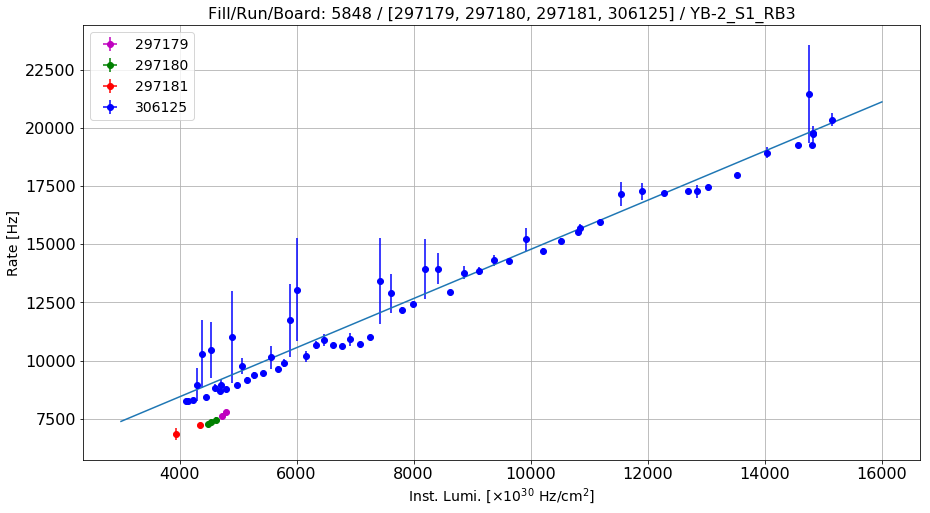

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S1_RB4
Linear fit parameters: [   11.27517294  1713.11402539]
Paramenters uncertainty: [  1.60822860e-02   1.57210684e+02]


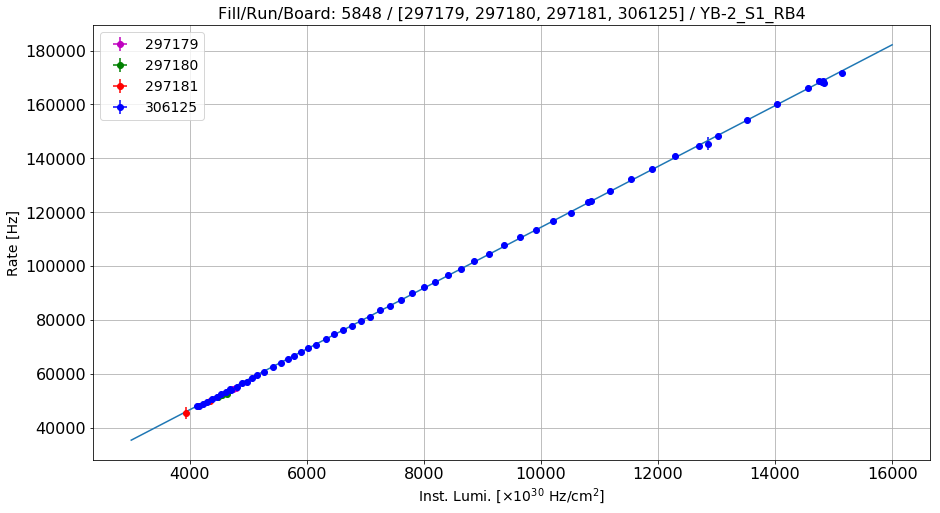

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S2_RB1
Linear fit parameters: [   36.76586466  9310.32522819]
Paramenters uncertainty: [  6.64655579e-02   6.49727028e+02]


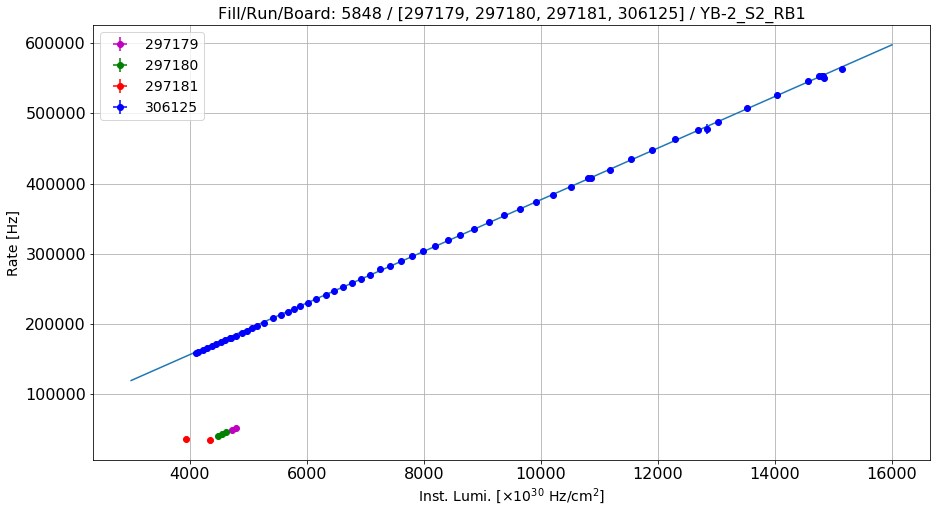

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S2_RB2
Linear fit parameters: [  1.07142682e+01   5.17864634e+04]
Paramenters uncertainty: [  7.61067400e-01   7.43973383e+03]


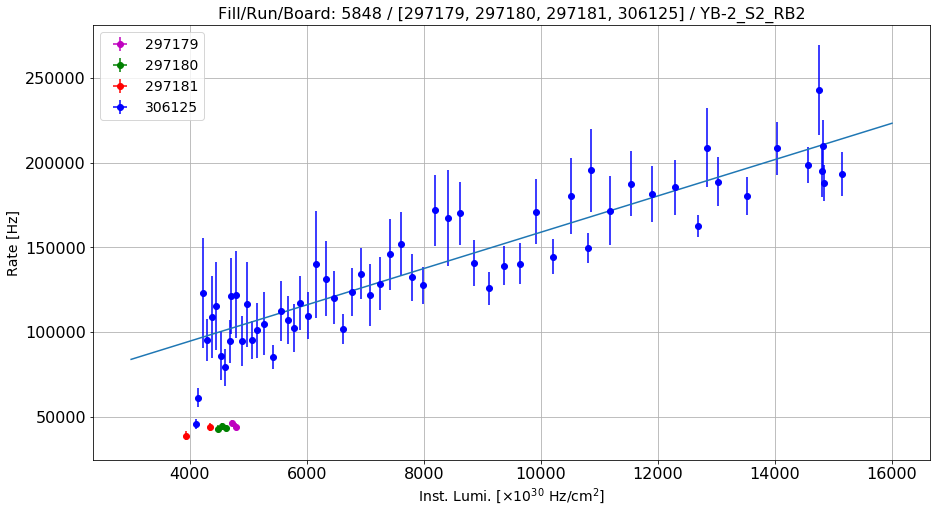

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S2_RB3
Linear fit parameters: [  1.36810744e+00   5.57019931e+03]
Paramenters uncertainty: [  1.05761470e-01   1.03386006e+03]


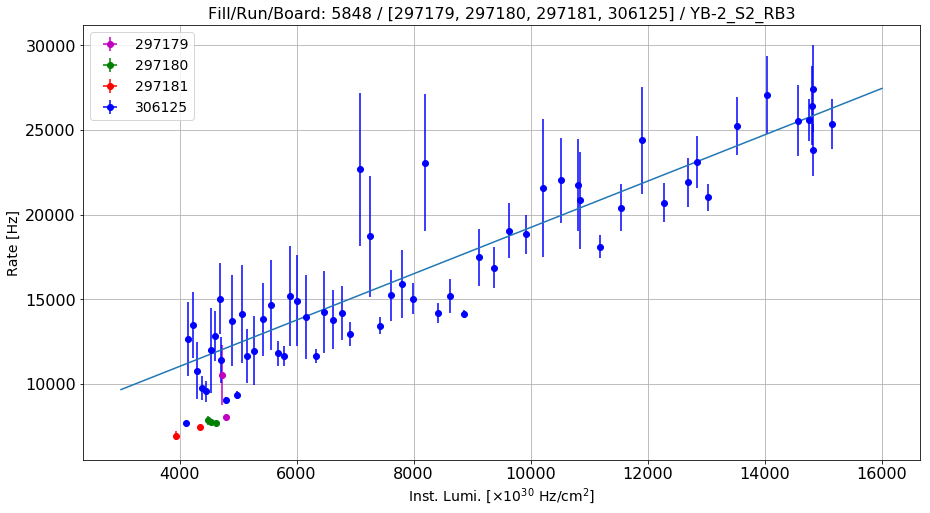

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S2_RB4
Linear fit parameters: [    28.48579174  22176.47122079]
Paramenters uncertainty: [  5.51596719e-02   5.39207535e+02]


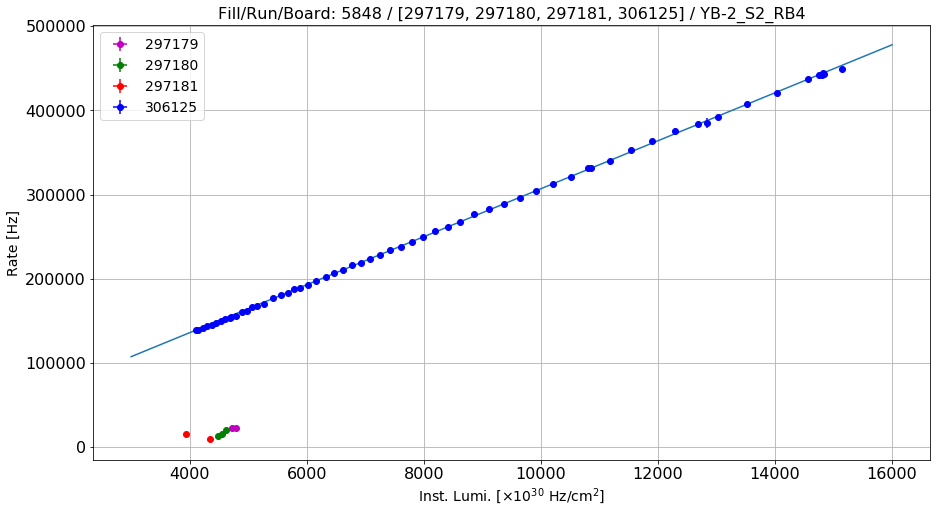

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S3_RB1
Linear fit parameters: [    38.58088964  16061.46598794]
Paramenters uncertainty: [  7.44822888e-02   7.28093732e+02]


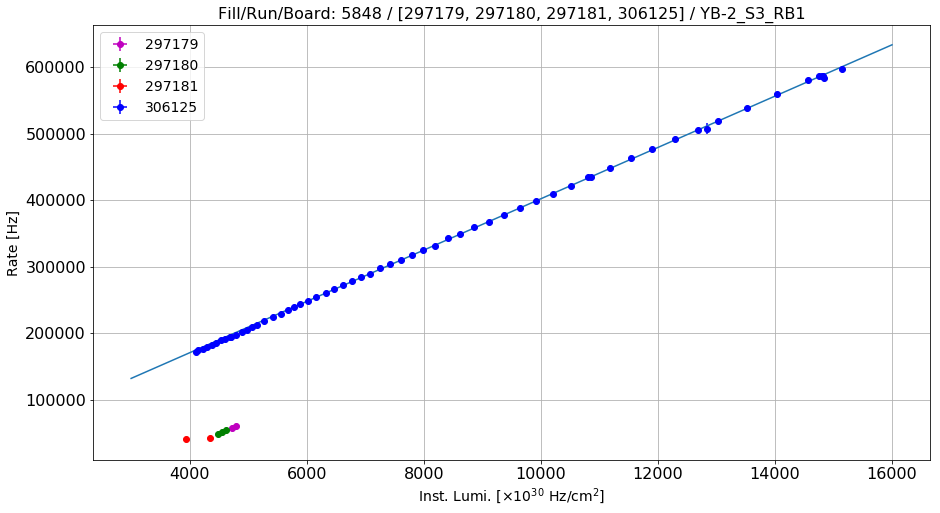

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S3_RB2
Linear fit parameters: [    8.75705772  4901.42516788]
Paramenters uncertainty: [  2.04643782e-02   2.00047363e+02]


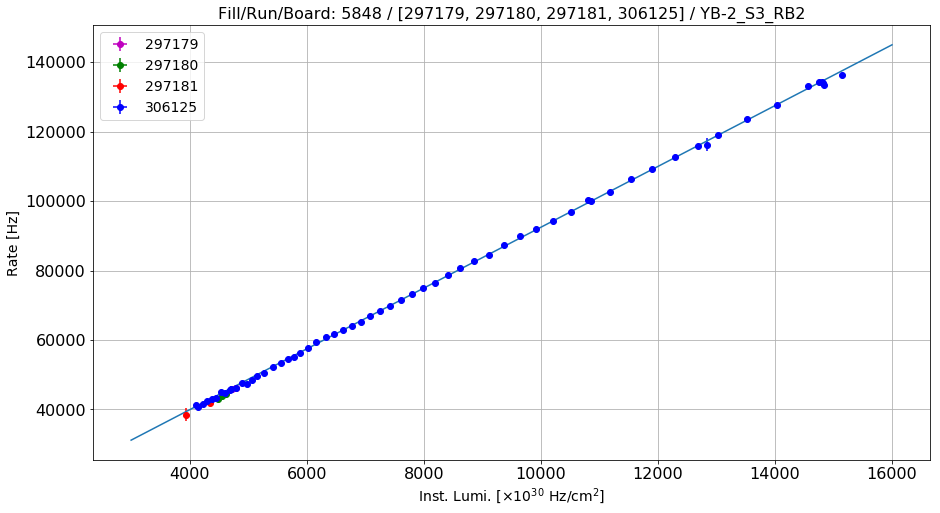

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S3_RB3
Linear fit parameters: [  1.42839792e-04   9.04305059e-01]
Paramenters uncertainty: [  7.07943304e-05   6.92042485e-01]


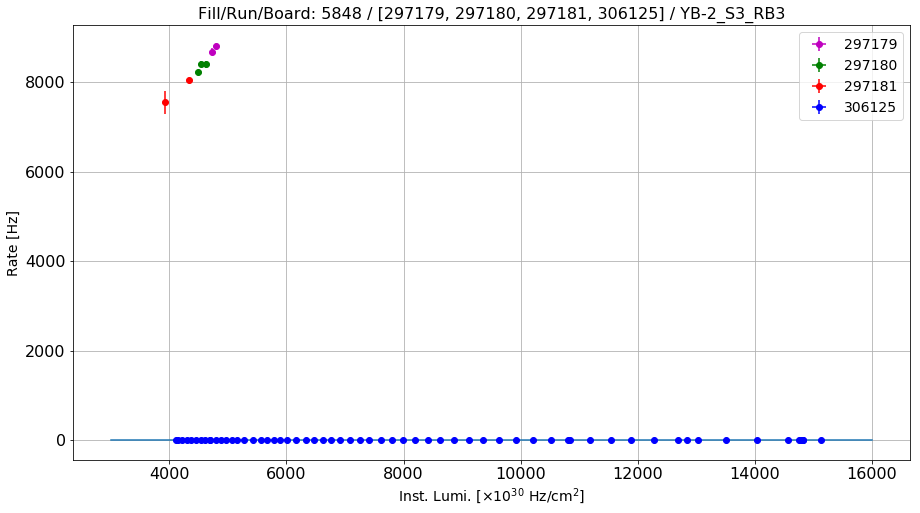

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S3_RB4
Linear fit parameters: [    48.0382537   39147.35482777]
Paramenters uncertainty: [  1.00398931e-01   9.81439125e+02]


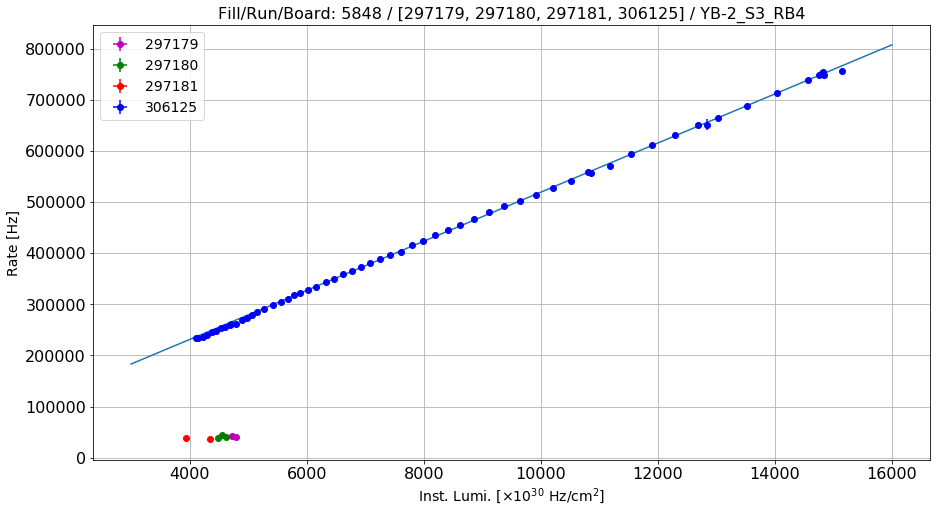

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S4_RB1
Linear fit parameters: [  3.82707591e+01   7.67607756e+04]
Paramenters uncertainty: [  4.80510384e-01   4.69717841e+03]


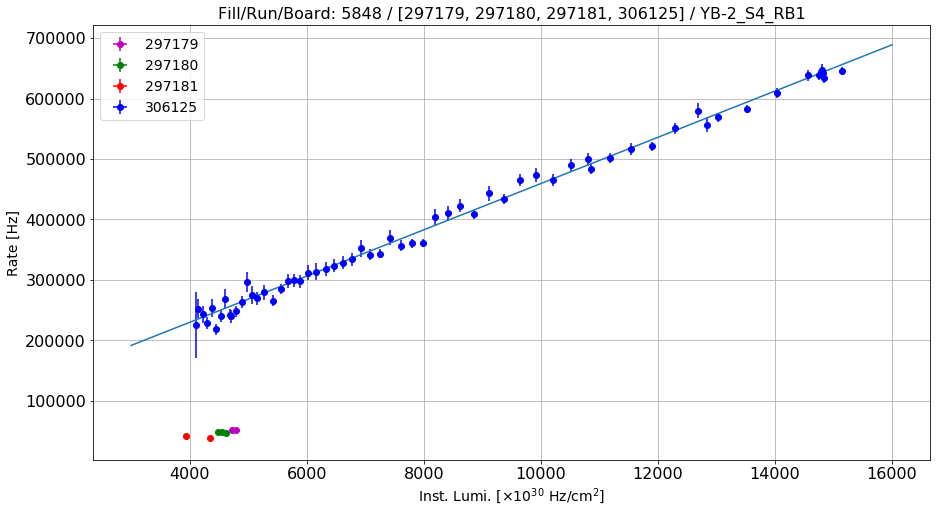

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S4_RB2
Linear fit parameters: [    8.48587678  4608.03692488]
Paramenters uncertainty: [  1.82944597e-02   1.78835555e+02]


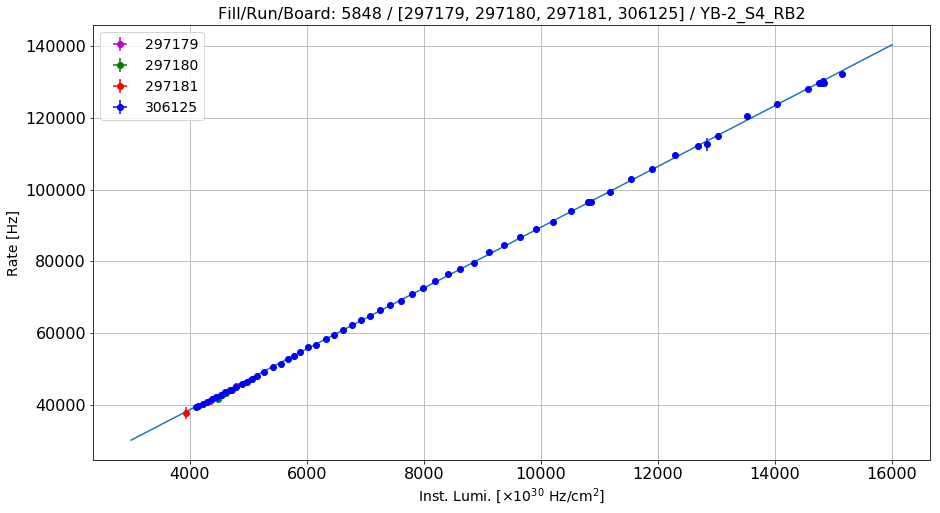

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S4_RB3
Linear fit parameters: [  1.17865947e+00   4.21161171e+03]
Paramenters uncertainty: [  1.03057943e-02   1.00743202e+02]


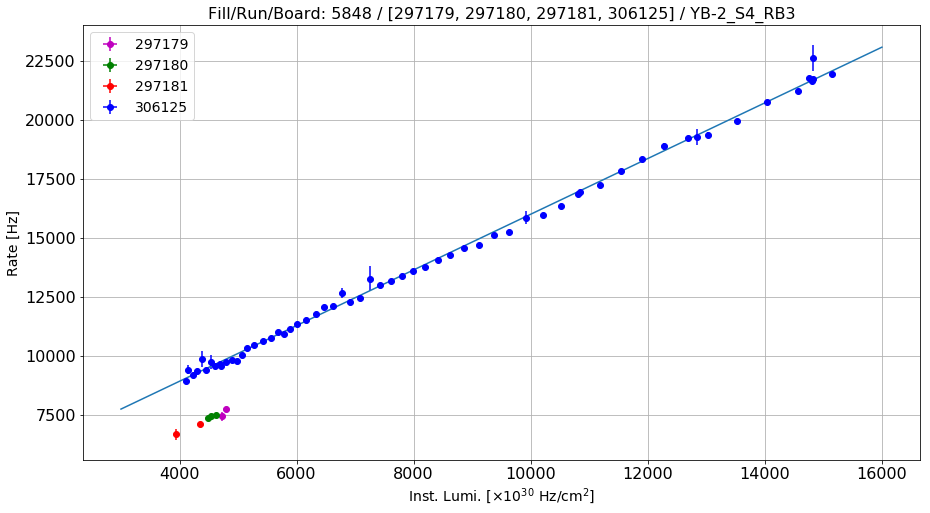

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S4_RB4
Linear fit parameters: [   37.67545052  8687.54679897]
Paramenters uncertainty: [  5.97512030e-02   5.84091562e+02]


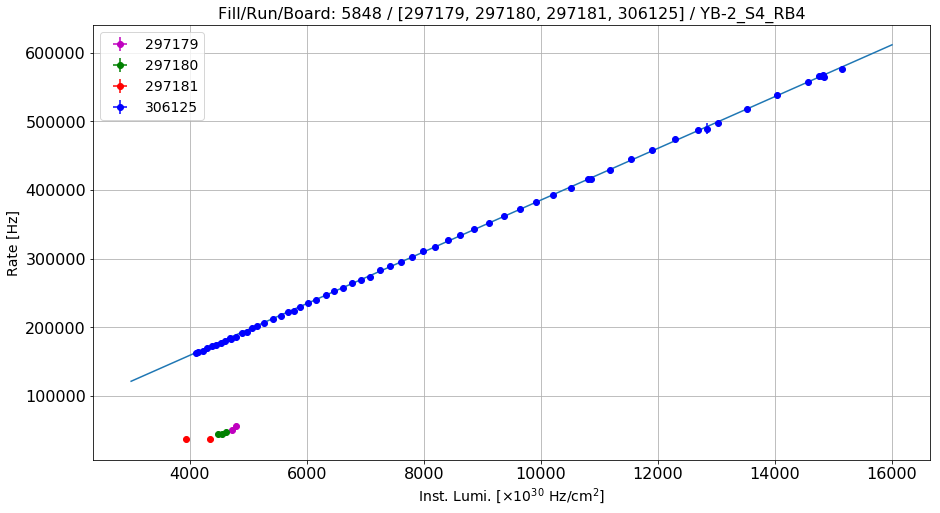

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S5_RB1
Linear fit parameters: [    39.8717285   12651.01784229]
Paramenters uncertainty: [  8.74729111e-02   8.55082186e+02]


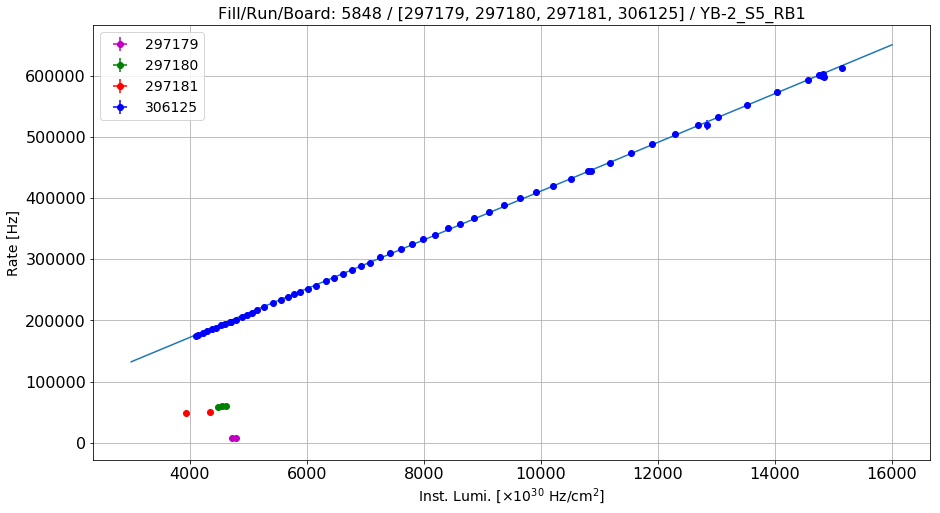

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S5_RB2
Linear fit parameters: [    9.64136739  3679.56233402]
Paramenters uncertainty: [  2.15572898e-02   2.10731005e+02]


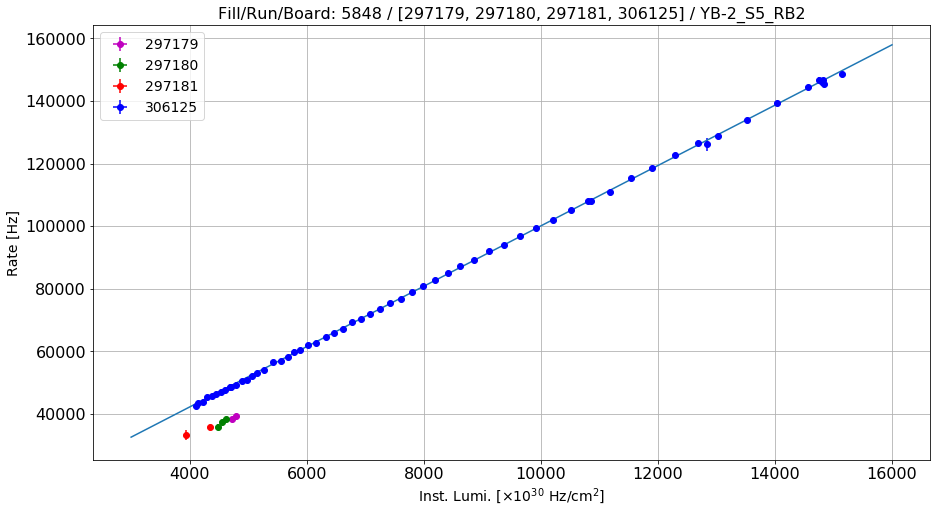

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S5_RB3
Linear fit parameters: [  1.42288973e+00   5.54627916e+03]
Paramenters uncertainty: [  1.19957081e-02   1.17262775e+02]


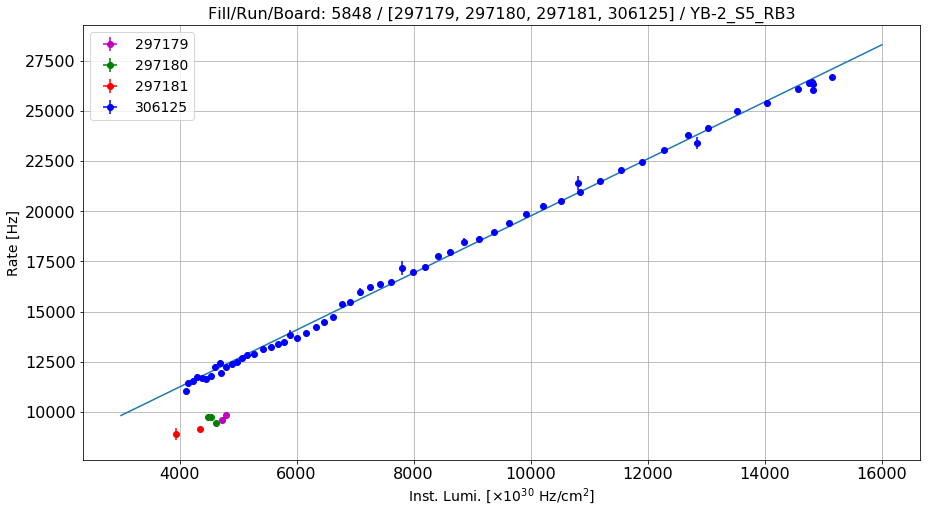

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S5_RB4
Linear fit parameters: [  8.57488392e+00   4.13917498e+04]
Paramenters uncertainty: [  2.25488632e-01   2.20424026e+03]


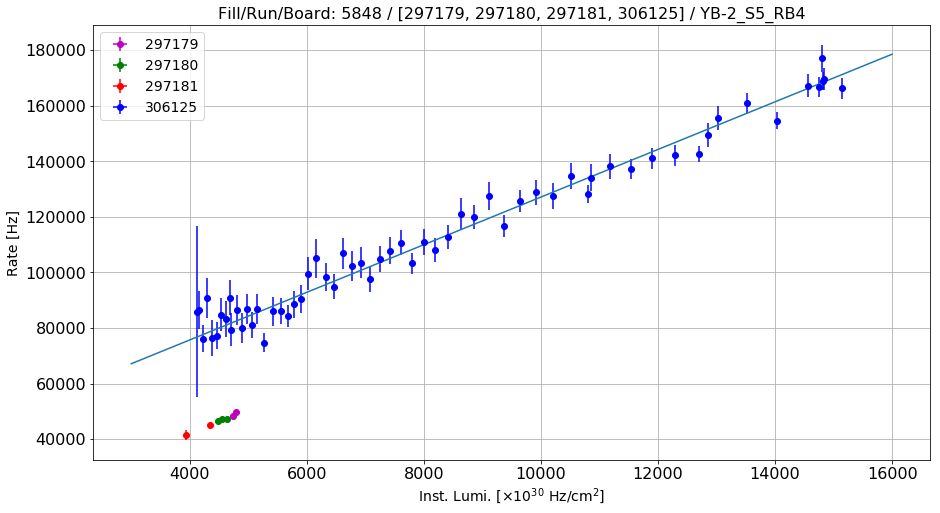

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S6_RB1
Linear fit parameters: [   40.58087687  9082.58300298]
Paramenters uncertainty: [  7.36341029e-02   7.19802381e+02]


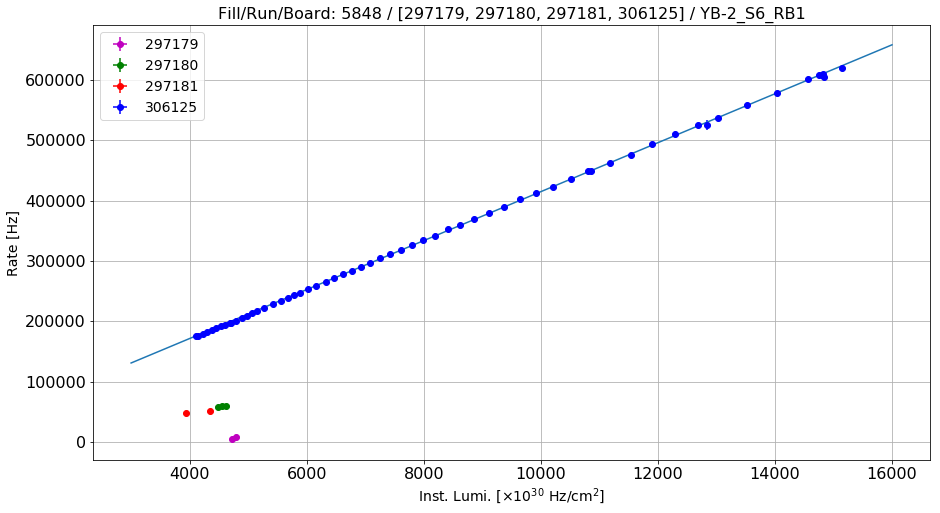

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S6_RB2
Linear fit parameters: [    9.15444769  4811.50285218]
Paramenters uncertainty: [  2.32797924e-02   2.27569146e+02]


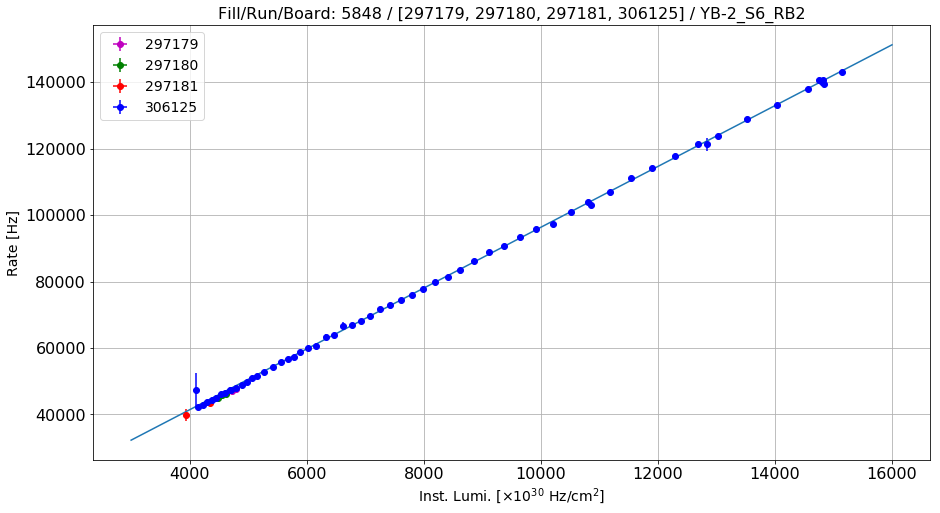

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S6_RB3
Linear fit parameters: [  1.26436647e+00   1.98466050e+03]
Paramenters uncertainty: [  2.71974361e-02   2.65865658e+02]


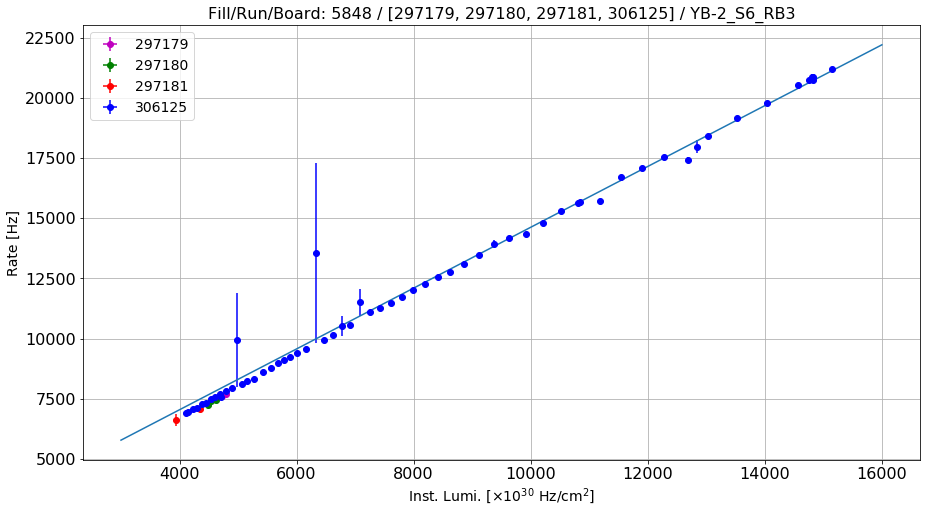

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S6_RB4
Linear fit parameters: [  2.90377981e+01   3.05187613e+04]
Paramenters uncertainty: [  4.38315374e-01   4.28470556e+03]


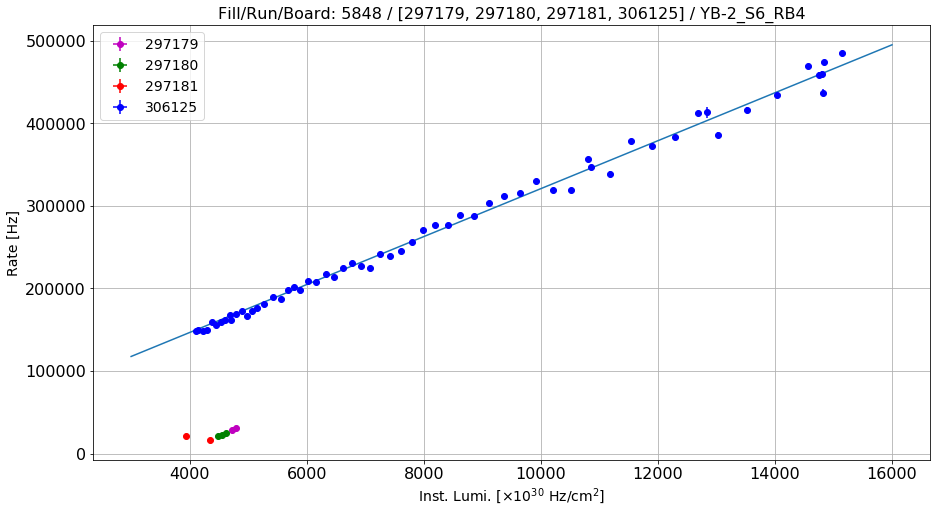

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S7_RB1
Linear fit parameters: [    41.28306707  10425.91194225]
Paramenters uncertainty: [  7.80071904e-01   7.62551035e+03]


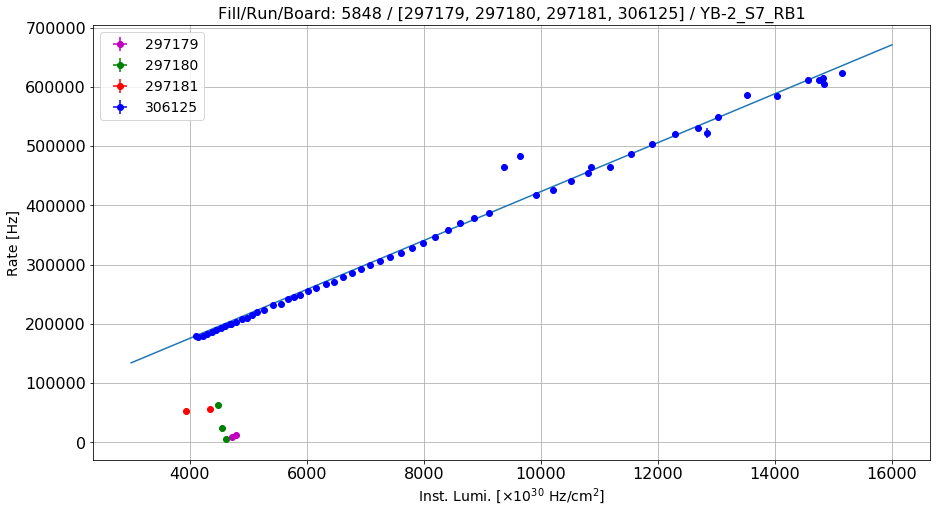

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S7_RB2
Linear fit parameters: [    8.73477253  5928.31343291]
Paramenters uncertainty: [  1.99038896e-02   1.94568366e+02]


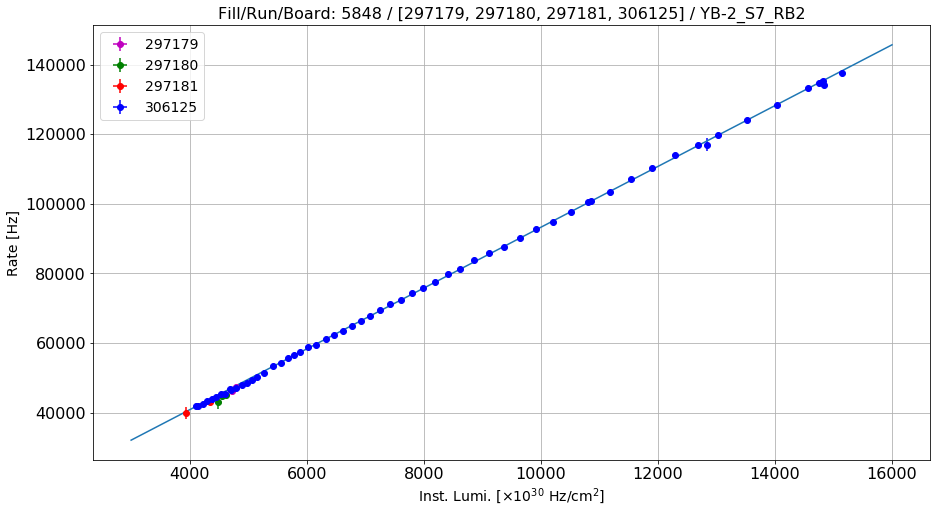

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S7_RB3
Linear fit parameters: [ -1.11421032e+00   2.64227763e+04]
Paramenters uncertainty: [  1.13798727e+00   8.25854588e+03]


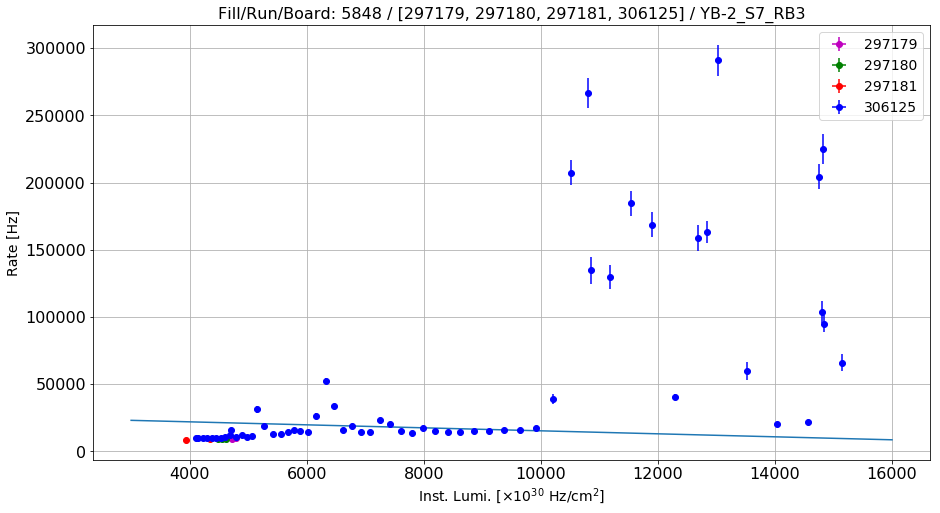

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S7_RB4
Linear fit parameters: [   22.31771893  3947.90520237]
Paramenters uncertainty: [  3.12698591e-02   3.05675198e+02]


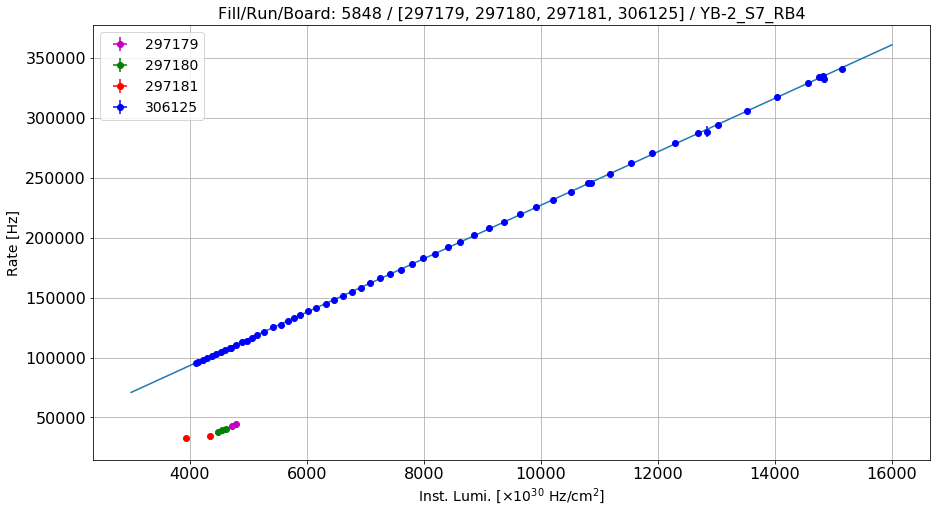

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S8_RB1
Linear fit parameters: [    32.63886933  16036.54515046]
Paramenters uncertainty: [  1.74881674e-01   1.70953730e+03]


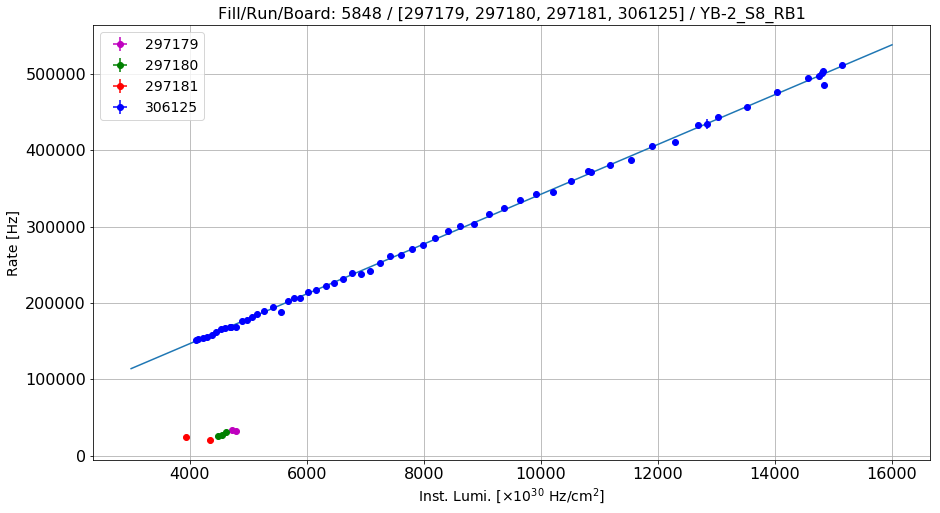

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S8_RB2
Linear fit parameters: [    9.82134236  8107.75789801]
Paramenters uncertainty: [  2.35446211e-02   2.30157952e+02]


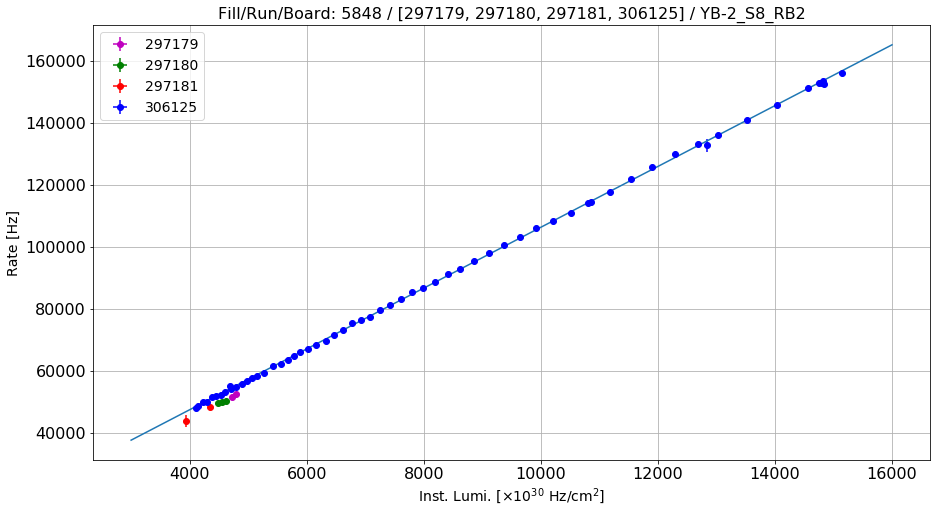

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S8_RB3
Linear fit parameters: [  1.10189462e+00   4.59249817e+03]
Paramenters uncertainty: [  3.11036391e-02   3.04050333e+02]


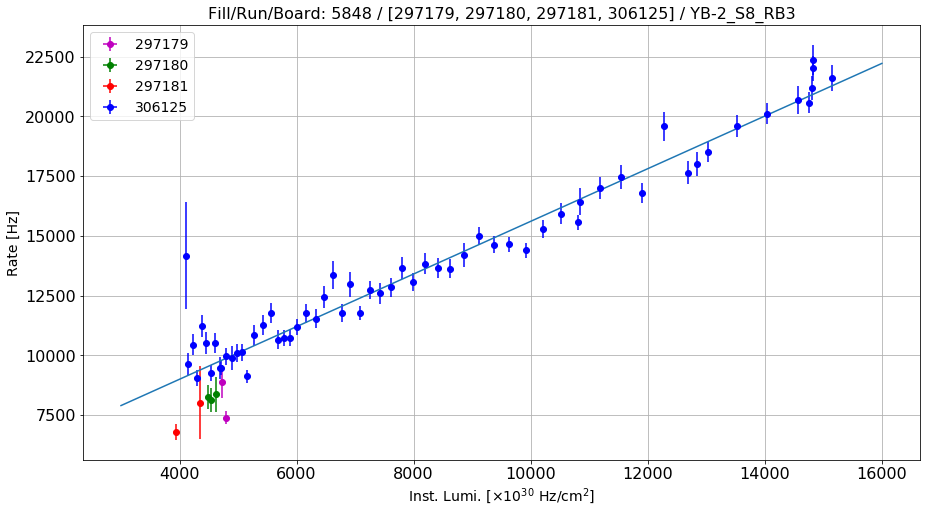

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S8_RB4
Linear fit parameters: [   10.13491292  4578.81750179]
Paramenters uncertainty: [  1.36718845e-02   1.33648060e+02]


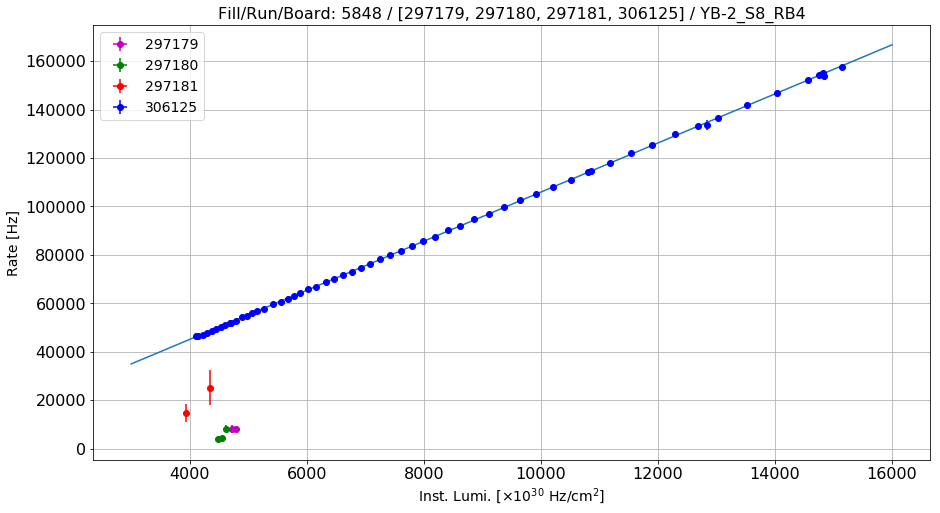

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S9_RB1
Linear fit parameters: [    35.39643108  34482.69934599]
Paramenters uncertainty: [  5.59809001e-01   5.47235365e+03]


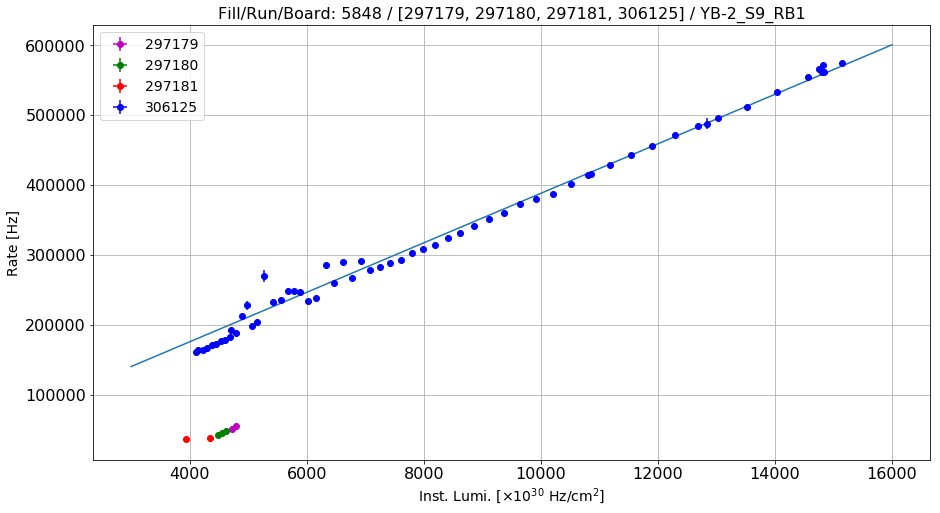

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S9_RB2
Linear fit parameters: [    8.44300869  3445.30298969]
Paramenters uncertainty: [  3.14226426e-02   3.07168718e+02]


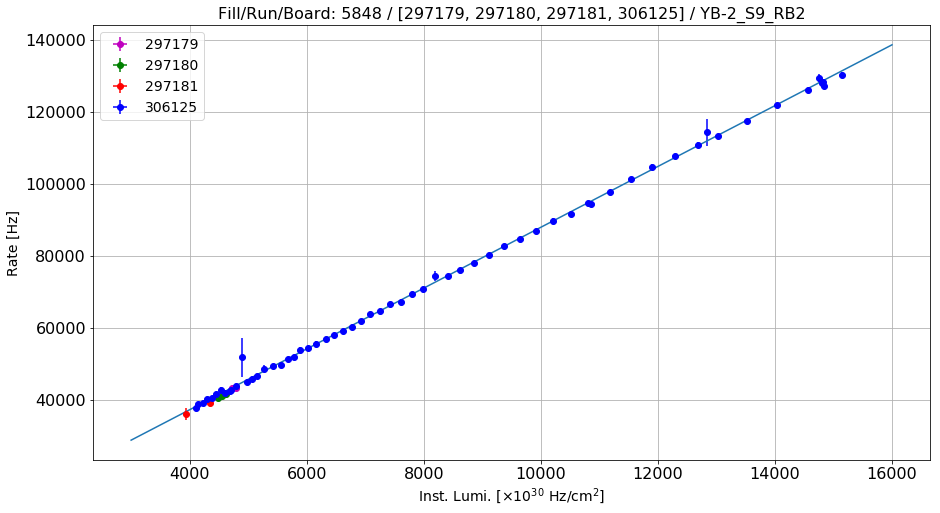

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S9_RB3
Linear fit parameters: [  6.54519139e-01   2.41902626e+03]
Paramenters uncertainty: [  3.51392243e-03   3.43499769e+01]


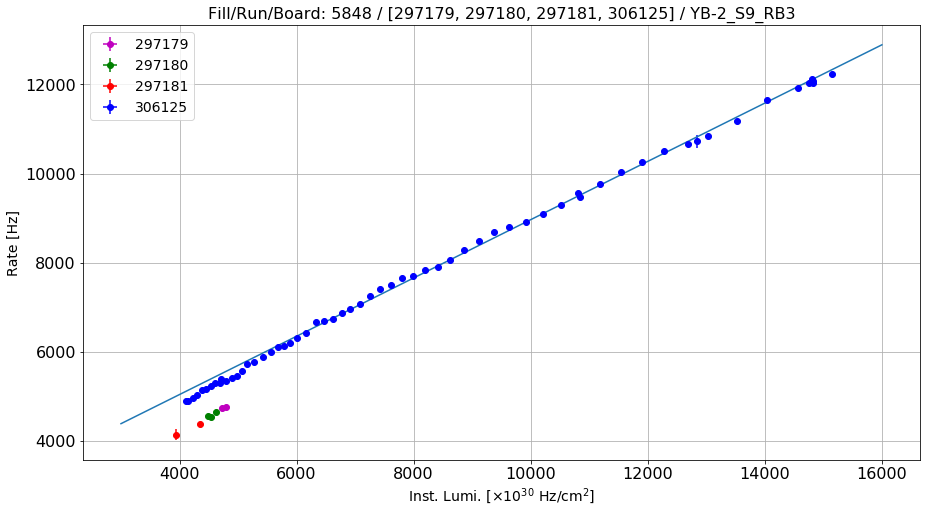

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S9_RB4
Linear fit parameters: [  1.44193915e+00   2.78165794e+03]
Paramenters uncertainty: [  1.02485832e-02   1.00183940e+02]


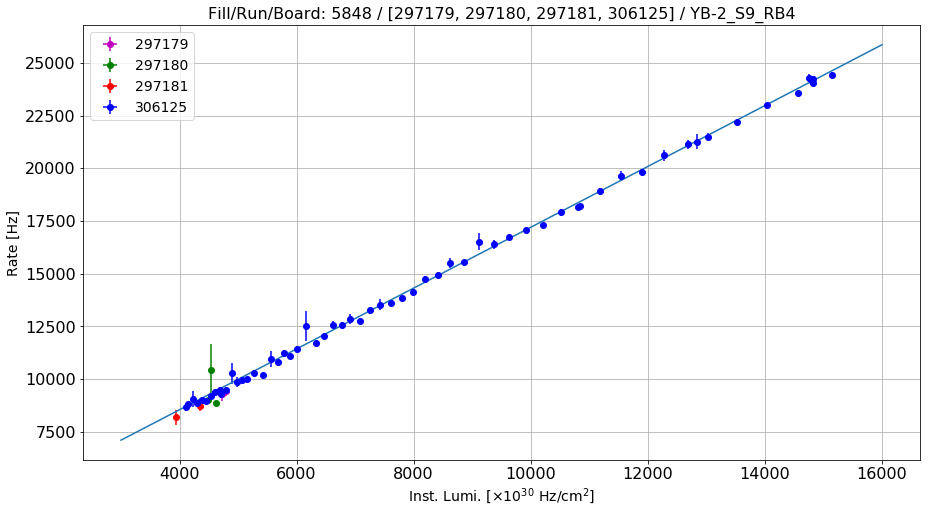

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S10_RB1
Linear fit parameters: [   29.10090661  7146.47656829]
Paramenters uncertainty: [  5.25170194e-02   5.13374566e+02]


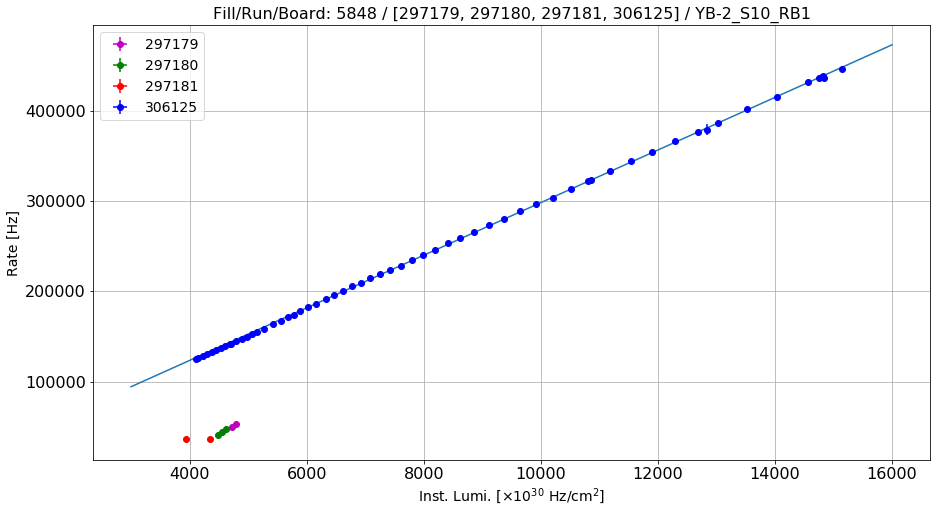

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S10_RB2
Linear fit parameters: [    8.52102254  5573.29504016]
Paramenters uncertainty: [  6.84771166e-02   6.69390807e+02]


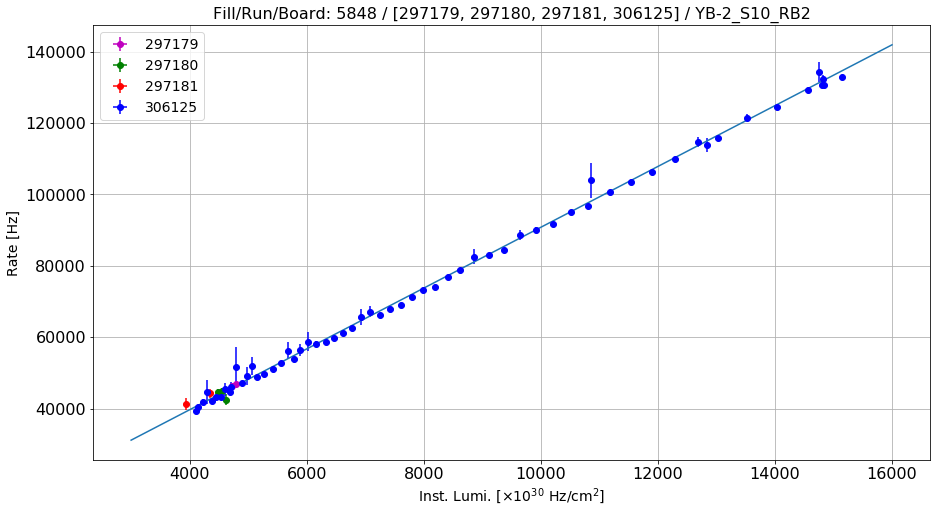

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S10_RB3
Linear fit parameters: [  3.27020327e-01   3.78659323e+03]
Paramenters uncertainty: [  7.57508107e-02   8.93414512e+02]


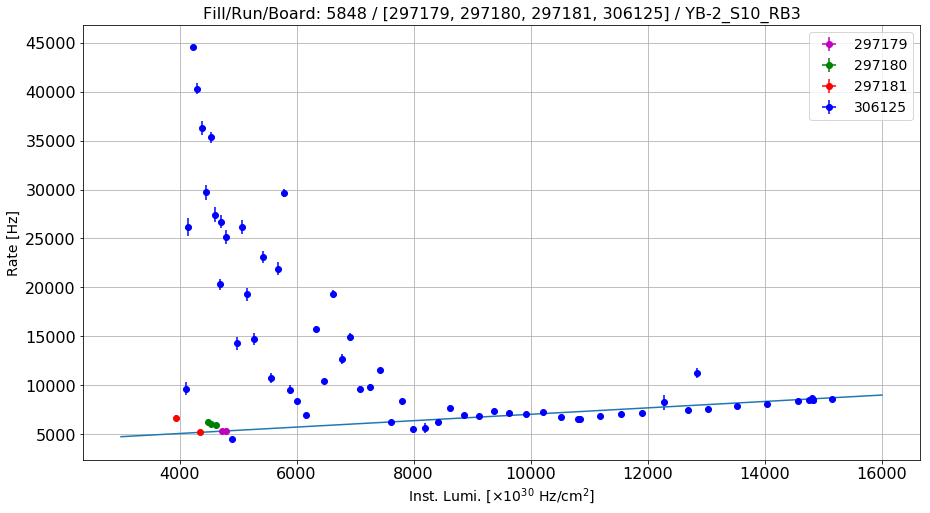

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S10_RB4
Linear fit parameters: [  1.57329941e+00   3.15881693e+03]
Paramenters uncertainty: [  9.86747308e-03   9.64584389e+01]


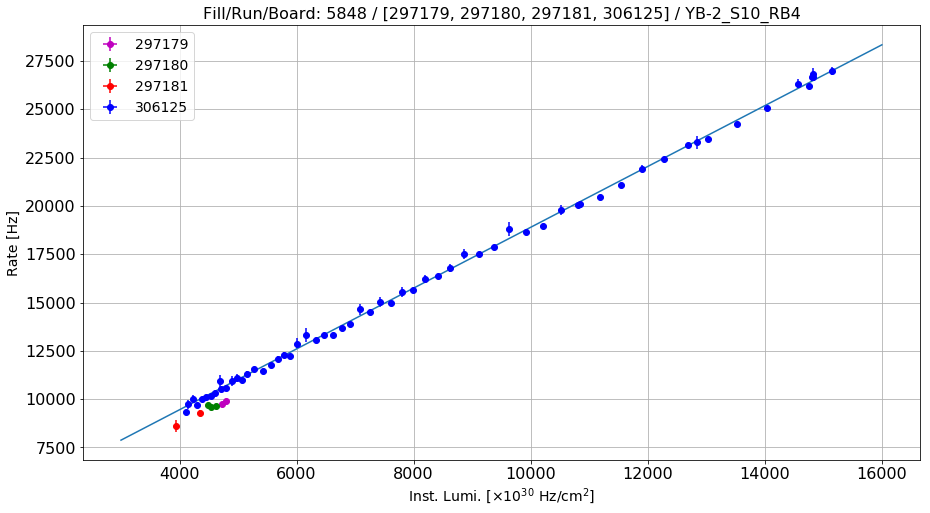

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S11_RB1
Linear fit parameters: [    36.82742546  11089.15035605]
Paramenters uncertainty: [  1.12047470e-01   1.09530819e+03]


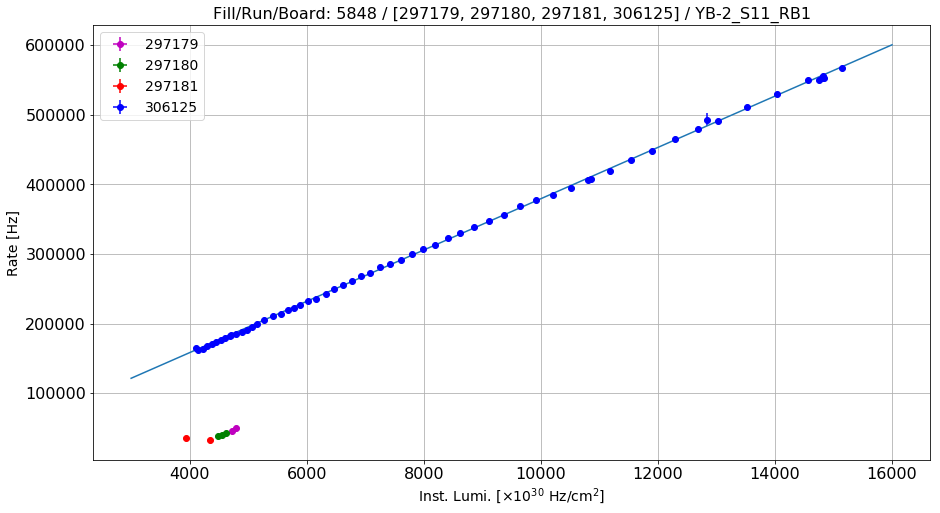

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S11_RB2
Linear fit parameters: [    8.95848647  5518.27623821]
Paramenters uncertainty: [  1.47176918e-02   1.43871239e+02]


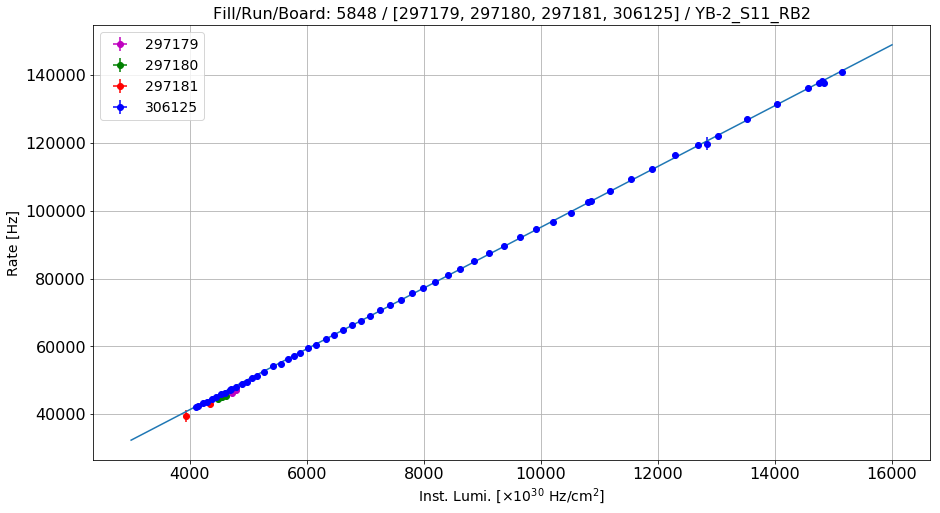

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S11_RB3
Linear fit parameters: [  9.53199719e-01   2.11109291e+04]
Paramenters uncertainty: [  4.92208608e-01   4.81153316e+03]


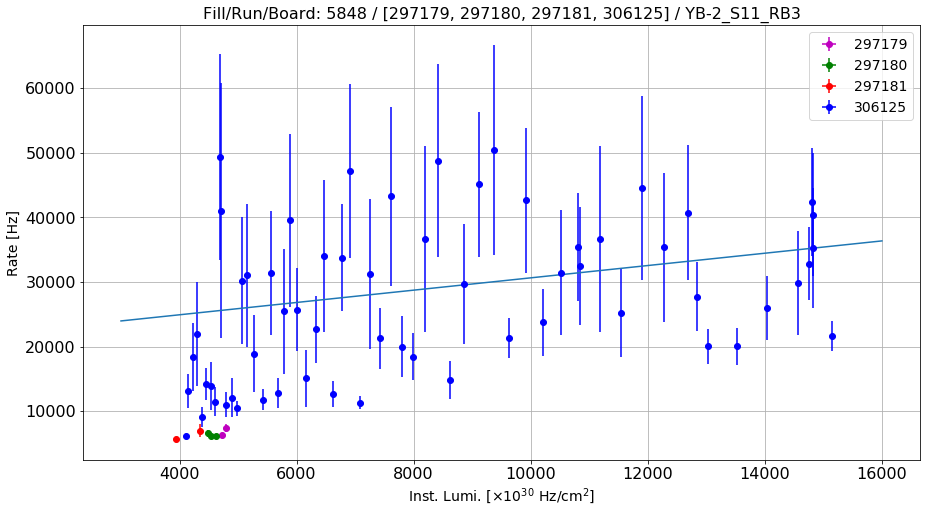

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S11_RB4
Linear fit parameters: [    1.29619647  1192.70743248]
Paramenters uncertainty: [  7.24783176e-03   7.08504124e+01]


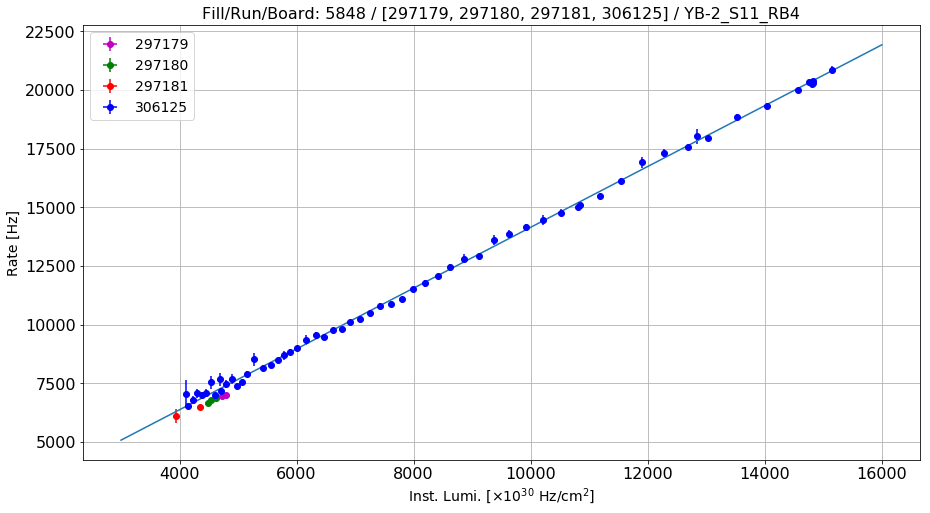

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S12_RB1
Linear fit parameters: [    38.72824527  29498.37804306]
Paramenters uncertainty: [  1.33530530e-01   1.30531357e+03]


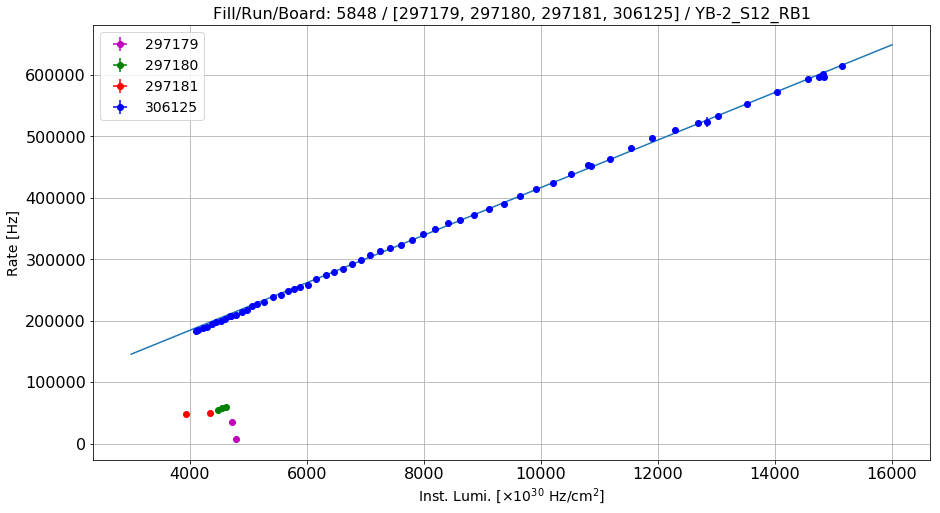

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S12_RB2
Linear fit parameters: [    9.17894099  4009.61386024]
Paramenters uncertainty: [  1.38485250e-02   1.35374791e+02]


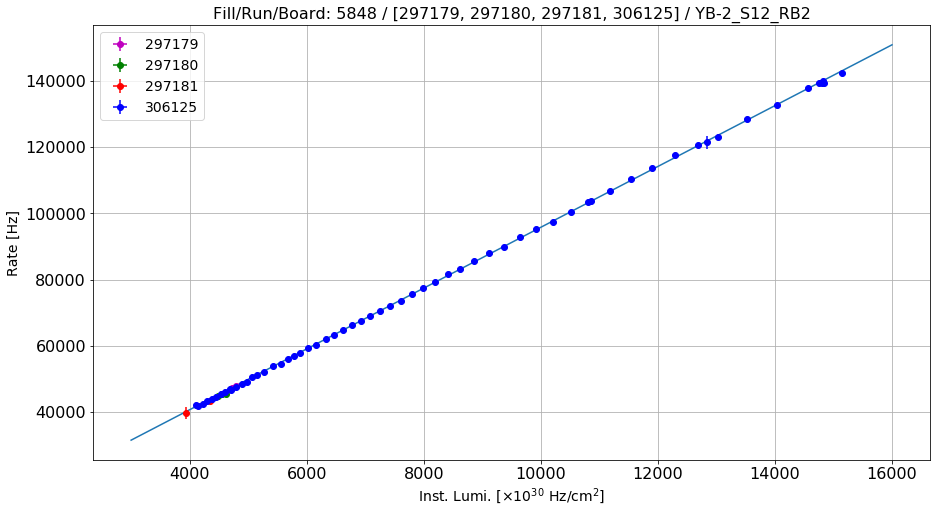

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S12_RB3
Linear fit parameters: [  2.02347281e-01   2.40729204e+03]
Paramenters uncertainty: [  3.96049652e-03   3.87154146e+01]


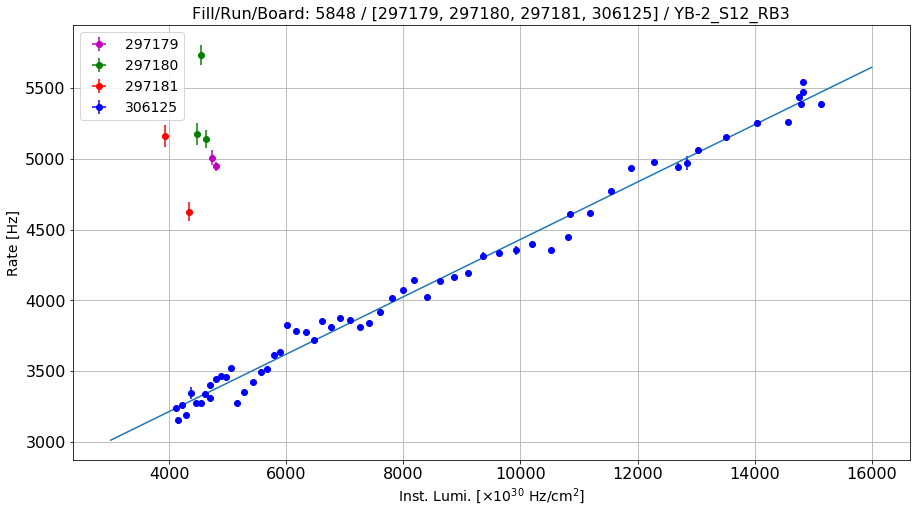

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-2_S12_RB4
Linear fit parameters: [   15.25295021  5246.01987324]
Paramenters uncertainty: [  1.93421624e-02   1.89077261e+02]


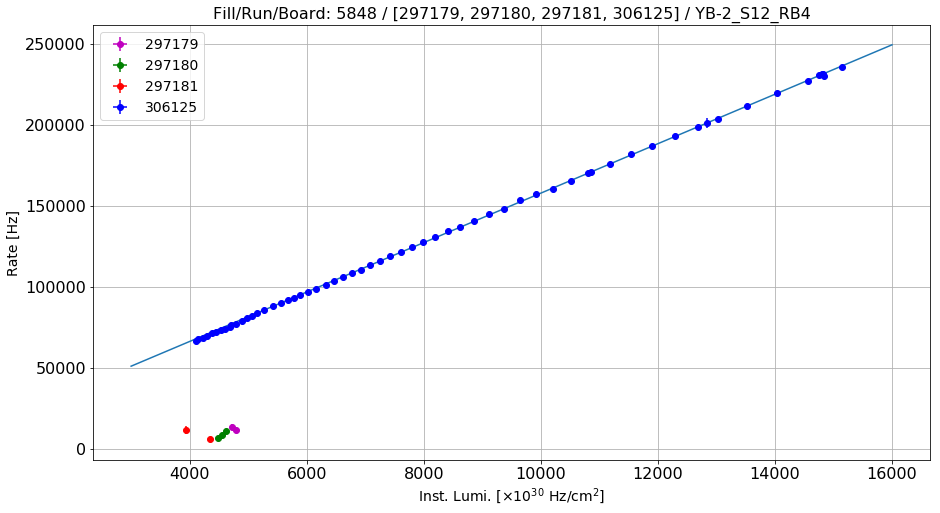

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S1_RB1
Linear fit parameters: [   15.929304    2499.88427102]
Paramenters uncertainty: [  2.94941050e-02   2.88316502e+02]


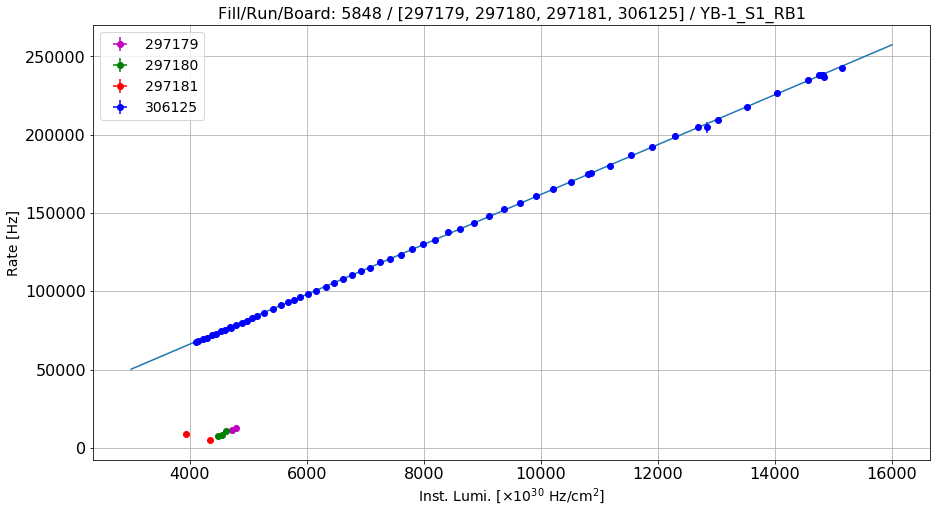

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S1_RB2
Linear fit parameters: [    3.54698536  3310.27077982]
Paramenters uncertainty: [  2.13105516e-02   2.08319042e+02]


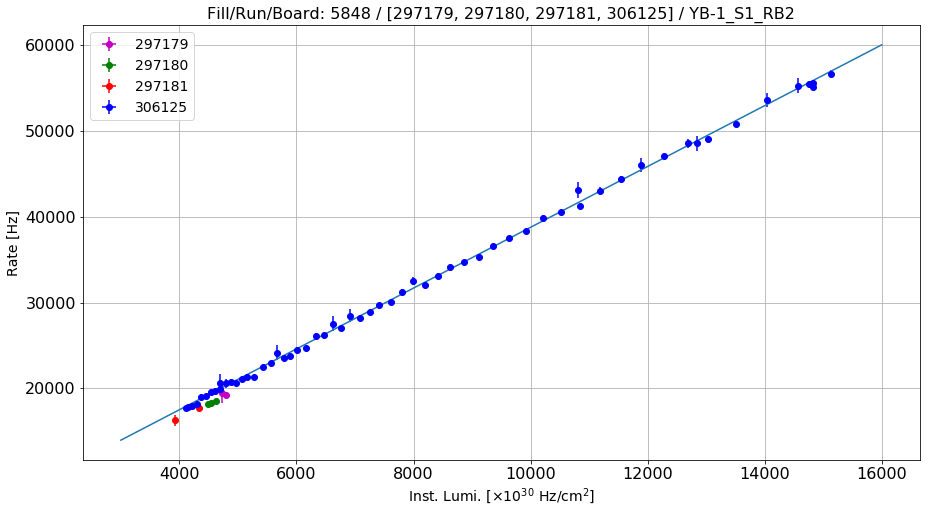

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S1_RB3
Linear fit parameters: [  4.21183511e-04   8.59423558e-01]
Paramenters uncertainty: [  1.38137257e-04   1.35034614e+00]


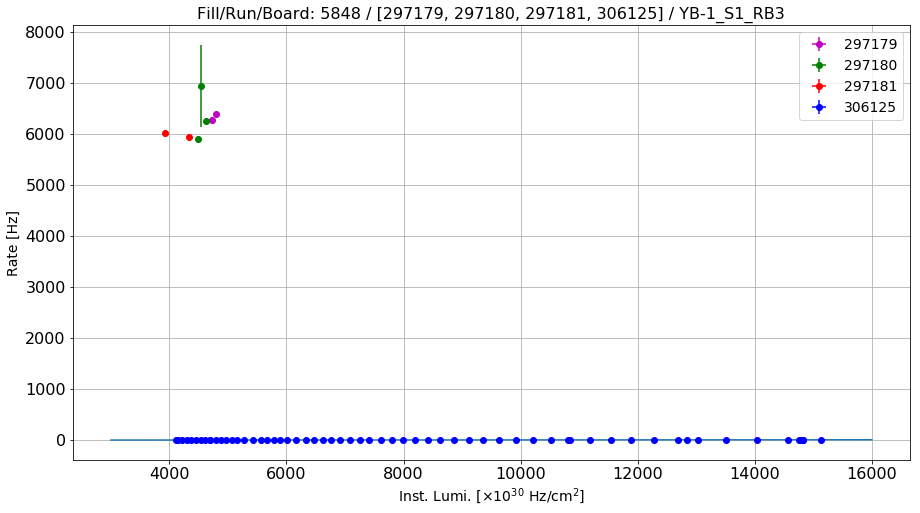

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S1_RB4
Linear fit parameters: [  1.93188523e+01   1.93949809e+04]
Paramenters uncertainty: [  1.89675089e-01   1.85414876e+03]


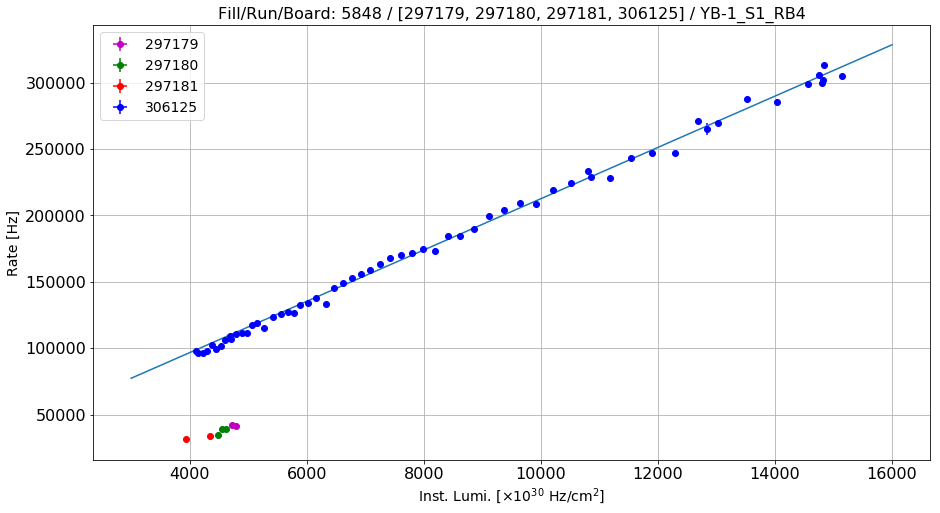

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S2_RB1
Linear fit parameters: [    16.19446627  15486.24756267]
Paramenters uncertainty: [  3.37181233e-02   3.29607946e+02]


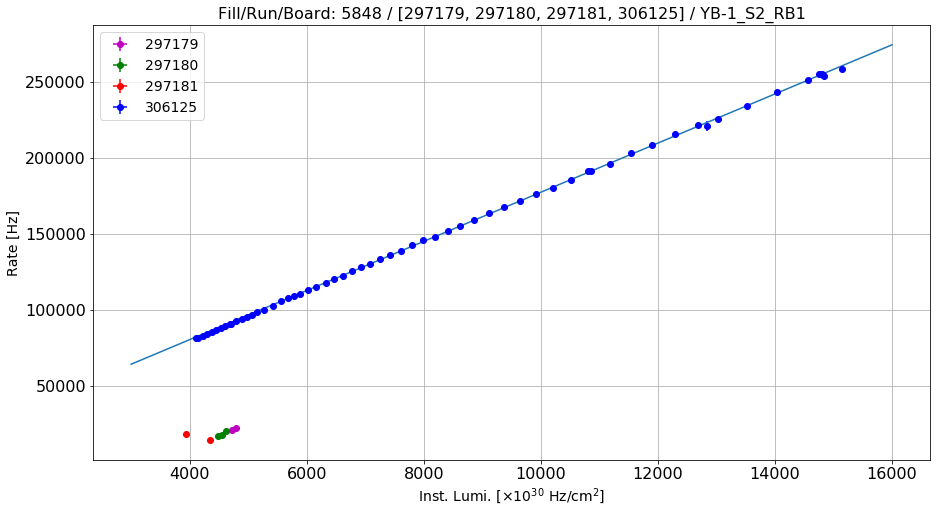

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S2_RB2
Linear fit parameters: [    3.81665139  3045.14952485]
Paramenters uncertainty: [  9.67189003e-03   9.45465374e+01]


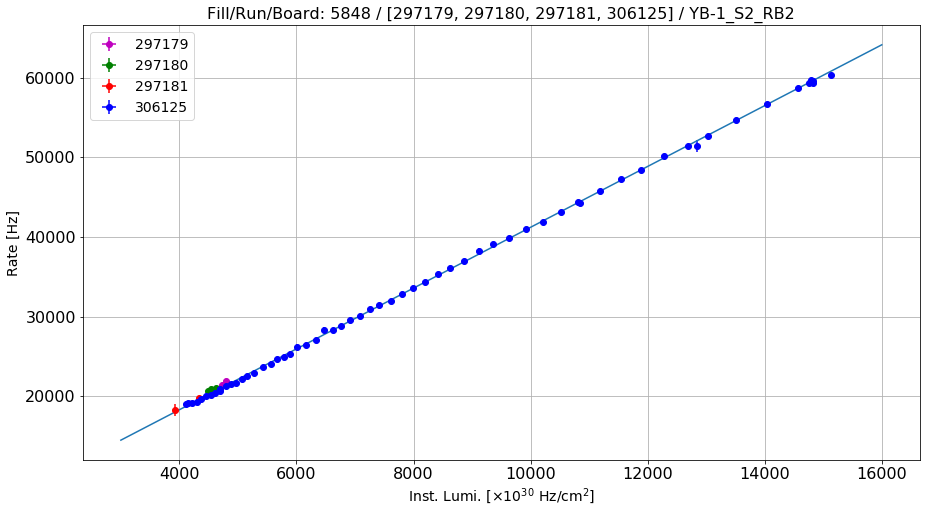

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S2_RB3
Linear fit parameters: [  7.94261559e-01   1.82956436e+03]
Paramenters uncertainty: [  1.71894565e-02   1.68033713e+02]


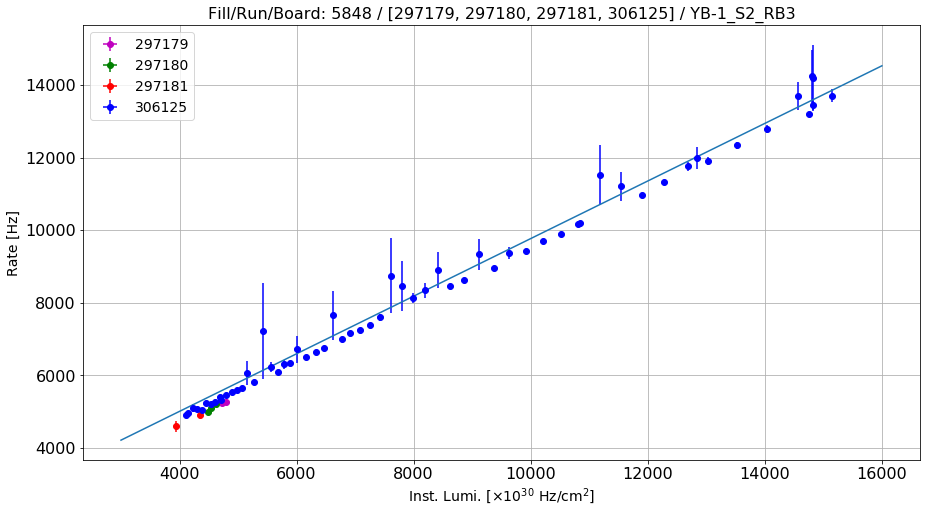

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S2_RB4
Linear fit parameters: [  8.40176691e-04   1.54613165e+00]
Paramenters uncertainty: [  2.58857530e-04   2.53043439e+00]


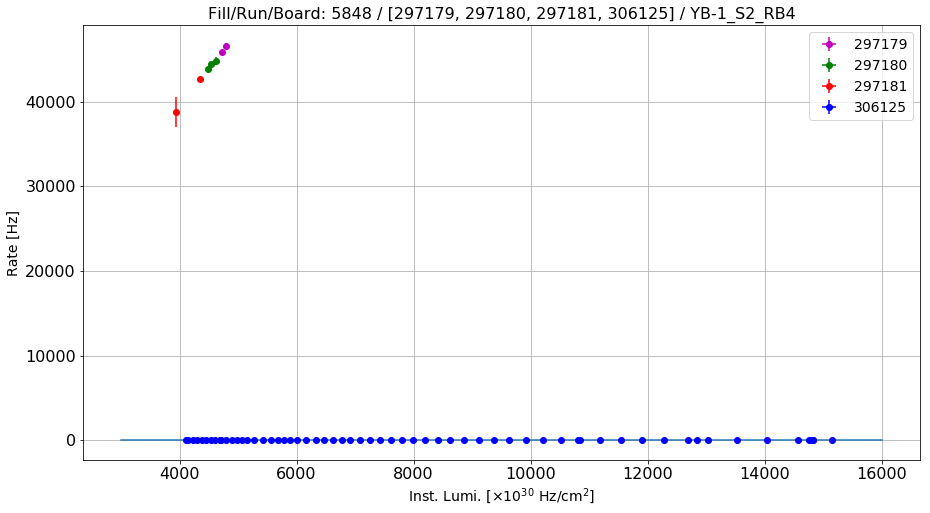

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S3_RB1
Linear fit parameters: [   15.08285793  2749.01062153]
Paramenters uncertainty: [  3.33376421e-02   3.25888592e+02]


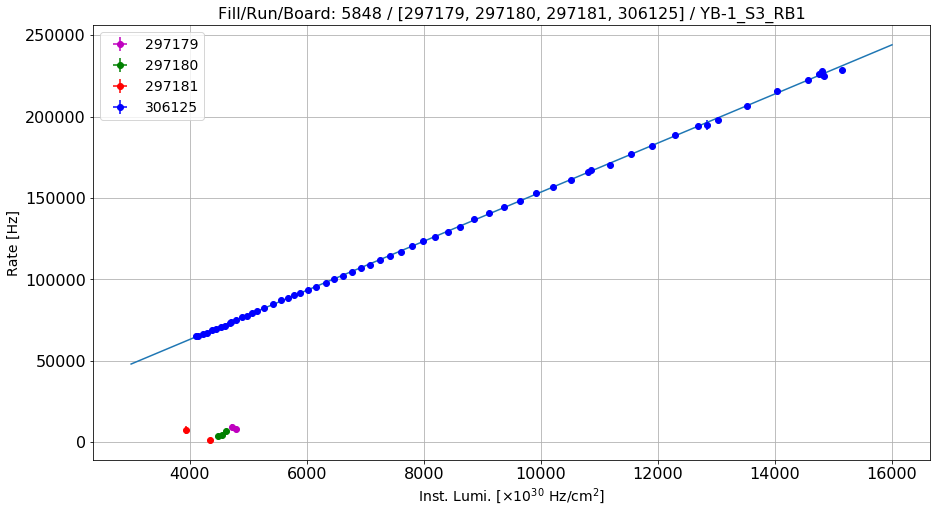

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S3_RB2
Linear fit parameters: [  3.50137962e+00   3.71379471e+03]
Paramenters uncertainty: [  4.21638957e-02   4.12168700e+02]


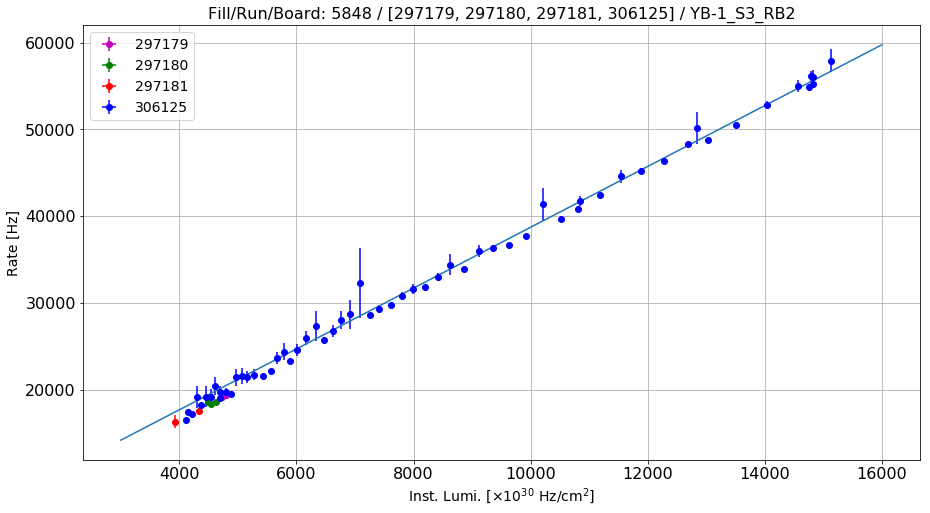

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S3_RB3
Linear fit parameters: [  8.33116841e-01   5.77403124e+03]
Paramenters uncertainty: [  4.29932152e-03   4.20275626e+01]


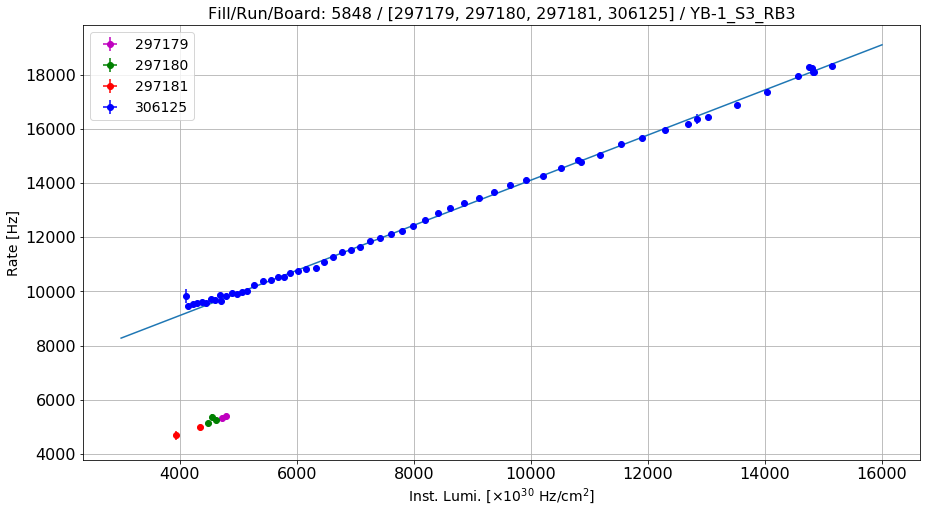

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S3_RB4
Linear fit parameters: [   28.95819773  7119.40036615]
Paramenters uncertainty: [  5.27976899e-02   5.16118230e+02]


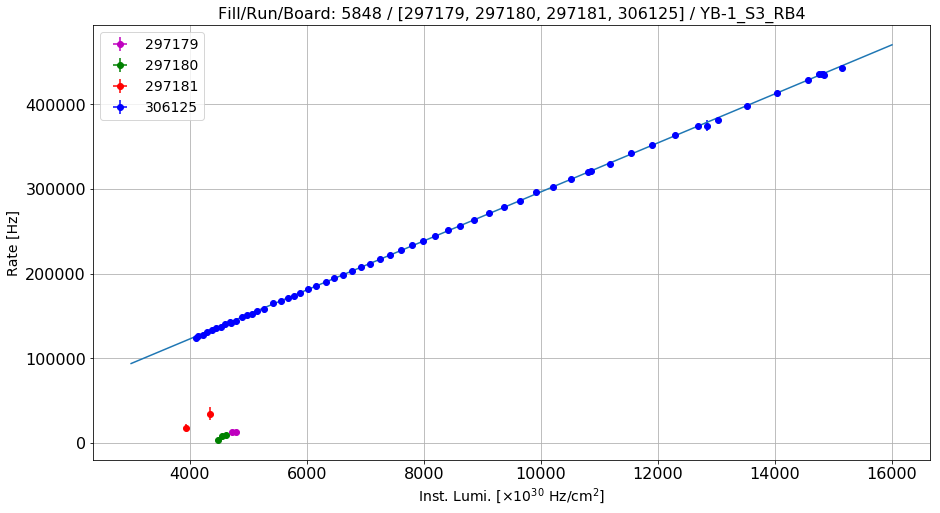

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S4_RB1
Linear fit parameters: [   12.59668881  2451.89986378]
Paramenters uncertainty: [  2.14570342e-02   2.09750967e+02]


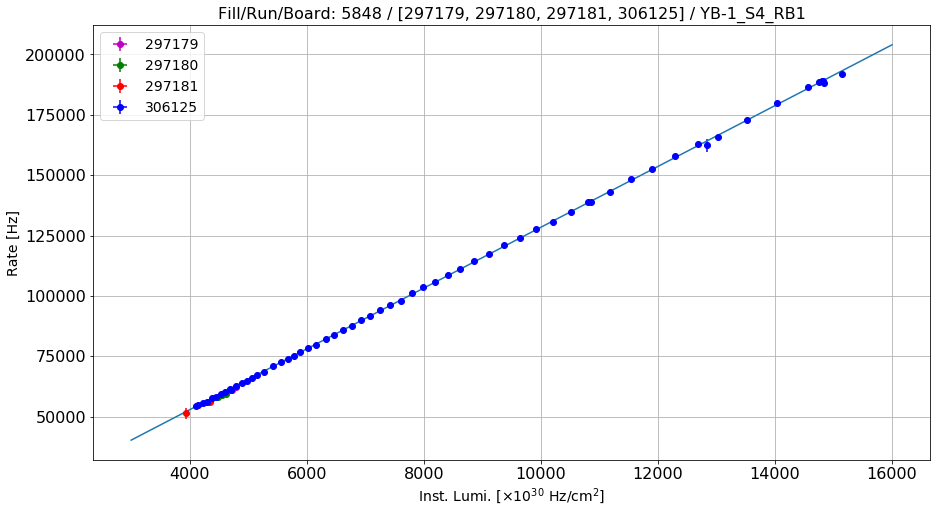

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S4_RB2
Linear fit parameters: [  3.73126505e+00   6.10905559e+04]
Paramenters uncertainty: [  6.12160708e-02   5.98411222e+02]


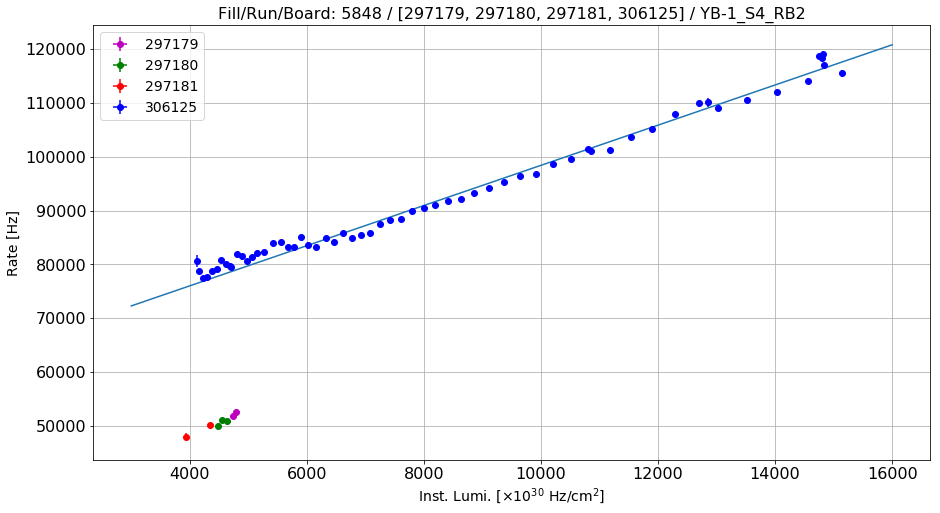

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S4_RB3
Linear fit parameters: [  9.42529381e-01   1.42233967e+04]
Paramenters uncertainty: [  1.34470047e-02   1.31449771e+02]


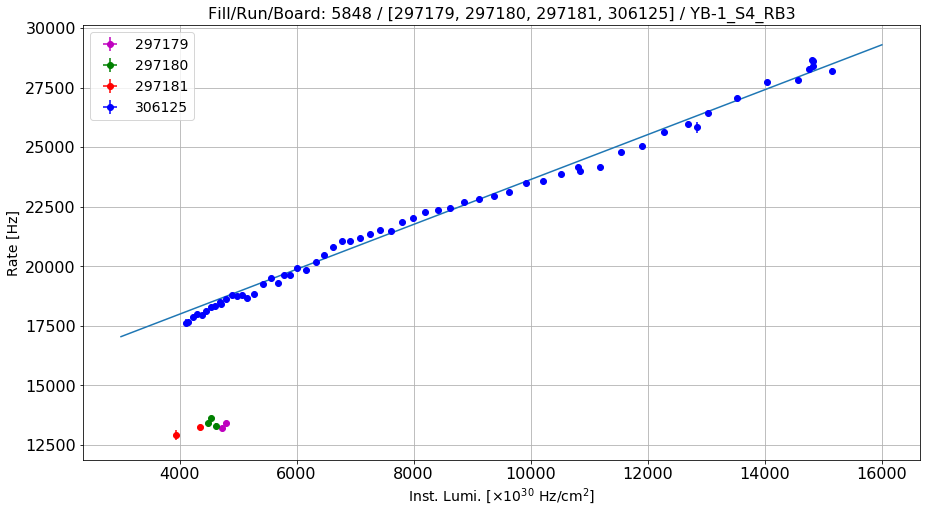

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S4_RB4
Linear fit parameters: [   28.34079322  8287.39325386]
Paramenters uncertainty: [  4.76736990e-02   4.66029199e+02]


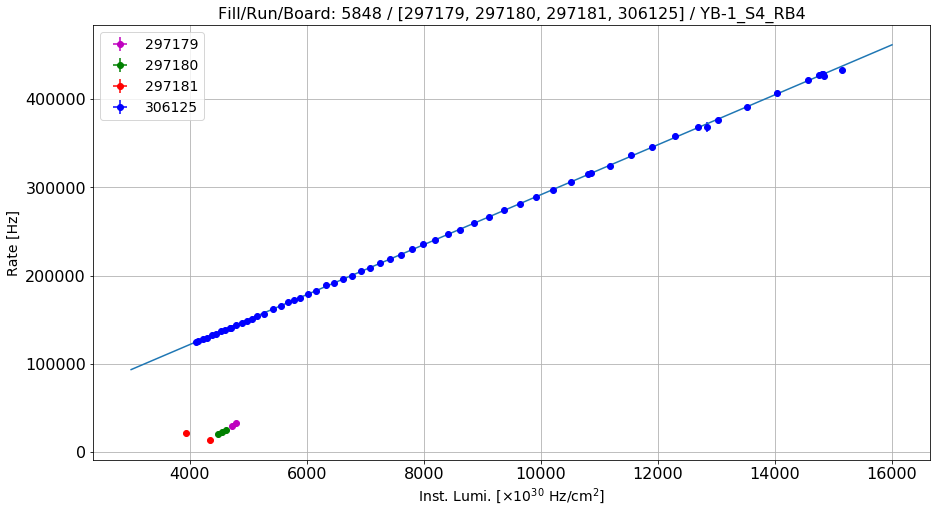

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S5_RB1
Linear fit parameters: [   16.85423686  3661.07392271]
Paramenters uncertainty: [  2.60008083e-02   2.54168150e+02]


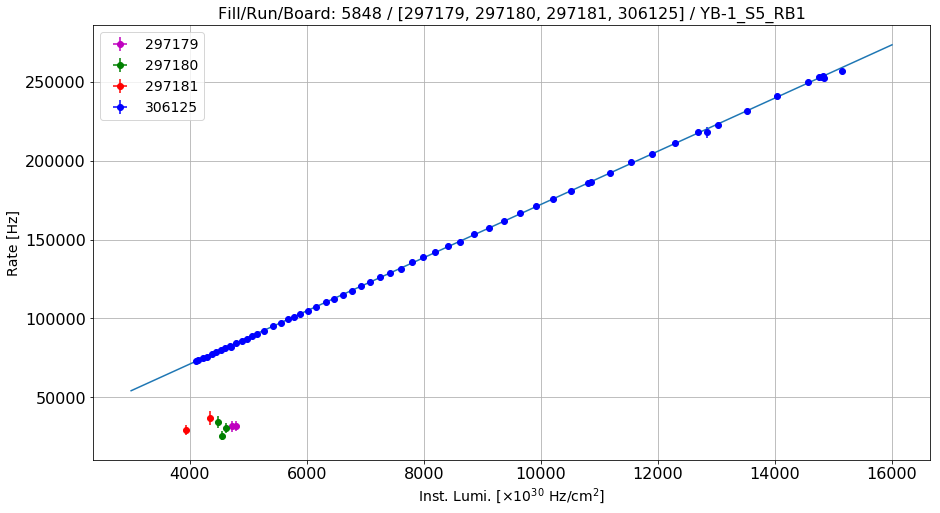

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S5_RB2
Linear fit parameters: [    3.65141645  2518.58044511]
Paramenters uncertainty: [  4.62331353e-02   4.51947121e+02]


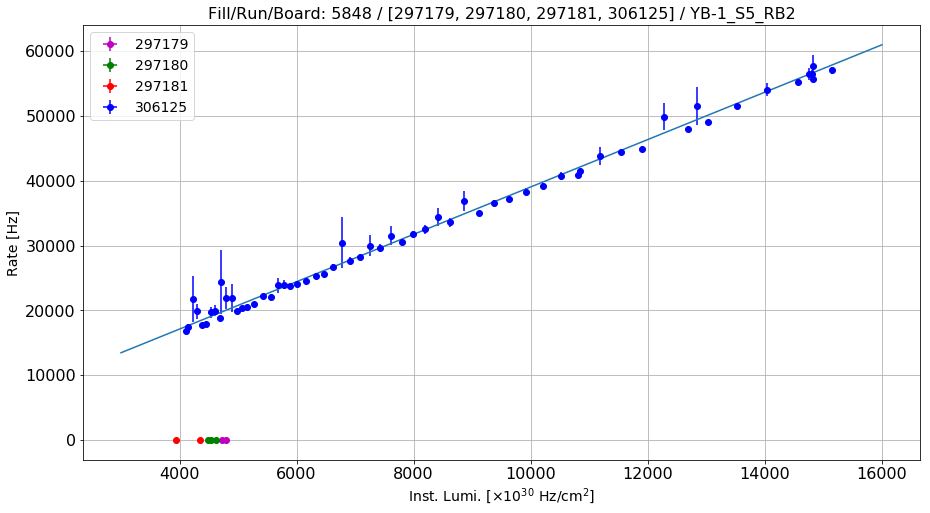

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S5_RB3
Linear fit parameters: [  9.11965185e-01   2.90961297e+03]
Paramenters uncertainty: [  3.34026638e-03   3.26524206e+01]


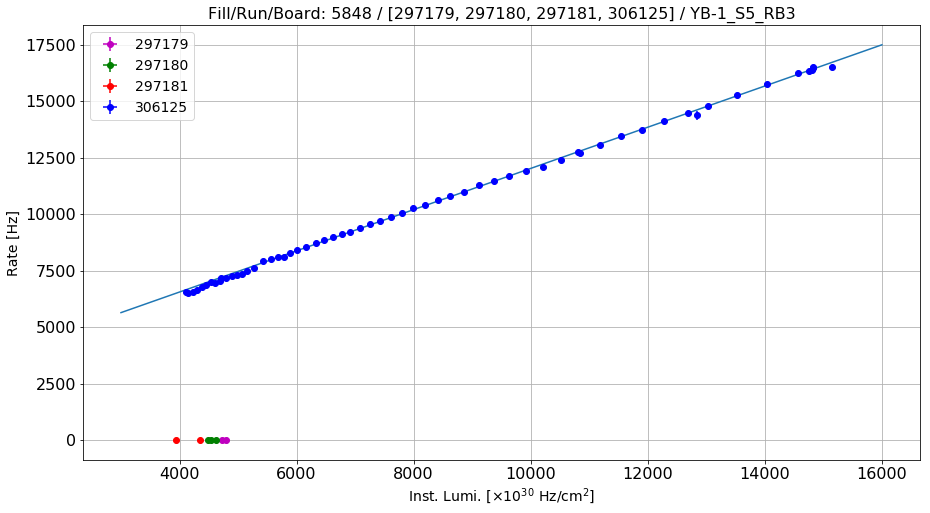

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S5_RB4
Linear fit parameters: [  8.15792003e-04   2.98898611e+00]
Paramenters uncertainty: [  2.92998403e-04   2.86417488e+00]


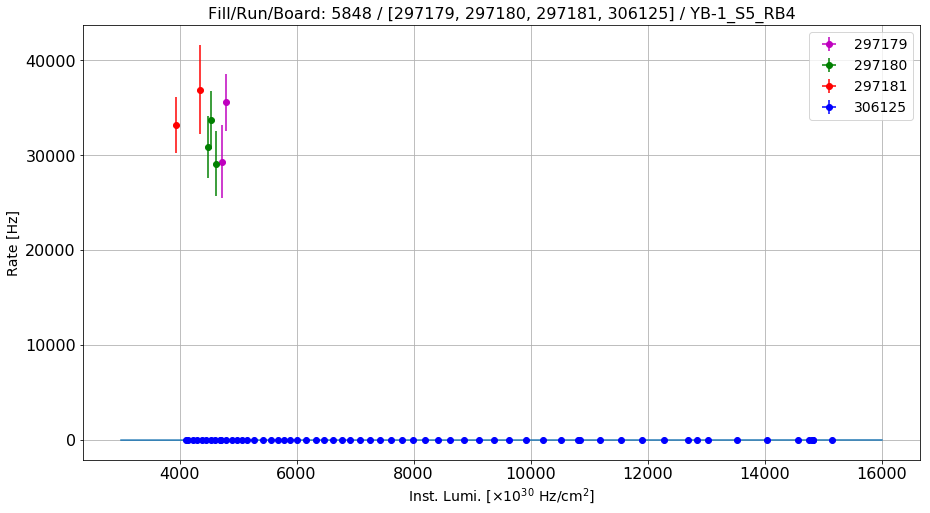

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S6_RB1
Linear fit parameters: [   18.00215385  5316.81211574]
Paramenters uncertainty: [  6.66476154e-02   6.51506712e+02]


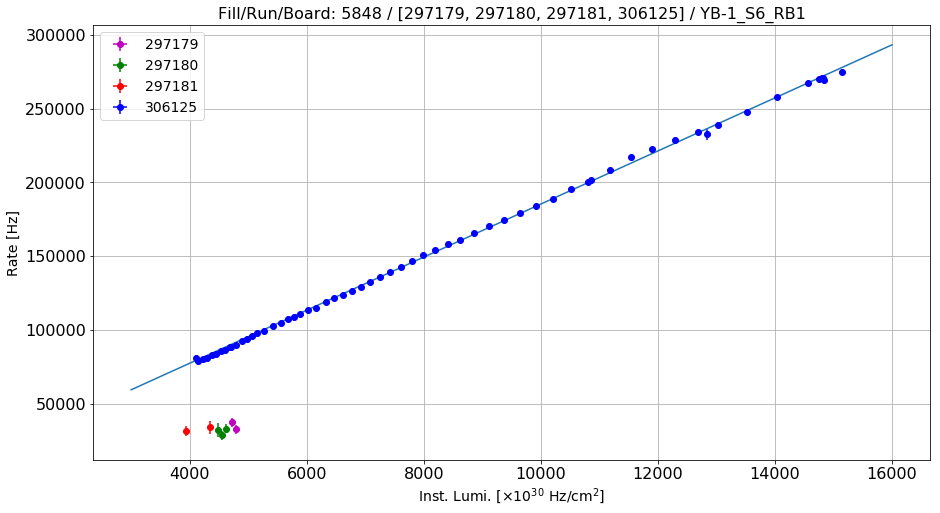

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S6_RB2
Linear fit parameters: [    3.82120666  2766.79152391]
Paramenters uncertainty: [  7.86222915e-03   7.68563890e+01]


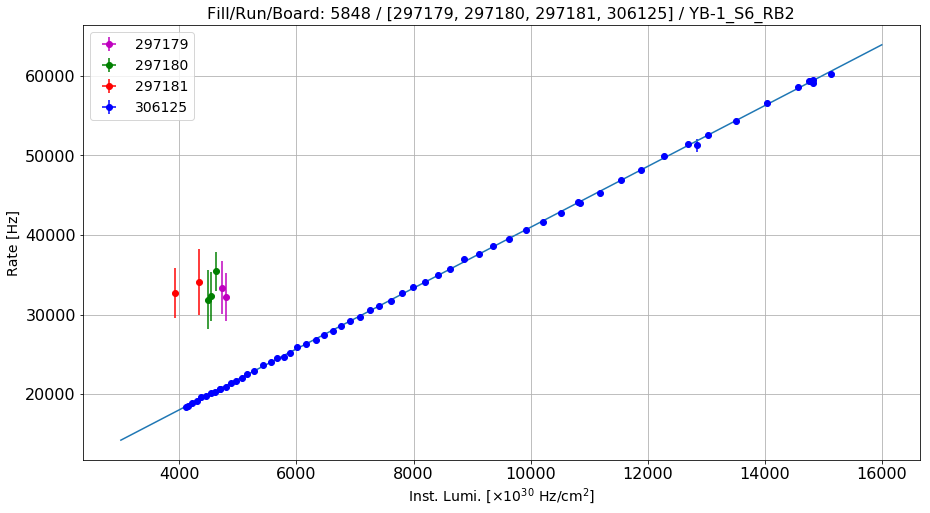

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S6_RB3
Linear fit parameters: [  5.45803629e-01   1.27986499e+03]
Paramenters uncertainty: [  2.06052099e-03   2.01424049e+01]


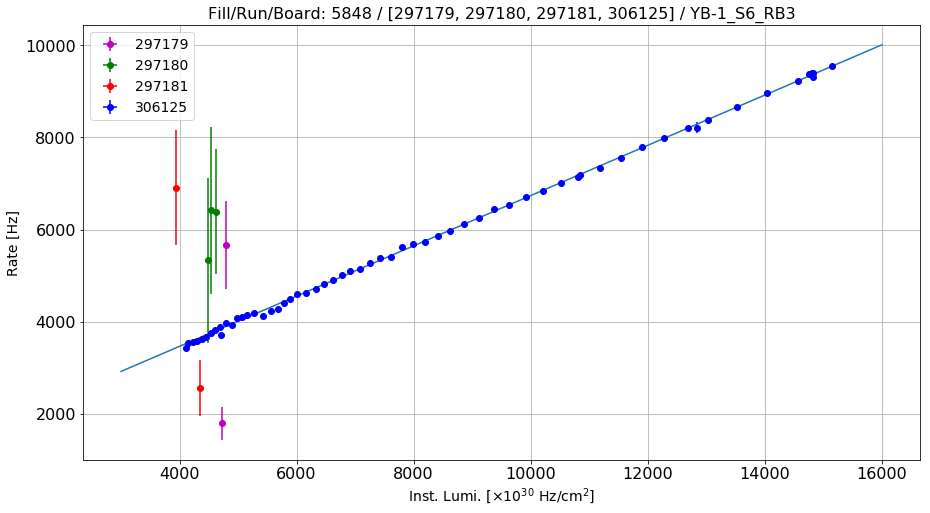

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S6_RB4
Linear fit parameters: [  4.65769248e+01   6.39981107e+05]
Paramenters uncertainty: [  7.73830276e-01   7.56449597e+03]


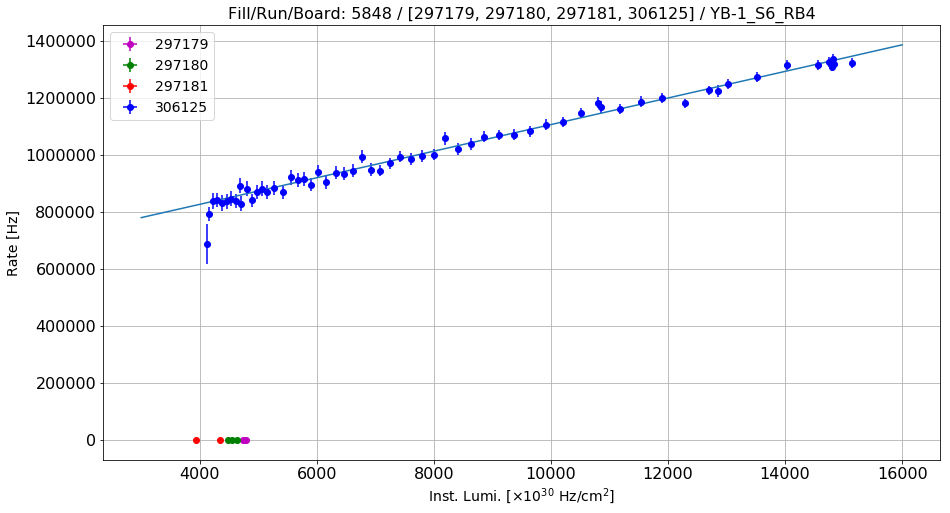

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S7_RB1
Linear fit parameters: [   17.89193076  2574.69104698]
Paramenters uncertainty: [  3.39343135e-02   3.31721290e+02]


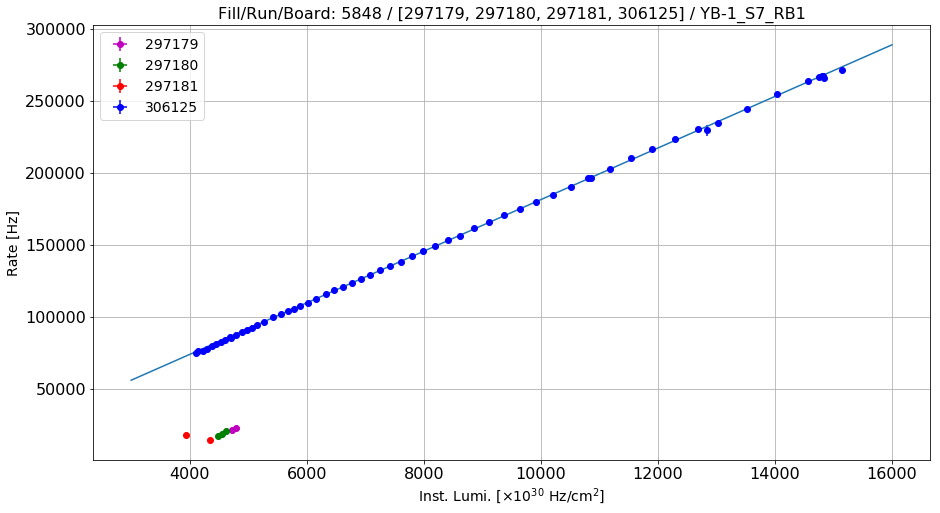

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S7_RB2
Linear fit parameters: [  1.78721661e+00   4.69508723e+03]
Paramenters uncertainty: [  3.22315990e-02   3.15076585e+02]


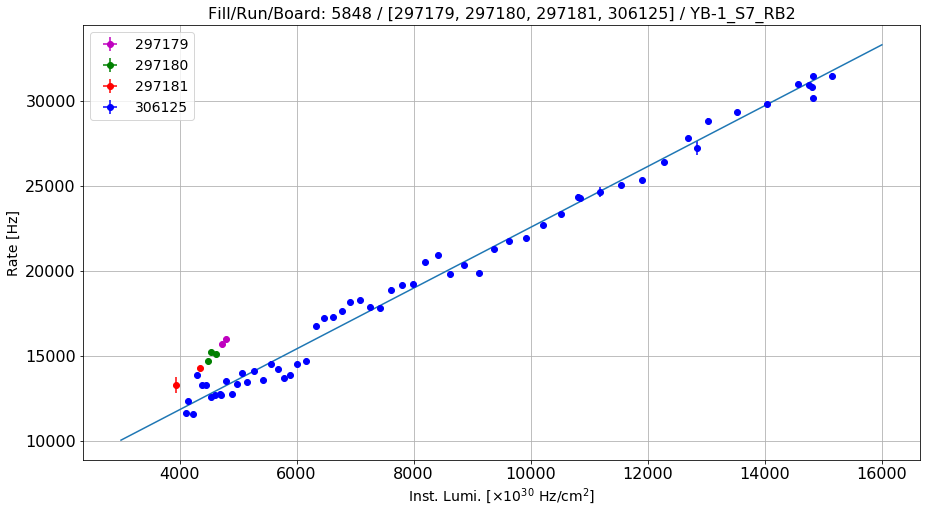

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S7_RB3
Linear fit parameters: [  5.88191420e-01   2.08405763e+03]
Paramenters uncertainty: [  7.74666709e-03   7.57267244e+01]


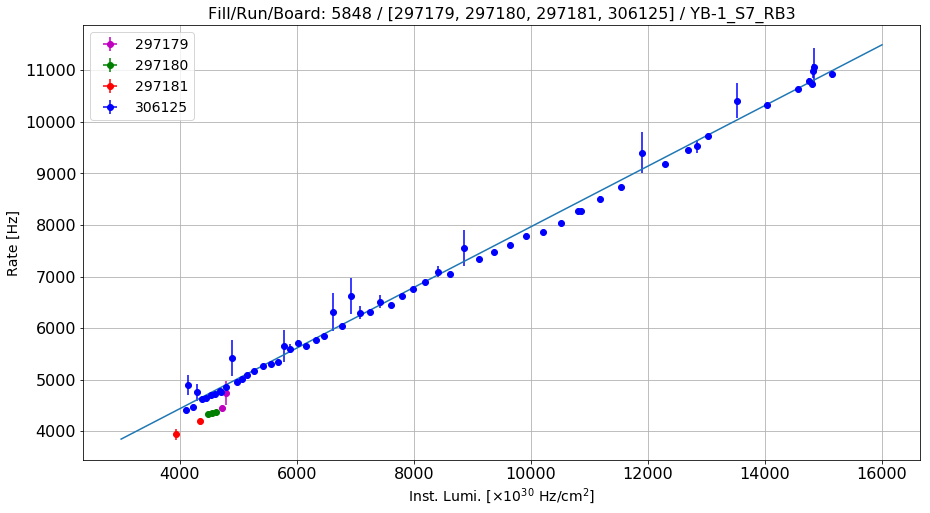

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S7_RB4
Linear fit parameters: [ 0.00172709  0.68566672]
Paramenters uncertainty: [  4.55235020e-04   4.45010176e+00]


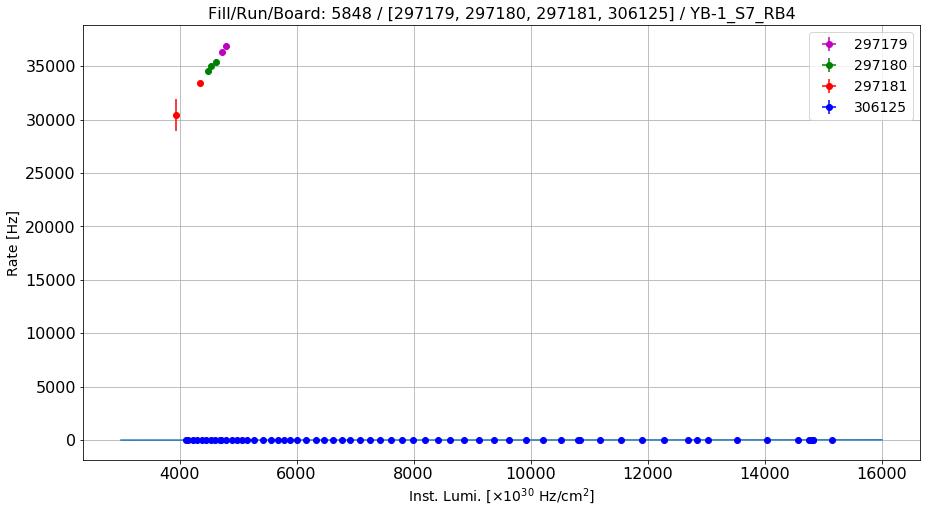

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S8_RB1
Linear fit parameters: [   14.32000385  8286.94259722]
Paramenters uncertainty: [  2.69077553e-02   2.63033914e+02]


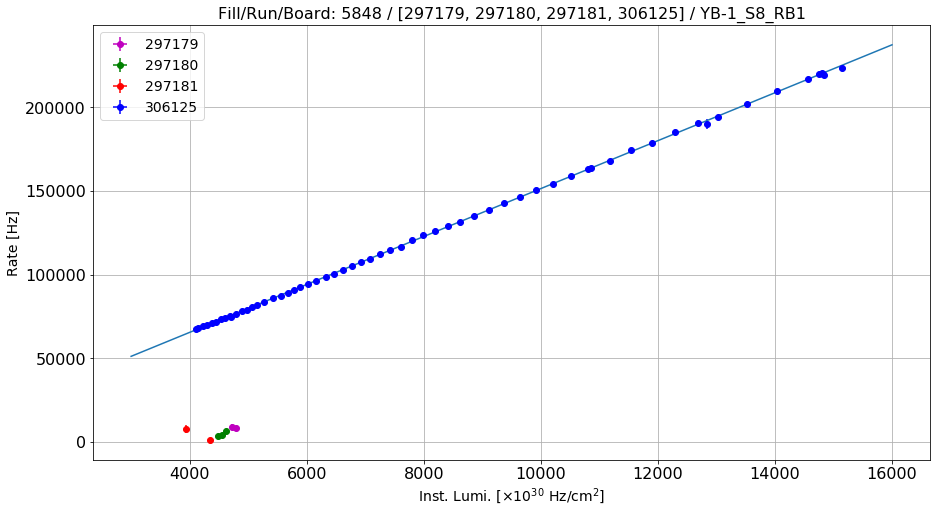

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S8_RB2
Linear fit parameters: [  3.67274115e+00   5.80100923e+03]
Paramenters uncertainty: [  1.10151657e-02   1.07677586e+02]


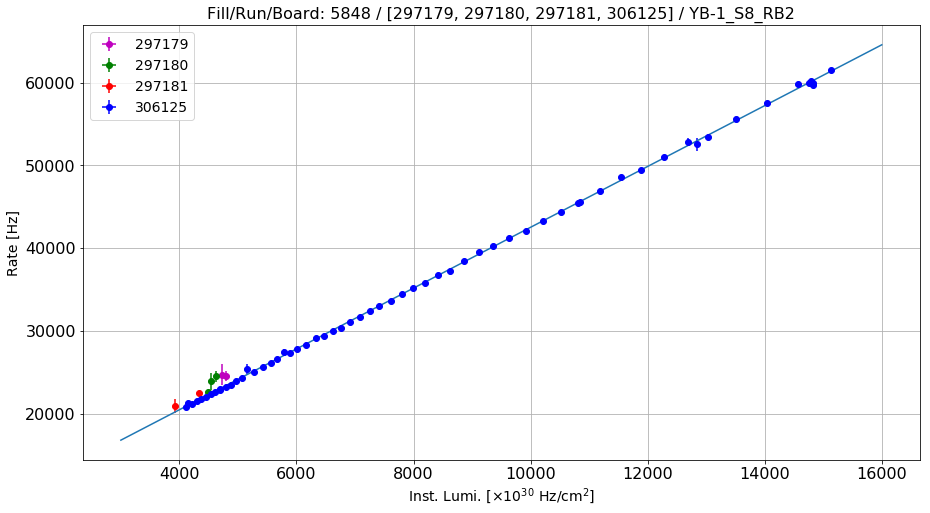

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S8_RB3
Linear fit parameters: [  5.05009709e-01   8.32407645e+03]
Paramenters uncertainty: [  8.10222340e-03   7.92024275e+01]


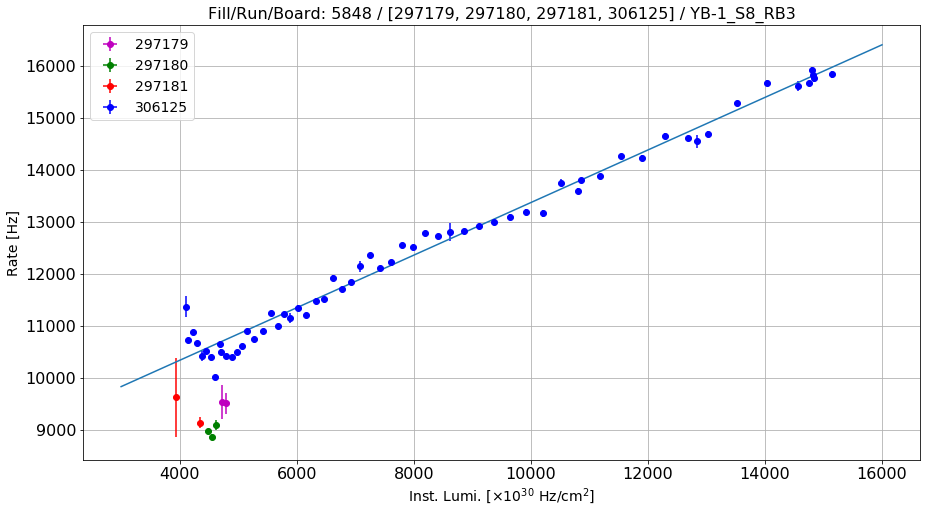

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S8_RB4
Linear fit parameters: [  2.16618635e-03  -2.38778978e+00]
Paramenters uncertainty: [  6.20900387e-04   6.06954602e+00]


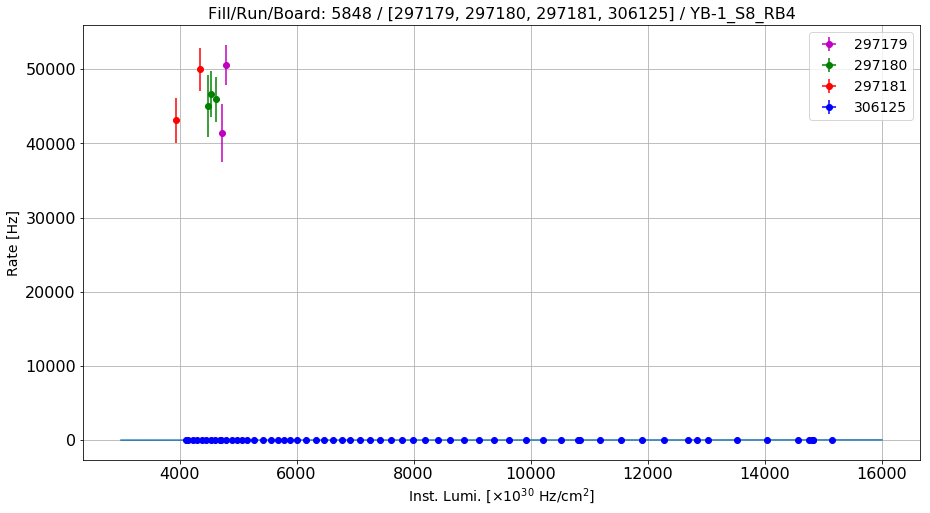

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S9_RB1
Linear fit parameters: [   16.67506076  4794.38044555]
Paramenters uncertainty: [  3.35385108e-02   3.27852163e+02]


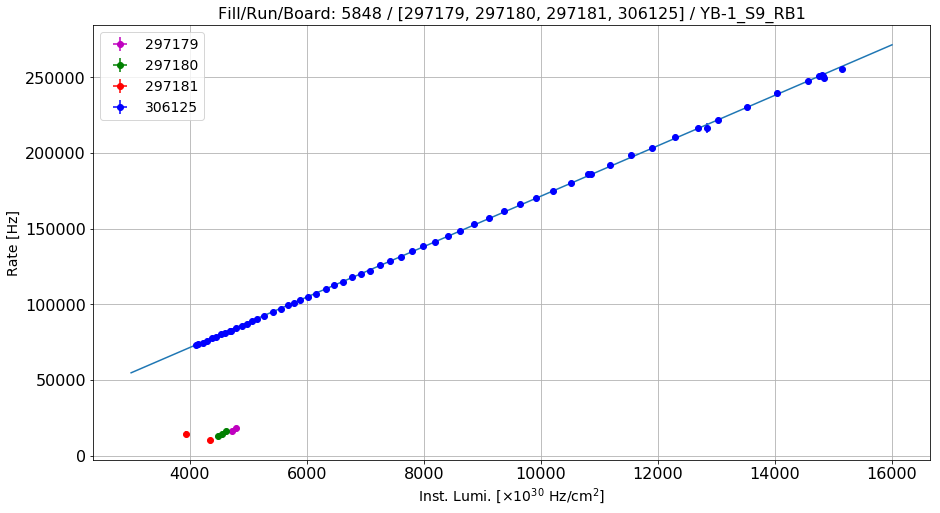

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S9_RB2
Linear fit parameters: [  3.44065405e+00   8.63708707e+04]
Paramenters uncertainty: [  7.39040926e-02   7.22441636e+02]


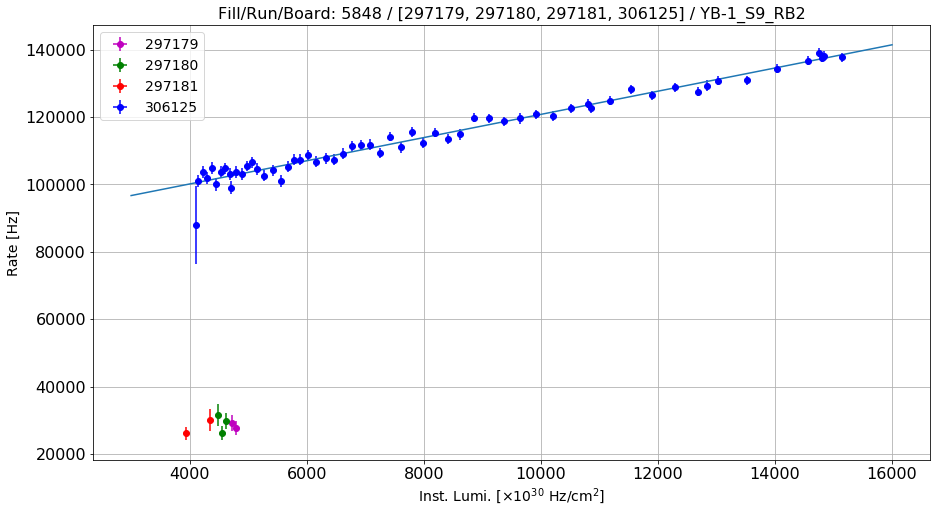

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S9_RB3
Linear fit parameters: [  4.84325378e-01   2.28233261e+03]
Paramenters uncertainty: [  1.35584835e-02   1.32539520e+02]


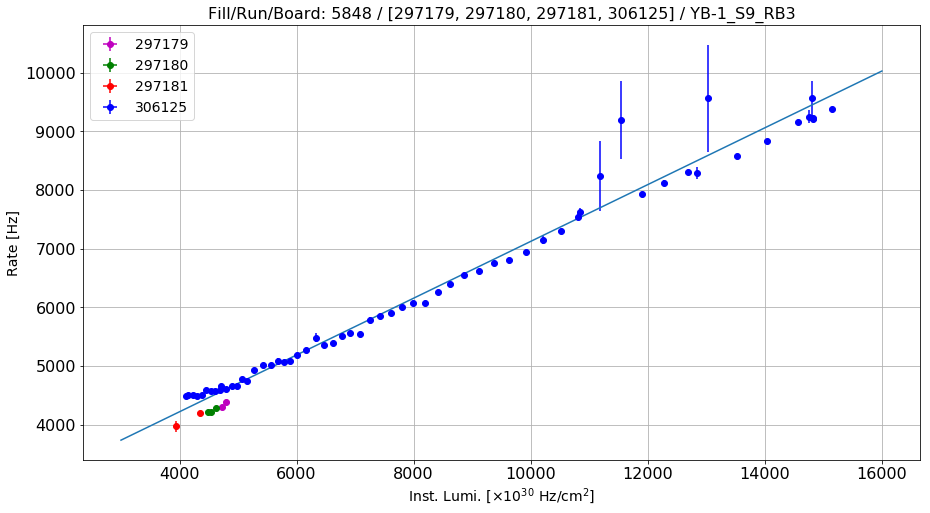

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S9_RB4
Linear fit parameters: [  4.78858198e-01   4.14964148e+03]
Paramenters uncertainty: [  5.78785173e-03   5.65785321e+01]


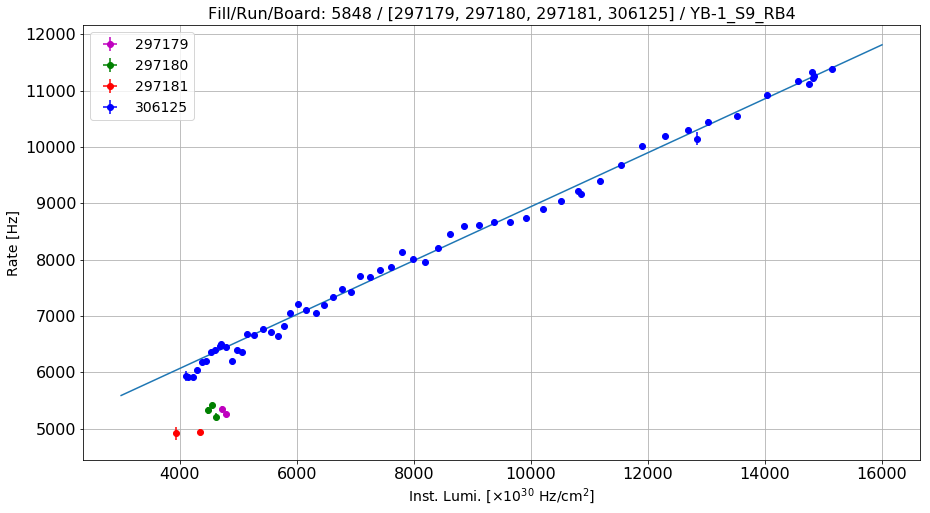

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S10_RB1
Linear fit parameters: [   16.41579293  8532.37685464]
Paramenters uncertainty: [  4.93562527e-02   4.82476825e+02]


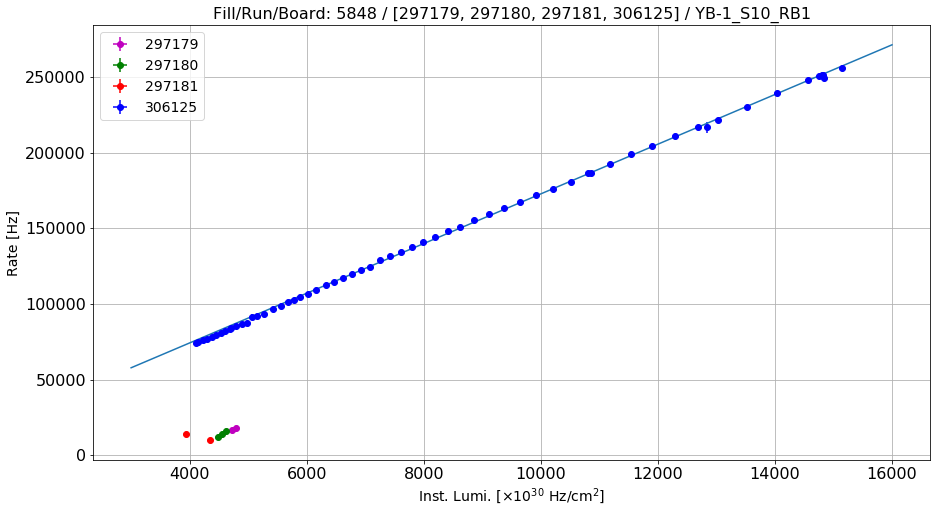

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S10_RB2
Linear fit parameters: [    3.57687422  2899.17446059]
Paramenters uncertainty: [  1.41930430e-02   1.38742589e+02]


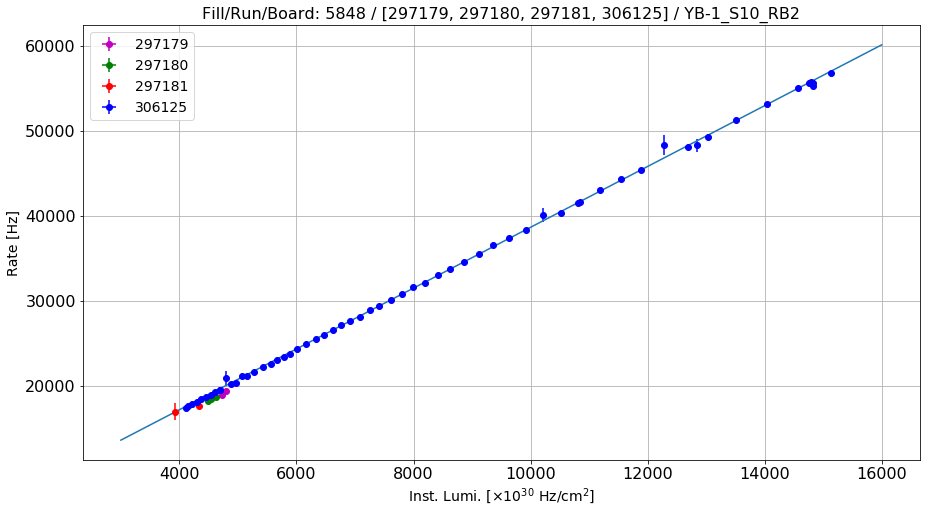

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S10_RB3
Linear fit parameters: [  5.16162217e-01   4.81947107e+03]
Paramenters uncertainty: [  3.42126780e-02   3.34442413e+02]


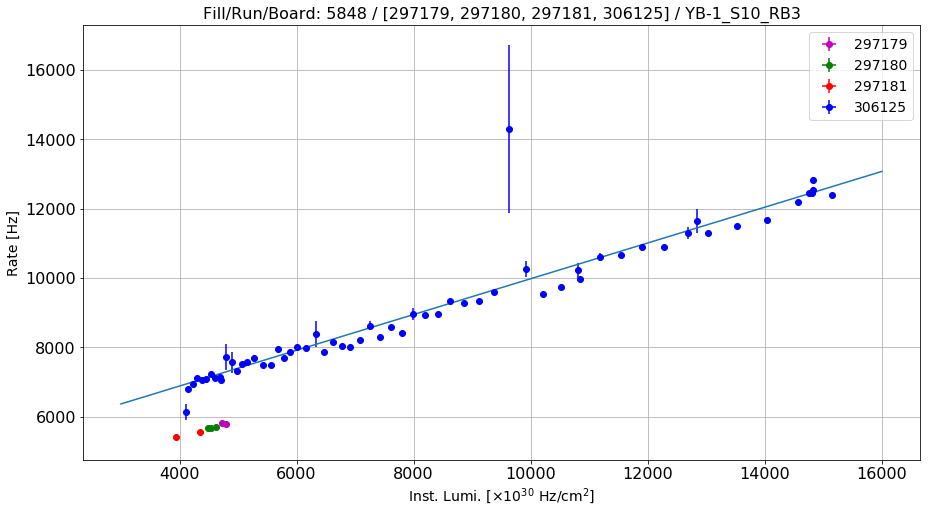

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S10_RB4
Linear fit parameters: [  7.65312668e-01   5.41788171e+03]
Paramenters uncertainty: [  8.44332768e-03   8.25368562e+01]


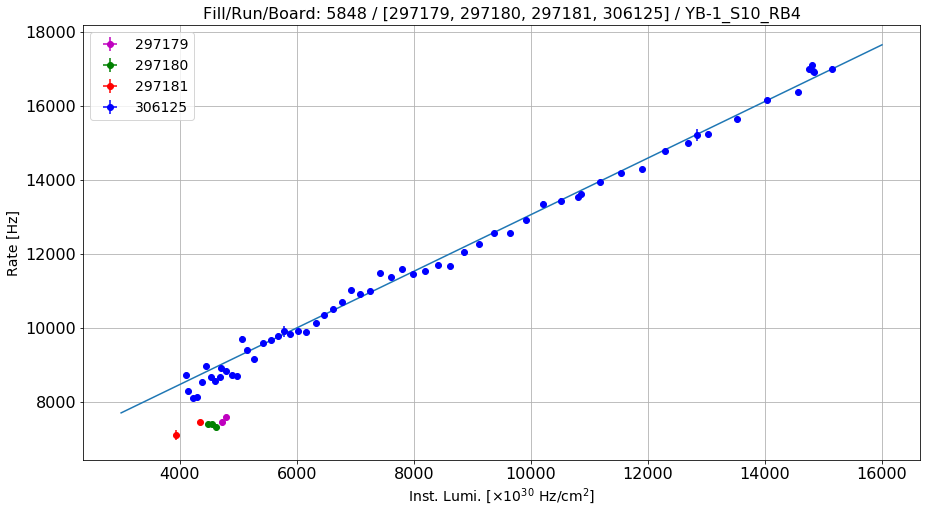

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S11_RB1
Linear fit parameters: [   16.60064149  8557.28499635]
Paramenters uncertainty: [  3.03207860e-02   2.96397635e+02]


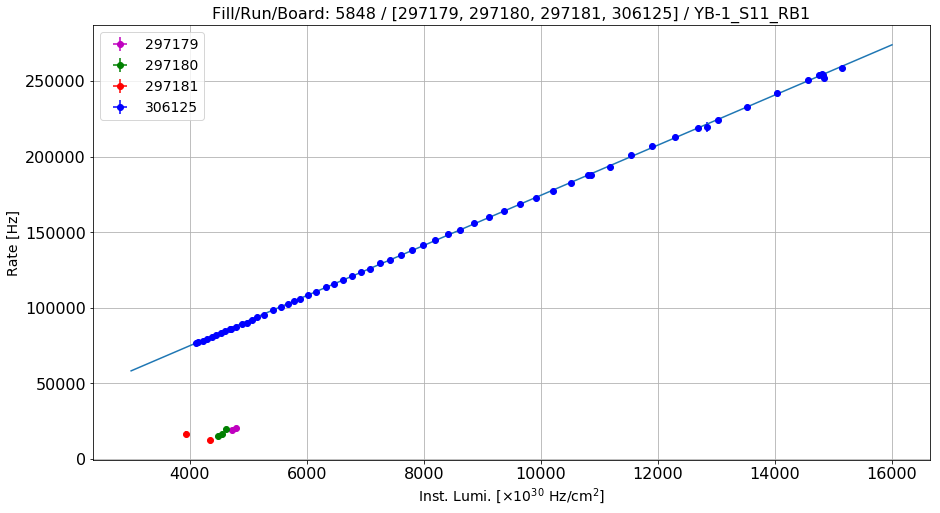

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S11_RB2
Linear fit parameters: [  3.57644919e+00   3.70977390e+03]
Paramenters uncertainty: [  7.92857953e-03   7.75049901e+01]


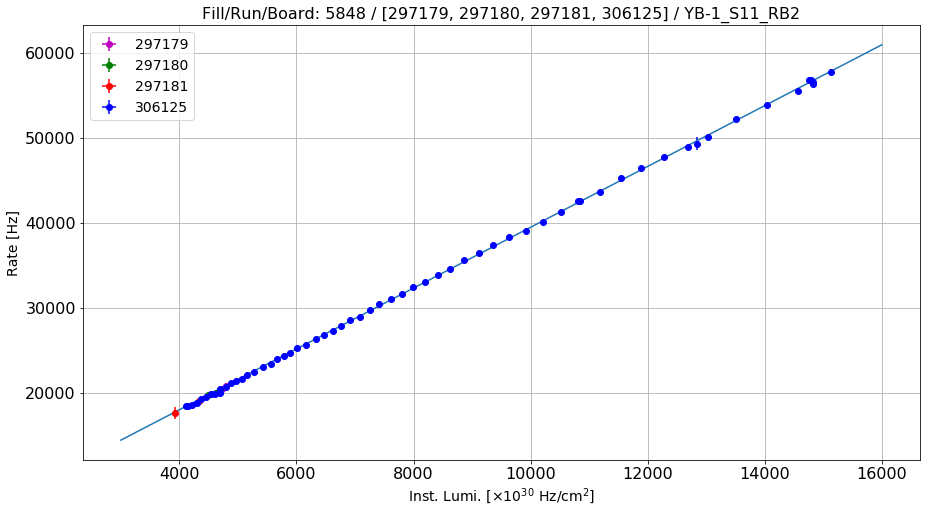

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S11_RB3
Linear fit parameters: [ -3.63801827e+00   3.39264330e+05]
Paramenters uncertainty: [  8.56405323e+00   8.37169960e+04]


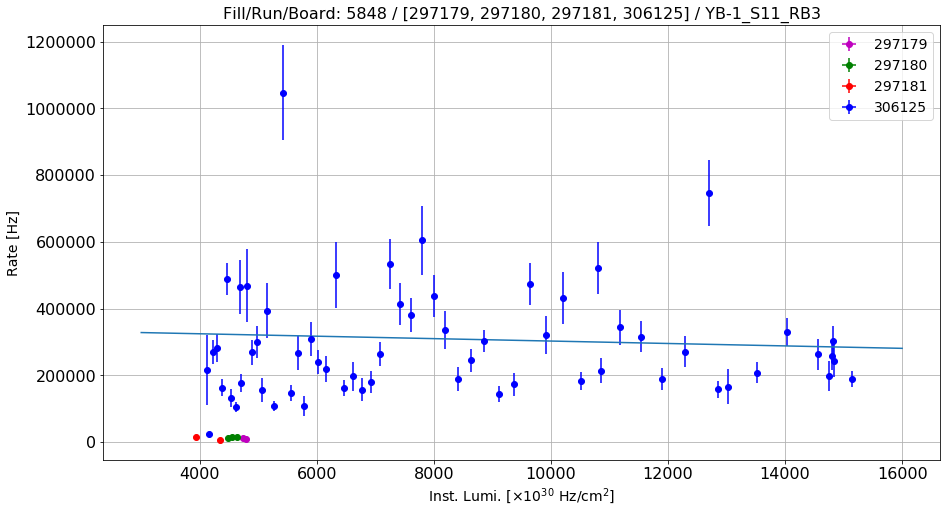

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S11_RB4
Linear fit parameters: [  5.72802169e-01   1.25147065e+03]
Paramenters uncertainty: [  9.07034223e-03   8.86661706e+01]


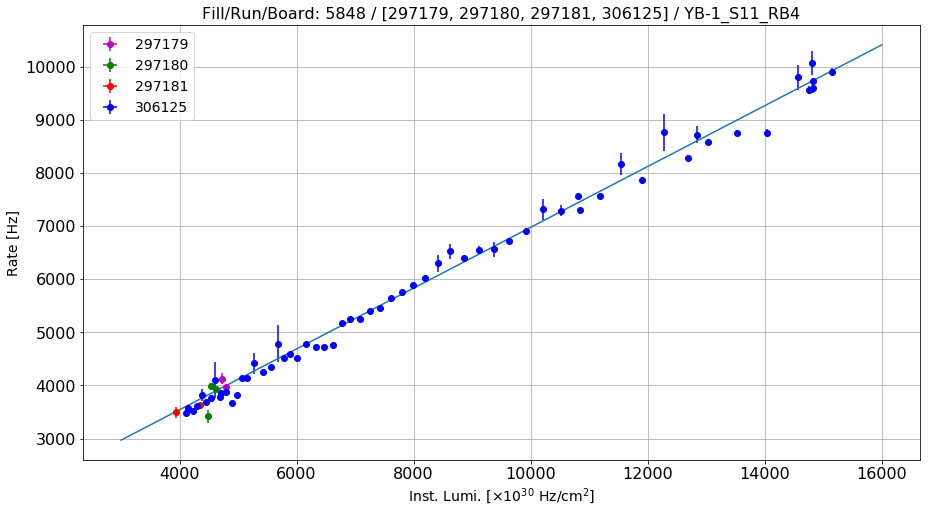

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S12_RB1
Linear fit parameters: [   15.67302863  5679.75386107]
Paramenters uncertainty: [  4.51492837e-02   4.41352045e+02]


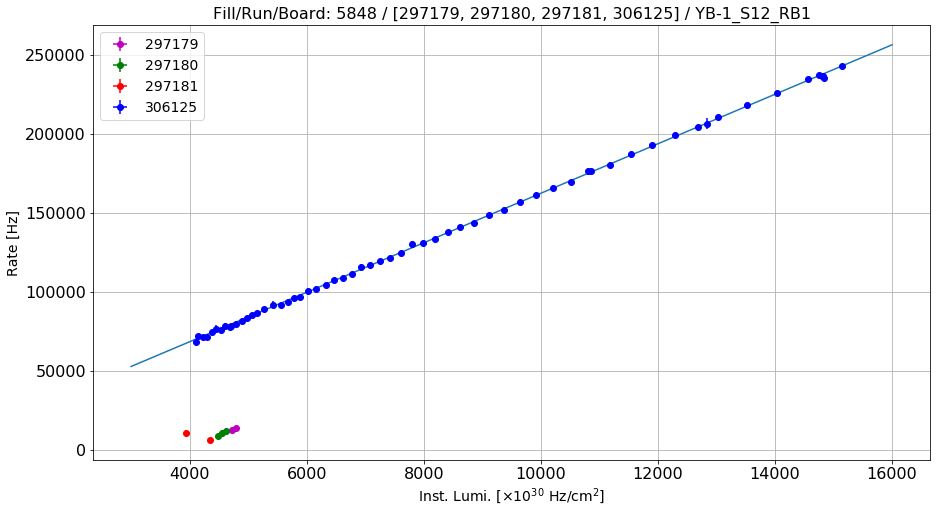

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S12_RB2
Linear fit parameters: [  2.98127307e+00   3.36315464e+03]
Paramenters uncertainty: [  5.23026560e-03   5.11279078e+01]


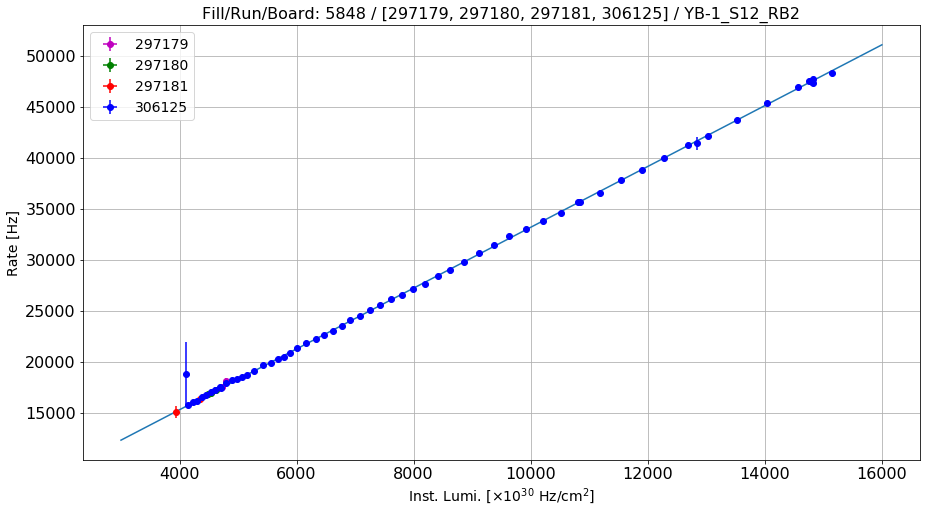

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S12_RB3
Linear fit parameters: [  5.23035842e-01   2.16536173e+03]
Paramenters uncertainty: [  3.03058204e-03   2.96251340e+01]


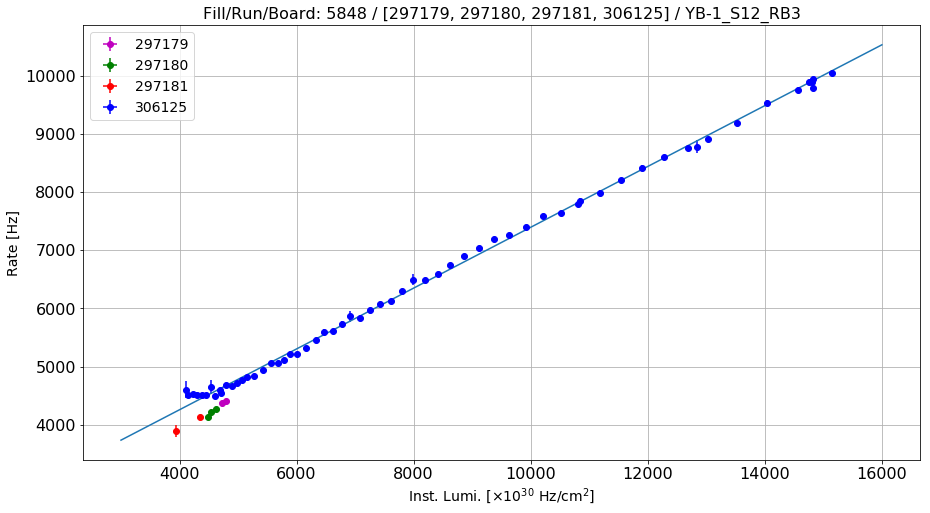

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB-1_S12_RB4
Linear fit parameters: [  8.66091851e+00   2.26793247e+04]
Paramenters uncertainty: [  4.83209766e-01   4.72356593e+03]


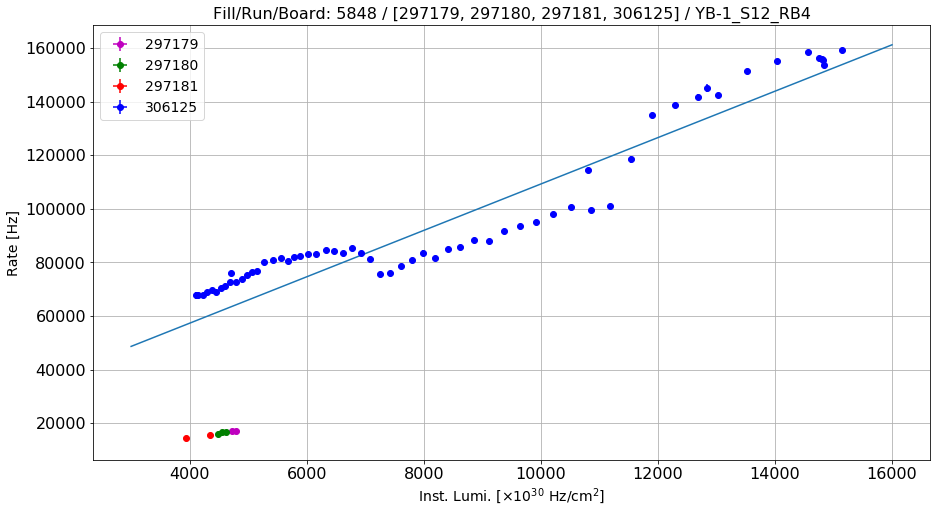

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S1_RB1
Linear fit parameters: [    3.96963331  1916.22070668]
Paramenters uncertainty: [  1.00612661e-02   9.83528421e+01]


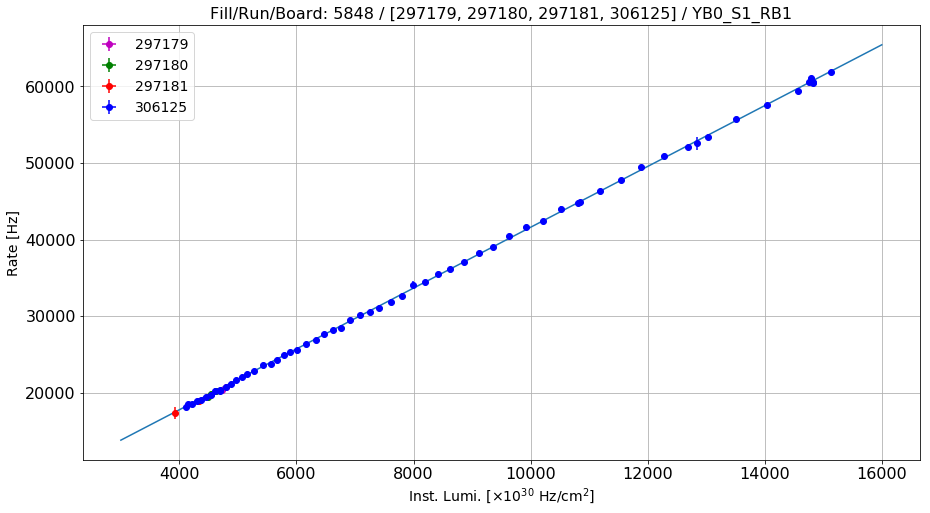

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S1_RB2
Linear fit parameters: [  1.47304162e+00   3.43597515e+03]
Paramenters uncertainty: [  1.50915940e-02   1.47526280e+02]


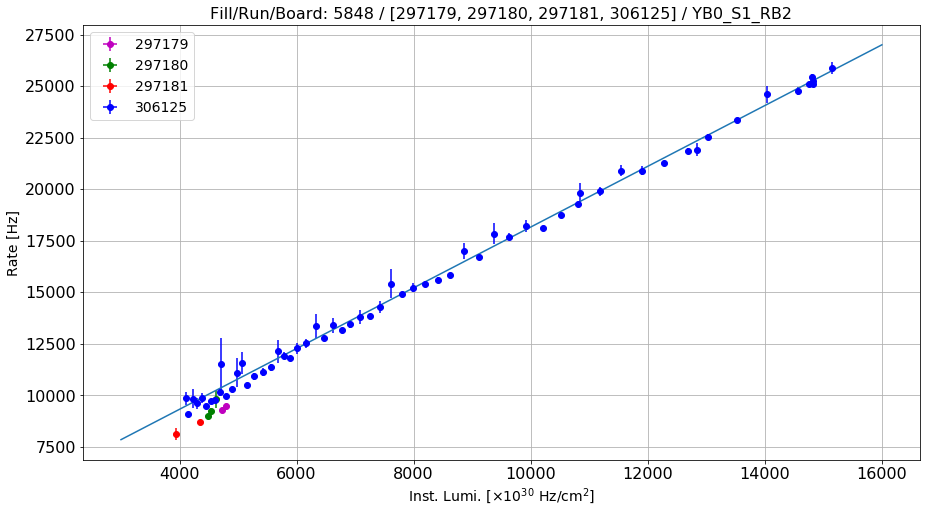

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S1_RB3
Linear fit parameters: [  1.24791013e-01   1.57380976e+05]
Paramenters uncertainty: [  9.29148685e-02   9.08279465e+02]


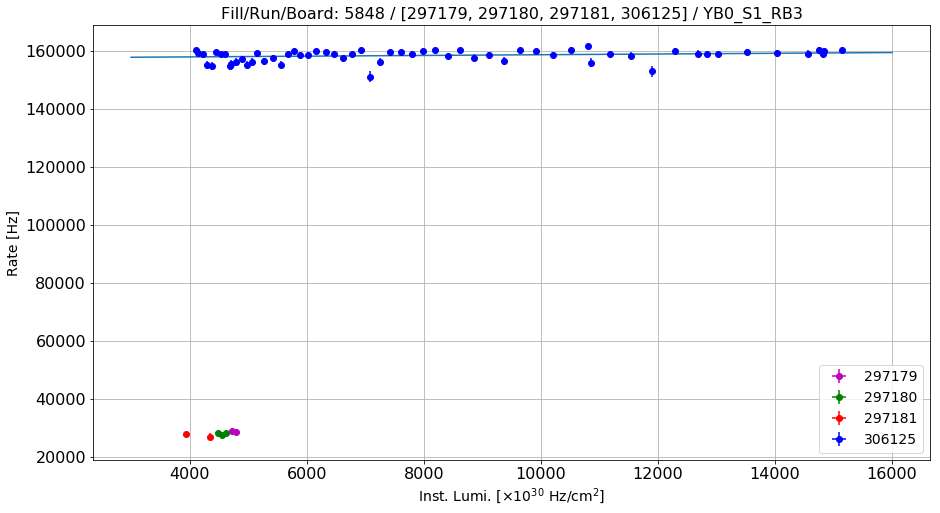

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S1_RB4
Linear fit parameters: [  1.52808807e-03  -2.13616135e+00]
Paramenters uncertainty: [  3.55104072e-04   3.47128228e+00]


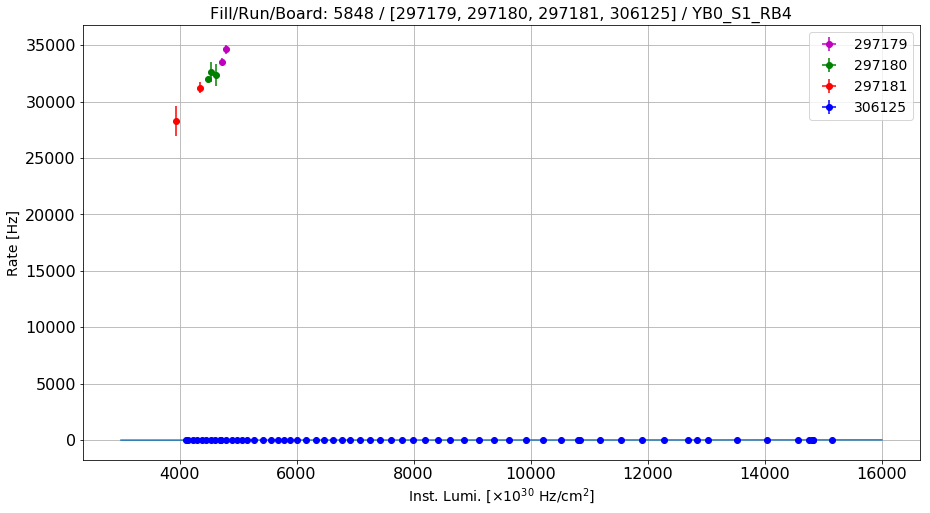

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S2_RB1
Linear fit parameters: [  5.13720956e+00   5.87782812e+03]
Paramenters uncertainty: [  1.86562231e-02   1.82371935e+02]


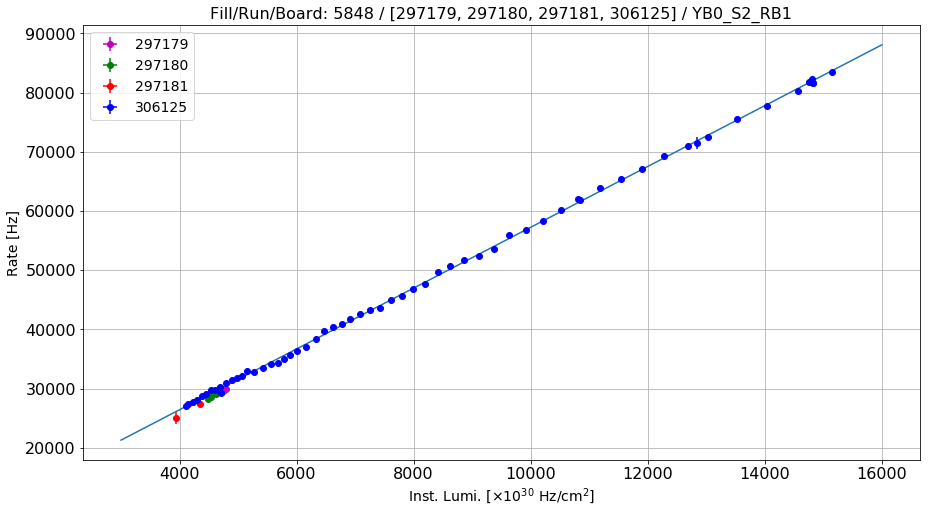

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S2_RB2
Linear fit parameters: [  1.99809564e+00   3.83773908e+03]
Paramenters uncertainty: [  2.39124772e-02   2.33753890e+02]


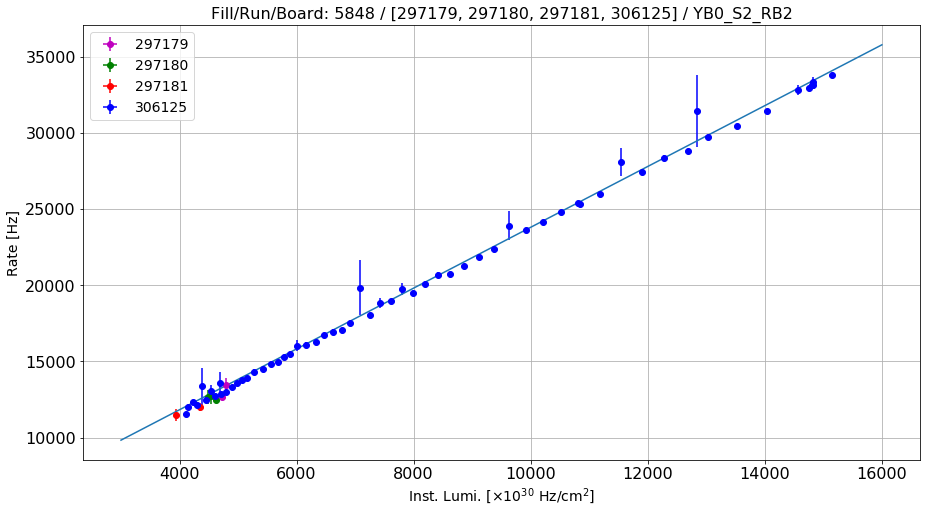

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S2_RB3
Linear fit parameters: [  6.58429598e-01   5.24919095e+04]
Paramenters uncertainty: [  7.38729350e-02   7.22137058e+02]


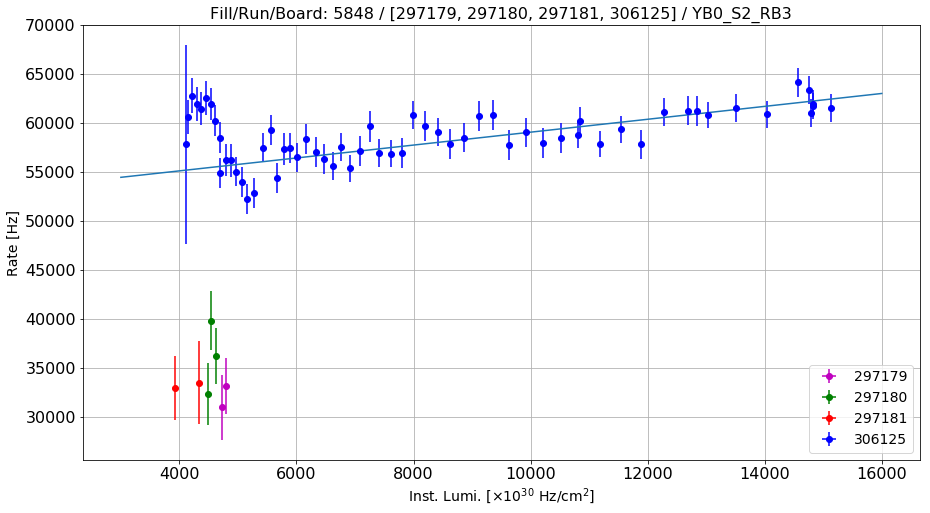

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S2_RB4
Linear fit parameters: [   18.09563727  7453.57688972]
Paramenters uncertainty: [  2.21614392e-01   2.16636804e+03]


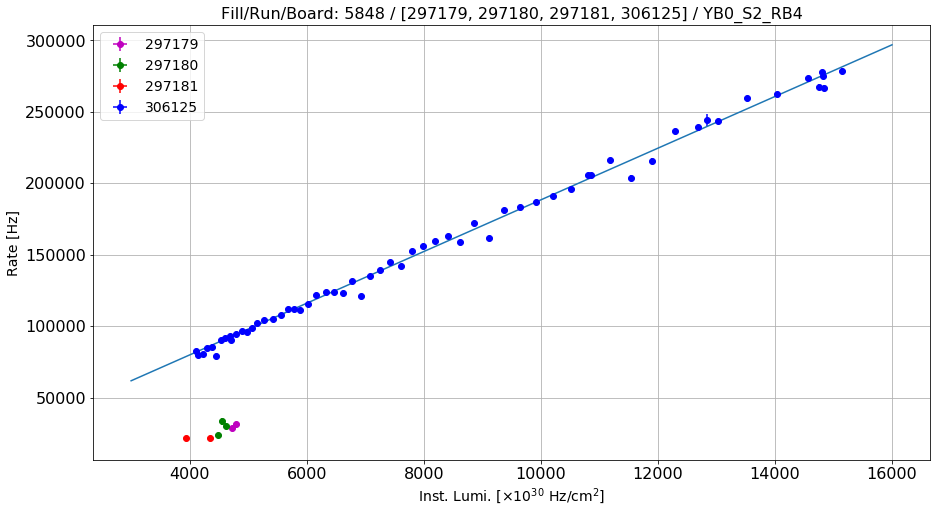

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S3_RB1
Linear fit parameters: [    5.14166292  3786.26468092]
Paramenters uncertainty: [  1.75055827e-01   1.71123971e+03]


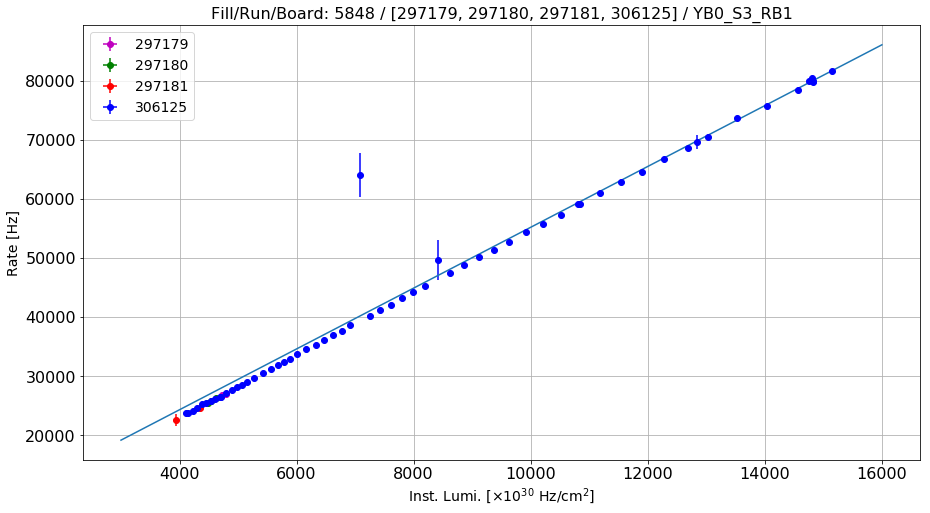

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S3_RB2
Linear fit parameters: [  2.63821317e+00   7.58744469e+03]
Paramenters uncertainty: [  9.36957737e-02   7.61244258e+02]


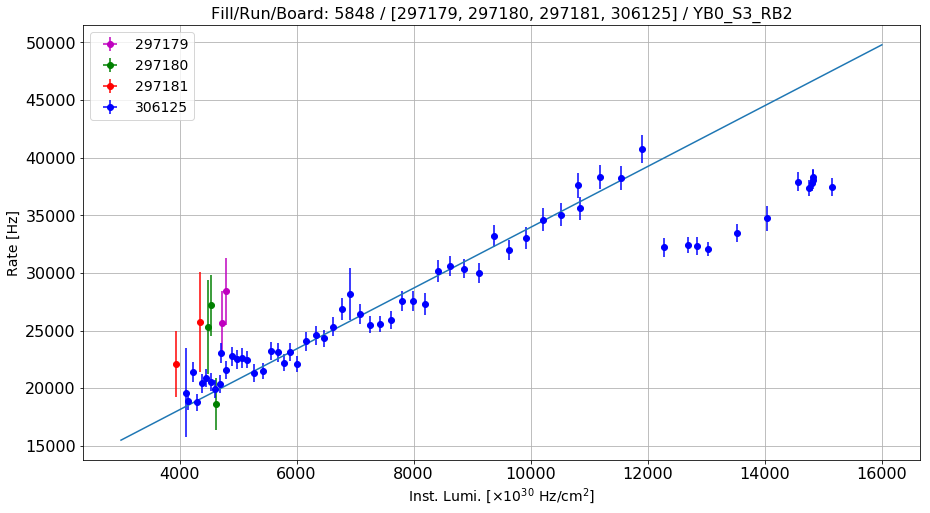

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S3_RB3
Linear fit parameters: [  7.63669913e-01   2.99524554e+03]
Paramenters uncertainty: [  7.54766712e-03   7.37814212e+01]


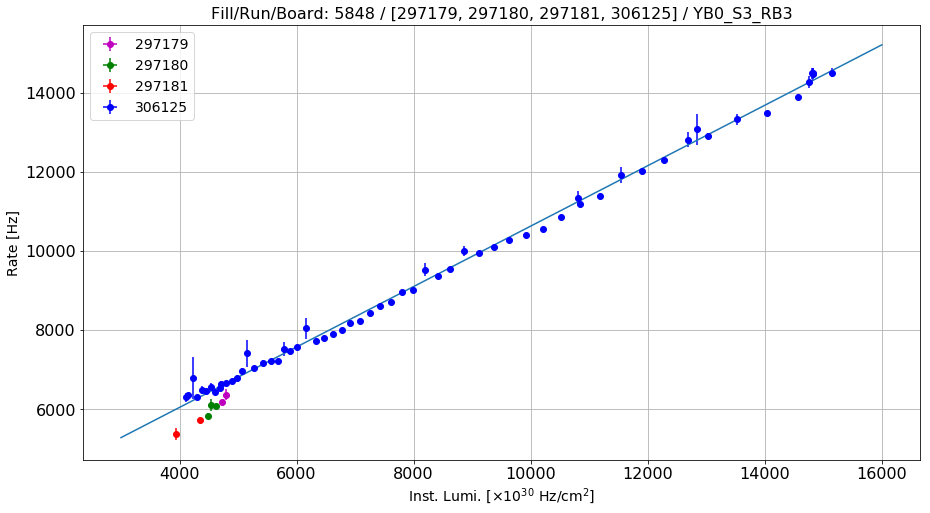

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S3_RB4
Linear fit parameters: [    30.58740988  21628.7026769 ]
Paramenters uncertainty: [  7.17088092e-02   7.00981876e+02]


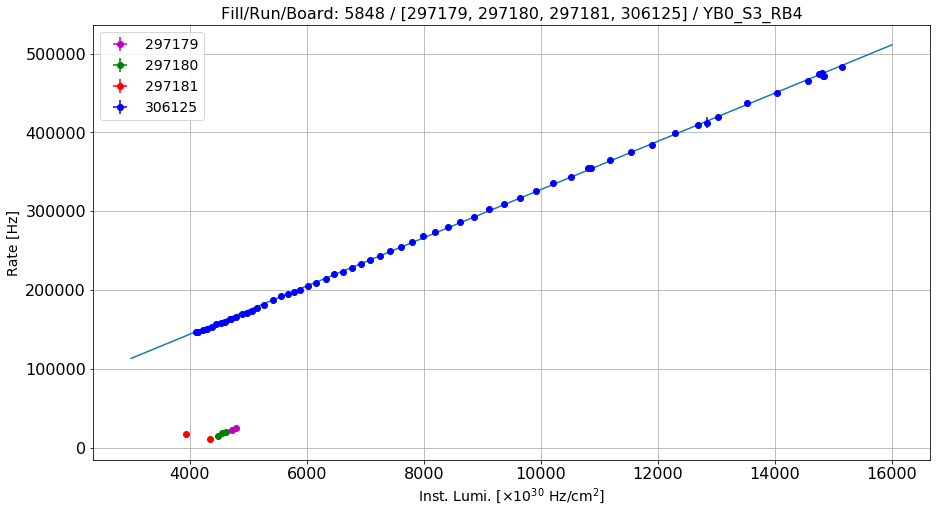

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S4_RB1
Linear fit parameters: [    5.32160915  1847.09999008]
Paramenters uncertainty: [  7.70389872e-03   7.53086467e+01]


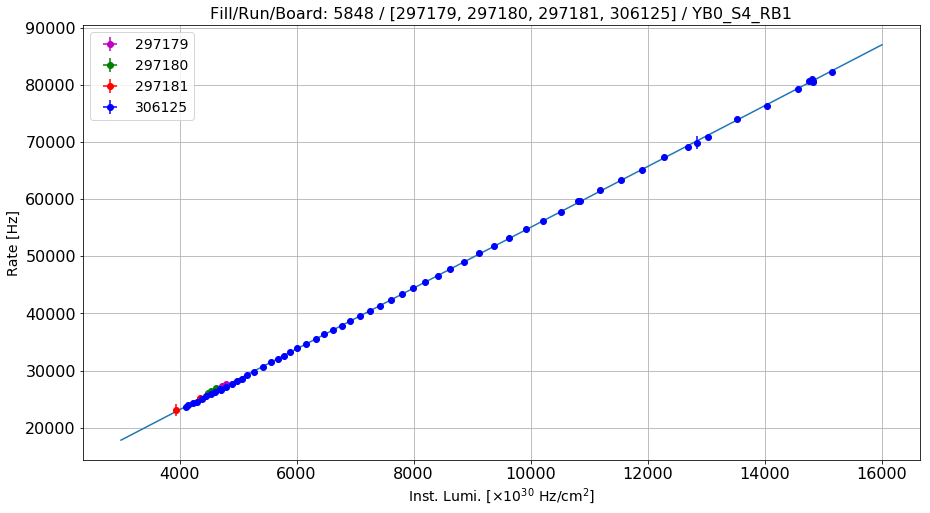

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S4_RB2
Linear fit parameters: [  1.89075698e+00   2.80941102e+03]
Paramenters uncertainty: [  6.00415037e-03   5.86929365e+01]


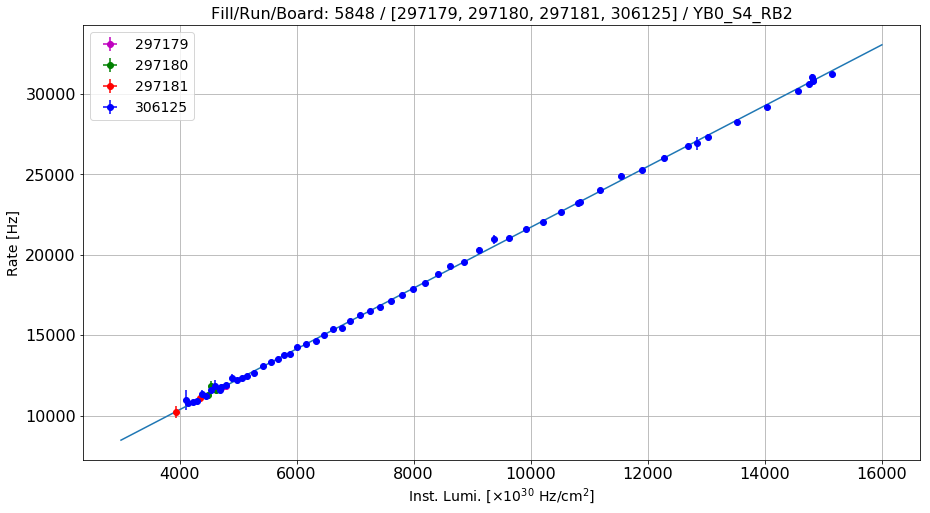

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S4_RB3
Linear fit parameters: [  1.00241585e+00   4.51293376e+03]
Paramenters uncertainty: [  1.21410250e-01   1.18683305e+03]


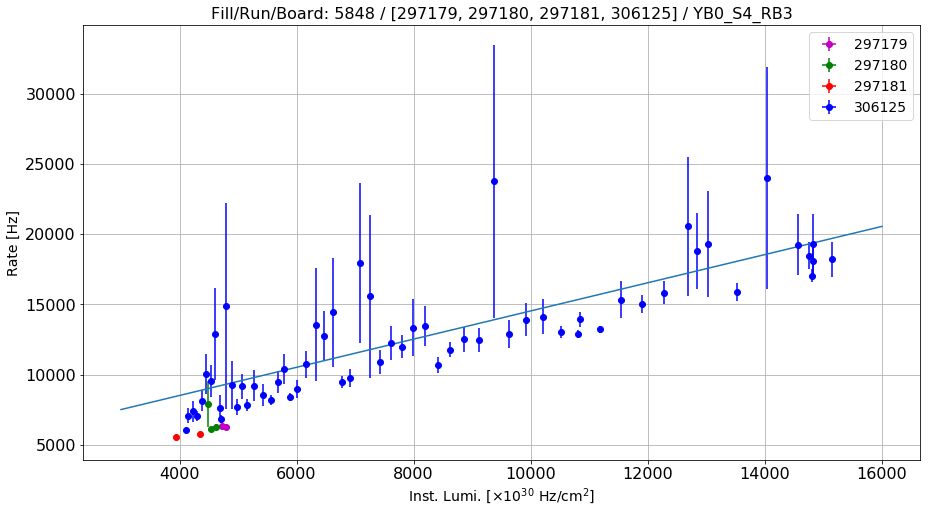

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S4_RB4
Linear fit parameters: [    57.1126601   23047.81681659]
Paramenters uncertainty: [  9.77609492e-02   9.55651813e+02]


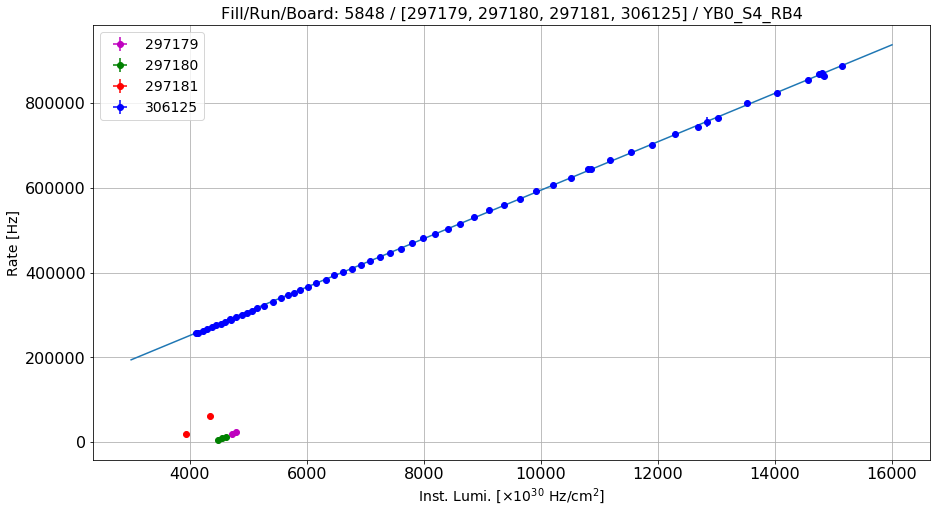

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S5_RB1
Linear fit parameters: [  5.20872682e+00   2.21655875e+04]
Paramenters uncertainty: [  1.57016583e-02   1.53489899e+02]


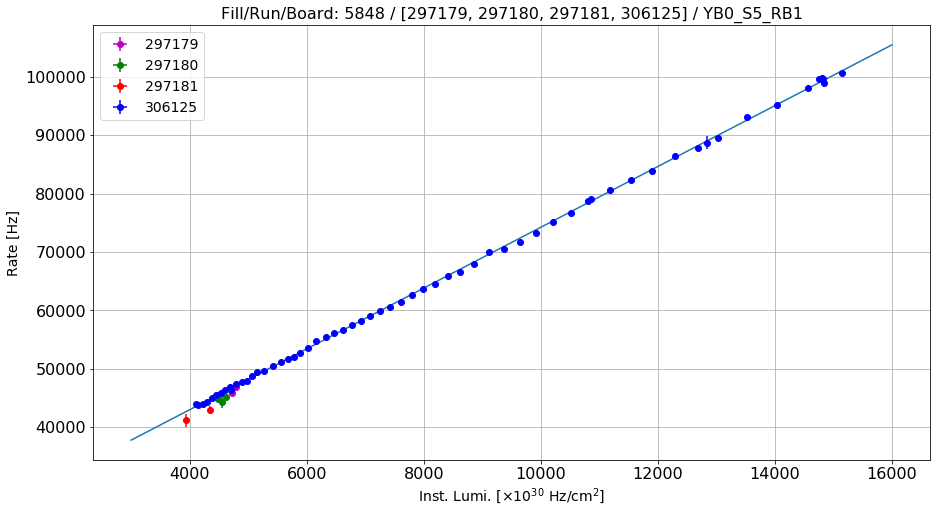

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S5_RB2
Linear fit parameters: [  4.16988467e+00   1.40772032e+05]
Paramenters uncertainty: [  1.42758085e+00   1.39551655e+04]


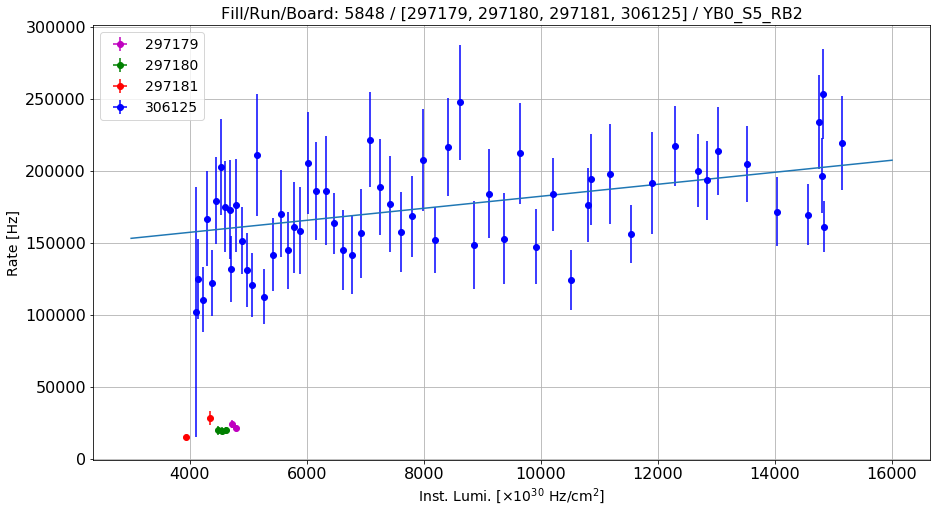

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S5_RB3
Linear fit parameters: [  7.53311554e-01   2.65299280e+03]
Paramenters uncertainty: [  1.17923584e-02   1.15274951e+02]


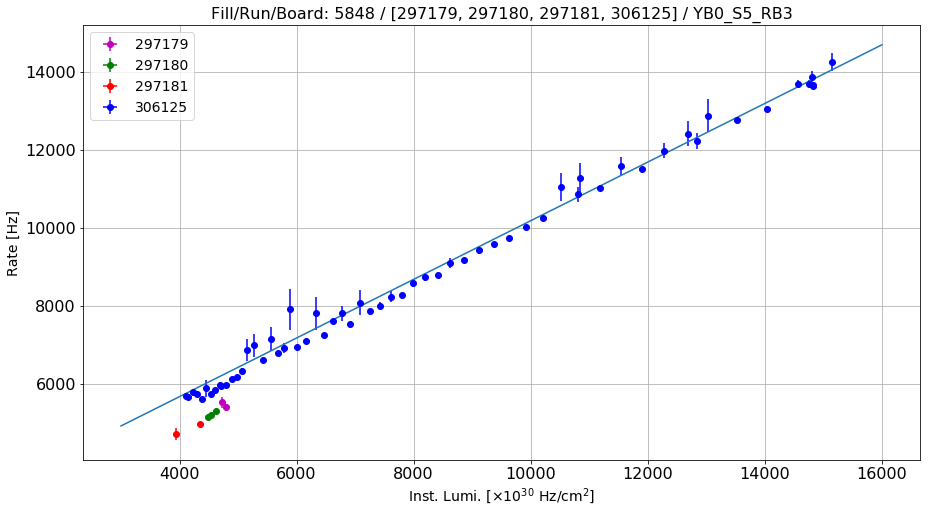

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S5_RB4
Linear fit parameters: [    36.91025527  14829.32543401]
Paramenters uncertainty: [  6.56308496e-02   6.41567425e+02]


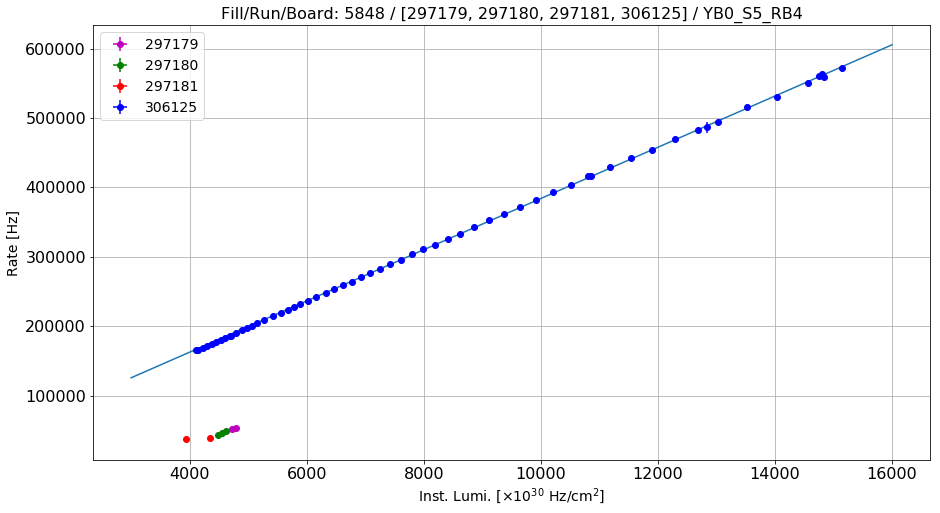

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S6_RB1
Linear fit parameters: [    5.17797641  3133.65583066]
Paramenters uncertainty: [  7.17642741e-03   7.01524067e+01]


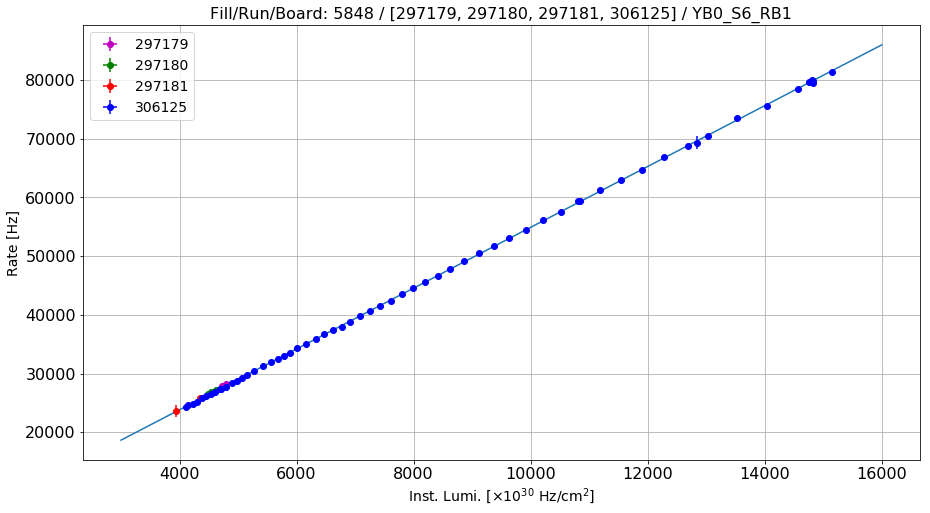

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S6_RB2
Linear fit parameters: [  1.85704804e+00   1.17460600e+04]
Paramenters uncertainty: [  1.25063496e-01   1.22254497e+03]


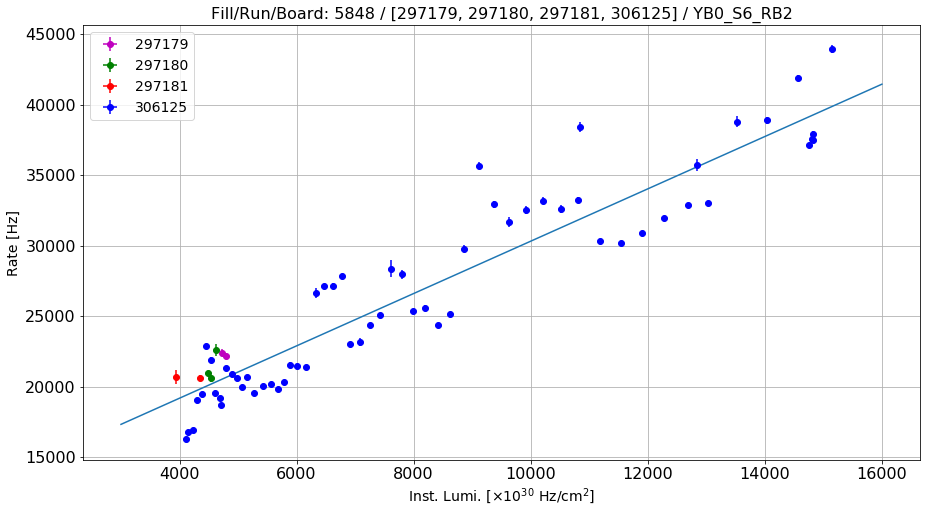

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S6_RB3
Linear fit parameters: [  6.00345733e-01   2.25678657e+03]
Paramenters uncertainty: [  9.93984059e-03   9.71658598e+01]


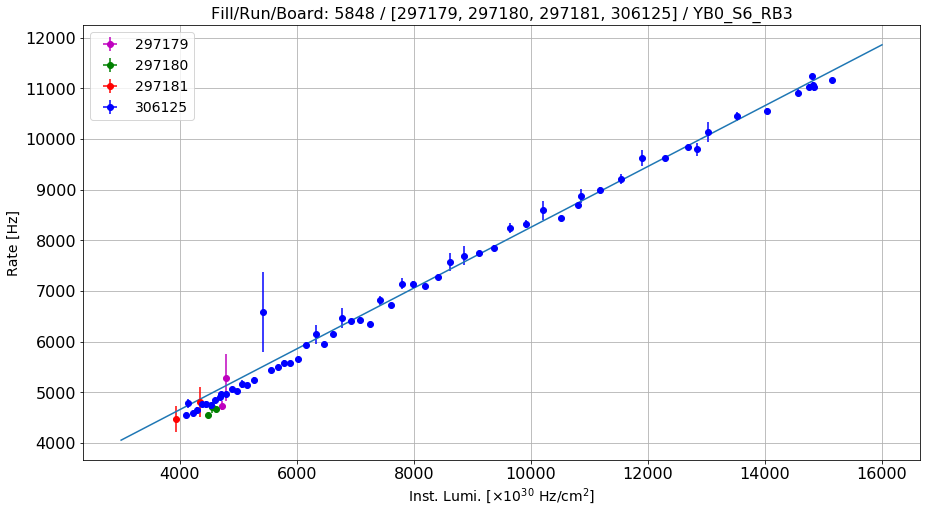

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S6_RB4
Linear fit parameters: [   21.83028066  8760.90045693]
Paramenters uncertainty: [  3.61808290e-02   3.53681865e+02]


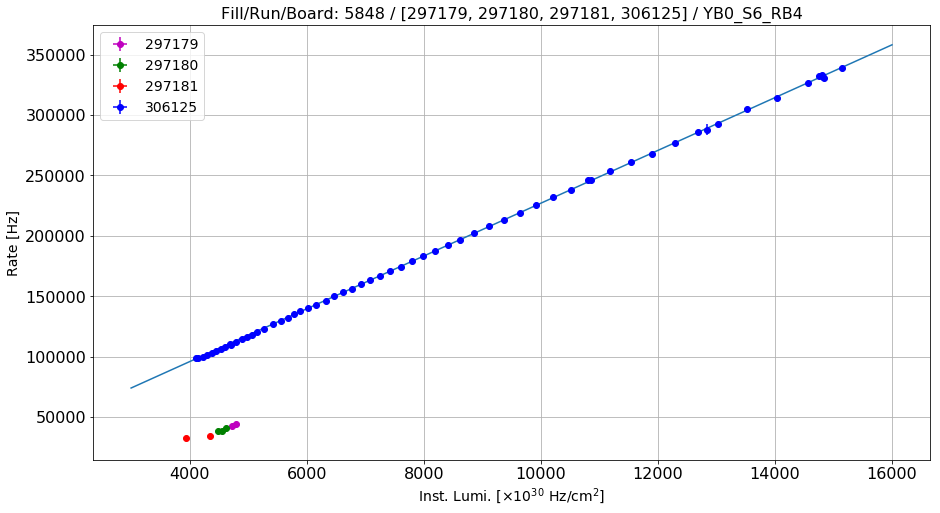

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S7_RB1
Linear fit parameters: [    4.0678299   1856.26827565]
Paramenters uncertainty: [  1.12837741e-02   1.10303340e+02]


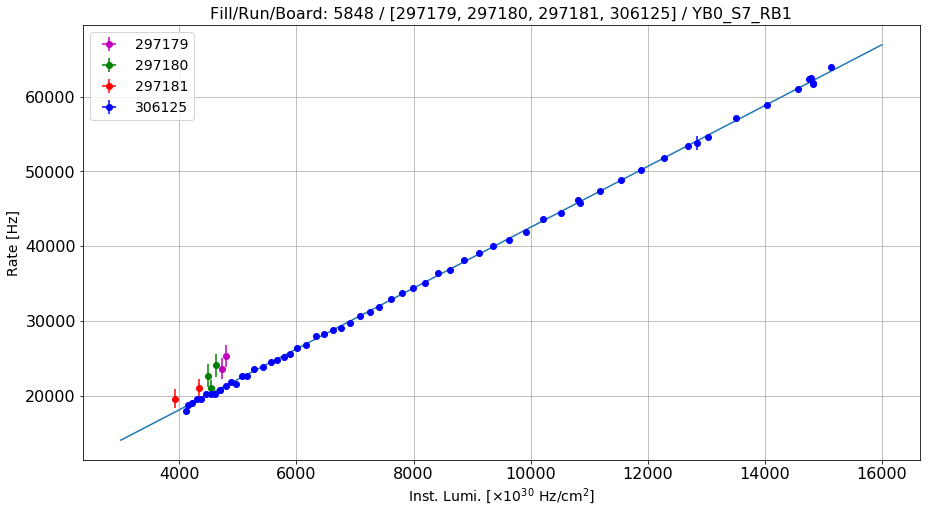

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S7_RB2
Linear fit parameters: [  1.61677080e+00   4.32379013e+03]
Paramenters uncertainty: [  2.27948713e-02   2.22828852e+02]


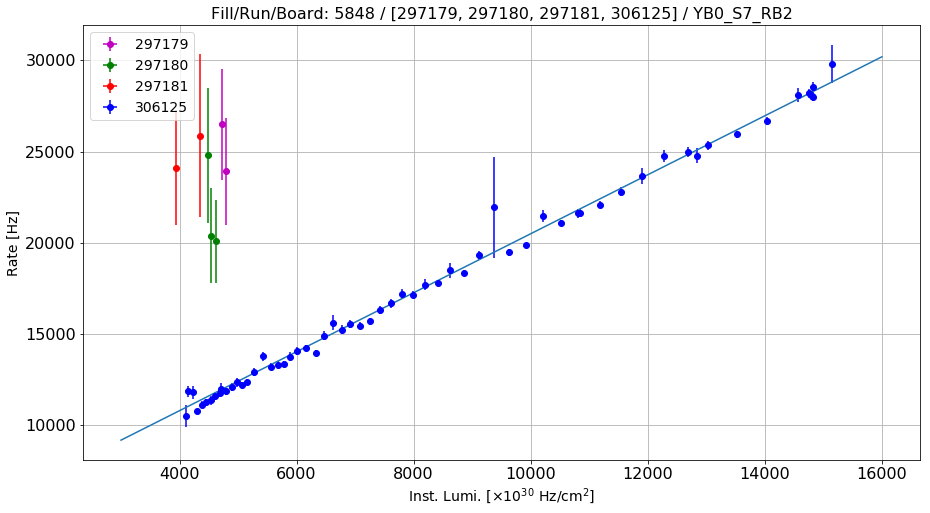

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S7_RB3
Linear fit parameters: [  4.19982366e-01   3.34808949e+03]
Paramenters uncertainty: [  6.42781074e-03   6.28343836e+01]


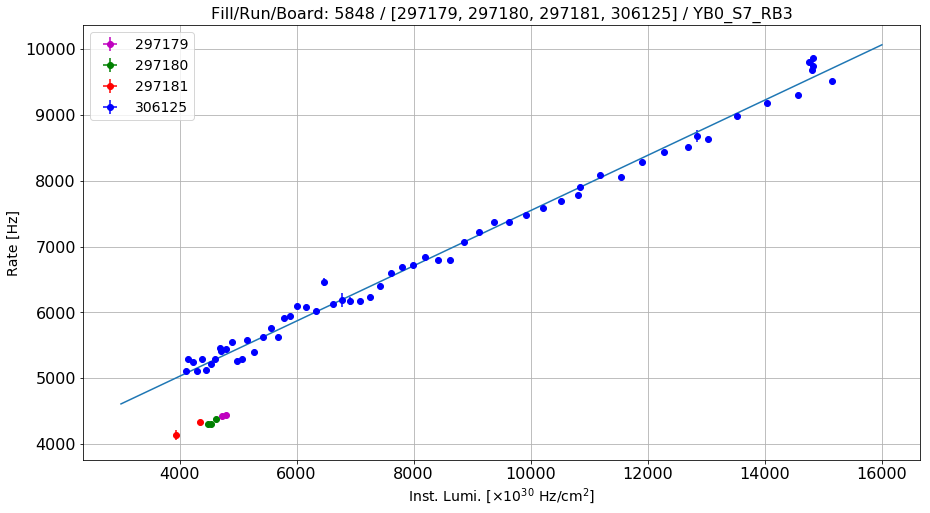

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S7_RB4
Linear fit parameters: [  1.76949012e-03  -3.12789272e+00]
Paramenters uncertainty: [  3.25850746e-04   3.18531948e+00]


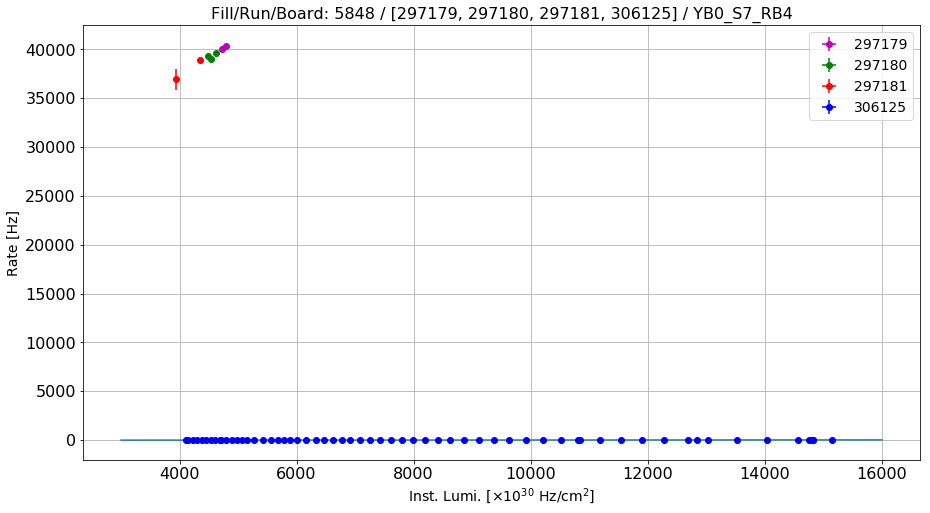

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S8_RB1
Linear fit parameters: [    4.17076949  1448.37466795]
Paramenters uncertainty: [  3.56049485e-02   3.48052406e+02]


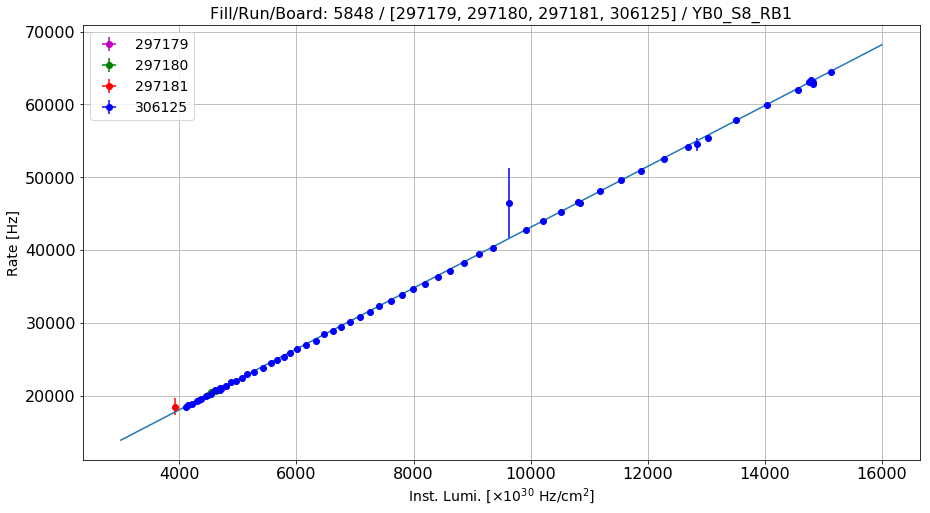

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S8_RB2
Linear fit parameters: [  3.32735251e+00   3.77243373e+04]
Paramenters uncertainty: [  7.83734455e-01   7.66131322e+03]


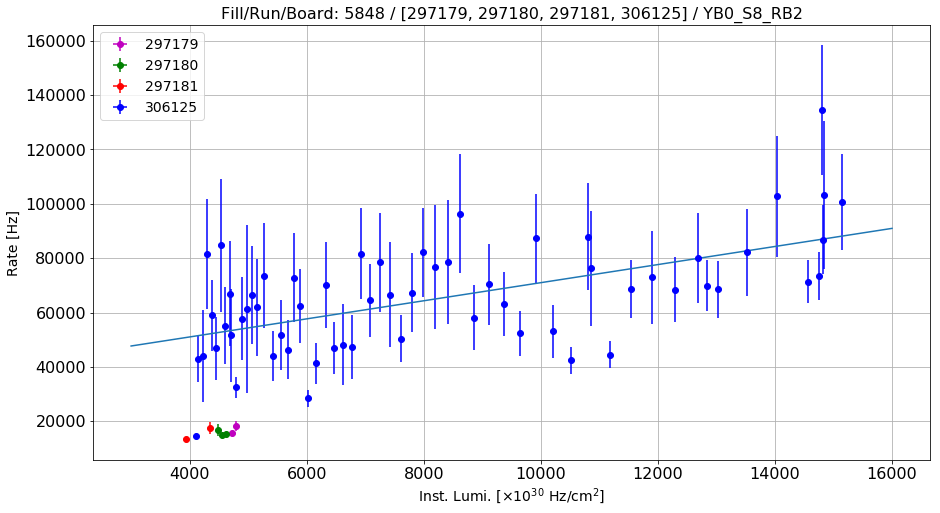

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S8_RB3
Linear fit parameters: [  1.00125690e+00   5.54997926e+04]
Paramenters uncertainty: [  1.15254833e-01   1.12666142e+03]


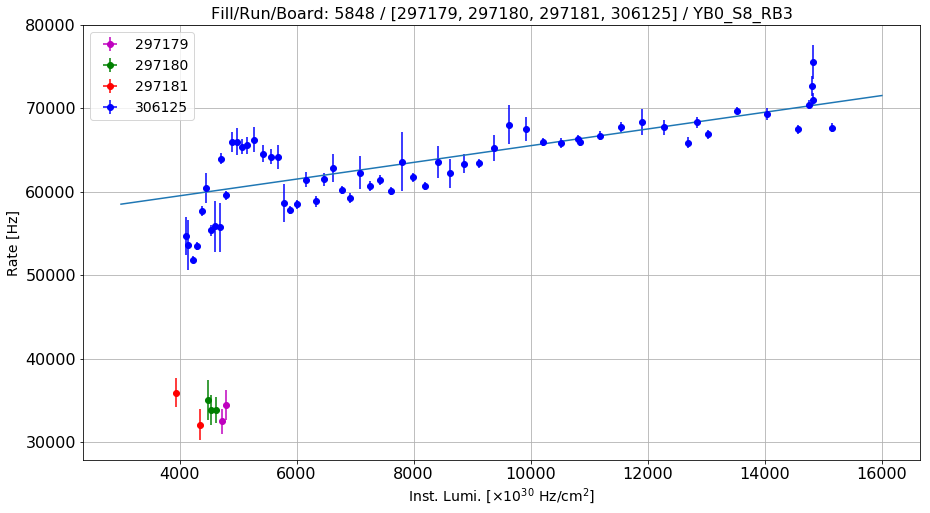

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S8_RB4
Linear fit parameters: [    6.58070448  3544.57705073]
Paramenters uncertainty: [  1.13887399e-02   1.11329421e+02]


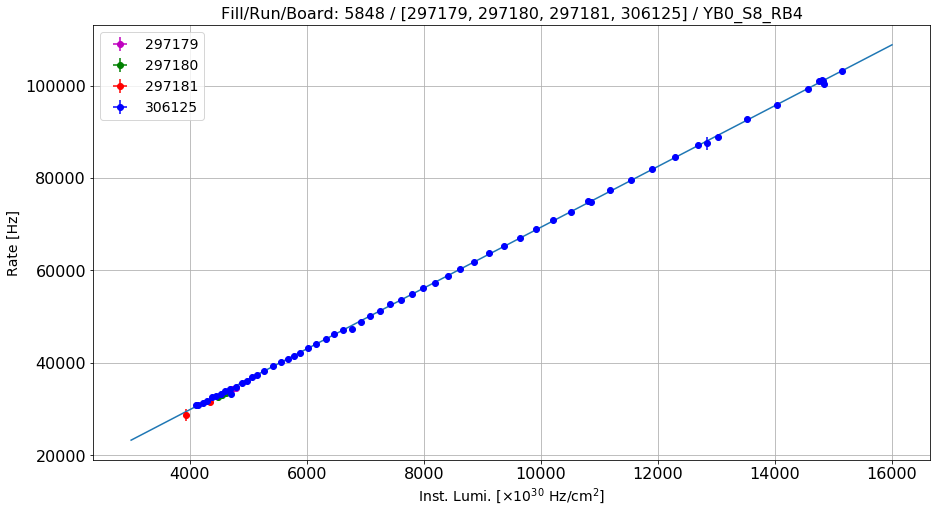

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S9_RB1
Linear fit parameters: [    5.40611231  3398.64618773]
Paramenters uncertainty: [  1.87182496e-02   1.82978268e+02]


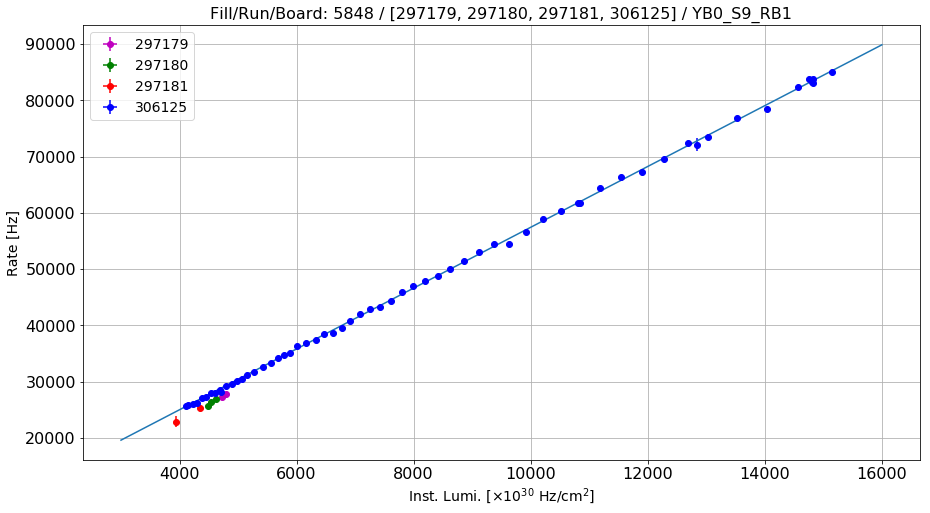

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S9_RB2
Linear fit parameters: [  1.16589168e+01  -4.76727026e+04]
Paramenters uncertainty: [  3.37668783e+00   2.45051347e+04]


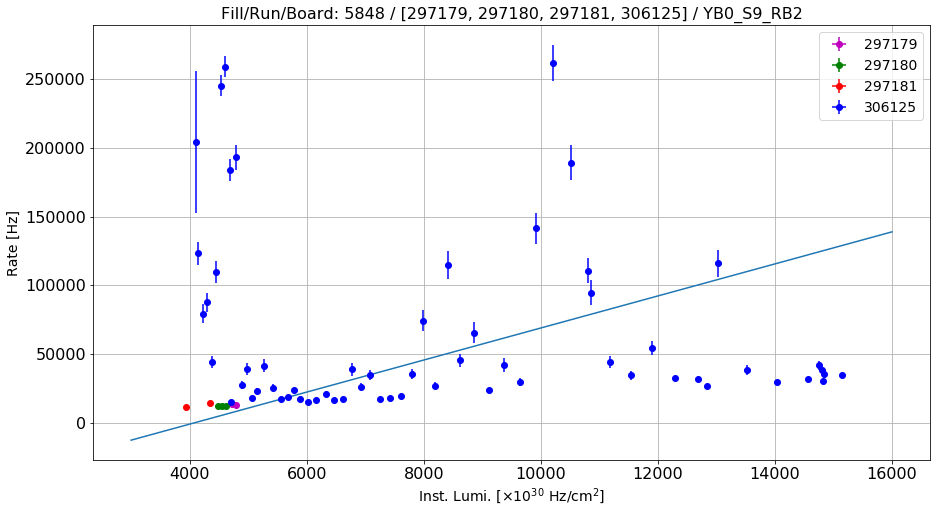

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S9_RB3
Linear fit parameters: [  3.53640965e-01   2.40445368e+03]
Paramenters uncertainty: [  2.46673498e-03   2.41133067e+01]


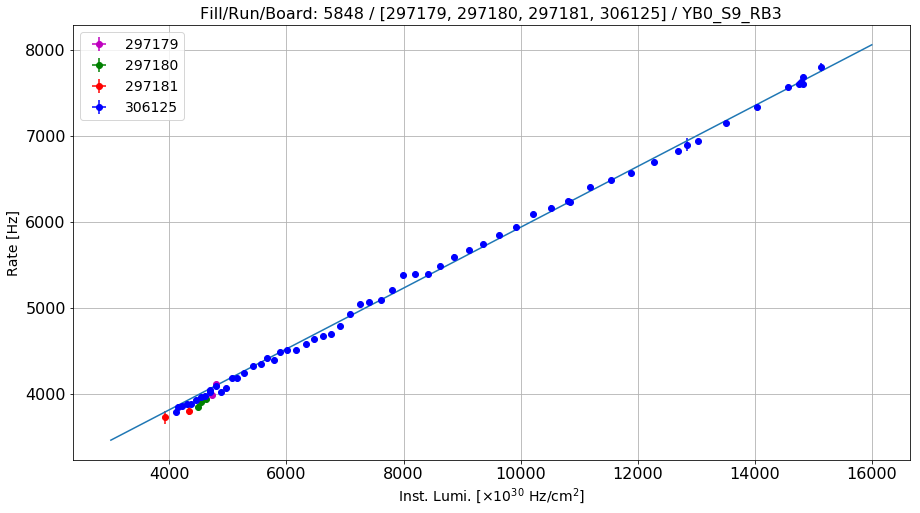

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S9_RB4
Linear fit parameters: [  4.18619432e-01   3.25894172e+03]
Paramenters uncertainty: [  1.91056321e-02   1.86765085e+02]


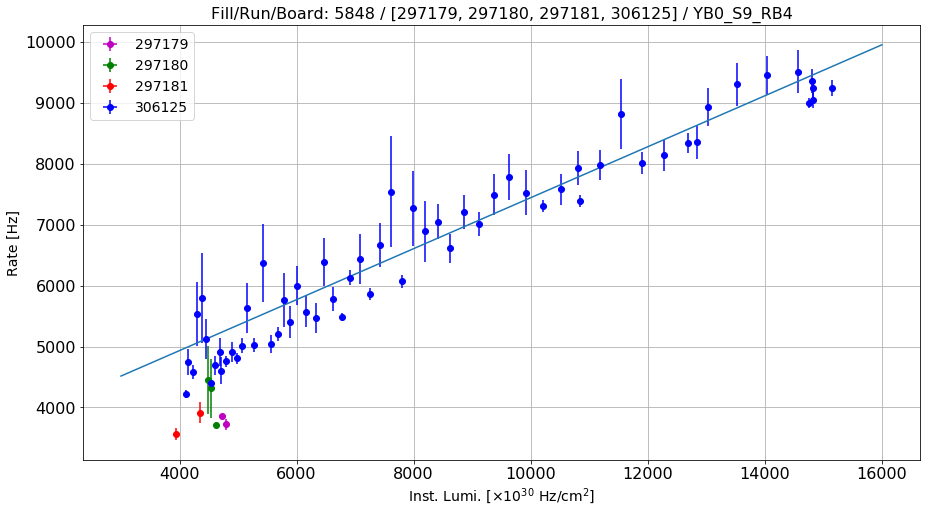

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S10_RB1
Linear fit parameters: [    5.06602281  1919.30713981]
Paramenters uncertainty: [  7.40365143e-03   7.23736111e+01]


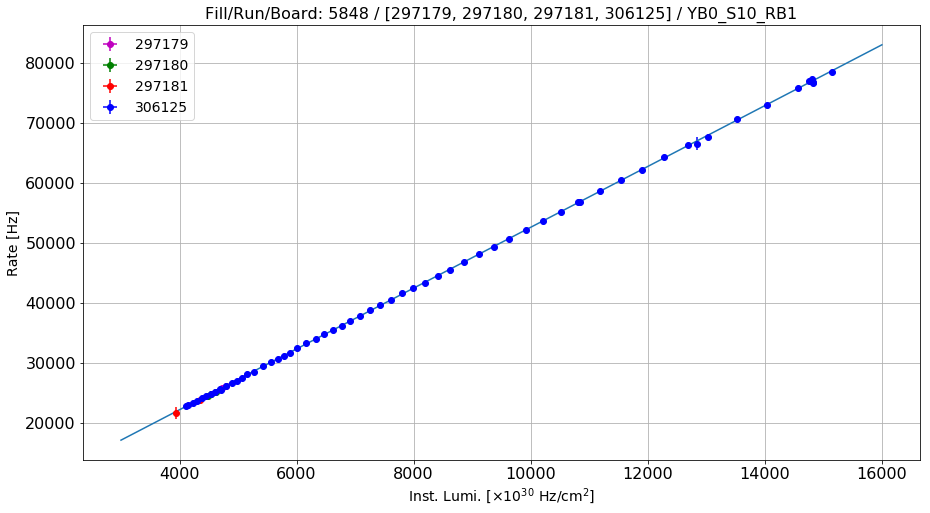

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S10_RB2
Linear fit parameters: [  1.67882091e+00   3.10875513e+03]
Paramenters uncertainty: [  5.36561247e-03   5.24509769e+01]


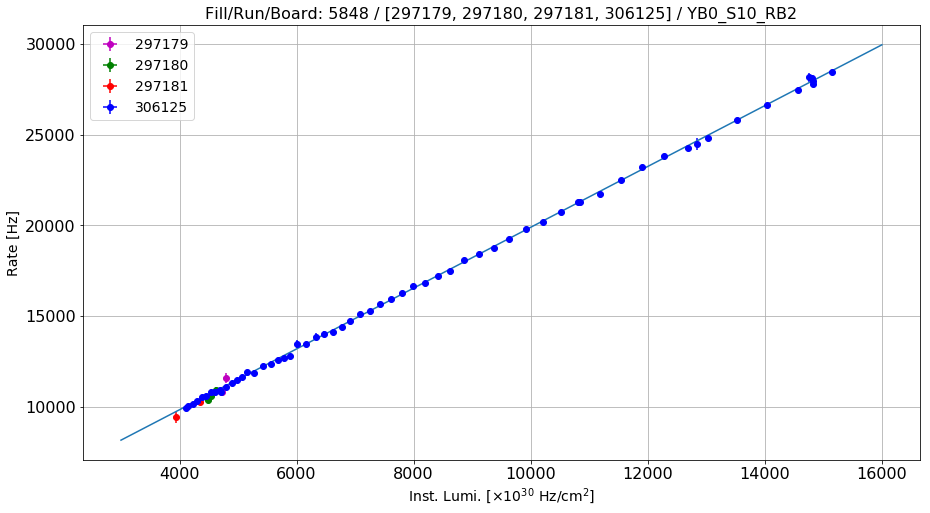

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S10_RB3
Linear fit parameters: [  2.83437697e-01   2.95520678e+03]
Paramenters uncertainty: [  5.76199068e-03   5.63257301e+01]


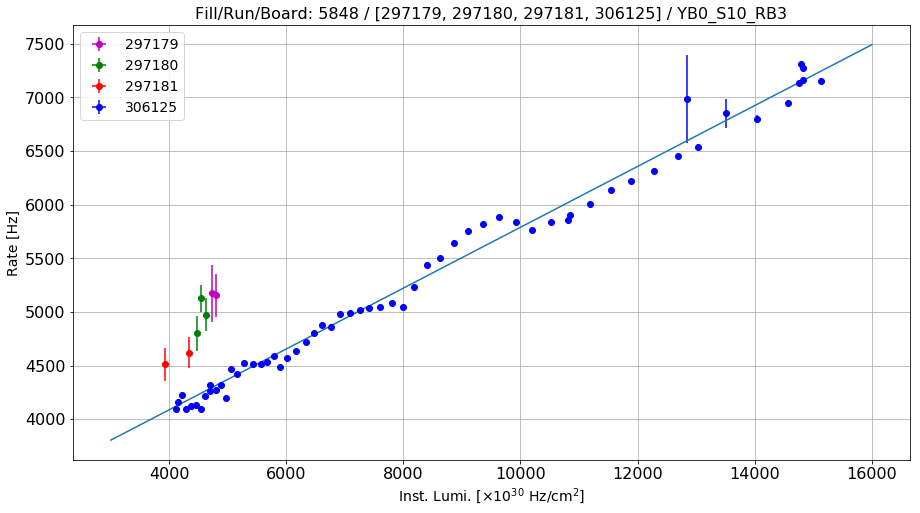

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S10_RB4
Linear fit parameters: [  8.14414156e-01   2.61057474e+03]
Paramenters uncertainty: [  5.57939129e-03   5.45407491e+01]


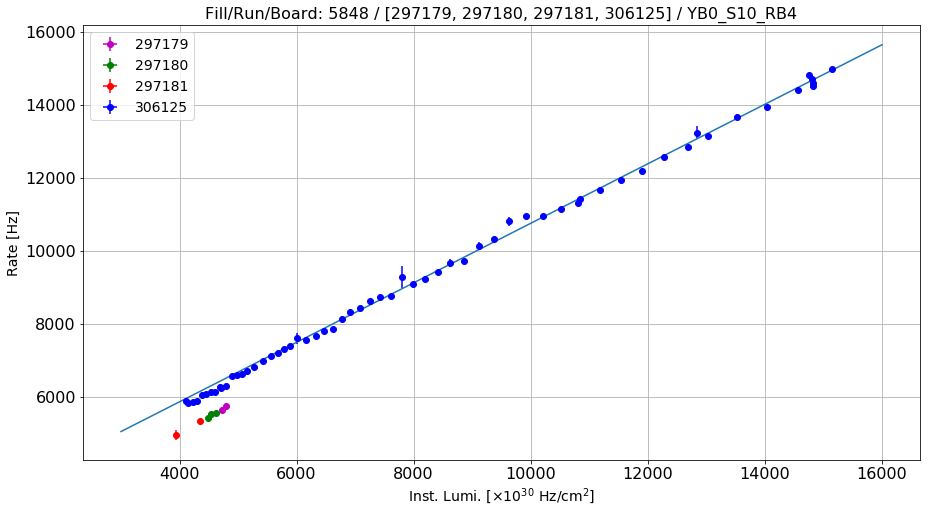

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S11_RB1
Linear fit parameters: [  5.23200694e+00   8.40863672e+03]
Paramenters uncertainty: [  5.44607689e-02   5.32375482e+02]


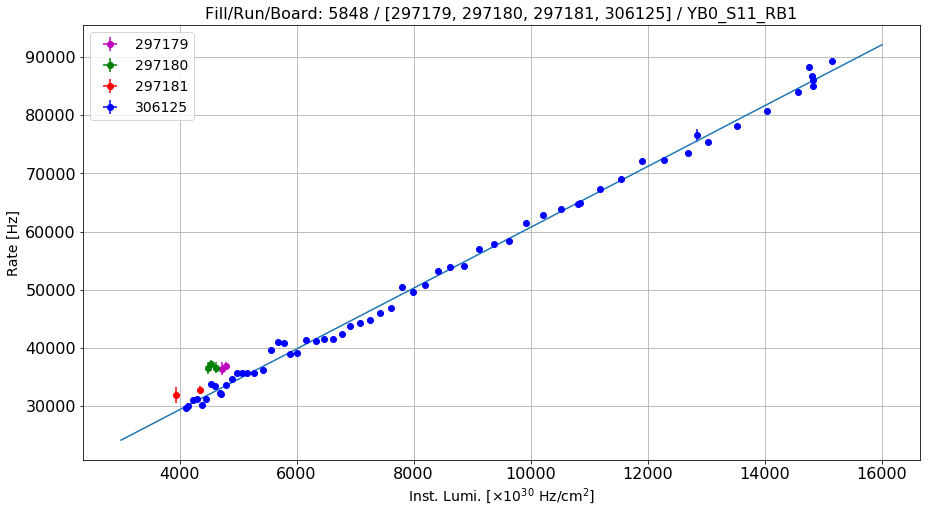

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S11_RB2
Linear fit parameters: [  1.71233981e+00   6.93581422e+03]
Paramenters uncertainty: [  2.91540498e-02   2.84992329e+02]


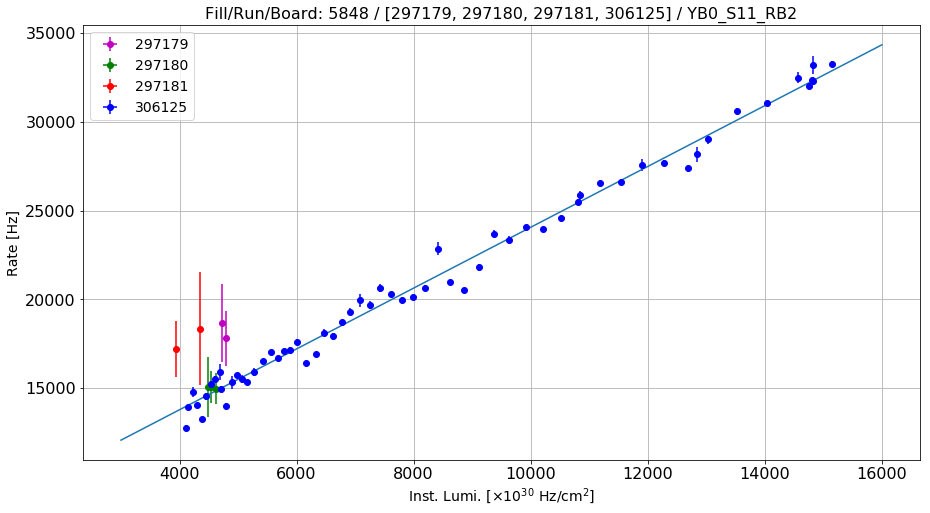

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S11_RB3
Linear fit parameters: [  2.81049736e-01   2.80717823e+03]
Paramenters uncertainty: [  1.04623724e-02   1.02273815e+02]


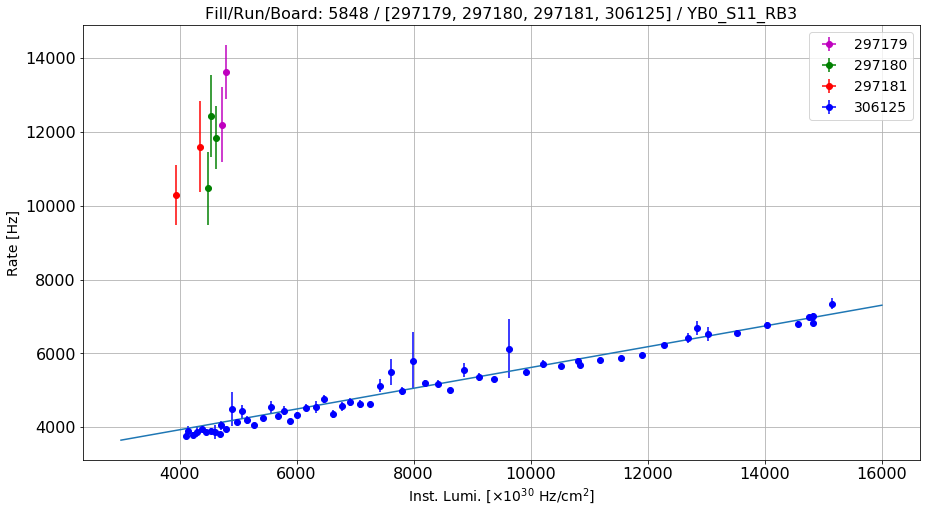

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S11_RB4
Linear fit parameters: [  3.51294944e-01   5.81862915e+03]
Paramenters uncertainty: [  7.30737129e-03   7.14324348e+01]


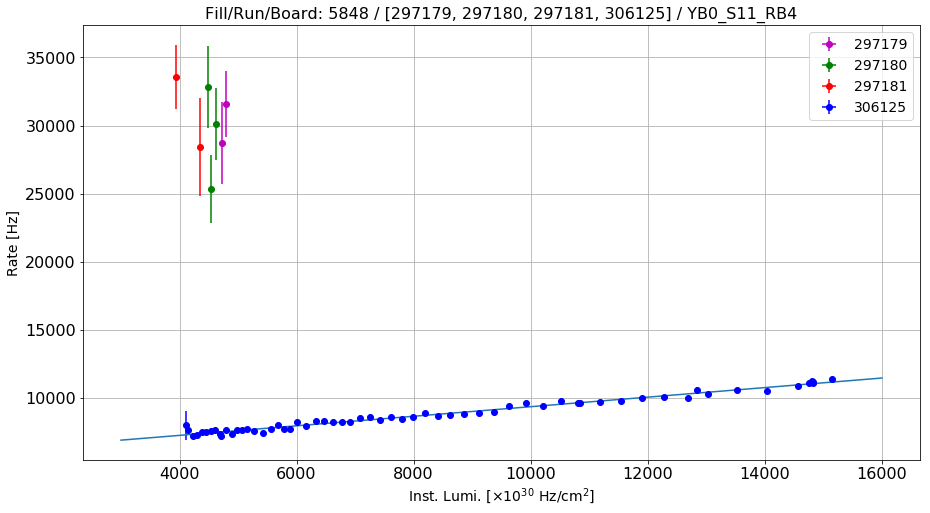

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S12_RB1
Linear fit parameters: [    4.96582553  4202.64144336]
Paramenters uncertainty: [  3.29821675e-02   3.22413688e+02]


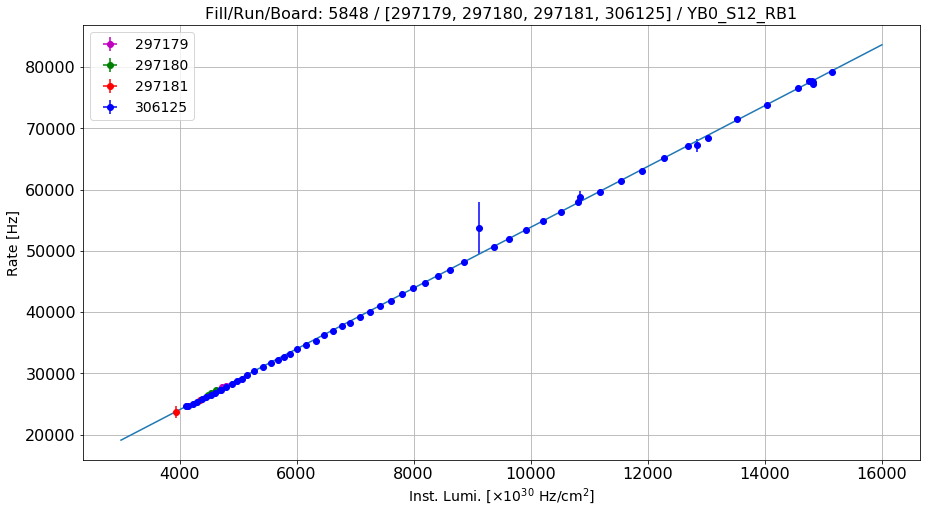

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S12_RB2
Linear fit parameters: [  1.78036373e+00   1.15262864e+04]
Paramenters uncertainty: [  3.42306224e-02   3.34617827e+02]


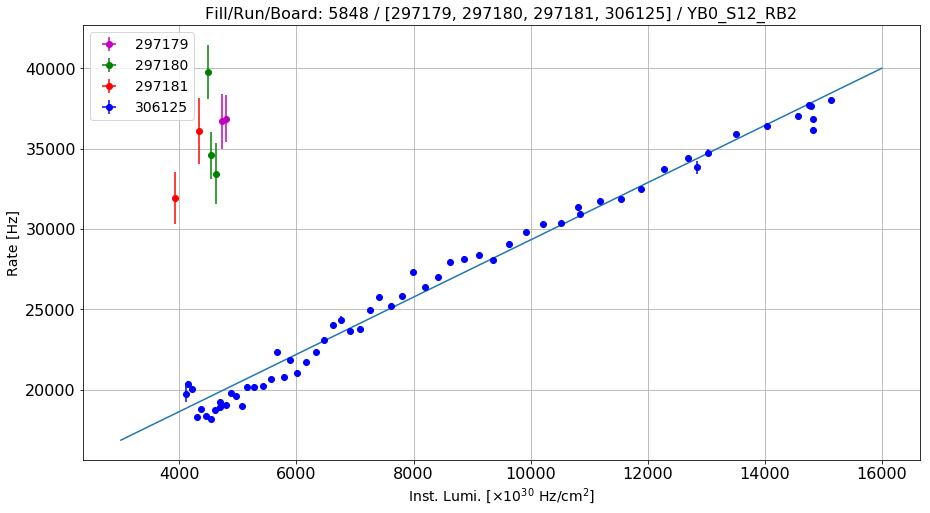

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S12_RB3
Linear fit parameters: [  5.14285765e-01   1.91716390e+04]
Paramenters uncertainty: [  5.27758831e-02   5.15905060e+02]


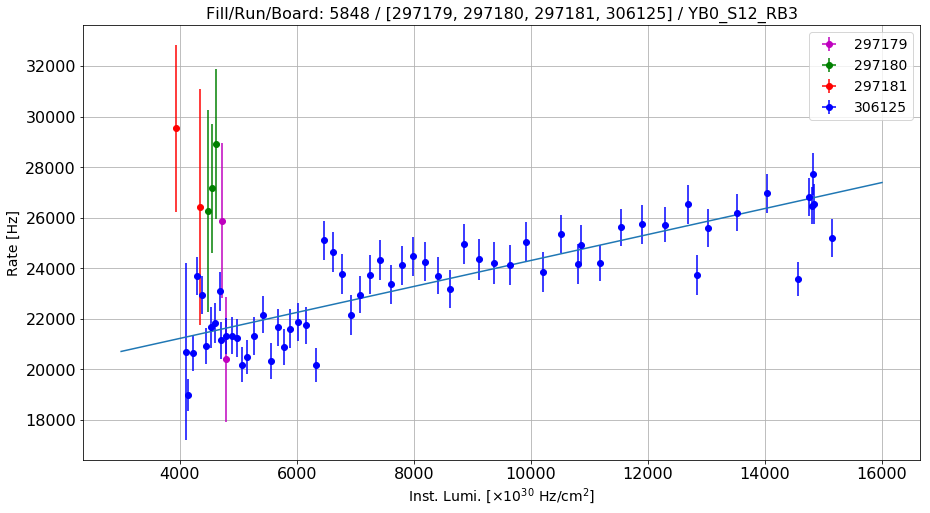

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB0_S12_RB4
Linear fit parameters: [    5.78542231  3525.51537202]
Paramenters uncertainty: [  9.97391467e-03   9.74989473e+01]


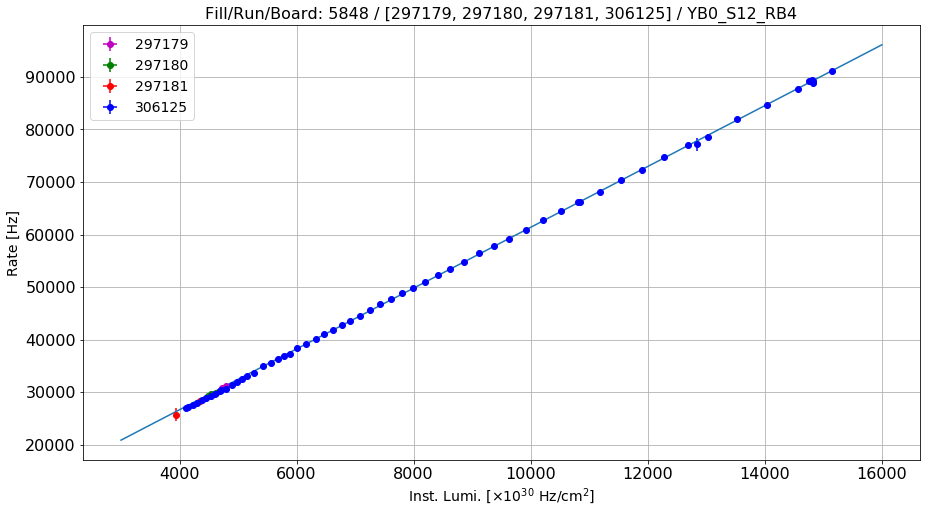

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S1_RB1
Linear fit parameters: [   12.2110228   1660.31606287]
Paramenters uncertainty: [  2.09500267e-02   2.04794769e+02]


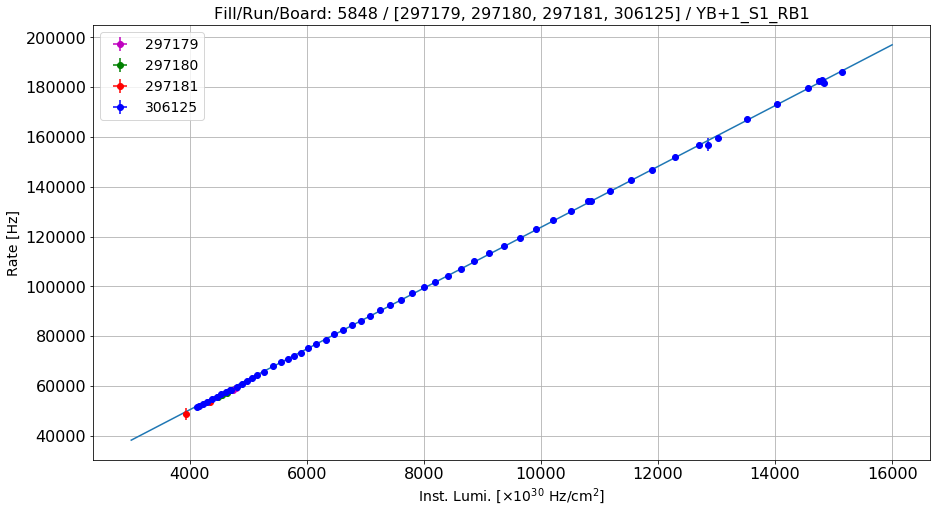

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S1_RB2
Linear fit parameters: [    4.32044559  4165.19378165]
Paramenters uncertainty: [  2.60173102e-02   2.54329463e+02]


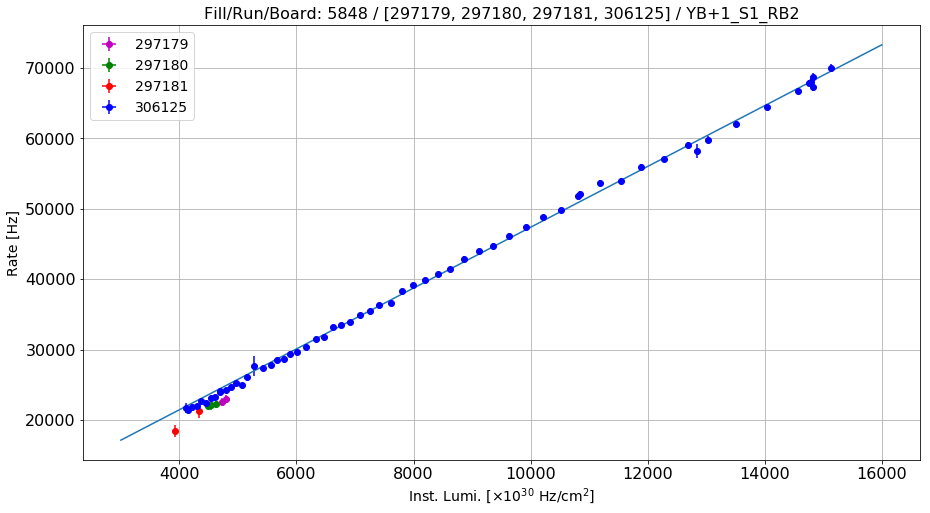

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S1_RB3
Linear fit parameters: [  6.30965981e-01   9.78036838e+04]
Paramenters uncertainty: [  5.46654647e-02   5.34376465e+02]


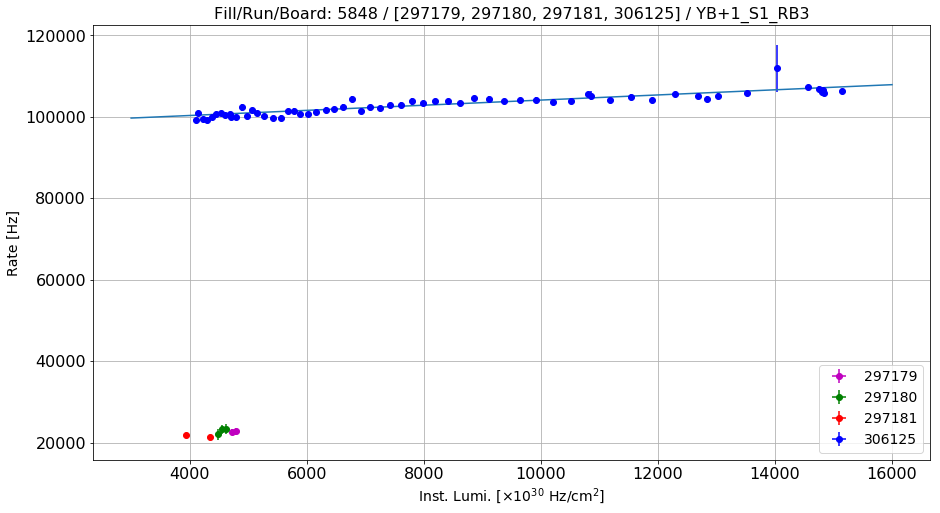

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S1_RB4
Linear fit parameters: [   17.8971011   9981.49815966]
Paramenters uncertainty: [  3.30445865e-02   3.23023858e+02]


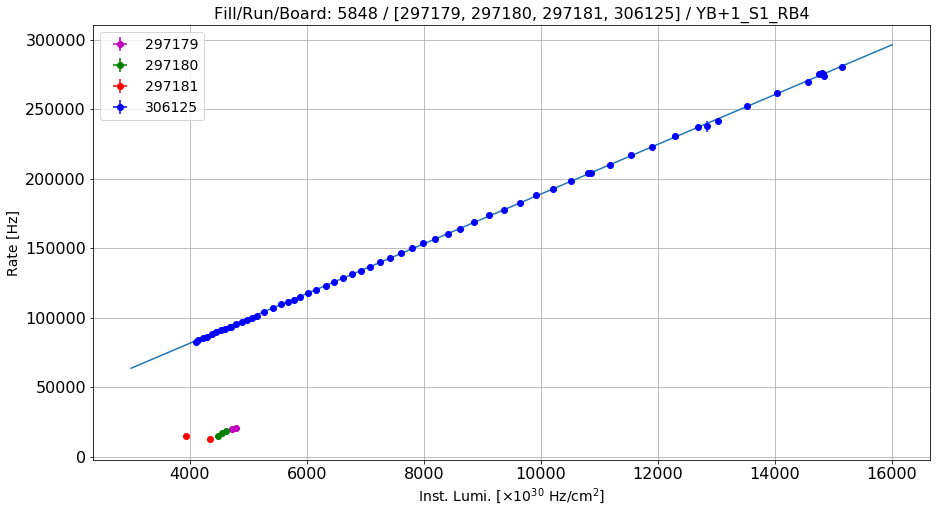

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S2_RB1
Linear fit parameters: [   16.35175997  8752.95091774]
Paramenters uncertainty: [  3.12516185e-02   3.05496890e+02]


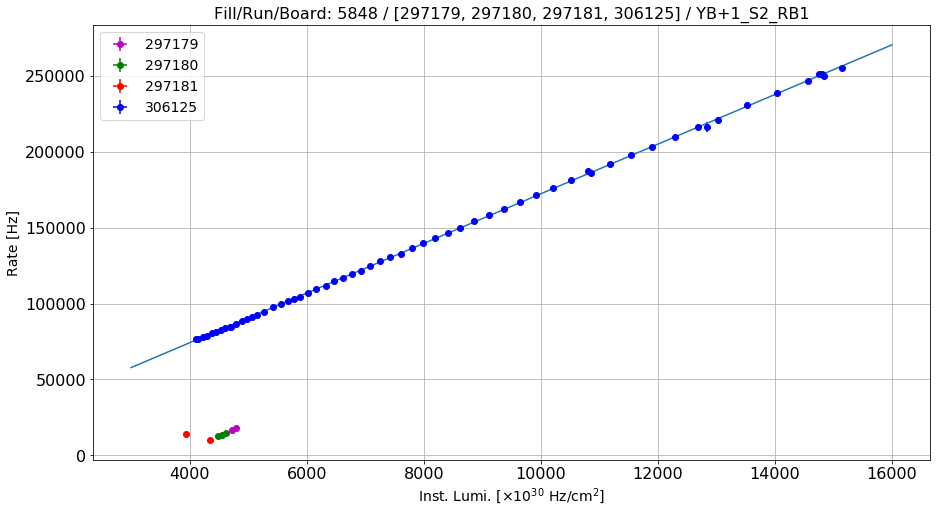

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S2_RB2
Linear fit parameters: [  3.54347646e+00   6.86138516e+03]
Paramenters uncertainty: [  1.34729214e-02   1.31703117e+02]


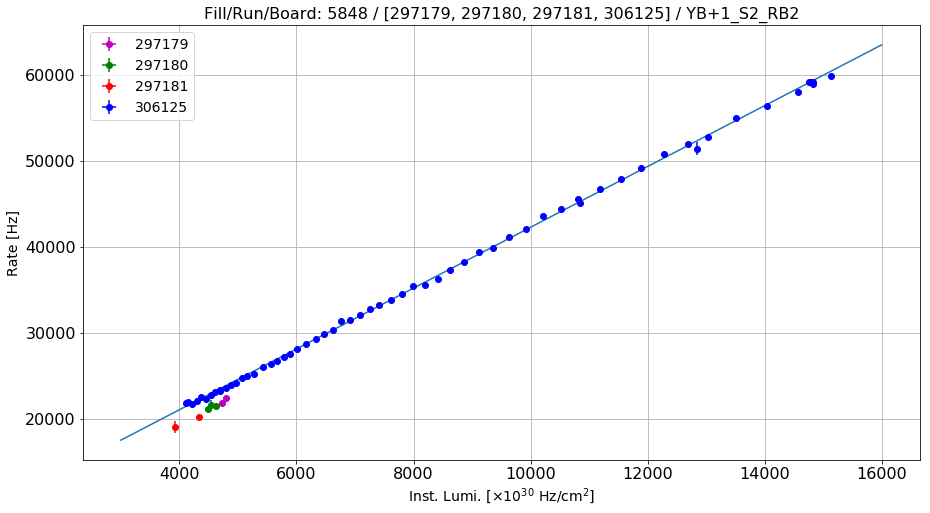

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S2_RB3
Linear fit parameters: [  7.37843754e-01   7.99045790e+03]
Paramenters uncertainty: [  9.89086630e-03   9.66871168e+01]


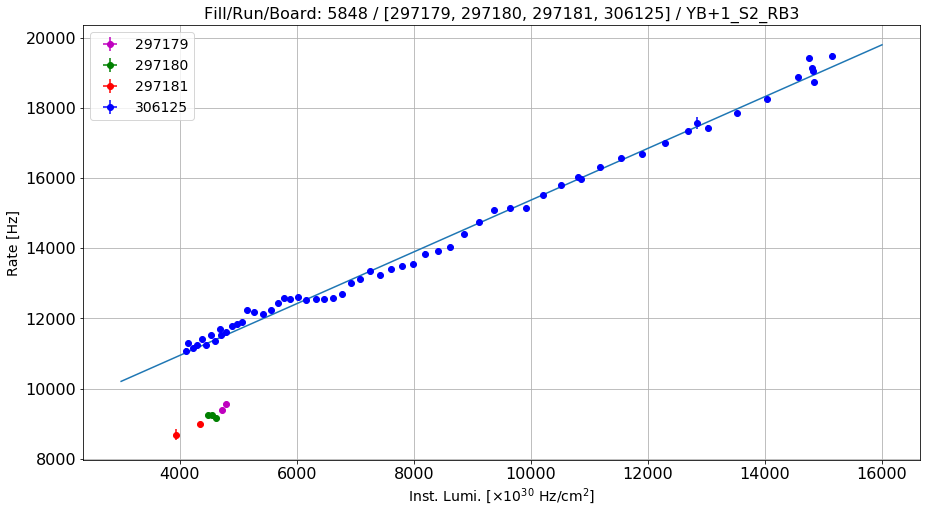

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S2_RB4
Linear fit parameters: [   24.44814287  9390.64912634]
Paramenters uncertainty: [  4.19211759e-02   4.09796019e+02]


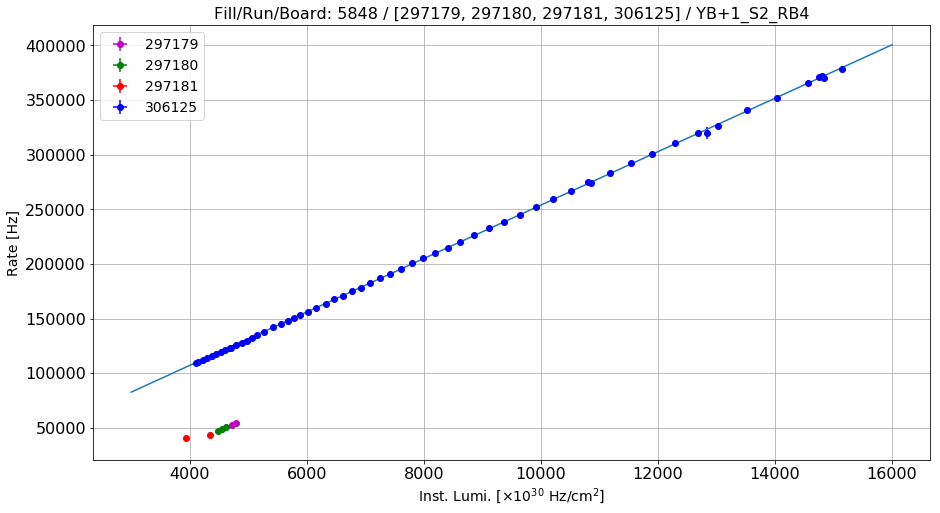

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S3_RB1
Linear fit parameters: [   13.4072826  3245.8576578]
Paramenters uncertainty: [  4.54932462e-02   4.44714414e+02]


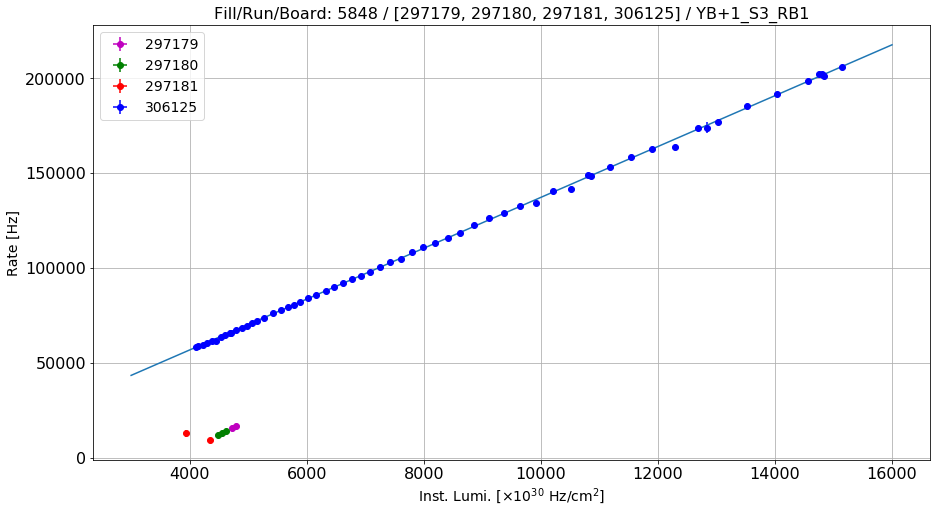

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S3_RB2
Linear fit parameters: [  3.59083788e+00   4.69101887e+03]
Paramenters uncertainty: [  8.47322852e-03   8.28291487e+01]


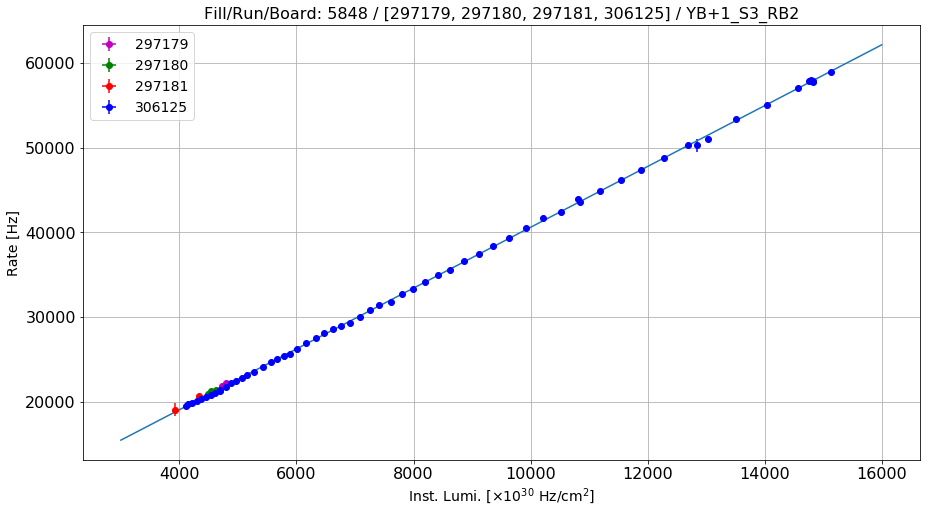

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S3_RB3
Linear fit parameters: [  1.03717824e+00   3.28595363e+03]
Paramenters uncertainty: [  5.44967200e-02   5.32726919e+02]


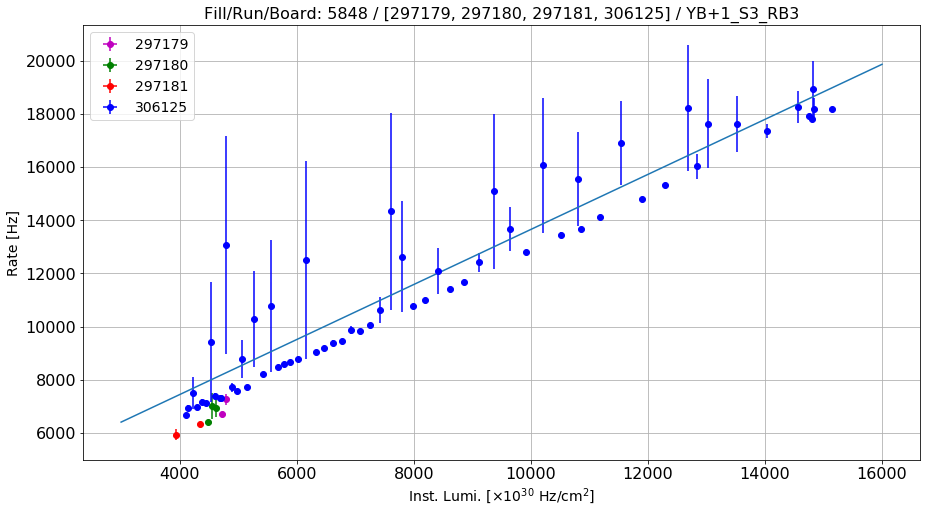

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S3_RB4
Linear fit parameters: [    42.01724839  14480.74147613]
Paramenters uncertainty: [  9.28813842e-02   9.07952142e+02]


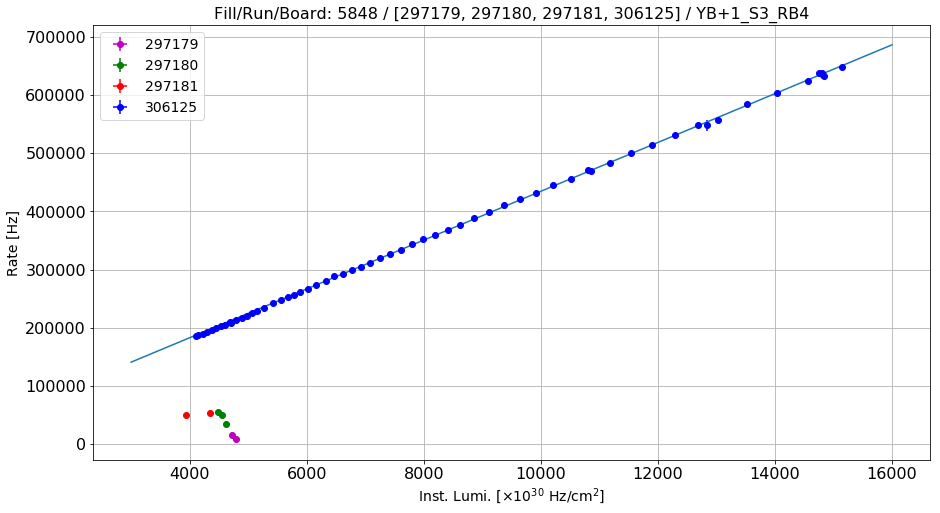

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S4_RB1
Linear fit parameters: [   15.02979528  4273.99601416]
Paramenters uncertainty: [  3.17396442e-02   3.10267532e+02]


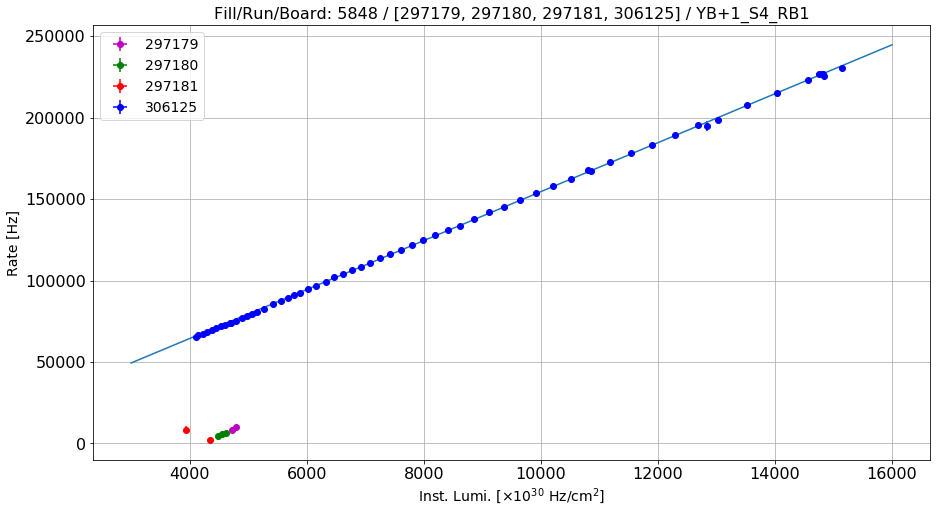

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S4_RB2
Linear fit parameters: [  7.43924653e+00   6.35257727e+05]
Paramenters uncertainty: [  4.62860868e+00   4.52464743e+04]


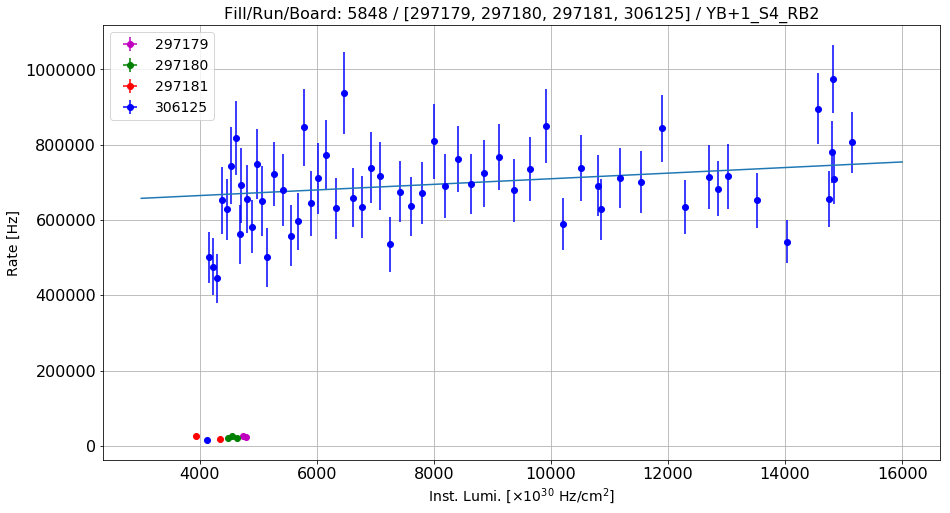

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S4_RB3
Linear fit parameters: [  1.00256135e+00   1.55410853e+03]
Paramenters uncertainty: [  1.79019787e-02   1.74998898e+02]


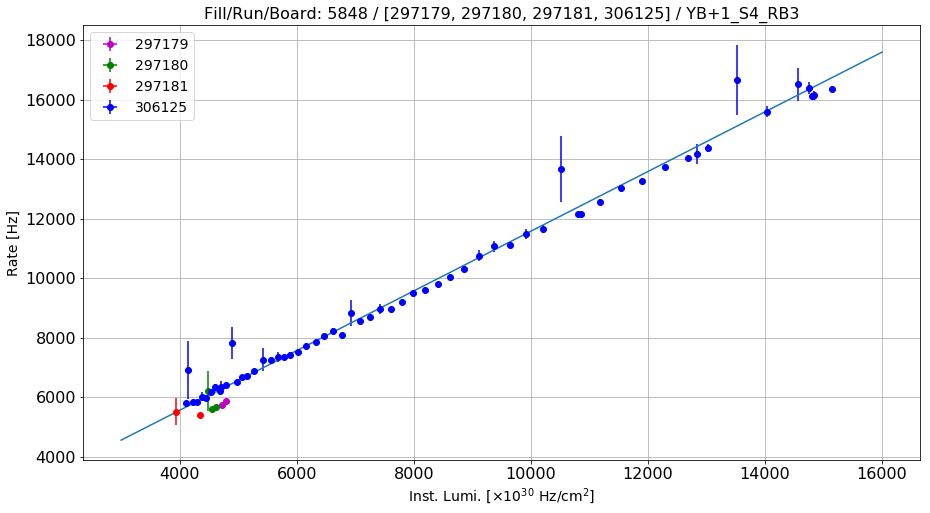

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S4_RB4
Linear fit parameters: [  4.08645155e-04  -6.51673670e-01]
Paramenters uncertainty: [  9.08432875e-05   8.88028943e-01]


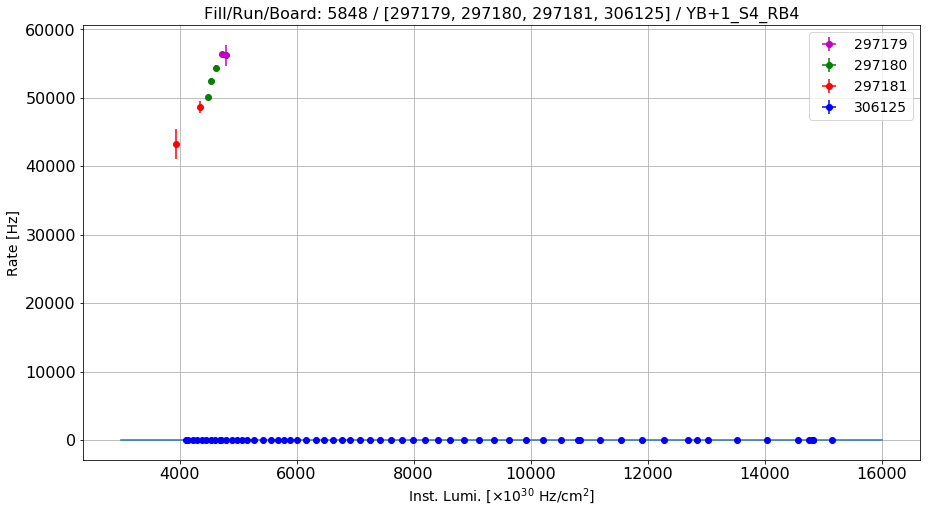

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S5_RB1
Linear fit parameters: [   16.51399408  9224.51263244]
Paramenters uncertainty: [  5.28599090e-02   5.16726447e+02]


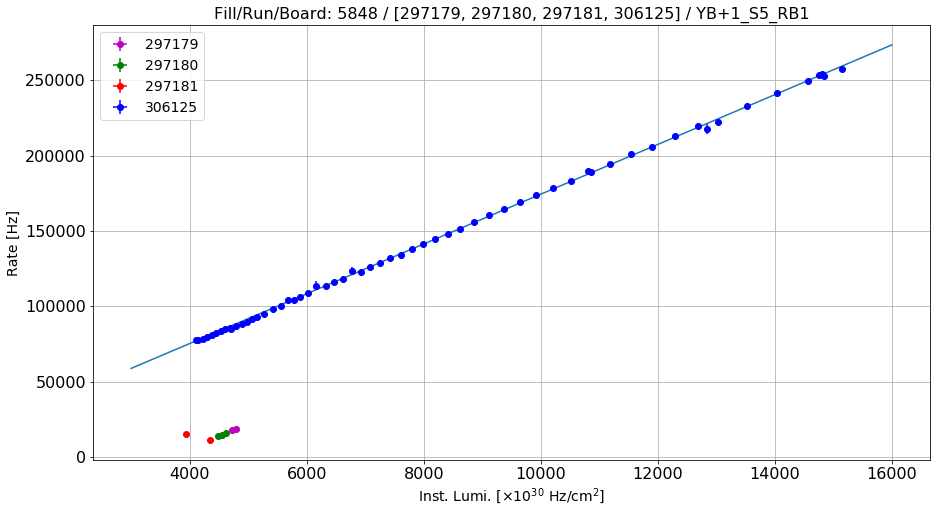

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S5_RB2
Linear fit parameters: [  3.27660039e+00   4.71156732e+03]
Paramenters uncertainty: [  1.55291059e-02   1.51803132e+02]


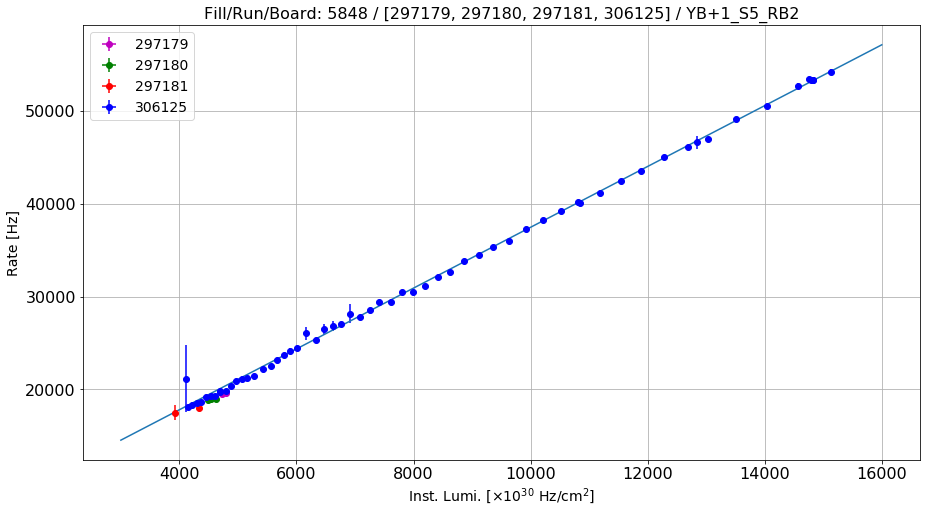

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S5_RB3
Linear fit parameters: [  8.11588440e-01   2.01867327e+03]
Paramenters uncertainty: [  1.72290161e-02   1.68420424e+02]


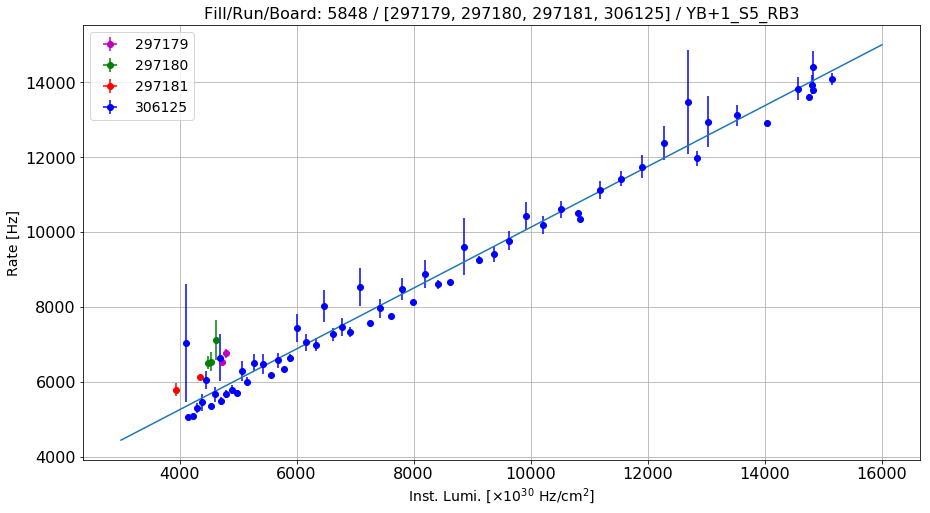

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S5_RB4
Linear fit parameters: [    40.40388204  21921.18159906]
Paramenters uncertainty: [  8.60930325e-02   8.41593328e+02]


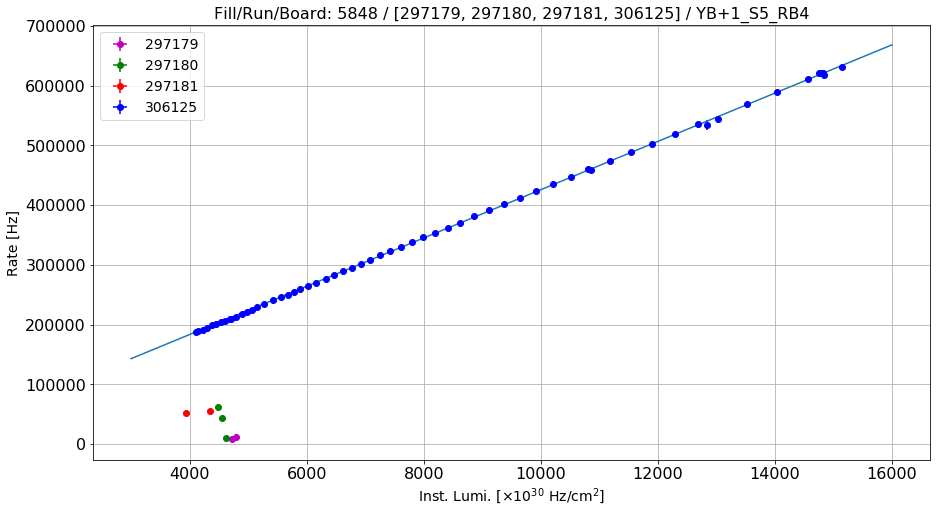

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S6_RB1
Linear fit parameters: [ -3.85653726e+00   2.01826294e+06]
Paramenters uncertainty: [  5.81824600e+00   5.68756480e+04]


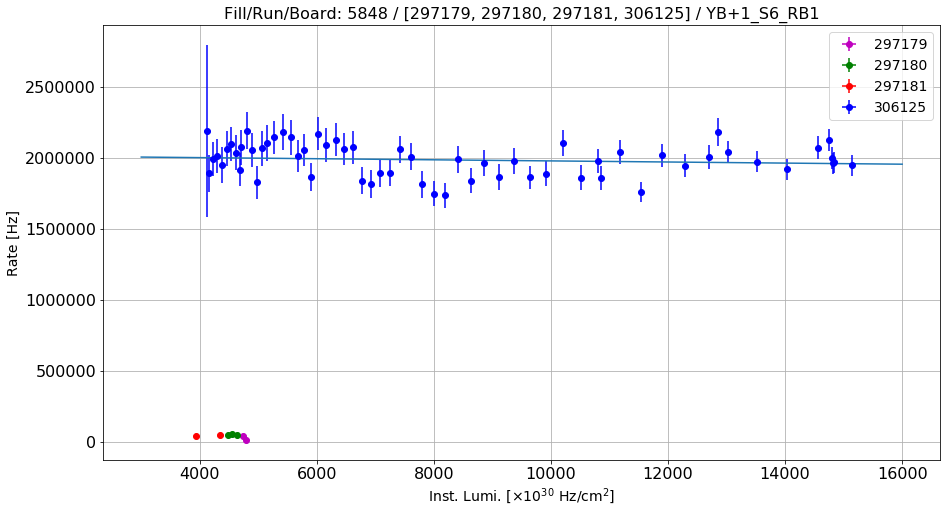

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S6_RB2
Linear fit parameters: [  3.77535290e+00   5.63234677e+03]
Paramenters uncertainty: [  2.65714480e-02   2.59746378e+02]


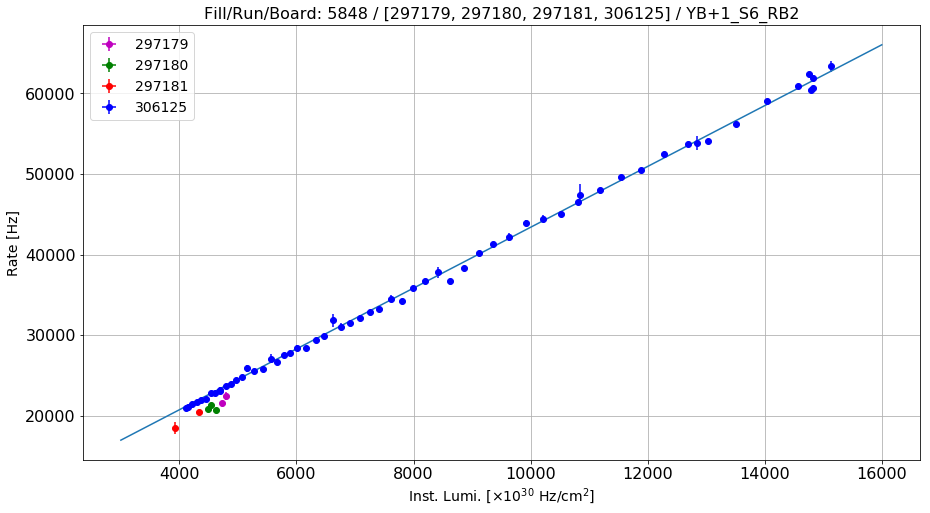

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S6_RB3
Linear fit parameters: [  7.53985915e-01   1.15328123e+04]
Paramenters uncertainty: [  7.65031962e-02   7.47848899e+02]


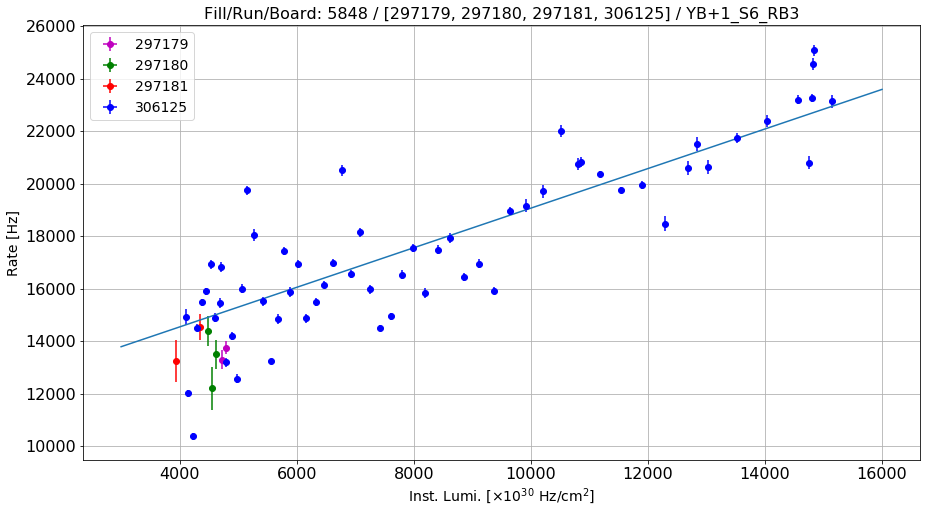

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S6_RB4
Linear fit parameters: [    23.86057257  10031.08809006]
Paramenters uncertainty: [  1.29064571e-01   1.26165705e+03]


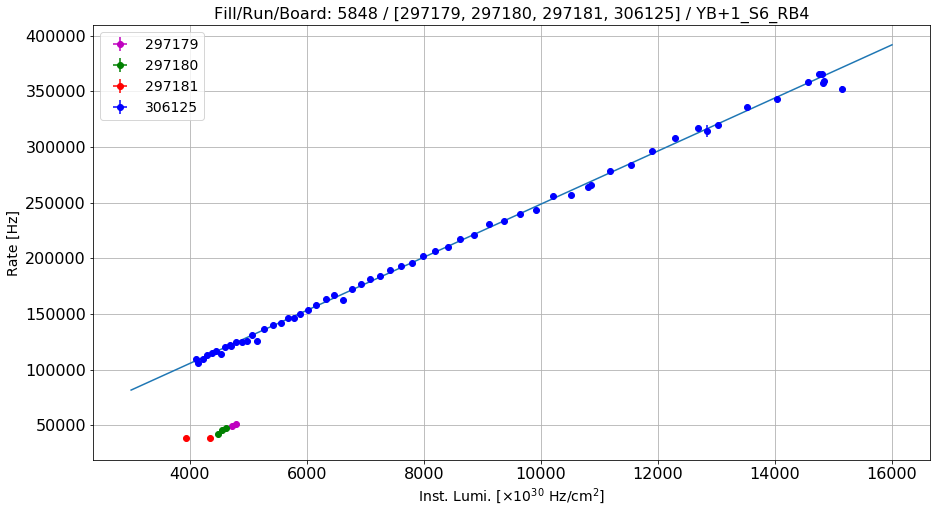

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S7_RB1
Linear fit parameters: [   15.73485809  5892.53872331]
Paramenters uncertainty: [  3.07130989e-02   3.00232648e+02]


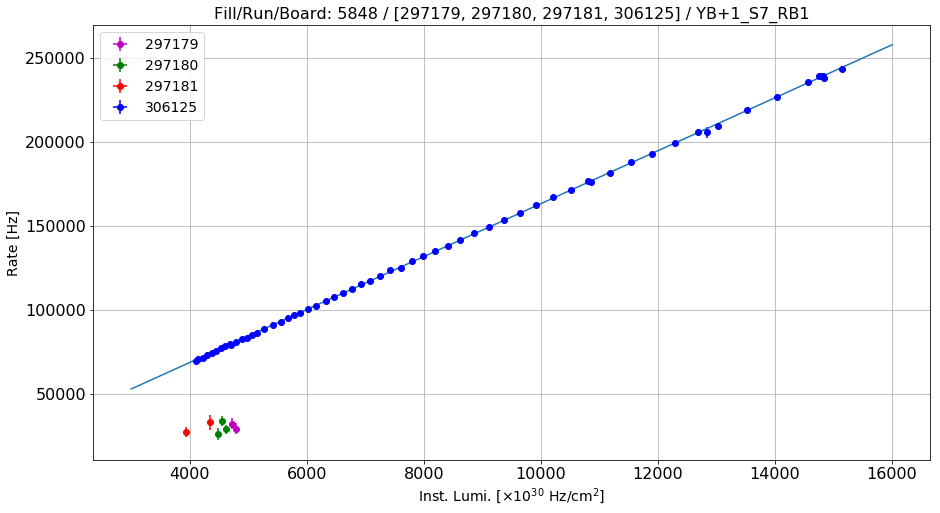

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S7_RB2
Linear fit parameters: [    3.47891069  2041.8405891 ]
Paramenters uncertainty: [  8.96363031e-03   8.76230195e+01]


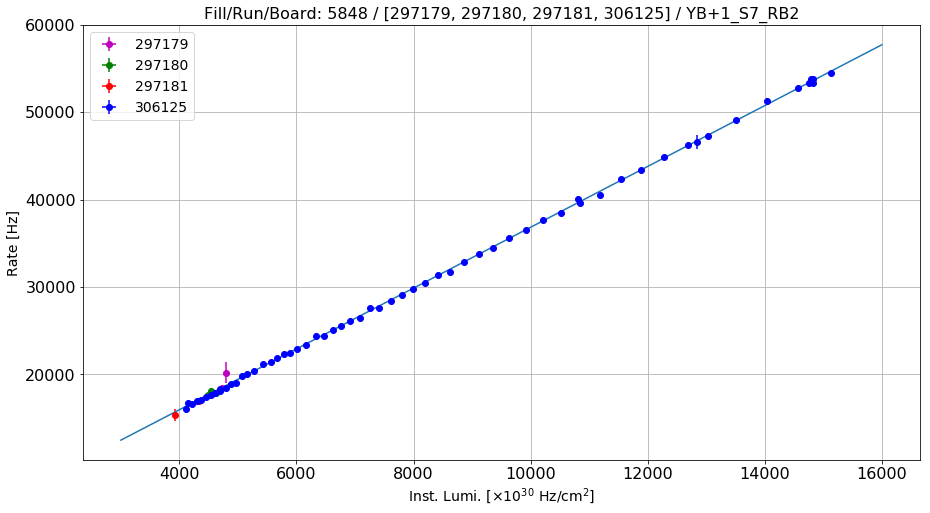

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S7_RB3
Linear fit parameters: [  5.87826146e-01   2.71719407e+03]
Paramenters uncertainty: [  3.08098327e-03   3.01178259e+01]


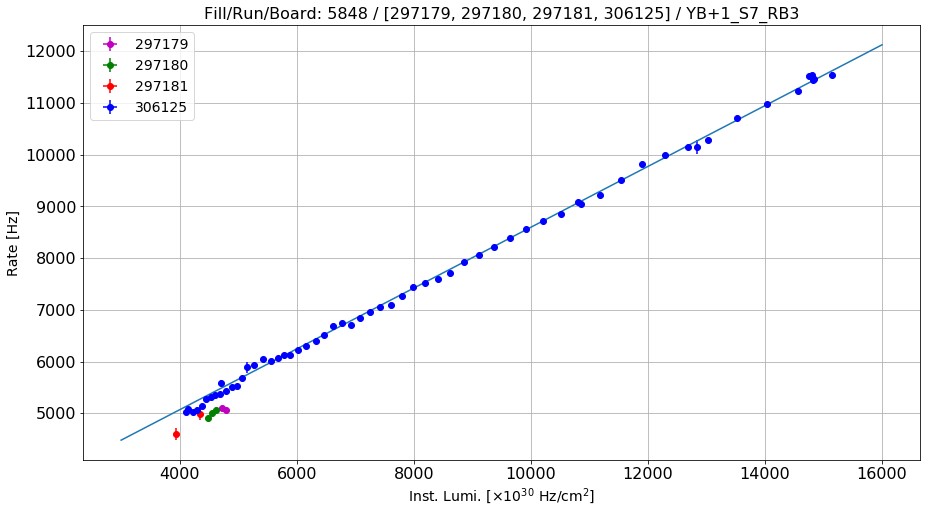

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S7_RB4
Linear fit parameters: [   15.44357568  7244.63133742]
Paramenters uncertainty: [  1.31571858e-01   1.28616677e+03]


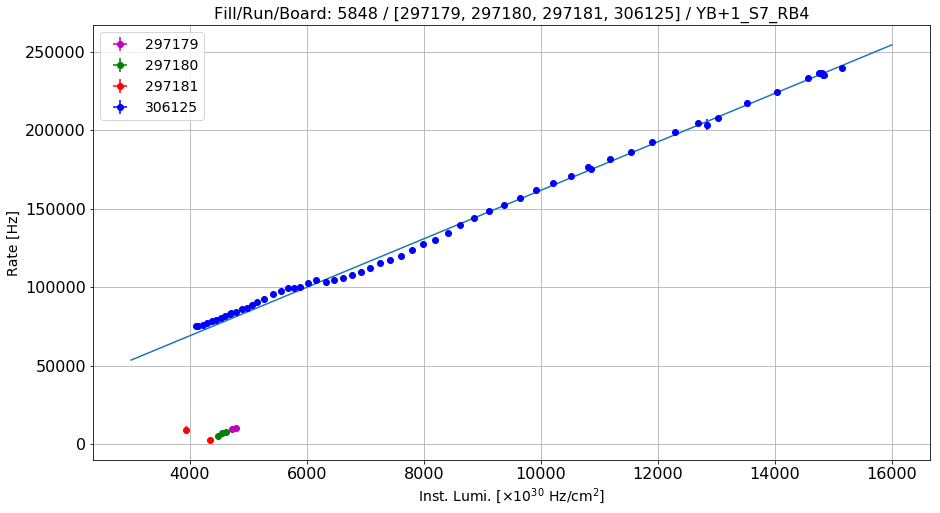

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S8_RB1
Linear fit parameters: [  1.41915250e+01   2.73947135e+04]
Paramenters uncertainty: [  1.80109436e-01   1.88028557e+03]


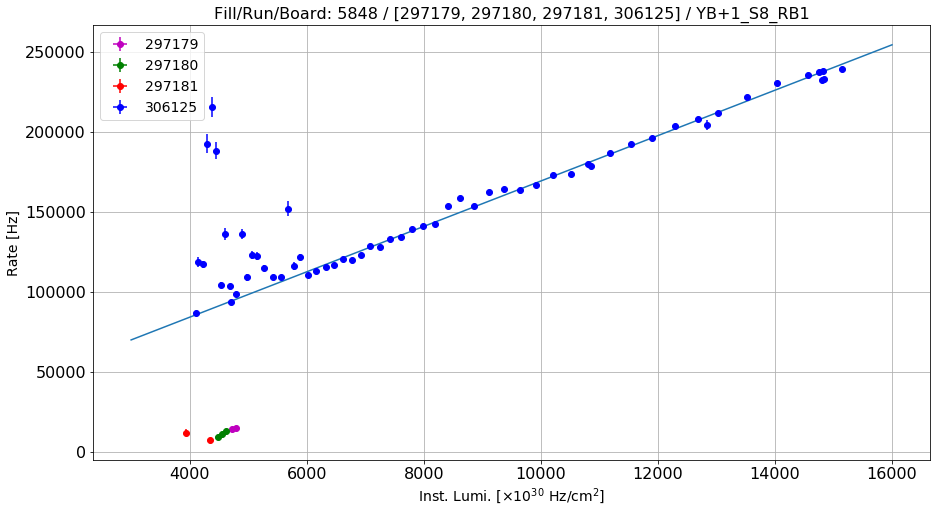

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S8_RB2
Linear fit parameters: [  3.67471562e+00   7.55839778e+03]
Paramenters uncertainty: [  3.30829409e-02   3.23398788e+02]


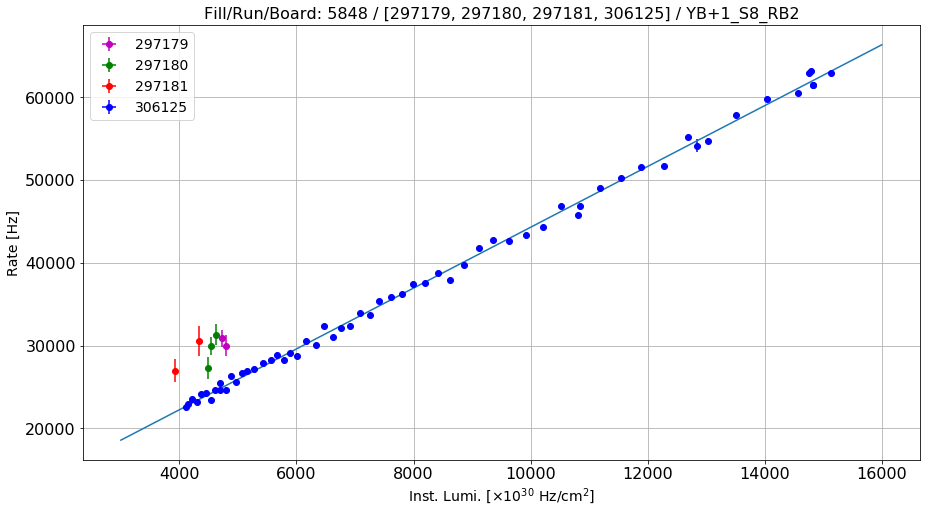

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S8_RB3
Linear fit parameters: [  3.72594990e-01   4.56805807e+04]
Paramenters uncertainty: [  2.99568282e-02   2.92839804e+02]


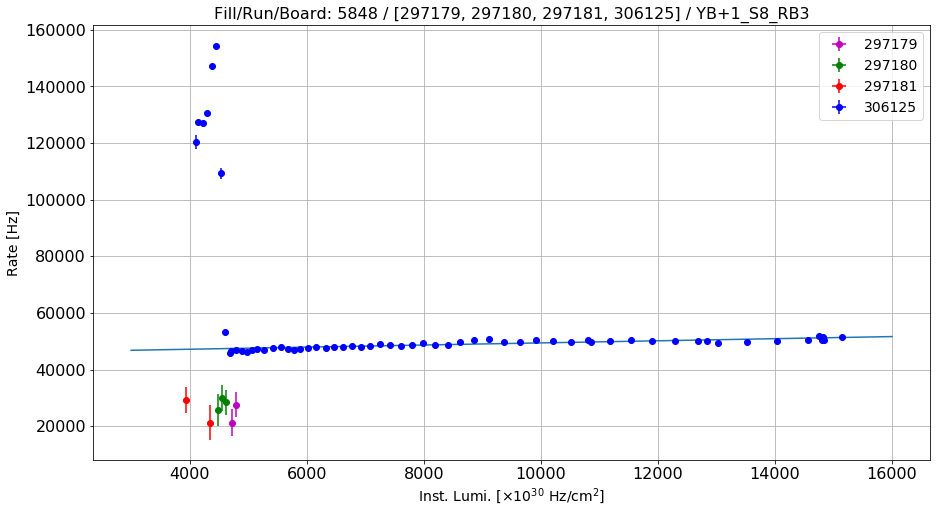

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S8_RB4
Linear fit parameters: [   10.80406267  3834.79593871]
Paramenters uncertainty: [  2.32193516e-02   2.26978314e+02]


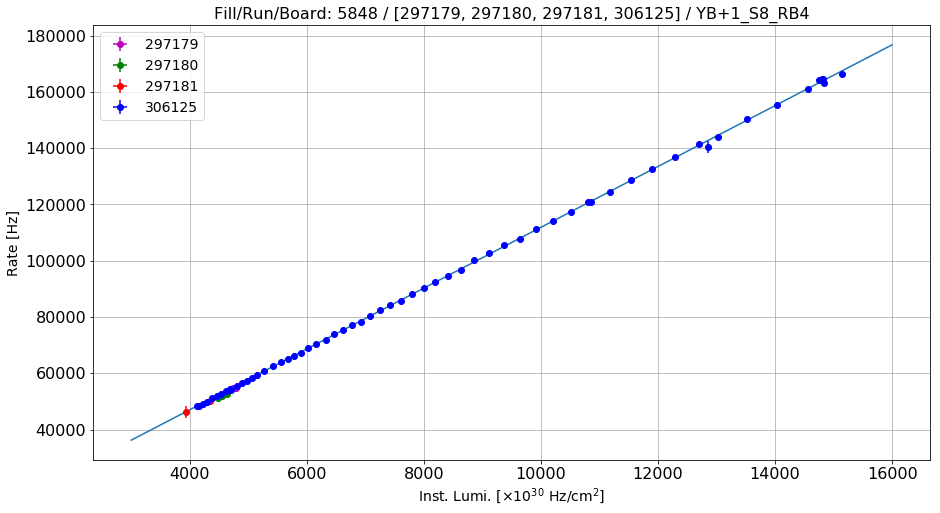

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S9_RB1
Linear fit parameters: [   16.92035615  7326.55678939]
Paramenters uncertainty: [  3.38146738e-02   3.30551765e+02]


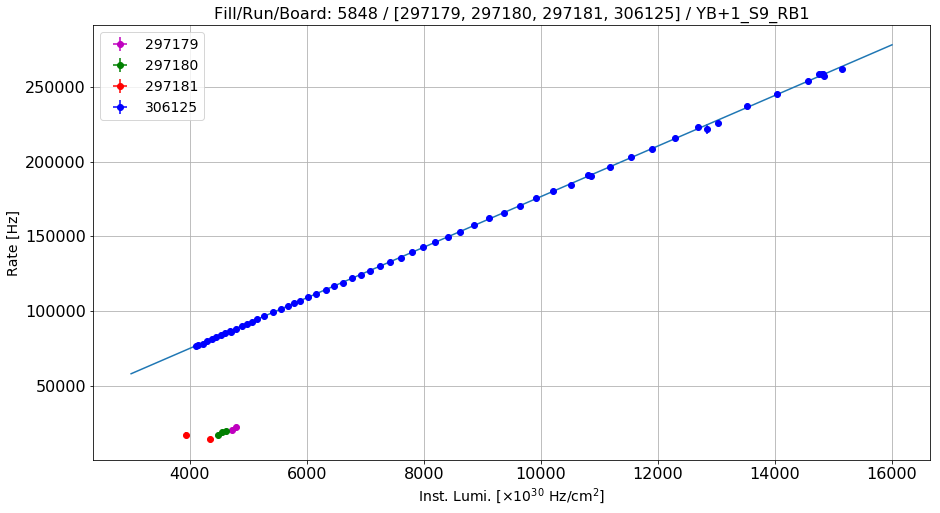

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S9_RB2
Linear fit parameters: [  2.85934025e+00   4.42409295e+03]
Paramenters uncertainty: [  9.57194066e-03   9.35694929e+01]


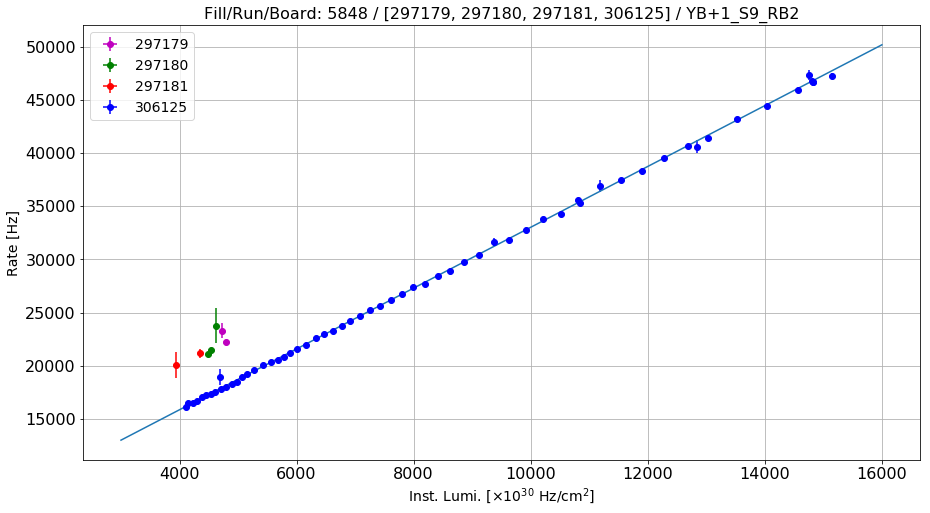

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S9_RB3
Linear fit parameters: [  4.14851398e-01   1.63981501e+03]
Paramenters uncertainty: [  3.95827290e-03   3.86936779e+01]


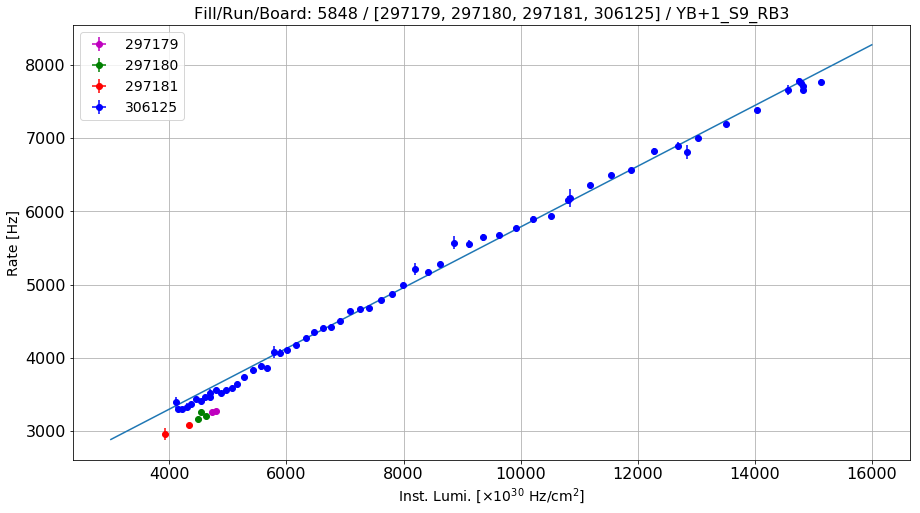

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S9_RB4
Linear fit parameters: [  7.09155920e-01   3.17696394e+03]
Paramenters uncertainty: [  1.16046968e-02   1.13440485e+02]


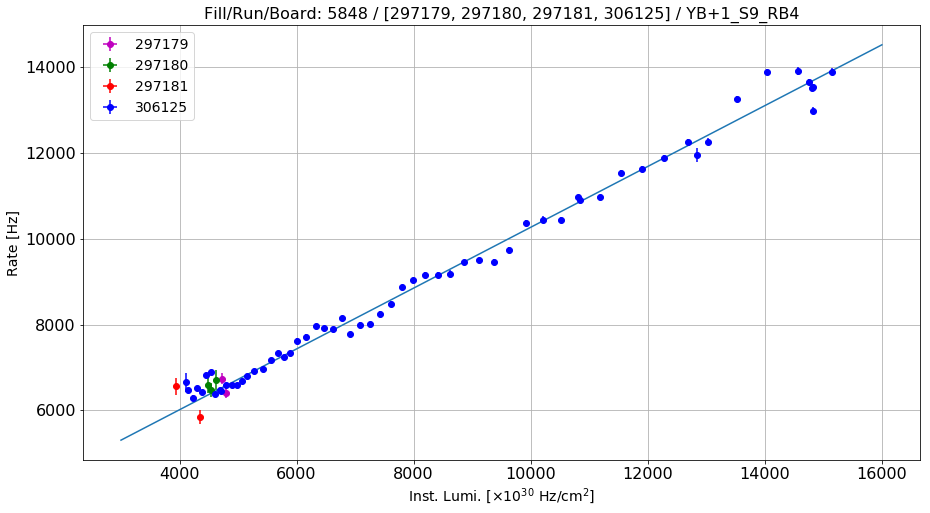

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S10_RB1
Linear fit parameters: [  1.65015982e+01   2.83211475e+04]
Paramenters uncertainty: [  4.80879702e-02   4.70078864e+02]


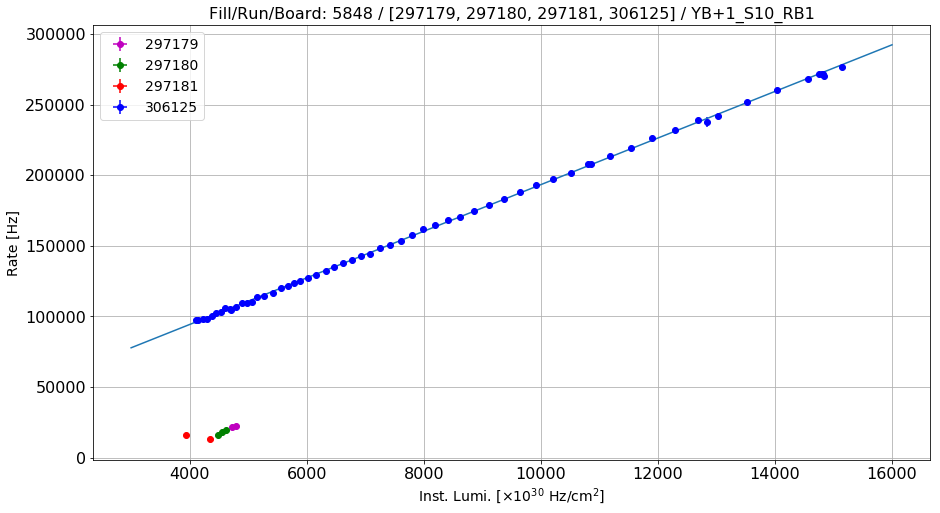

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S10_RB2
Linear fit parameters: [  3.59486391e+00   6.31925678e+03]
Paramenters uncertainty: [  1.45012617e-02   1.41755549e+02]


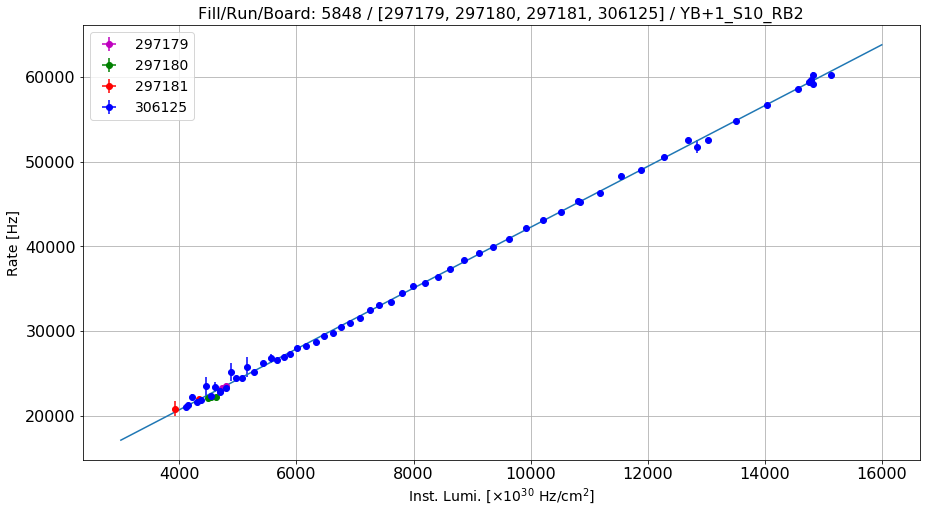

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S10_RB3
Linear fit parameters: [  3.83382398e-01   3.39845536e+03]
Paramenters uncertainty: [  3.40412360e-03   3.32766500e+01]


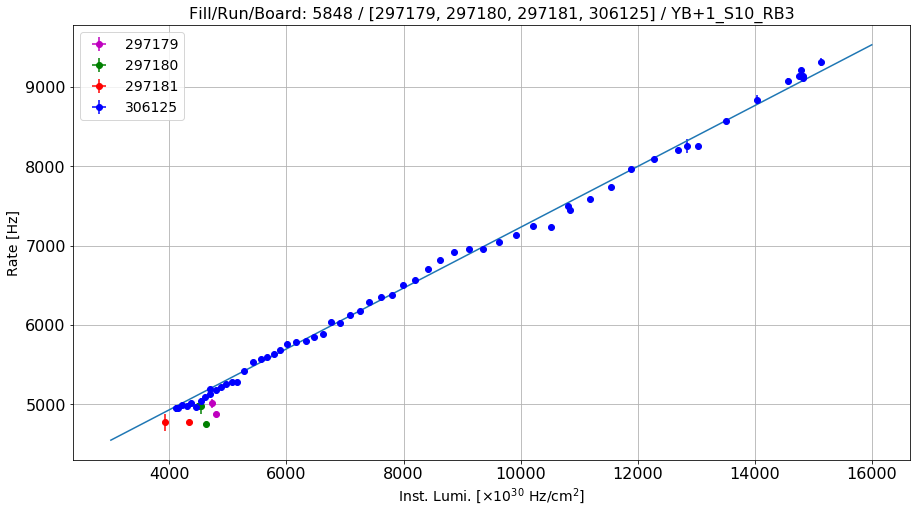

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S10_RB4
Linear fit parameters: [  8.09365995e-01   3.07501907e+03]
Paramenters uncertainty: [  5.95795438e-03   5.82413525e+01]


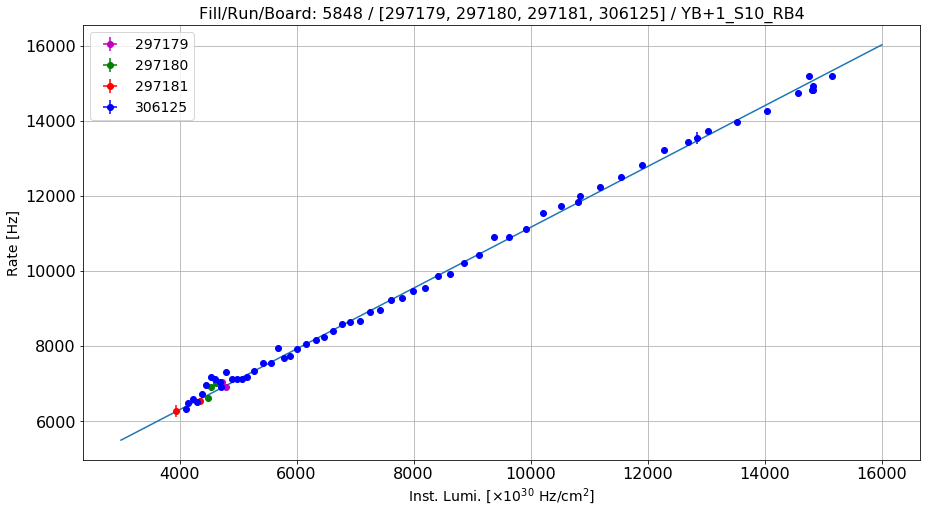

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S11_RB1
Linear fit parameters: [  1.48599993e+01   2.75018496e+04]
Paramenters uncertainty: [  6.73910869e-02   6.58774439e+02]


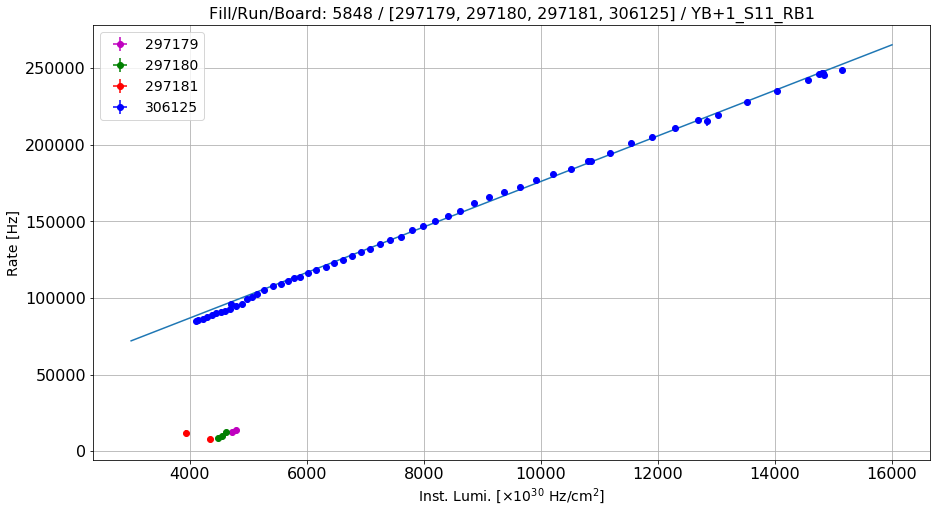

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S11_RB2
Linear fit parameters: [  3.57742691e+00   5.53095214e+03]
Paramenters uncertainty: [  9.06308347e-03   8.85952133e+01]


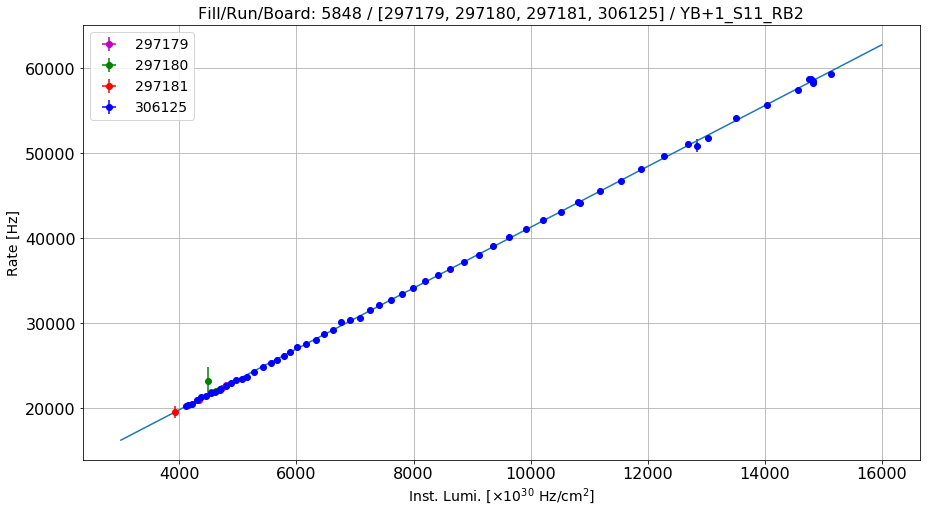

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S11_RB3
Linear fit parameters: [  4.44281426e-01   2.79135669e+03]
Paramenters uncertainty: [  3.11243089e-03   3.04252388e+01]


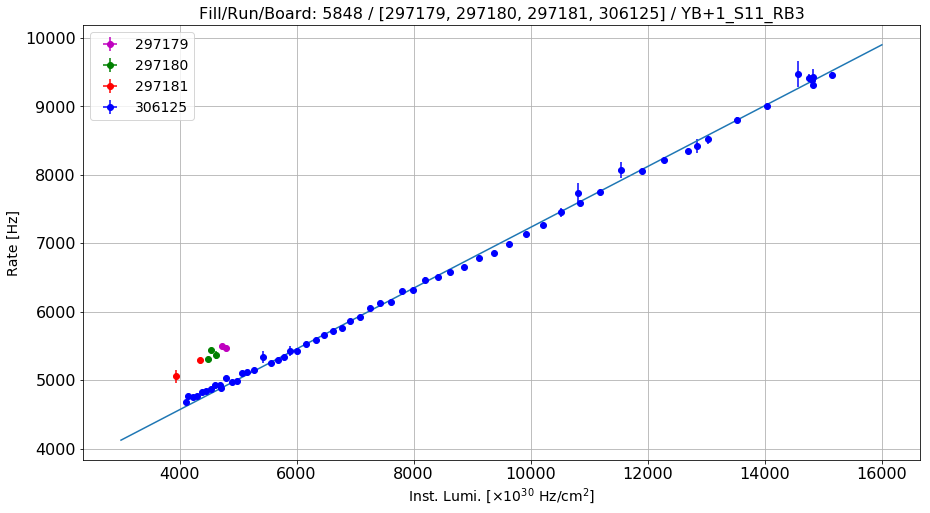

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S11_RB4
Linear fit parameters: [  6.01726470e-01   9.06504610e+02]
Paramenters uncertainty: [  2.36150679e-02   2.30846597e+02]


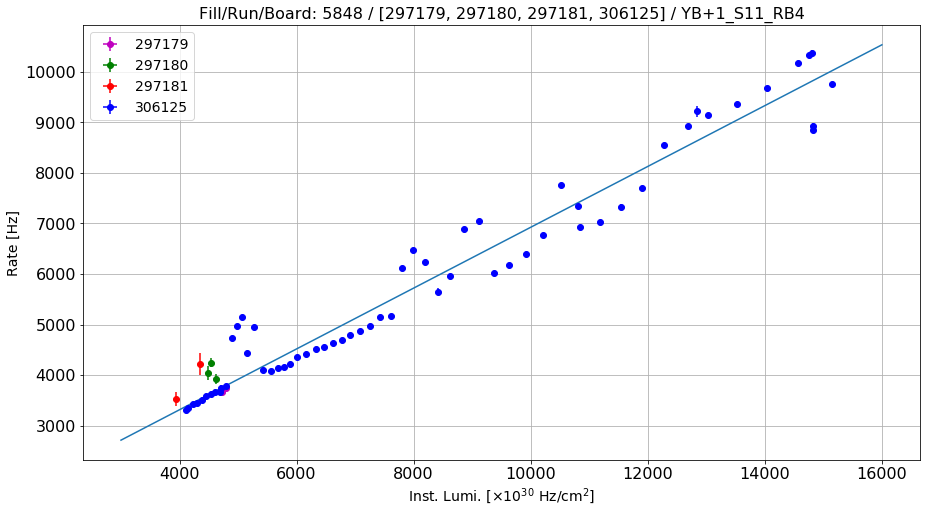

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S12_RB1
Linear fit parameters: [   15.30975919  6222.62270537]
Paramenters uncertainty: [  3.19634623e-02   3.12455443e+02]


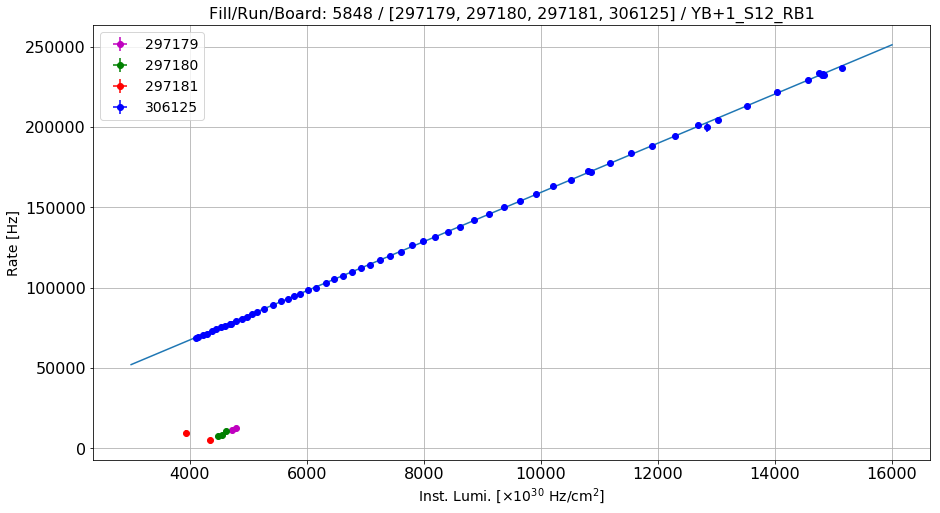

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S12_RB2
Linear fit parameters: [  3.82917158e+00   7.60414365e+04]
Paramenters uncertainty: [  1.23679549e-01   1.20901635e+03]


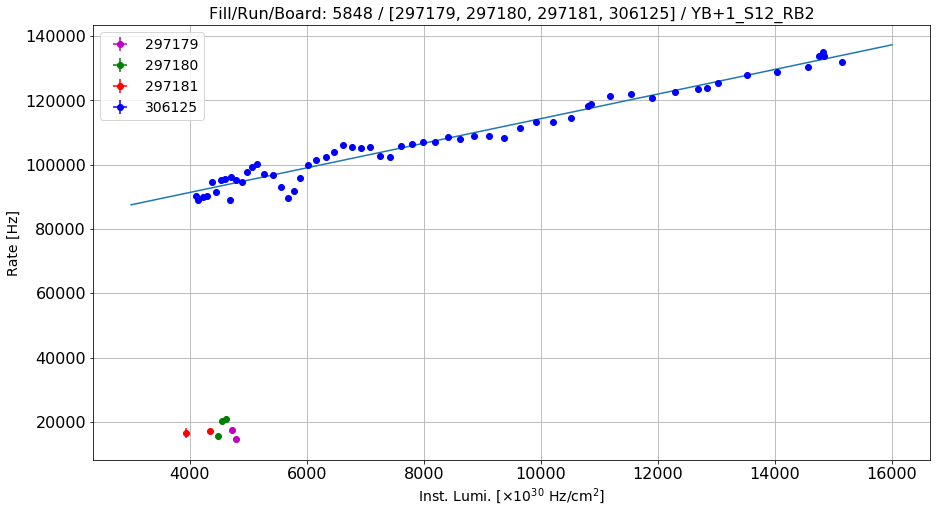

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S12_RB3
Linear fit parameters: [  5.76612985e-01   3.99739818e+03]
Paramenters uncertainty: [  2.15559864e-02   2.10718264e+02]


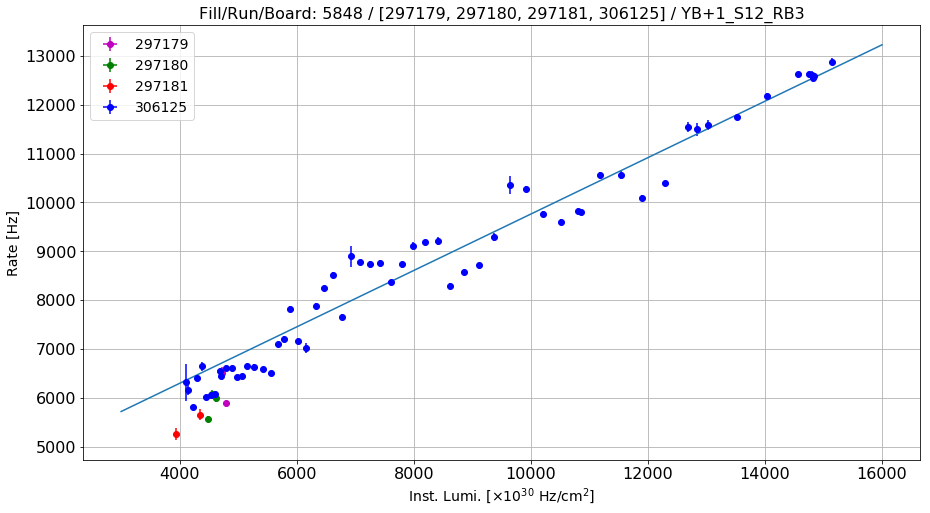

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+1_S12_RB4
Linear fit parameters: [    9.13343496  5475.05090027]
Paramenters uncertainty: [  2.20139206e-02   2.15194751e+02]


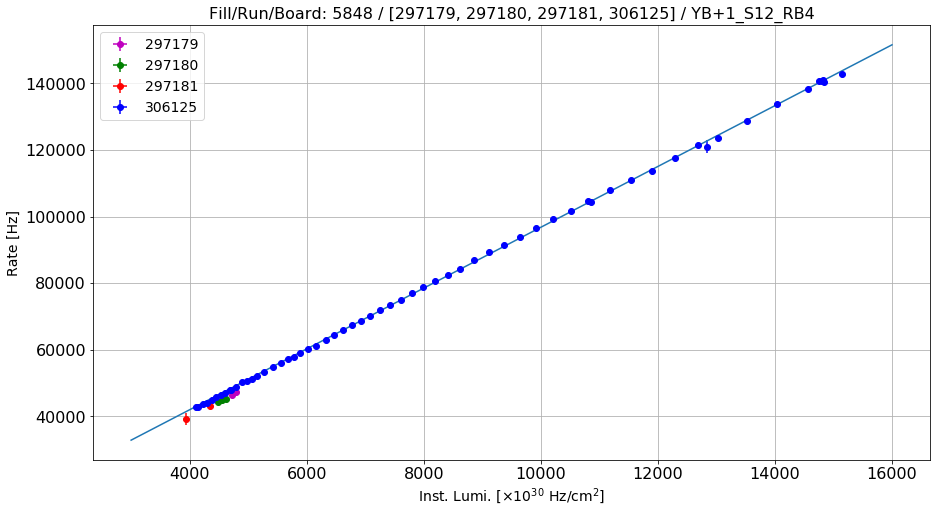

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S1_RB1
Linear fit parameters: [   34.78061285  6537.60635378]
Paramenters uncertainty: [  6.77666692e-02   6.62445904e+02]


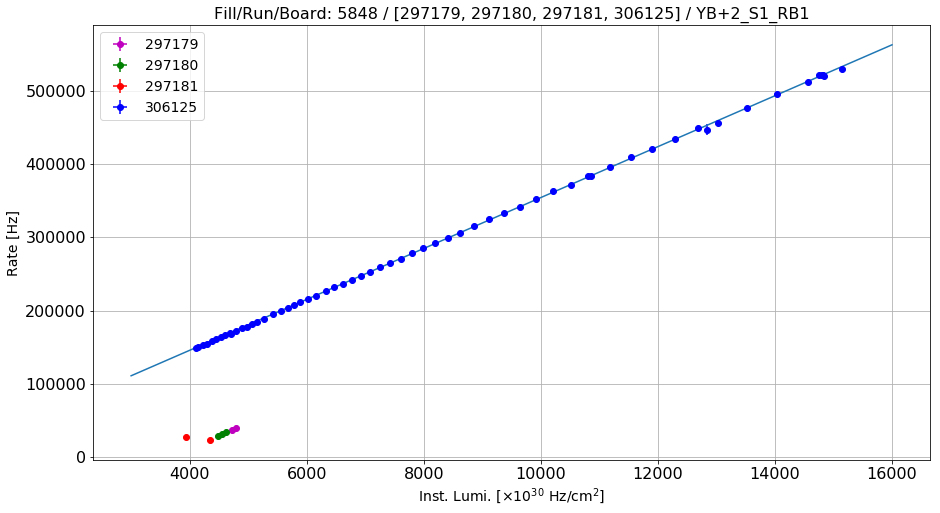

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S1_RB2
Linear fit parameters: [  1.33925342e+01  -1.54764880e+04]
Paramenters uncertainty: [  2.50345133e-01   2.44722236e+03]


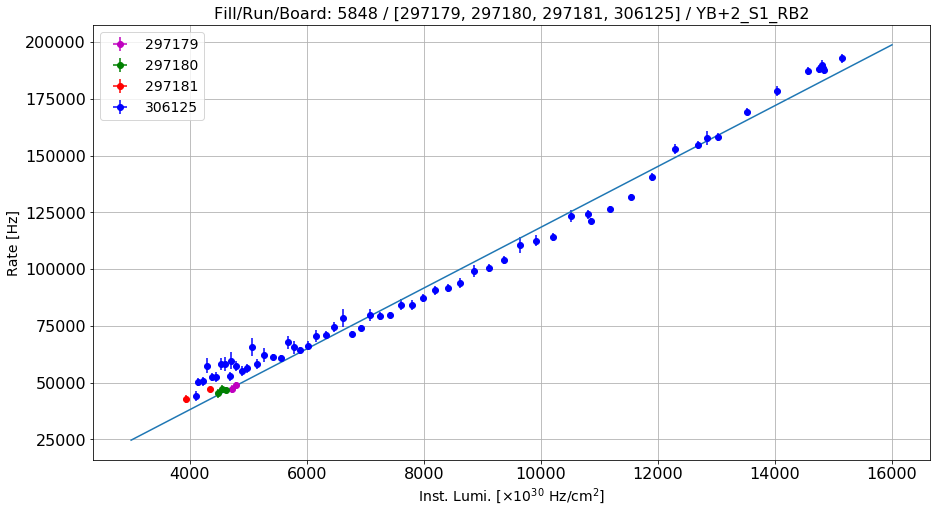

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S1_RB3
Linear fit parameters: [  1.99791370e+00   1.25466944e+04]
Paramenters uncertainty: [  4.97850218e-01   4.86668212e+03]


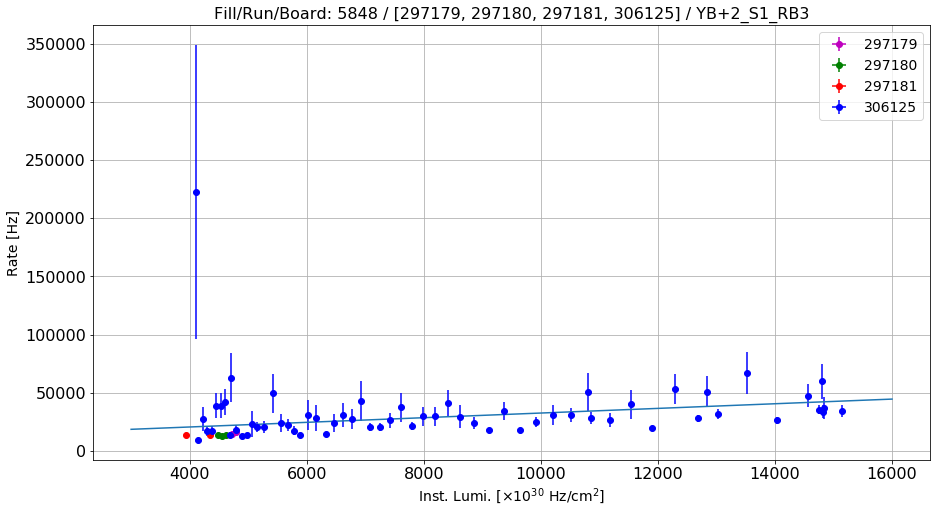

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S1_RB4
Linear fit parameters: [    34.48194266  17843.01363456]
Paramenters uncertainty: [  1.91978812e-01   1.87666856e+03]


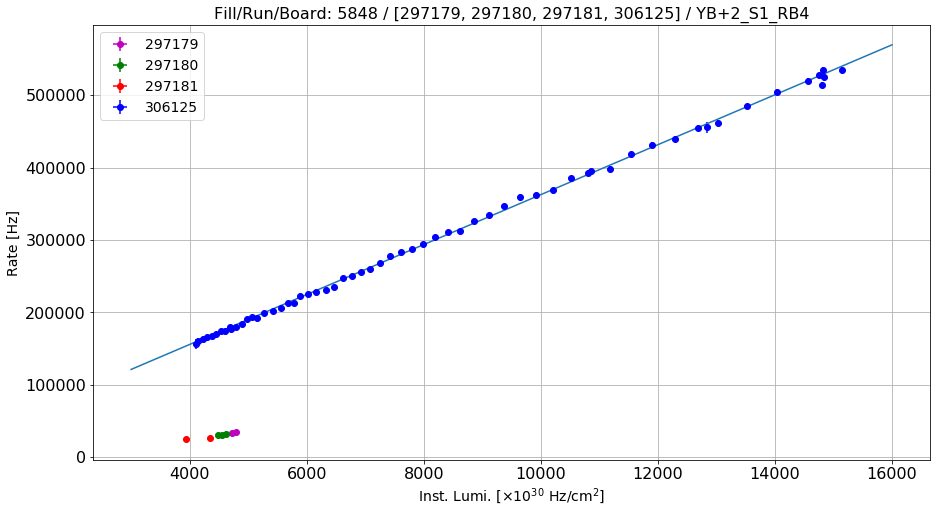

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S2_RB1
Linear fit parameters: [    32.73741876  11514.4424733 ]
Paramenters uncertainty: [  6.48084862e-02   6.33528498e+02]


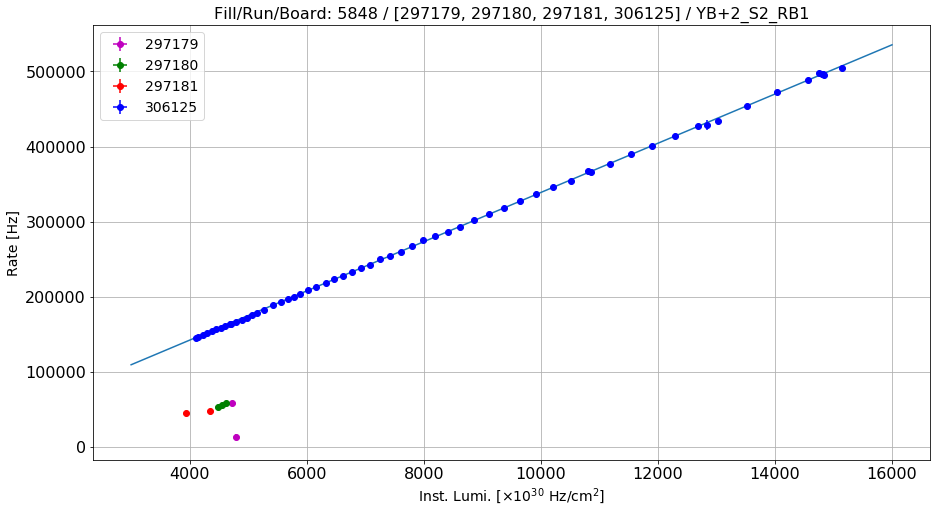

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S2_RB2
Linear fit parameters: [    9.24083623  4946.16748171]
Paramenters uncertainty: [  2.02733897e-02   1.98180375e+02]


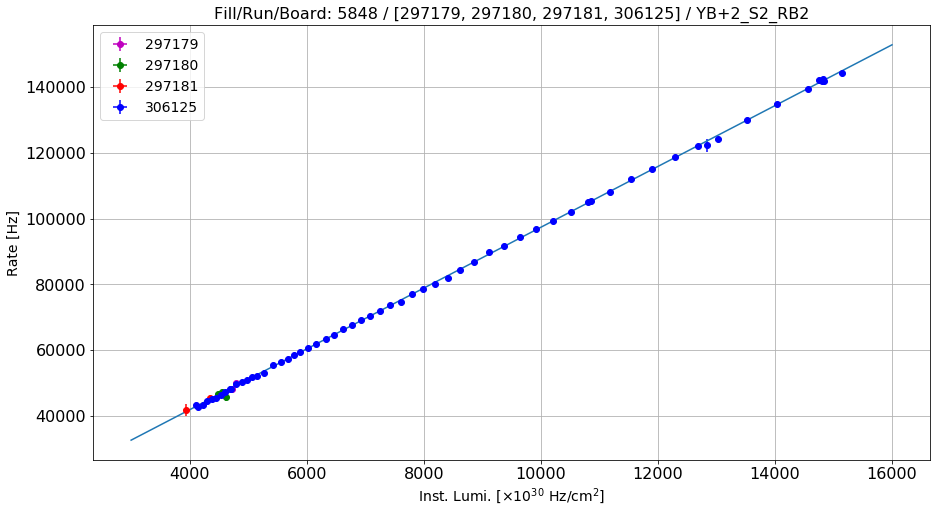

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S2_RB3
Linear fit parameters: [  1.50822618e+00   5.73363118e+03]
Paramenters uncertainty: [  8.88568739e-03   8.68610967e+01]


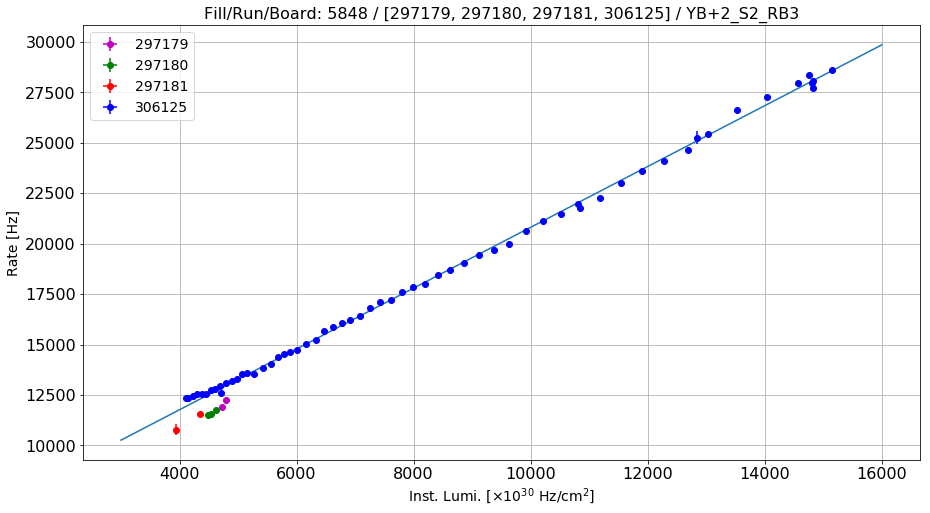

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S2_RB4
Linear fit parameters: [  3.44545429e+01   6.05353344e+04]
Paramenters uncertainty: [  2.16513786e-01   2.11650760e+03]


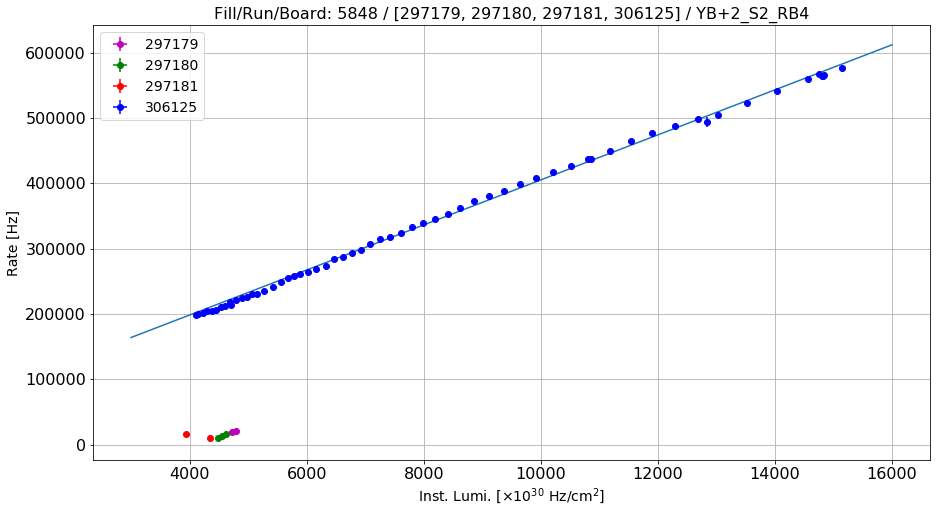

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S3_RB1
Linear fit parameters: [    37.89808355  23422.97871509]
Paramenters uncertainty: [  1.47398764e-01   1.44088102e+03]


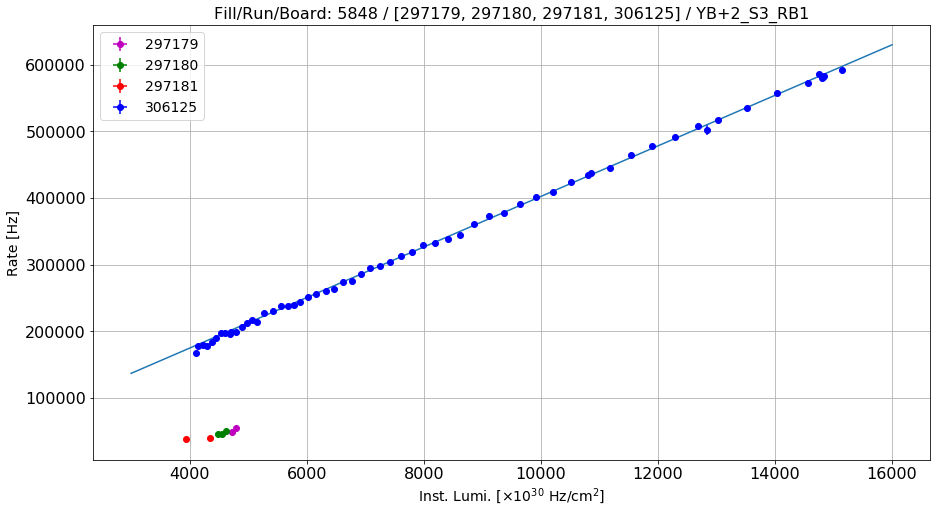

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S3_RB2
Linear fit parameters: [  9.09552707e+00   8.24983481e+05]
Paramenters uncertainty: [  3.68122080e+00   3.59853843e+04]


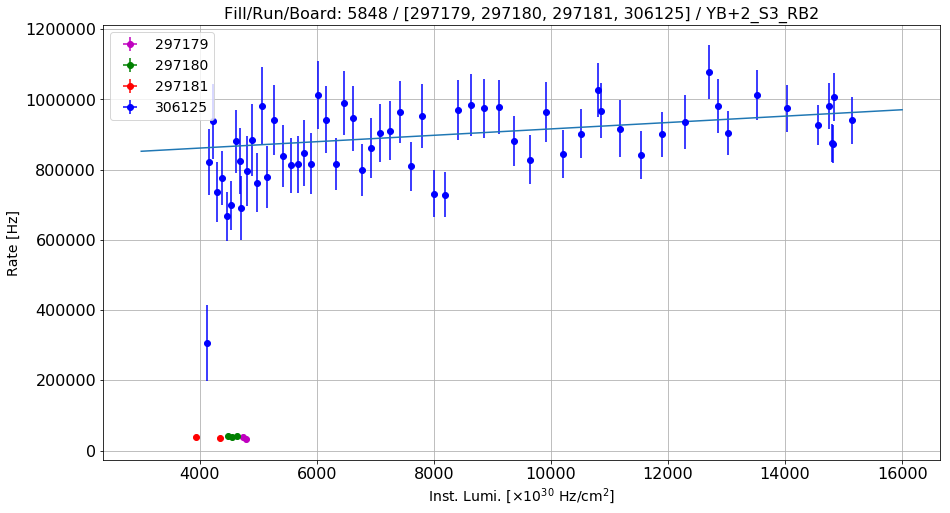

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S3_RB3
Linear fit parameters: [  1.73815121e+00   2.39761777e+03]
Paramenters uncertainty: [  1.02714169e-02   1.00407149e+02]


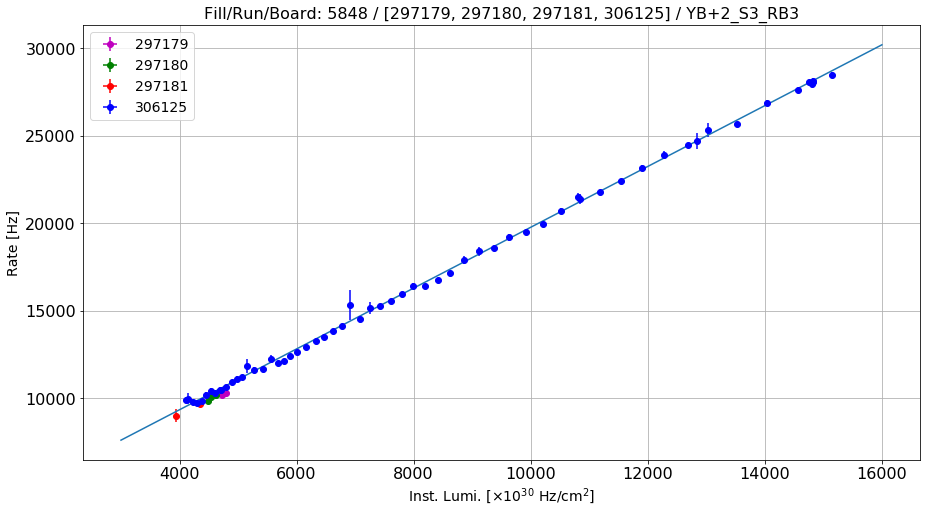

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S3_RB4
Linear fit parameters: [    41.69653686  24178.87020219]
Paramenters uncertainty: [  1.04673095e-01   1.02322077e+03]


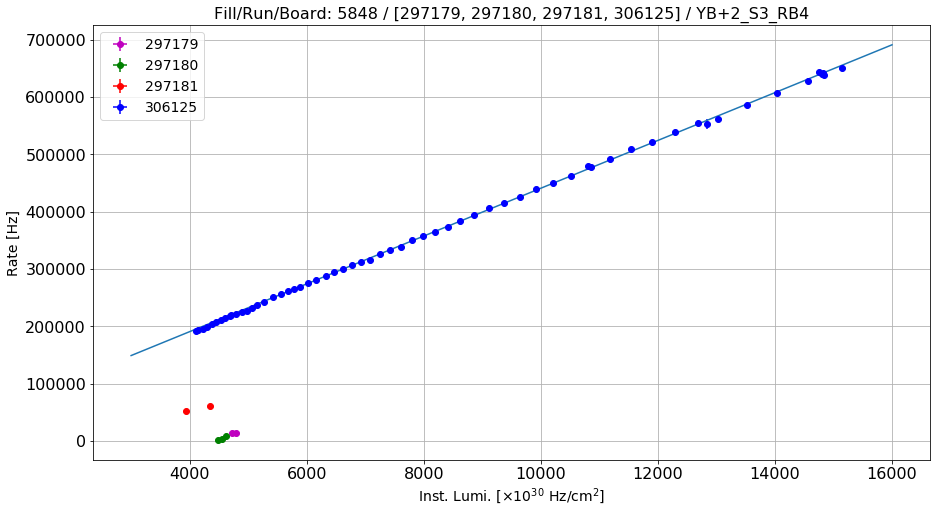

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S4_RB1
Linear fit parameters: [    38.18713643  20273.56148521]
Paramenters uncertainty: [  1.25127220e-01   1.22316790e+03]


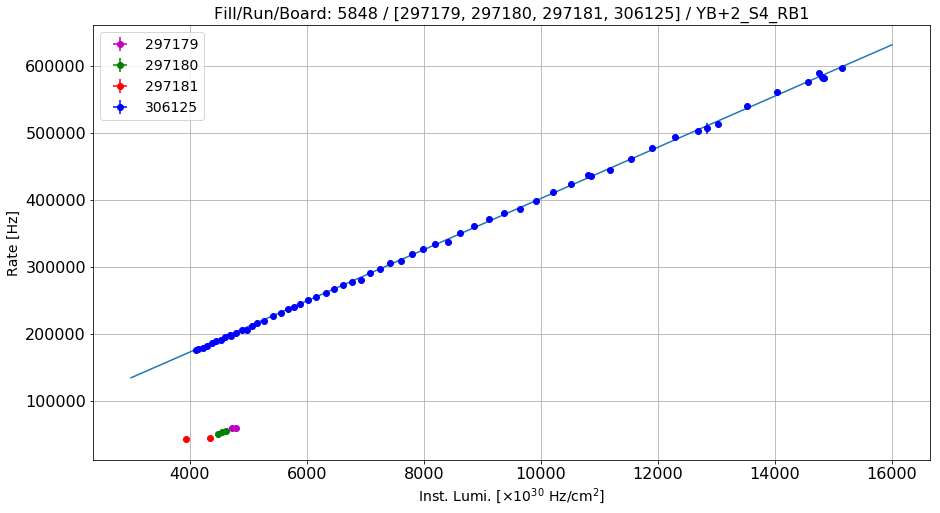

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S4_RB2
Linear fit parameters: [    9.18018227  5005.14668004]
Paramenters uncertainty: [  5.86217830e-02   5.73051036e+02]


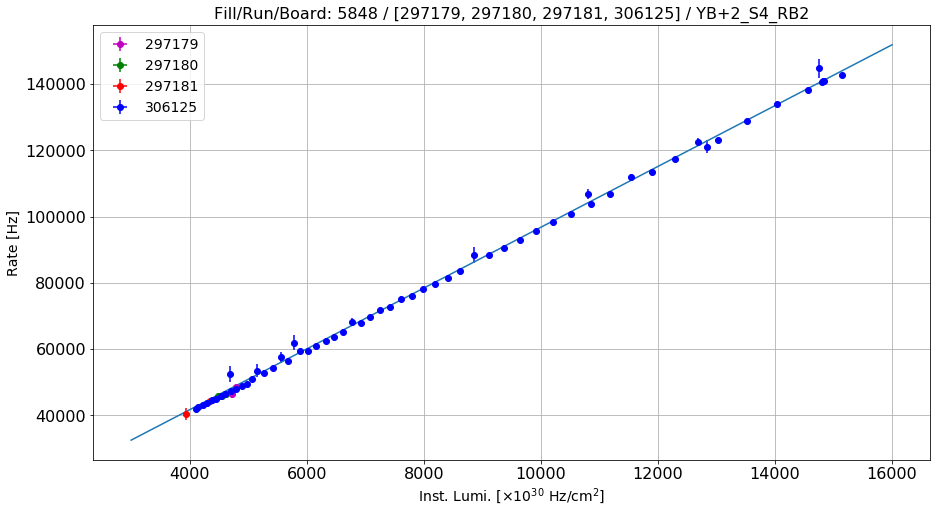

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S4_RB3
Linear fit parameters: [  1.49855101e+00   3.85890419e+03]
Paramenters uncertainty: [  6.16740916e-03   6.02888556e+01]


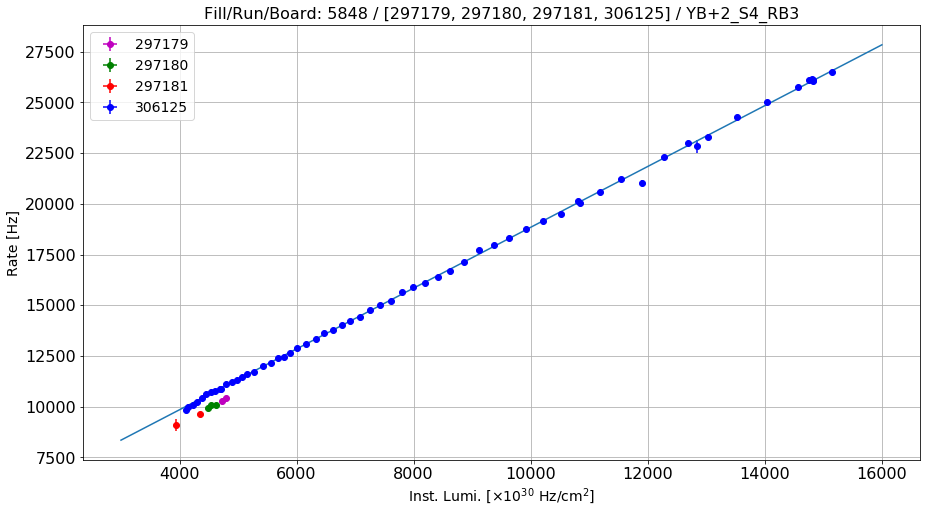

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S4_RB4
Linear fit parameters: [    37.2338677   13916.11272649]
Paramenters uncertainty: [  7.16878762e-02   7.00777247e+02]


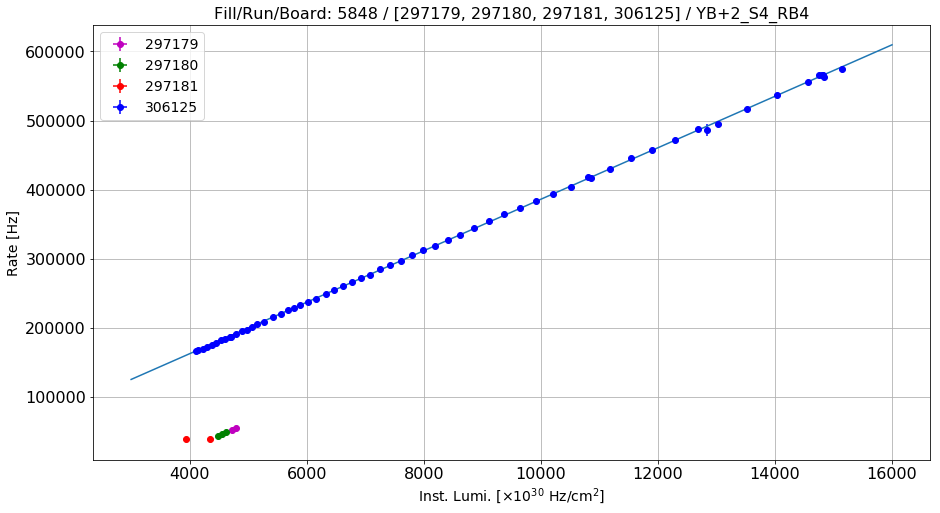

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S5_RB1
Linear fit parameters: [    38.6680973   22191.18585145]
Paramenters uncertainty: [  7.75653262e-02   7.58231638e+02]


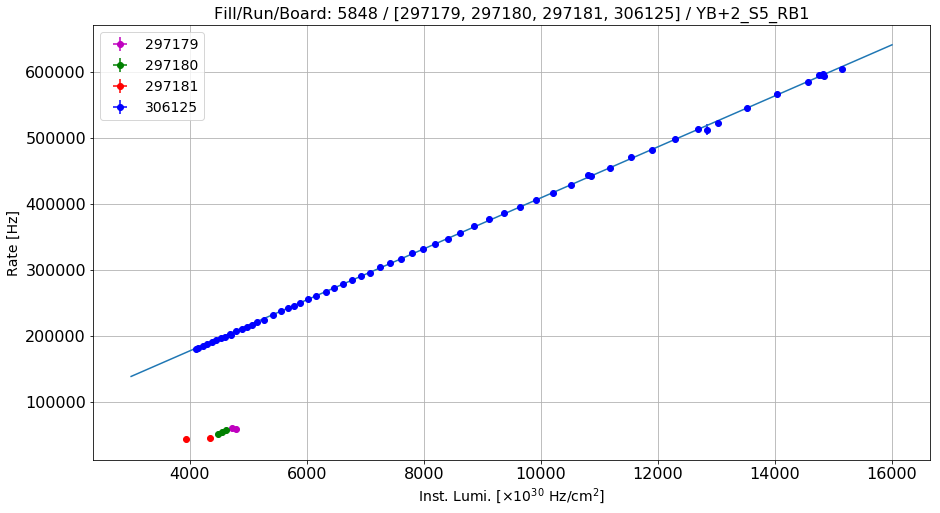

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S5_RB2
Linear fit parameters: [    9.67270249  5570.4590602 ]
Paramenters uncertainty: [  1.17959271e-01   1.15309837e+03]


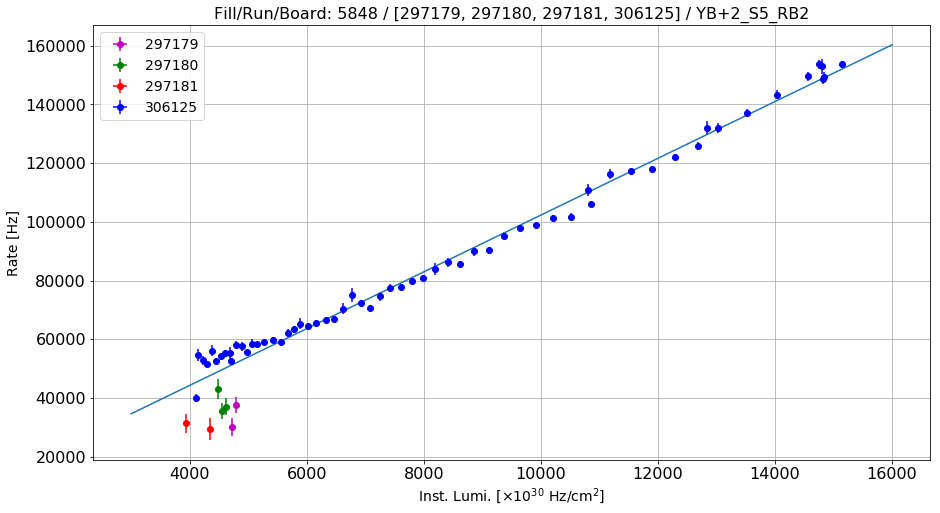

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S5_RB3
Linear fit parameters: [  1.66523608e+00   4.81597419e+03]
Paramenters uncertainty: [  4.40004002e-02   4.30121256e+02]


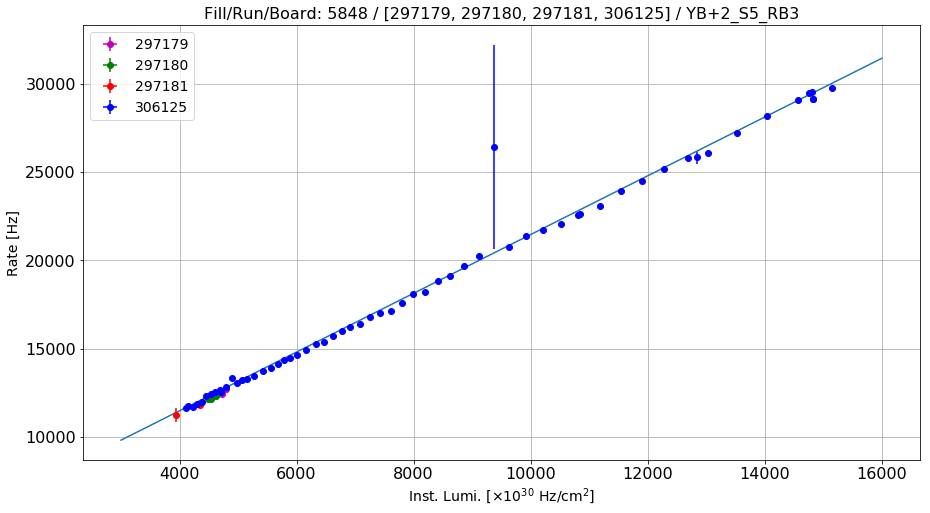

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S5_RB4
Linear fit parameters: [    45.97531974  24116.70687921]
Paramenters uncertainty: [  1.17292545e-01   1.14658086e+03]


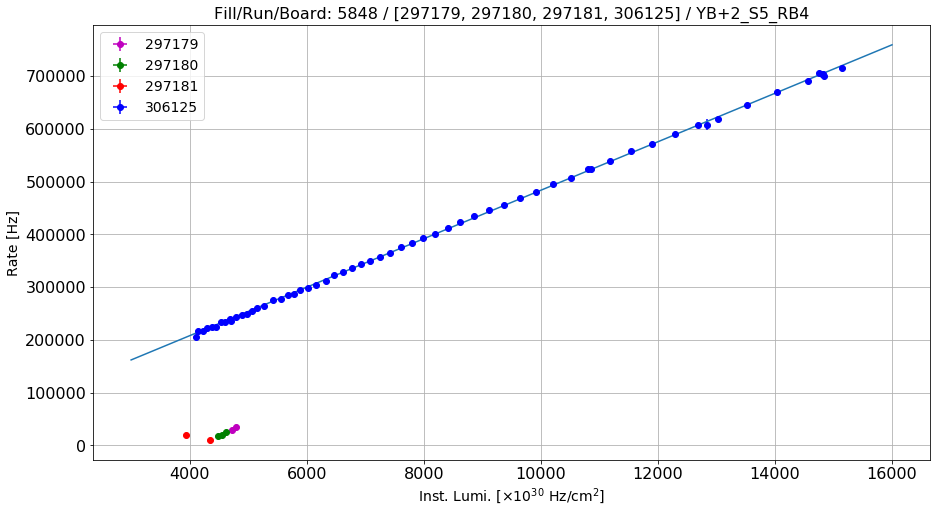

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S6_RB1
Linear fit parameters: [    39.9574757   17625.68002502]
Paramenters uncertainty: [  1.12353722e-01   1.09830192e+03]


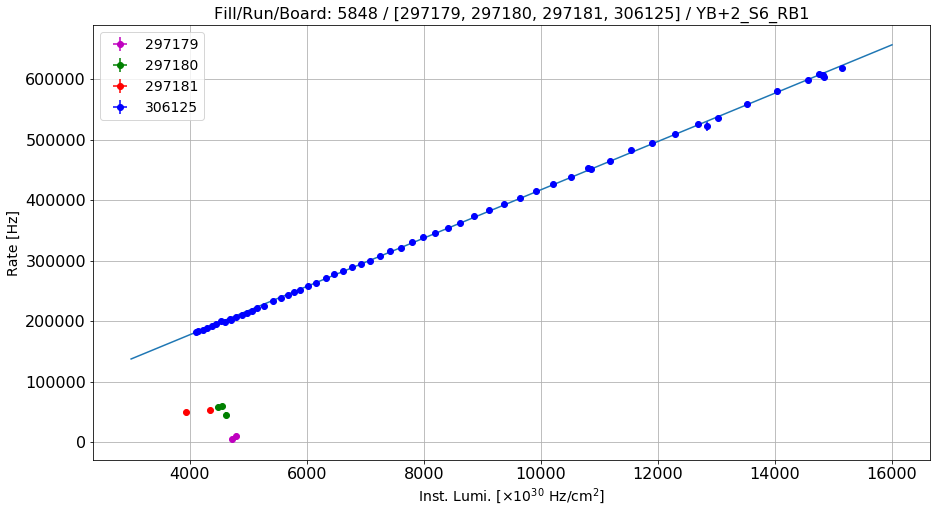

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S6_RB2
Linear fit parameters: [    9.39567743  4601.01922488]
Paramenters uncertainty: [  1.90171089e-02   1.85899735e+02]


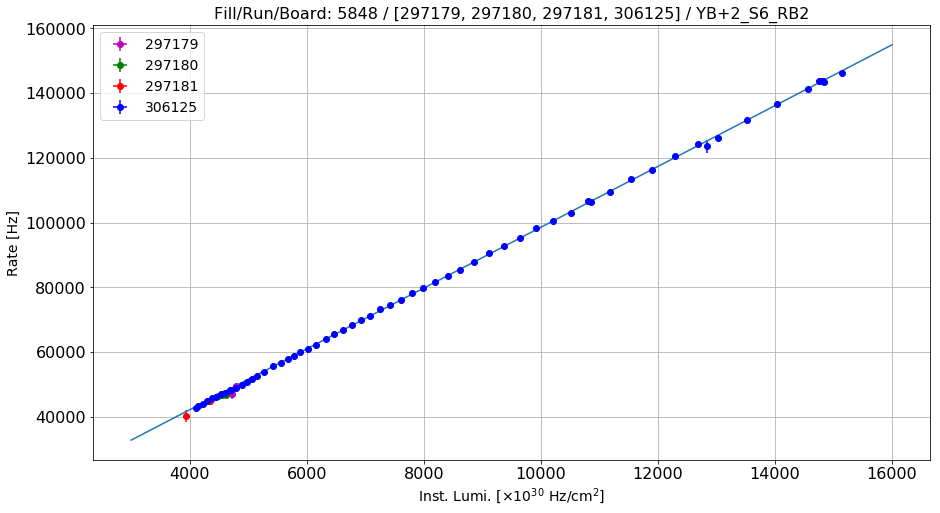

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S6_RB3
Linear fit parameters: [  1.39802164e+00   4.31573875e+03]
Paramenters uncertainty: [  3.85329834e-02   3.76675102e+02]


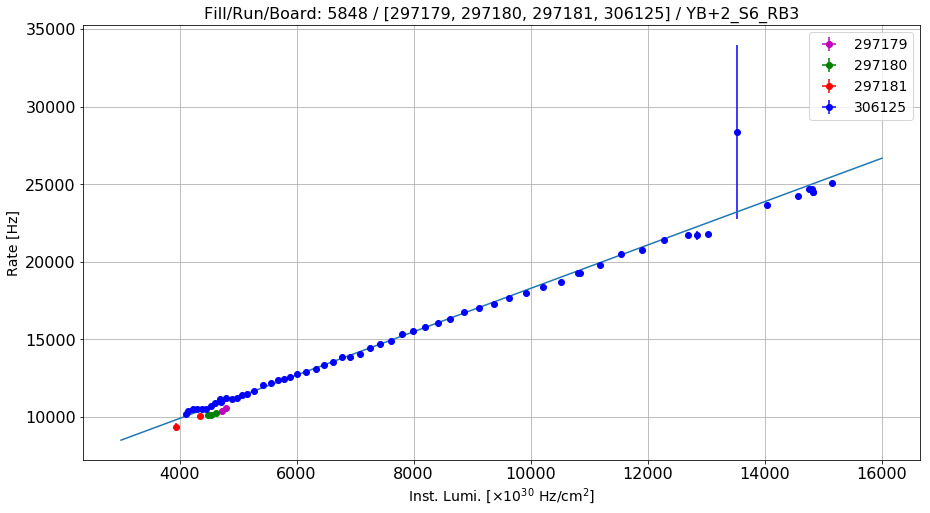

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S6_RB4
Linear fit parameters: [    33.42074639  28065.87461848]
Paramenters uncertainty: [  8.35218387e-02   8.16458895e+02]


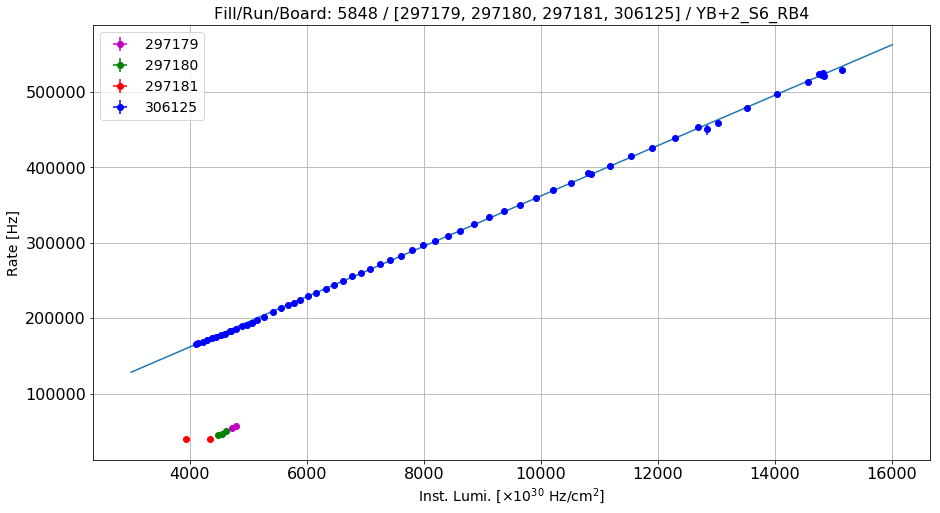

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S7_RB1
Linear fit parameters: [    40.34851422  17011.23210242]
Paramenters uncertainty: [  8.71343302e-02   8.51772424e+02]


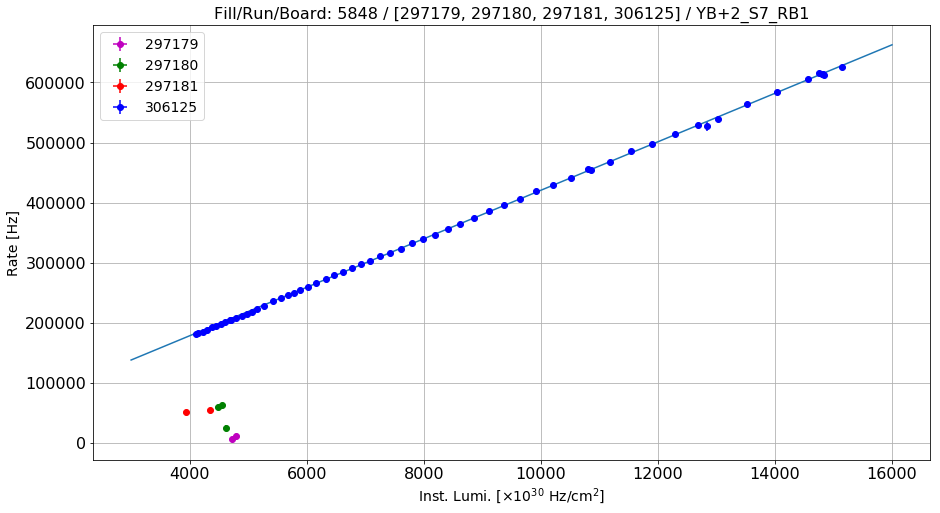

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S7_RB2
Linear fit parameters: [    9.73184501  2381.26760757]
Paramenters uncertainty: [  3.19232357e-02   3.12062212e+02]


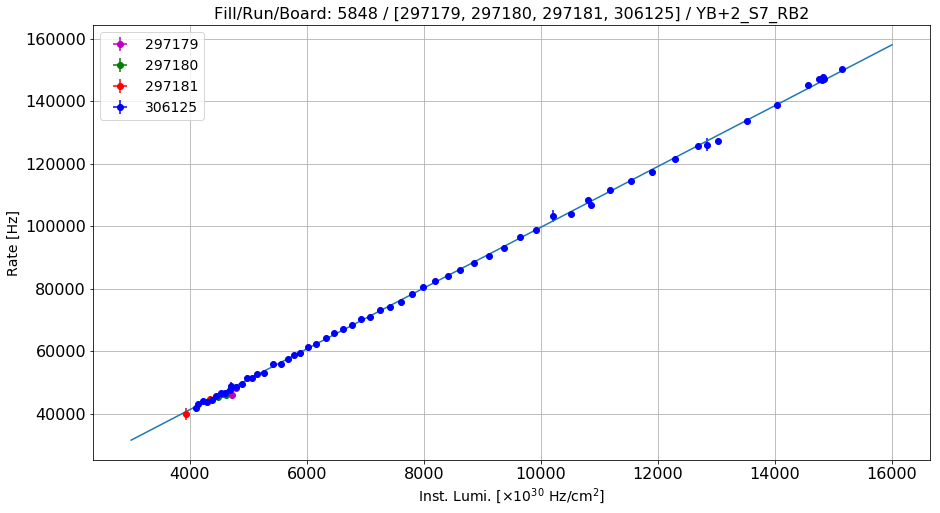

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S7_RB3
Linear fit parameters: [  1.25348379e+00   2.40678337e+03]
Paramenters uncertainty: [  6.07998700e-02   5.94342695e+02]


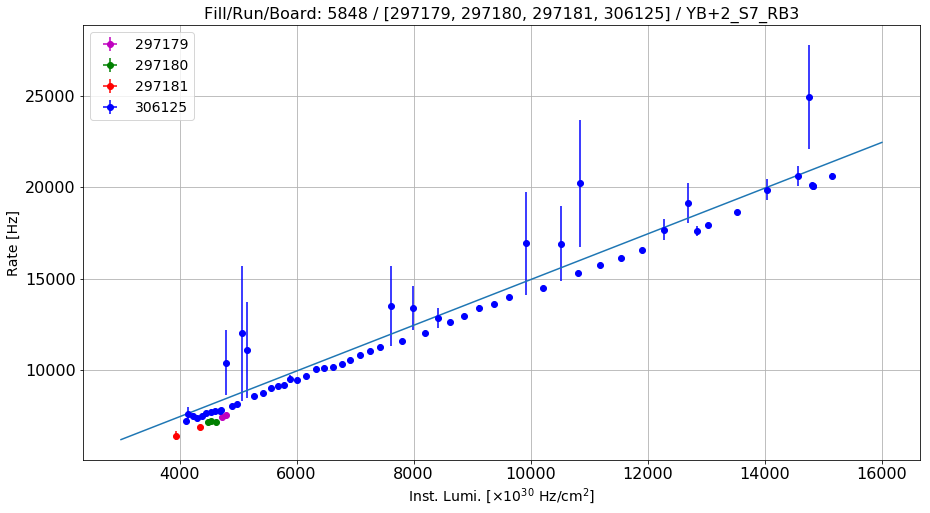

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S7_RB4
Linear fit parameters: [   26.58996618  9560.64402579]
Paramenters uncertainty: [  1.69562922e-01   1.65754440e+03]


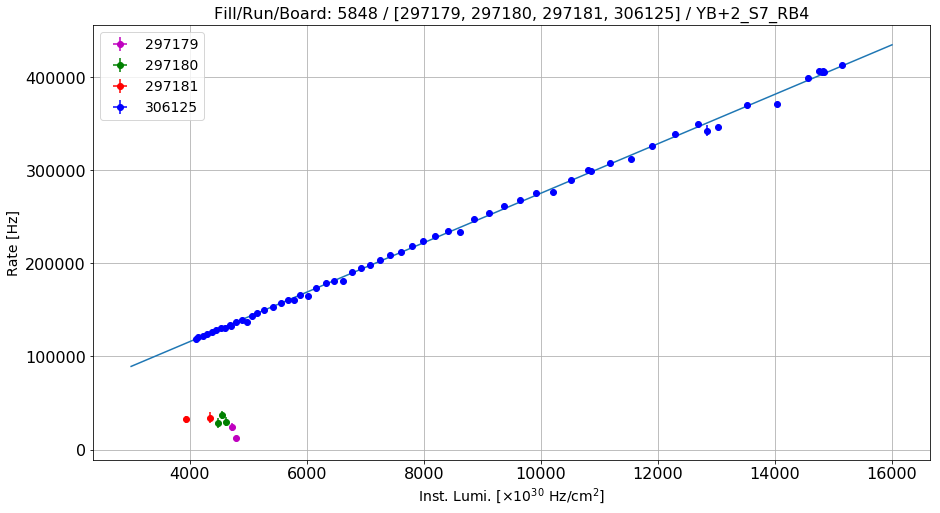

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S8_RB1
Linear fit parameters: [  4.27782094e+01   2.26393974e+05]
Paramenters uncertainty: [  3.50551152e-01   3.42677568e+03]


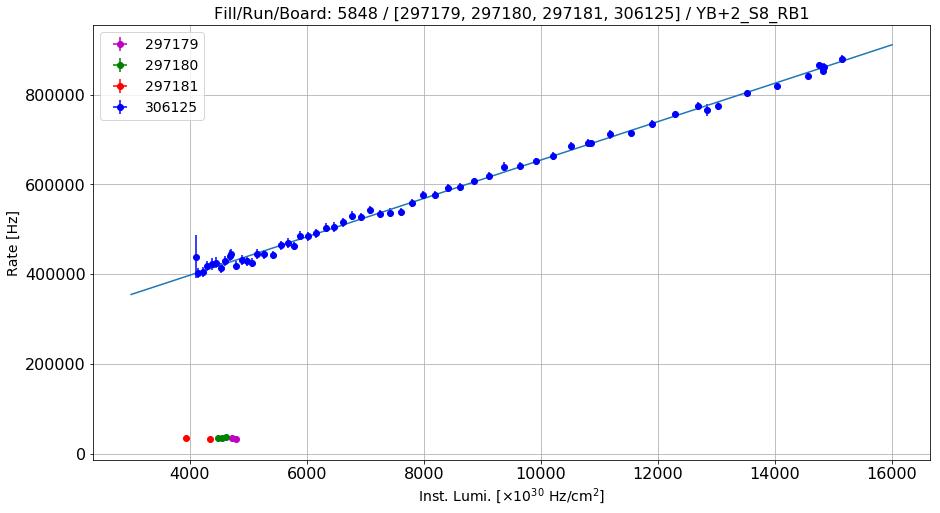

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S8_RB2
Linear fit parameters: [  7.98611871e+00   7.72301864e+04]
Paramenters uncertainty: [  6.63728197e-02   6.48820475e+02]


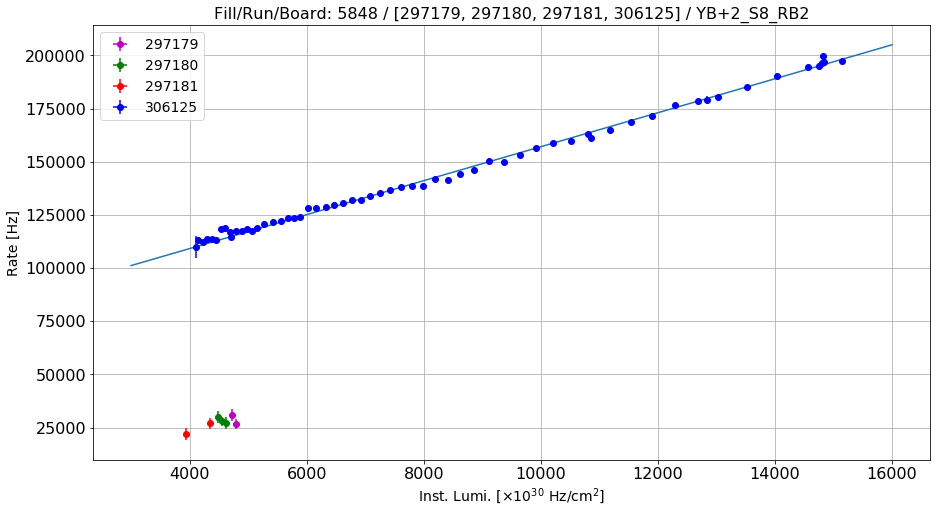

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S8_RB3
Linear fit parameters: [  9.46068723e-01   7.33808531e+03]
Paramenters uncertainty: [  8.13854108e-03   7.95574471e+01]


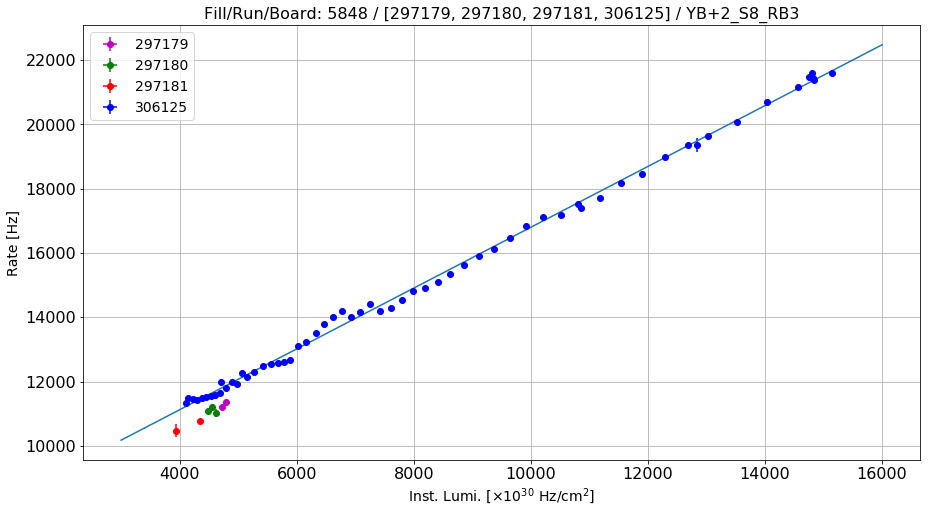

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S8_RB4
Linear fit parameters: [    9.6889369   3143.64050397]
Paramenters uncertainty: [  1.96883068e-02   1.92460959e+02]


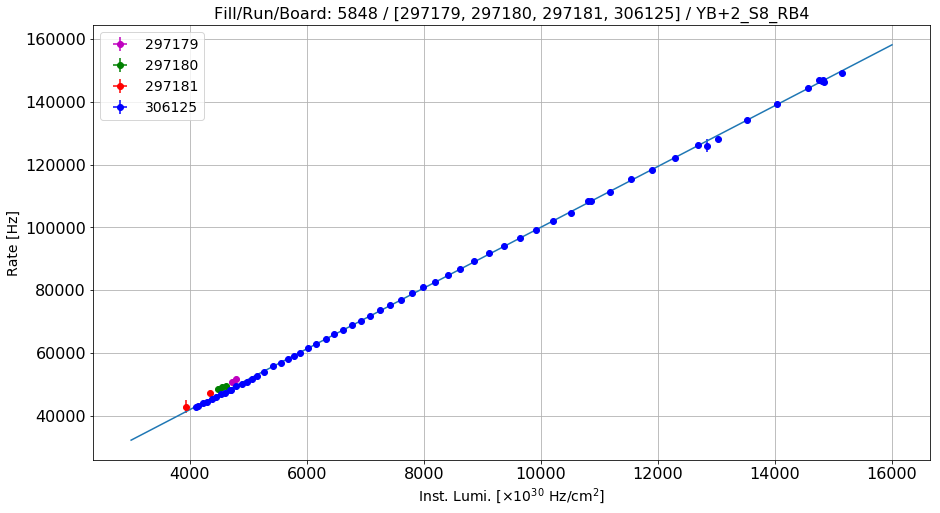

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S9_RB1
Linear fit parameters: [  3.79300863e+01   3.79510650e+04]
Paramenters uncertainty: [  1.42587258e-01   1.39384665e+03]


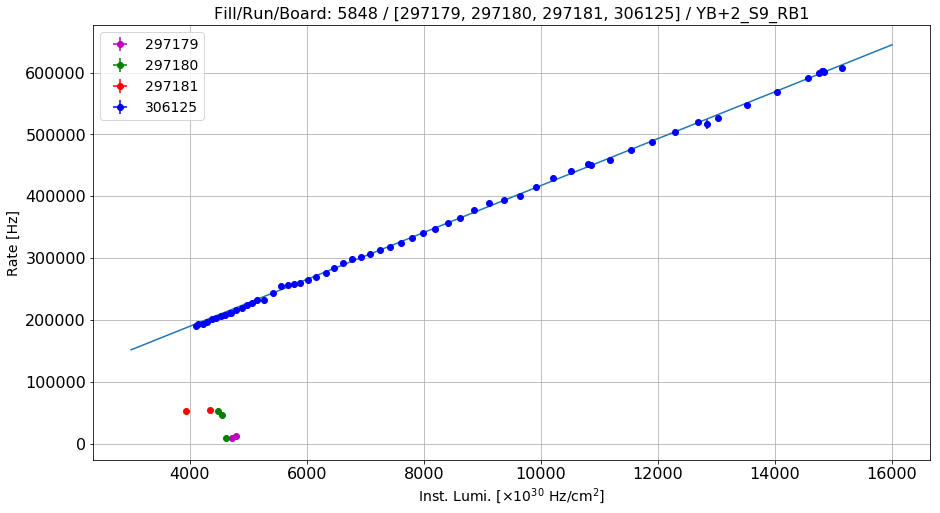

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S9_RB2
Linear fit parameters: [  1.00101555e+01   1.70383965e+04]
Paramenters uncertainty: [  4.66291200e-02   4.55818028e+02]


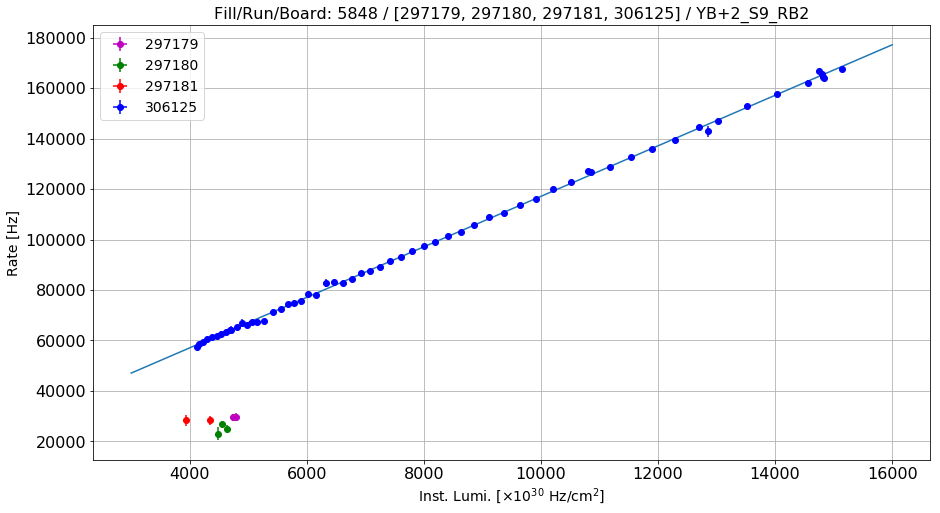

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S9_RB3
Linear fit parameters: [  7.55986350e-01   5.26992354e+03]
Paramenters uncertainty: [  4.13426515e-03   4.04140714e+01]


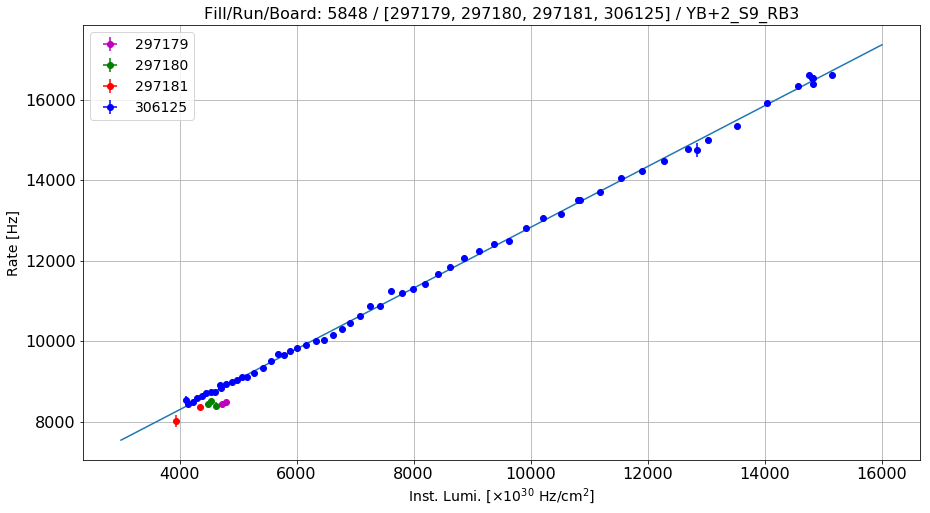

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S9_RB4
Linear fit parameters: [  1.34306146e+00   1.82837104e+03]
Paramenters uncertainty: [  1.16544299e-02   1.13926646e+02]


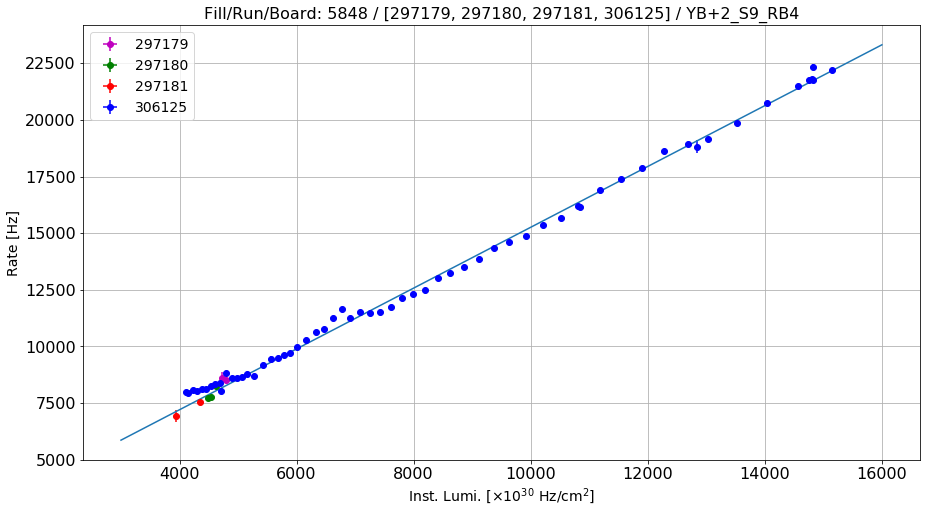

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S10_RB1
Linear fit parameters: [    38.15277445  12537.22676033]
Paramenters uncertainty: [  6.52873651e-02   6.38209728e+02]


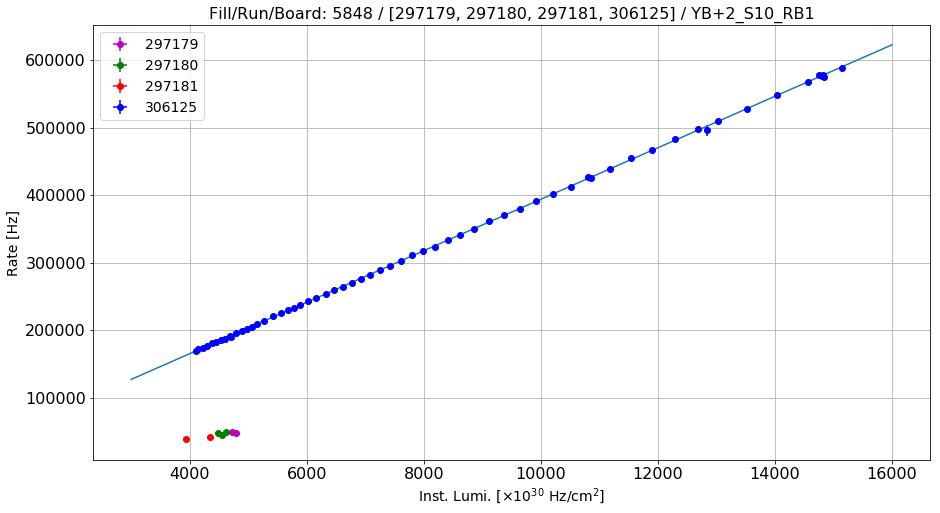

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S10_RB2
Linear fit parameters: [    8.65179548  5157.14992405]
Paramenters uncertainty: [  1.51088841e-02   1.47695298e+02]


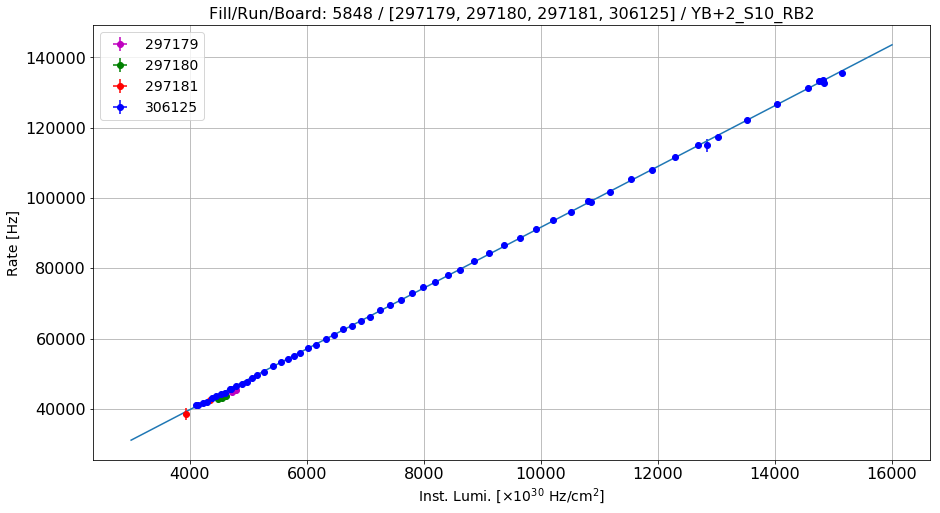

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S10_RB3
Linear fit parameters: [  6.30353787e-01   4.17581245e+03]
Paramenters uncertainty: [  2.62237475e-03   2.56347468e+01]


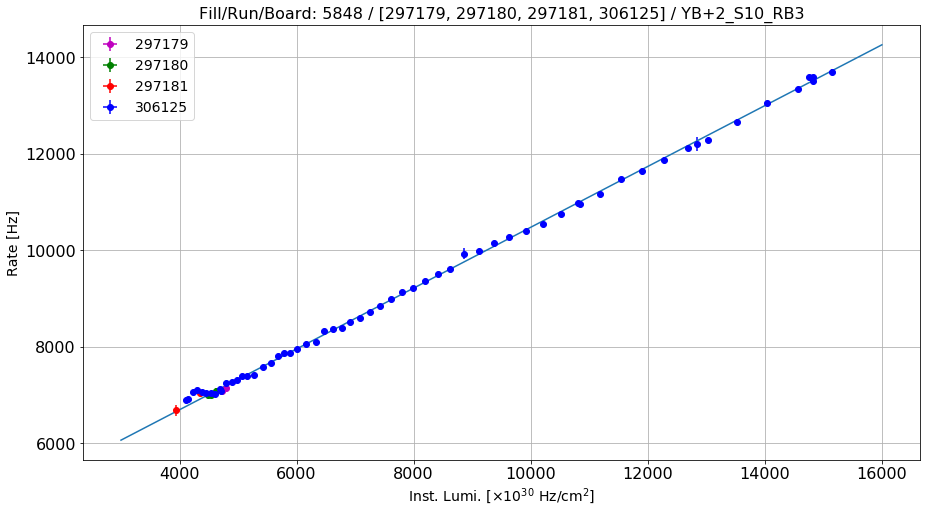

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S10_RB4
Linear fit parameters: [  1.46978959e+00   4.15058714e+03]
Paramenters uncertainty: [  1.15630714e-02   1.13033580e+02]


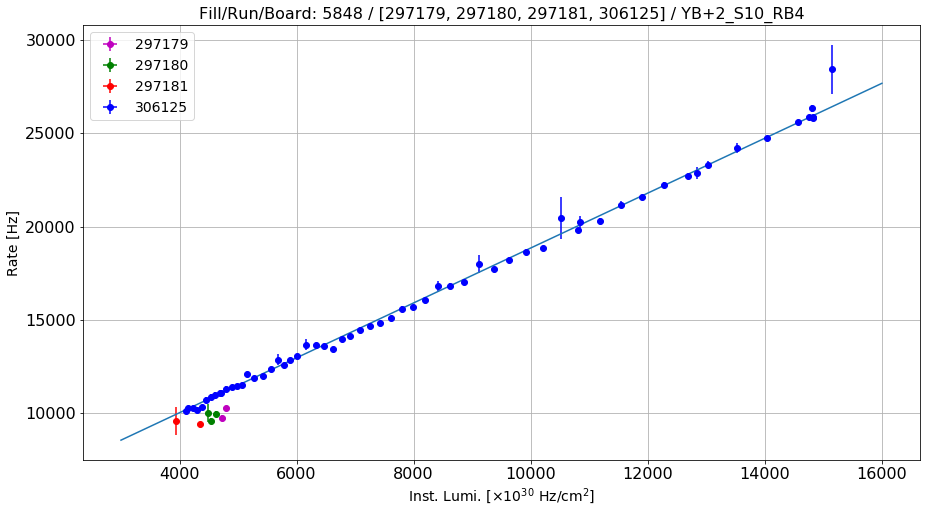

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S11_RB1
Linear fit parameters: [    38.0480644  23734.9642179]
Paramenters uncertainty: [  1.39626411e-01   1.36490320e+03]


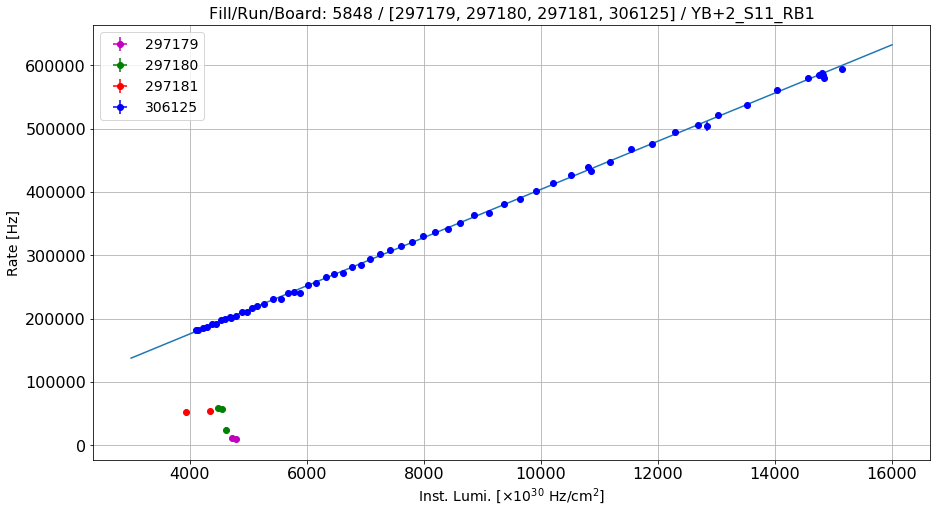

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S11_RB2
Linear fit parameters: [    8.82269369  2922.20605906]
Paramenters uncertainty: [  2.17431658e-02   2.12548016e+02]


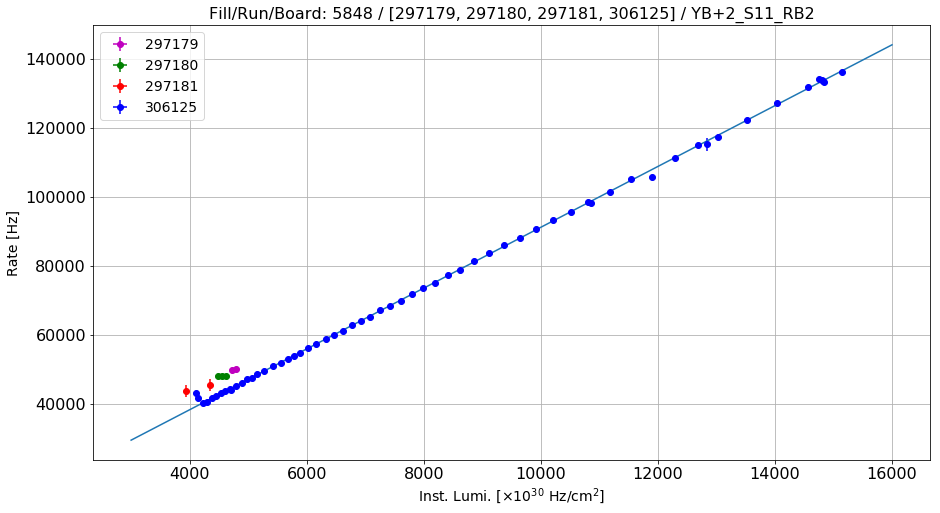

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S11_RB3
Linear fit parameters: [  5.15449259e-01   3.19526900e+04]
Paramenters uncertainty: [  7.01967185e-02   6.86200593e+02]


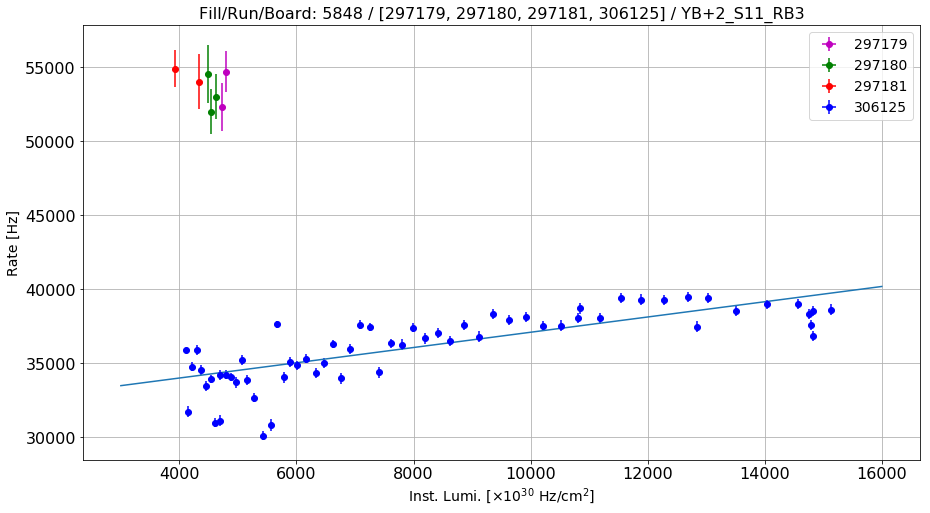

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S11_RB4
Linear fit parameters: [  1.15837744e+00   1.18680040e+04]
Paramenters uncertainty: [  4.03422760e-02   3.94361650e+02]


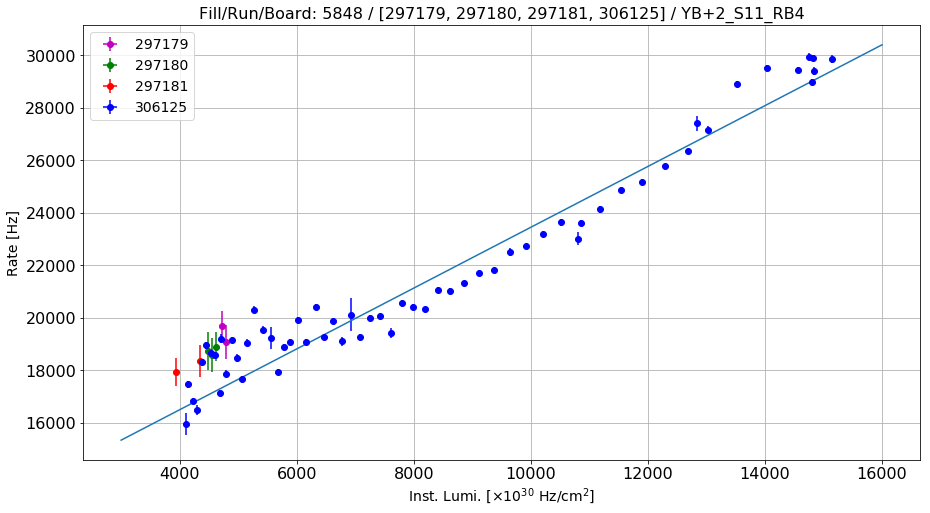

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S12_RB1
Linear fit parameters: [    24.26429116  20781.24379729]
Paramenters uncertainty: [  1.29546212e-01   1.26636528e+03]


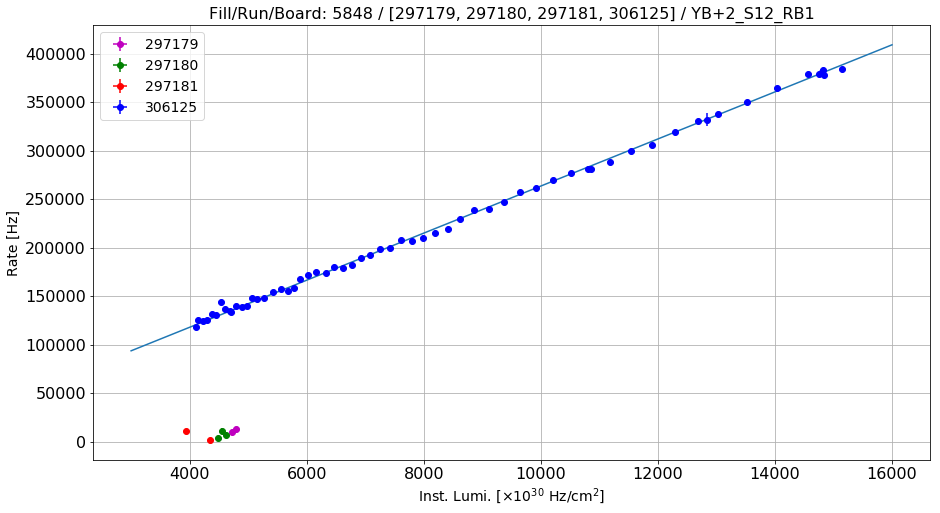

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S12_RB2
Linear fit parameters: [  7.21241276e+00   5.20046236e+04]
Paramenters uncertainty: [  4.95544382e-02   4.84414166e+02]


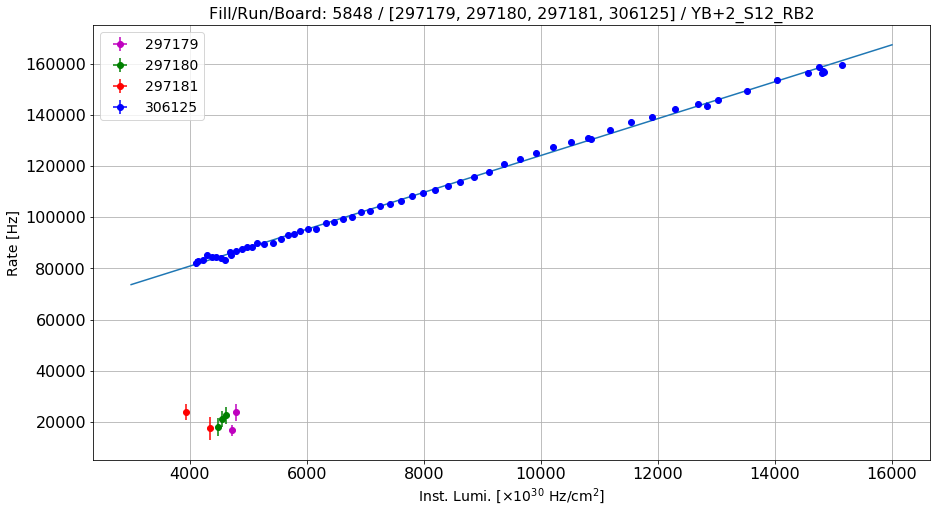

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S12_RB3
Linear fit parameters: [  4.63625883e-01   7.60474935e+02]
Paramenters uncertainty: [  1.21892518e-03   1.19154741e+01]


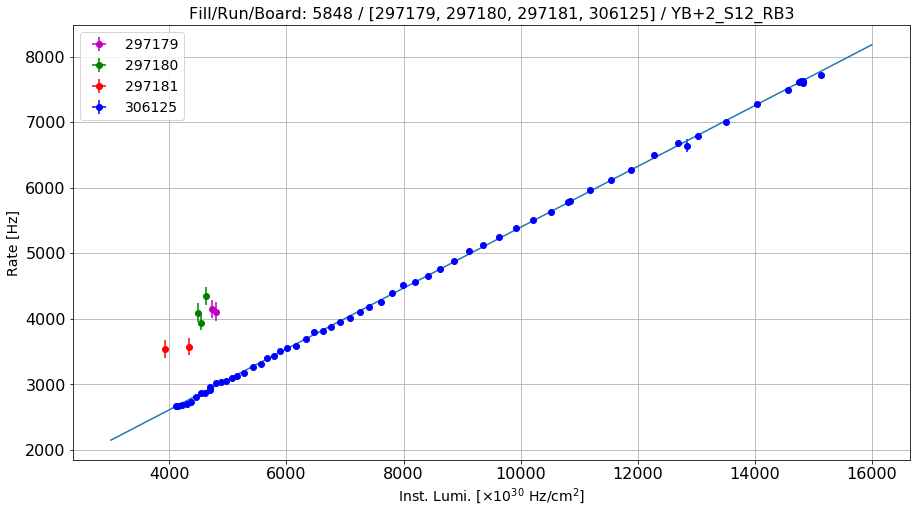

----------------------------------------------------------------------------------------------------------------
Fill/Run/Board: 5848 / [297179, 297180, 297181, 306125] / YB+2_S12_RB4
Linear fit parameters: [  1.78659002e+01   1.00242807e+05]
Paramenters uncertainty: [  9.46346448e-02   9.25090955e+02]


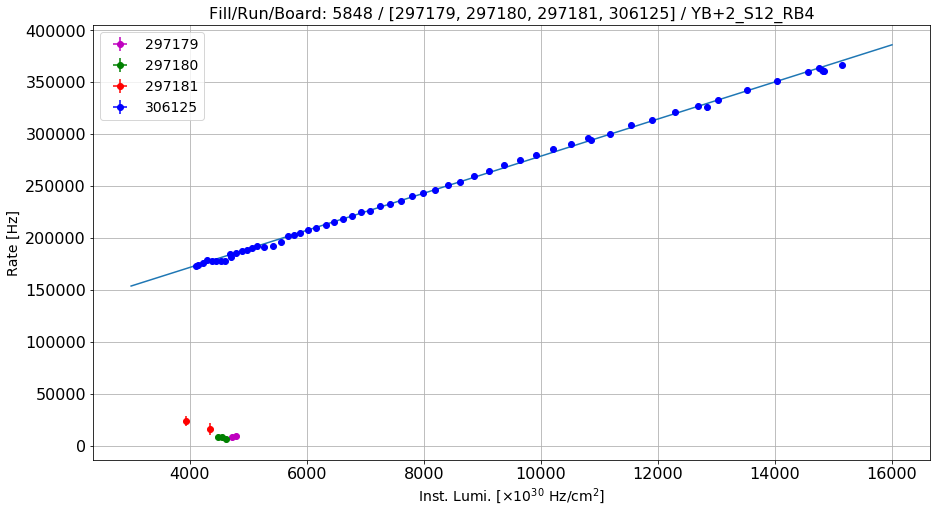

----------------------------------------------------------------------------------------------------------------


In [196]:
for i in [-2, -1, 0, +1, +2]:
#for i in [-1]: #Only anomalous wheels
    #for j in range(4, 7): #Only anomalous sectors
    for j in range(1, 13):
        range_ = range(1, 5)
        for k in range_:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "RPC" + str(k)
            
            error = "err"+station
            
            title = "Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[297179, 297180, 297181, 306125]")+" / " +\
                board + "_RB" + str(k)
                
            print title
            
            fmin = df_rates_new_2[(df_rates_new_2.station == k) & (df_rates_new_2.board == board)]["fmin"].iloc[0]
            fmax = df_rates_new_2[(df_rates_new_2.station == k) & (df_rates_new_2.board == board)]["fmax"].iloc[0]
            #print fmin, fmax
                
            #plot_ratio_vs_ls(df_rates_new_2[df_rates_new_2.station == k],\
            #                [297179, 297180, 297181, 306125],\
            #                 "lumi", "rate", board, 0,\
            #                "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
            #                r"Cross-section [$\times10^{-30}$ cm$^{2}$]",\
            #                 title, ["mo", "go", "ro", "bo"], False, True, fmin, fmax)

            coeff = plot_rate_vs_ls(df_rates_new_2[df_rates_new_2.station == k],\
                                    [297179, 297180, 297181, 306125],\
                                    "lumi", "rate", board, 0, "err",\
                                    r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                                    "Rate [Hz]", title, ["mo", "go", "ro", "bo"],\
                                    False, True, fmin, fmax)
            
            #print coeff
            rule = (df_rates_new_2.station == k) & (df_rates_new_2.board == board) & (df_rates_new_2.run == 306125)
            indexes = df_rates_new_2[rule].index
            for m in indexes:
                a = coeff[0][0]
                b = coeff[0][1]
                s_a = coeff[1][0]
                s_b = coeff[1][1]
                df_rates_new_2.loc[m, "slope"] = a
                df_rates_new_2.loc[m, "inter"] = b
                df_rates_new_2.loc[m, "err_a"] = s_a
                df_rates_new_2.loc[m, "err_b"] = s_b
                x = df_rates_new_2.loc[m, "lumi"]
                df_rates_new_2.loc[m, "rate_mid"] = x*a + b
                df_rates_new_2.loc[m, "rate_low"] = x*(a - s_a) + (b - s_b)
                df_rates_new_2.loc[m, "rate_high"] = x*(a + s_a) + (b + s_b)
            print "----------------------------------------------------------------------------------------------------------------"



In [202]:
rule = (df_rates_new_2.run == 306125)
print df_rates_new_2[rule].rate.iloc[0], df_rates_new_2[rule].rate_mid.iloc[0],\
df_rates_new_2[rule].rate_low.iloc[0], df_rates_new_2[rule].rate_high.iloc[0]

182203.691643 182712.616215 182197.196318 183228.036112


Calculating the number of hits as the area under the curve Rate vs. LS. Each point is the average rate over 10 LS.

In [ ]:
def calcHits(data):
    # 230 is 10 lumisections times 23.3 seconds, the duration of one LS
    return data*10*23.3

df_rates_new_2["hits"] = df_rates_new_2["rate"].apply(calcHits)
#print df_rates_new_2["hits"]

In [ ]:
temp = df_rates_new_2.groupby(["wheel", "sector", "station", "run", "system"])[["hits"]]\
.sum().reset_index()        

Normalizing the number of hits for each chamber to the total number of hits collected during the run:. N.B.: the numbers are percentages.

In [ ]:
plot_scatter_2(temp[temp.run == 306125], "hits", -2, True)
plot_scatter_2(temp[temp.run == 306125], "hits", -1, True)
plot_scatter_2(temp[temp.run == 306125], "hits", 0, True)
plot_scatter_2(temp[temp.run == 306125], "hits", +1, True)
plot_scatter_2(temp[temp.run == 306125], "hits", +2, True)

In [ ]:
plot_scatter_2(temp[temp.run == 297179], "hits", -2, True)
plot_scatter_2(temp[temp.run == 297179], "hits", -1, True)
plot_scatter_2(temp[temp.run == 297179], "hits", 0, True)
plot_scatter_2(temp[temp.run == 297179], "hits", +1, True)
plot_scatter_2(temp[temp.run == 297179], "hits", +2, True)

# Model training section (NOT YET READY FOR RPC, STOP HERE) <a class="anchor" id="fourth-bullet"></a>

Creating train and test samples:

In [ ]:
anomalies = df_rates_new_2.copy()

In [ ]:
normalies = anomalies.copy()

In [ ]:
print len(normalies), len(anomalies)

In [ ]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3) 
print "Normal chimney:"
print normalies[rule]["content"].iloc[0]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[0]

In [ ]:
def assignScore(df, score):
    temp = df.copy()
    rule = (temp["wheel"] == 1) & (temp["sector"] == 4) & (temp["station"] == 3)
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

temp = assignScore(anomalies, 1)
anomalies = temp

In [ ]:
#rule = (anomalies["wheel"] == 1) & (anomalies["sector"] == 4) & (anomalies["station"] == 3)
#print anomalies[rule]["score"]

Forcing the rate to the one of the symmetric chimney chamber:

In [ ]:
def assignRate(df):
    rule1 = (df["wheel"] == 1) & (df["sector"] == 4) & (df["station"] == 3)# not good
    indexes1 = df[rule1].index
    #print indexes
    for i in indexes1:
        group = df.loc[i]["group"]
        run = df.loc[i]["run"]
        rule2 = (df["wheel"] == -1) & (df["sector"] == 3) & (df["station"] == 3) &\
            (df["group"] == group) & (df["run"] == run)
        indexes2 = (df[rule2].index) #it should contain one index
        #print i, index, time
        if(len(indexes2) > 0):
            j = indexes2[0]
            array = df.loc[j]["content"]
            rate = array[6] #good rate from the symmetric sector
            err = array[7] #uncertainty on the good rate from the symmetric sector
            CS = array[8]
            errCS = array[9]
            content_orig = df.loc[i]["content"]
            content = list(content_orig)
            content[6] = rate
            content[7] = err
            content[8] = CS
            content[9] = errCS
            df.at[i, "content"] = content
            #print i, j, time, rate, content_orig, content
        else:
            content_orig = df.loc[i]["content"]
            content = list(content_orig)
            content[6] = -1
            content[7] = -1
            content[8] = -1
            content[9] = -1
            df.at[i, "content"] = content
            #print i, j, time, rate, content_orig, content

assignRate(normalies)

Check that the change affects only normalies:

In [ ]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3)
print "Normal chimney:"
print normalies[rule]["content"].iloc[0]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[0]

In [ ]:
rule = (anomalies["wheel"] == -1) & (anomalies["sector"] == 3) & (anomalies["station"] == 3)
print "Normal chimney:"
print anomalies[rule]["content"].iloc[0]

rule = (anomalies["wheel"] == 1) & (anomalies["sector"] == 4) & (anomalies["station"] == 3)
print "Anomalous chimney:"
print anomalies[rule]["content"].iloc[0]

In [ ]:
#Scale the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing.data import QuantileTransformer
def scale_data(data, scaler_type = 2):
    
    types = ["RobustScaler", "MaxAbsScaler", "QuantileTransformerUniform",\
             "QuantileTransformerNormal", "Normalizer", "MinMaxScaler"]
    #print "Scaling data using:", types[scaler_type-1]
    
    # Need to reshape since scaler works per column
    data = data.reshape(-1, 1)
    if (scaler_type == 1):
        scaler = RobustScaler(quantile_range=(25, 75)).fit(data)
    if (scaler_type == 2):
        scaler = MaxAbsScaler().fit(data)
    if (scaler_type == 3):
        scaler = QuantileTransformer(output_distribution='uniform').fit(data)
    if (scaler_type == 4):
        scaler = QuantileTransformer(output_distribution='normal').fit(data)
    if (scaler_type == 5):
        scaler = Normalizer().fit(data)
    if (scaler_type == 6):
        scaler = MinMaxScaler().fit(data)
    return scaler.transform(data).reshape(1, -1)

In [ ]:
anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)

normalies["content"] = normalies["content"].apply(np.array)
normalies["content_scaled"] = normalies["content"].apply(scale_data)

In [ ]:
#print anomalies["content_scaled"]
#print normalies["content_scaled"]

In [ ]:
# Set a random seed to reproduce the results
rng = np.random.RandomState(0)
anomalies = anomalies[(anomalies.score == 1) & (anomalies.run != 305814)]
normalies = normalies[(normalies.score == -1) & (normalies.run != 305814)]
print("%s faults and %s good samples. In total: %s." %
      (len(anomalies), len(normalies), len(anomalies) + len(normalies)))

anomalies_train, anomalies_test = train_test_split(anomalies, test_size = 0.2, random_state=rng)
normalies_train, normalies_test = train_test_split(normalies, test_size = 0.2, random_state=rng)

neural_anomalies_train, neural_anomalies_val = train_test_split(anomalies_train,\
                                                                test_size = 0.2, random_state=rng)
neural_normalies_train, neural_normalies_val = train_test_split(normalies_train,\
                                                                test_size = 0.2, random_state=rng)

layers_train = pd.concat([anomalies_train, normalies_train])
layers_test = pd.concat([anomalies_test, normalies_test])

neural_train = pd.concat([neural_anomalies_train, neural_normalies_train])
neural_val = pd.concat([neural_anomalies_val, neural_normalies_val])

In [ ]:
print("Number of anomalies in the train set: %s" % len(anomalies_train))
print("Number of normal in the train set: %s" % len(normalies_train))
print("Number of anomalies in the test set: %s" % len(anomalies_test))
print("Number of normal in the test set: %s" % len(normalies_test))

In [ ]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

In [ ]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return (np.array(np.concatenate(neural_train.content_scaled.values)).reshape(-1, 10),
            np.concatenate(neural_train["score"].apply(score_to_array).values).reshape(-1, 2),
            np.array(np.concatenate(neural_val.content_scaled.values)).reshape(-1, 10),
            np.concatenate(neural_val["score"].apply(score_to_array).values).reshape(-1, 2),
            np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10))

(train_x, train_y, val_x, val_y, test_x) = nn_generate_input()

In [ ]:
def cae_generate_input():
    return np.array(np.concatenate(normalies.content_scaled.values)).reshape(-1, 10)

train_cae = cae_generate_input()

In [ ]:
from sklearn.preprocessing import MaxAbsScaler
from sklearn.utils import class_weight

cw = class_weight.compute_class_weight("balanced",
                                       np.unique(np.argmax(train_y, axis=1)),
                                       np.argmax(train_y, axis=1))
cw = {0: cw[0], 1: cw[1]}
print cw

Defining NN structure:

In [ ]:
dim = 10
def neural_network_1():
    model = Sequential()
    model.add(Reshape((dim, 1), input_shape=(dim,), name='input_ann'))
    model.add(Flatten(name="flatten_ann"))
    model.add(Dense(32, activation='relu', name="dense_ann"))
    model.add(Dense(2, activation='softmax', name='output_ann'))
    return model

def neural_network_2():
    model = Sequential()
    model.add(Reshape((dim, 1), input_shape=(dim,), name='input_ann'))
    model.add(Flatten(name="flatten_ann"))
    model.add(Dense(32, activation='relu', name="dense_ann"))
    model.add(Dense(32, activation='relu', name="dense_ann2"))
    model.add(Dense(2, activation='softmax', name='output_ann'))
    return model

def neural_network_3():
    model = Sequential()
    model.add(Reshape((dim, 1), input_shape=(dim,), name='input_ann'))
    model.add(Flatten(name="flatten_ann"))
    model.add(Dense(32, activation='relu', name="dense_ann"))
    model.add(Dense(32, activation='relu', name="dense_ann2"))
    model.add(Dense(32, activation='relu', name="dense_ann3"))
    model.add(Dense(2, activation='softmax', name='output_ann'))
    return model

def neural_network_4():
    model = Sequential()
    model.add(Reshape((dim, 1), input_shape=(dim,), name='input_ann'))
    model.add(Flatten(name="flatten_ann"))
    model.add(Dense(32, activation='relu', name="dense_ann"))
    model.add(Dense(32, activation='relu', name="dense_ann2"))
    model.add(Dense(32, activation='relu', name="dense_ann3"))
    model.add(Dense(32, activation='relu', name="dense_ann4"))
    model.add(Dense(2, activation='softmax', name='output_ann'))
    return model

def autoencoder():
    from keras.layers import Input, Dense
    from keras.models import Model
    input_ = Input(shape=(10,))
    encoded = Dense(10, activation='relu')(input_)
    encoded = Dense(9, activation='relu')(encoded)
    encoded = Dense(8, activation='relu')(encoded)
    encoded = Dense(7, activation='relu')(encoded)
    encoded = Dense(6, activation='relu')(encoded)
    
    decoded = Dense(6, activation='relu')(encoded)
    decoded = Dense(7, activation='relu')(decoded)
    decoded = Dense(8, activation='relu')(decoded)
    decoded = Dense(9, activation='relu')(decoded)
    decoded = Dense(10, activation='sigmoid')(decoded)

    autoencoder = Model(input_, decoded)
    return autoencoder

In [ ]:
ann_1 = neural_network_1()
ann_2 = neural_network_2()
ann_3 = neural_network_3()
ann_4 = neural_network_4()
#print("Neural Network Architecture:")
#ann_1.summary()
#ann_2.summary()
#ann_3.summary()
#ann_4.summary()

Training the NN:

In [ ]:
# This may take some time...

def train_nn(model, x, y, batch_size, loss, name, validation_data=None, 
             validation_split=0.0, class_weight=None):

    model.compile(loss=loss, optimizer='Nadam')

    early_stopper = EarlyStopping(monitor="val_loss",
                                  patience=32,
                                  verbose=True,
                                  mode="auto")
    
    checkpoint_callback = ModelCheckpoint(("./model_keras/%s.h5" % name),
                                          monitor="val_loss",
                                          verbose=False,
                                          save_best_only=True,
                                          mode="min")
    return model.fit(x, y,
                     batch_size=batch_size,
                     epochs=8192,
                     verbose=False,
                     class_weight=class_weight,
                     shuffle=True,
                     validation_split=validation_split,
                     validation_data=validation_data,
                     callbacks=[early_stopper, checkpoint_callback])

In [ ]:
history_ann_1 = train_nn(ann_1,
                       train_x,
                       train_y,
                       len(train_x),
                       keras.losses.categorical_crossentropy,
                       "ann_1",
                       validation_data=(val_x, val_y),
                       class_weight=cw)

In [ ]:
history_ann_2 = train_nn(ann_2,
                       train_x,
                       train_y,
                       len(train_x),
                       keras.losses.categorical_crossentropy,
                       "ann_2",
                       validation_data=(val_x, val_y),
                       class_weight=cw)

In [ ]:
history_ann_3 = train_nn(ann_3,
                       train_x,
                       train_y,
                       len(train_x),
                       keras.losses.categorical_crossentropy,
                       "ann_3",
                       validation_data=(val_x, val_y),
                       class_weight=cw)

In [ ]:
history_ann_4 = train_nn(ann_4,
                       train_x,
                       train_y,
                       len(train_x),
                       keras.losses.categorical_crossentropy,
                       "ann_4",
                       validation_data=(val_x, val_y),
                       class_weight=cw)

In [ ]:
def plot_training_loss(data, title):
    """Plots the training and validation loss"""
    plt.figure()
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(title)
    plt.plot(data["loss"])
    plt.plot(data["val_loss"])
    plt.legend(["Train", "Validation"], loc="upper right")
    plt.yscale("log")
    plt.show();

plot_training_loss(history_ann_1.history, "SNN (1 layers) model loss")
plot_training_loss(history_ann_2.history, "DNN (2 layers) model loss")
plot_training_loss(history_ann_3.history, "DNN (3 layers) model loss")
plot_training_loss(history_ann_4.history, "DNN (4 layers) model loss")

Making an inference using the model and the test sample:

In [ ]:
ann_model_1 = load_model("./model_keras/ann_1.h5")
ann_model_2 = load_model("./model_keras/ann_2.h5")
ann_model_3 = load_model("./model_keras/ann_3.h5")
ann_model_4 = load_model("./model_keras/ann_4.h5")

In [ ]:
layers_test["ann_score_1"] = ann_model_1.predict(np.array(test_x))[:, 1]
layers_test["ann_score_2"] = ann_model_2.predict(np.array(test_x))[:, 1]
layers_test["ann_score_3"] = ann_model_3.predict(np.array(test_x))[:, 1]
layers_test["ann_score_4"] = ann_model_4.predict(np.array(test_x))[:, 1]

In [ ]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 1, 100)
plt.hist(layers_test[layers_test["score"] < 0]["ann_score_4"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["ann_score_4"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: DNN (4 layers)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [ ]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

In [ ]:
cae = autoencoder()
#print("Autoencoder Architecture:")
#cae.summary()

In [ ]:
history_cae = train_nn(cae,
                       train_cae,
                       train_cae,
                       512,
                       keras.losses.mse,
                       "cae",
                       validation_split=0.2)
plot_training_loss(history_cae.history, "Autoencoder model loss")

In [ ]:
cae_model = load_model("./model_keras/cae.h5")
layers_test["cae_score"] = np.sum(abs(test_x - cae_model.predict(np.array(test_x))), axis=1)

In [ ]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity
    
print "DNN:"
specificity_ann, sensitivity_ann = benchmark(layers_test["score"], layers_test["ann_score_4"], 0.5)
print "AE:"
specificity_cae, sensitivity_cae = benchmark(layers_test["score"], layers_test["cae_score"], 0.035)

In [ ]:
get_roc_curve(layers_test, 
              [
               ("AE", "cae_score"),
               ("SNN", "ann_score_1"),
               ("DNN (2 layers)", "ann_score_2"),
               ("DNN (3 layers)", "ann_score_3"),
               ("DNN (4 layers)", "ann_score_4"),
               ], (specificity_ann, sensitivity_ann))

In [ ]:
fig, ax = plt.subplots()
ax.set_yscale('log')
#ax.grid()
bins = np.linspace(0, 0.2, 100)
plt.hist(layers_test[layers_test["score"] < 0]["cae_score"], bins=bins,\
         alpha=0.5, label="Normal chambers")
plt.hist(layers_test[layers_test["score"] > 0]["cae_score"], bins=bins,\
         alpha=0.5, label="Anomalous chambers")
plt.title("Distribution of scores: AE")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.085, color='k', linestyle='dashed', linewidth=1)
plt.show()

Setting thresholds:

In [ ]:
th_dnn = 0.5
th_ae = 0.085

In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
threshold = th_dnn
y_pred = 2*(layers_test["ann_score_4"] > threshold)-1
layers_test["score"] = 2*(layers_test["score"] > threshold)-1

cnf_matrix = confusion_matrix(layers_test["score"], y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix DNN, with normalization')

In [ ]:
threshold = th_ae
y_pred = 2*(layers_test["cae_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix AE, with normalization')

In [ ]:
print "Number of FPs for the DNN:", len(layers_test[(layers_test["score"] == -1) &\
                                                    (layers_test["ann_score_4"] > th_dnn)])

In [ ]:
print "Number of FPs for the AE:", len(layers_test[(layers_test["score"] == -1) &\
                                                   (layers_test["cae_score"] > th_ae)])

In [ ]:
layers_test["name"] = ("W" + layers_test["wheel"].astype(str) + "_S" + layers_test["sector"].astype(str) +\
       "_St" + layers_test["station"].astype(str))

Where are the FPs located?

In [ ]:
def count_fp(df, dis_nn, th, filt):
    df_temp = df[(layers_test["score"] == -1) & (layers_test[dis_nn] > th)].copy()
    df_temp = df_temp.groupby(['run', 'wheel', 'sector', 'station', 'name'])\
    .size().reset_index(name='counts')
    if filt:
        df_temp = df_temp[df_temp["counts"] > 1]
    #print df_temp
    return len(df_temp), df_temp

num_fp_ann, fp_ann = count_fp(layers_test, "ann_score_4", th_dnn, False)
num_fp_cae, fp_cae = count_fp(layers_test, "cae_score", th_ae, True)

print "Number of chambers with false positives DNN:", num_fp_ann
print "Number of chambers with false positives AE:", num_fp_cae
fp_cae.set_index("name",drop=True,inplace=True)
fp_ann.set_index("name",drop=True,inplace=True)

In [ ]:
#fp_ann["counts"].plot(kind='bar', title ="False positives DNN", legend=True, fontsize=12)

In [ ]:
fp_cae["counts"].plot(kind='bar', title ="False positives AE", legend=True, fontsize=12)

In [ ]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

def deduceLS(data):
    return data*10+5
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)

In [ ]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    print mat
    print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

th = th_ae
dis_nn = "cae_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > th)
plot_scatter(layers_test[rule], 306125, -3, 210, 230)

plot_scatter(layers_test[rule], -1, -2, -1, -1)
plot_scatter(layers_test[rule], -1, -1, -1, -1)
plot_scatter(layers_test[rule], -1, 0, -1, -1)
plot_scatter(layers_test[rule], -1, +1, -1, -1)
plot_scatter(layers_test[rule], -1, +2, -1, -1)

Where are the FPs located in time?

In [ ]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n
    
threshold = th_ae
n1 = plotFpVsLs(306121, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306121]["ls_end"])
n2 = plotFpVsLs(306122, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306122]["ls_end"])
n3 = plotFpVsLs(306125, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306125]["ls_end"])
n4 = plotFpVsLs(306126, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306126]["ls_end"])

Trying some benchmark algorithms (for outlier detection). Isolation forest:

In [ ]:
def variance(content):
    return np.var(content)
layers_test["variance_score"] = layers_test["content"].apply(variance)

In [ ]:
def cross_validation_split(train_X, train_y, clf_i, param_grid, return_params=False):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=rng)
    clf = GridSearchCV(clf_i, param_grid, cv=skf, scoring='roc_auc'); 
    clf.fit(train_X, train_y)
    if return_params:
        return clf.best_params_
    return clf.best_estimator_

In [ ]:
param_grid = [{"max_samples": [100, 1000],
               "n_estimators": [10, 100],
               "contamination": np.array(range(4, 13, 1))/100.0}]

ifparams = cross_validation_split(np.vstack(layers_train["content_scaled"].values),
                                 -layers_train["score"].astype(int),
                                 IsolationForest(random_state=rng, 
                                                 #verbose=1
                                                ),
                                 param_grid)

In [ ]:
# Retrain IF using all unlabelled samples

ifclf = IsolationForest(max_samples=ifparams.max_samples,
                        n_estimators=ifparams.n_estimators,
                        contamination=ifparams.contamination,
                        random_state=rng)

ifclf.fit(np.vstack(normalies_train["content_scaled"].values))

Then use SVM for outlier detection:

In [ ]:
# This may take some time... to be run on a remote machine possibly on GPU

#param_grid = [{"nu": np.array(range(1, 10, 1))/10.0,
#               "gamma": ["auto", 0.1, 0.01, 0.001, 0.0001],
#               "kernel": ["linear", "rbf"]}]

#svmparams = cross_validation_split(np.vstack(layers_train["content_scaled"].values),
#                                  -layers_train["score"].astype(int),
#                                  svm.OneClassSVM(random_state=rng, 
#                                                  verbose=1
#                                                 ),
#                                  param_grid)

In [ ]:
# Retrain SVM using only good samples. For the moment using some temporary values.
svmclf = svm.OneClassSVM(
                         #nu=svmparams.nu,
                         nu=0.10000000000000001,
                         #gamma=svmparams.gamma,
                         gamma='auto',
                         kernel='linear',
                         random_state=rng
                        )
svmclf.fit(np.vstack(normalies_train["content_scaled"].values))

In [ ]:
layers_test["svm_score"] = -svmclf.decision_function(np.vstack(layers_test["content_scaled"].values))
layers_test["if_score"] = -ifclf.decision_function(np.vstack(layers_test["content_scaled"].values))

In [ ]:
get_roc_curve(layers_test,[
                           ("Variance", "variance_score"),
                           ("IF", "if_score"),
                           ("SVM", "svm_score"),
                           ("AE", "cae_score"),
                           ("DNN", "ann_score_4"),
                          ]
             )

In [ ]:
from sklearn import tree
from sklearn.ensemble import AdaBoostClassifier
bdt_clf = tree.DecisionTreeClassifier()
bdt_clf = bdt_clf.fit(np.vstack(layers_train["content_scaled"].values), layers_train["score"].astype(int))
layers_test["bdt_score"] = bdt_clf.predict(np.vstack(layers_test["content_scaled"].values))

In [ ]:
ada_clf = AdaBoostClassifier(tree.DecisionTreeClassifier(max_depth=1),
                         algorithm="SAMME",
                         n_estimators=200)
ada_clf = ada_clf.fit(np.vstack(layers_train["content_scaled"].values), layers_train["score"].astype(int))
layers_test["ada_score"] = ada_clf.predict(np.vstack(layers_test["content_scaled"].values))

In [ ]:
threshold = 0.0
y_pred = 2*(layers_test["bdt_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix BDT, with normalization')

In [ ]:
threshold = 0.0
y_pred = 2*(layers_test["ada_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix ADA BDT, with normalization')

Trying KNeighborsClassifier classifier:

In [ ]:
from sklearn import neighbors
knclf = neighbors.KNeighborsClassifier(15, weights='distance')
knclf.fit(np.vstack(layers_train["content_scaled"].values),\
          -layers_train["score"].astype(int))

In [ ]:
layers_test["knn_score"] = -knclf.predict(np.vstack(layers_test["content_scaled"].values))

In [ ]:
threshold = 0.0
y_pred = 2*(layers_test["knn_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix KNN, with normalization')

In [ ]:
filename = './model_sktlearn/knn.sav'
joblib.dump(knclf, filename)

Trying unsupervised algorithms: LOF. Optimizing LOF parameters first:

In [ ]:
threshold = 0.0
result_lof = []
for i in range(5, 100, 2):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.02)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
for i in range(105, 1000, 100):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.02)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
for i in range(1005, 2000, 100):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.02)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
fp_rate = []
tp_rate = []
for i in range(len(result_lof)):
    fp_rate.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

In [ ]:
def plot_perf(der, rel, xaxis, yaxis, x1, x2, y1, y2, logx, logy):
    fig, ax = plt.subplots()
    if logy:
        ax.set_yscale('log')
    if logx:
        ax.set_xscale('log')
    a, b = zip(*der)
    c, d = zip(*rel)
    plt.ylim(y1, y2)
    plt.xlim(x1, x2)
    plt.plot(a, b, "ro-", alpha=0.5, label = "False positive rate")
    plt.plot(c, d, "mo-", alpha=0.5, label = "True positive rate")
    plt.axhline(1.00, color='k', linestyle='dashed', linewidth=1)
    #plt.axhline(0.01, color='g', linestyle='dashed', linewidth=1)
    if (xaxis == 'Number of neighbors'):
        plt.axvline(1200, color='k', linestyle='dashed', linewidth=1)
    elif (xaxis == 'Contamination'):
        plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
    plt.title("LOF")
    plt.legend(loc='best')
    #plt.ylabel('Inertia')
    plt.xlabel(xaxis)
    plt.show()
    
plot_perf(fp_rate, tp_rate, 'Number of neighbors', '', 0, 2000, 0.01, 1.1, False, True)

In [ ]:
threshold = 0.0
result_lof = []
for i in np.array(range(1, 500, 5))/1000.0:
    lofclf = LocalOutlierFactor(n_neighbors=1205, contamination=i)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
fp_rate_c = []
tp_rate_c = []
for i in range(len(result_lof)):
    fp_rate_c.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate_c.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

In [ ]:
plot_perf(fp_rate_c, tp_rate_c, 'Contamination', '', 0.01, 0.2, 0.001, 1.1, False, True)

Choosing ...

In [ ]:
# fit the model
lofclf = LocalOutlierFactor(n_neighbors=1205, contamination=0.02)#It has to be a odd number
layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))

In [ ]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_train[layers_train["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_train[layers_train["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: LOF")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

In [ ]:
threshold = 0.0
y_pred = 2*(layers_train["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_train["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

In [ ]:
layers_train["averageLS"] = layers_train["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(306121, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306121]["ls_end"])
plotFpVsLs(306122, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306122]["ls_end"])
plotFpVsLs(306125, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306125]["ls_end"])
plotFpVsLs(306126, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306126]["ls_end"])

Trying KMeans clustering algorithm. First of all let's find the optimal number of clusters (parameter to the algorithm) by scanning the average distance vs. number of clusters:

In [ ]:
means = []
for i in range(1, 300, 10):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content_scaled"].values))
    means.append([i, k_means.inertia_])

In [ ]:
for i in range(300, 500, 10):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content_scaled"].values))
    means.append([i, k_means.inertia_])

In [ ]:
for i in range(500, 1000, 100):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content_scaled"].values))
    means.append([i, k_means.inertia_])

In [ ]:
for i in range(1000, 2000, 200):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content_scaled"].values))
    means.append([i, k_means.inertia_])

In [ ]:
for i in range(2, 10, 1):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content_scaled"].values))
    means.append([i, k_means.inertia_])

In [ ]:
def getKey(item):
    return item[0]

means = sorted(means, key=getKey)

In [ ]:
der = []
for i in range(0, len(means)-1):
    x, y = zip(*means)
    a = np.sqrt(y[i]/len(normalies_train))
    b = np.sqrt(y[i+1]/len(normalies_train))
    delta = (a-b)/a
    der.append([x[i], delta])

In [ ]:
rel = []
for i in range(0, len(means)-1):
    x, y = zip(*means)
    a = np.sqrt(y[i]/len(normalies_train))
    b = np.sqrt(y[i+1]/len(normalies_train))
    delta = (a-b)*100000/y[0]
    rel.append([x[i], delta])

In [ ]:
def plotDist(means, der, rel):
    fig, ax = plt.subplots()
    ax.set_yscale('log')
    ax.set_xscale('log')
    x, y = zip(*means)
    a, b = zip(*der)
    c, d = zip(*rel)
    plt.ylim(0.0001, 10.)
    plt.xlim(1, 2000)
    plt.plot(x, np.sqrt(np.array(y)/len(normalies_train)), "bo-", alpha=0.5, label="Average distance")
    plt.plot(a, b, "ro-", alpha=0.5, label = "Relative variation: (d$_{cls}$ - d$_{cls+1}$)/d$_{cls}$")
    plt.plot(c, d, "mo-", alpha=0.5, label = "Relative variation: (d$_{cls}$ - d$_{cls+1}$)/d$_{cls = 1}$\
    (x$10^{-5}$)")
    plt.axhline(0.05, color='k', linestyle='dashed', linewidth=1)
    plt.axhline(0.01, color='g', linestyle='dashed', linewidth=1)
    plt.axvline(100, color='k', linestyle='dashed', linewidth=1)
    plt.axvline(500, color='y', linestyle='dashed', linewidth=1)
    plt.title("K-Means clustering")
    plt.legend(loc='best')
    #plt.ylabel('Inertia')
    plt.xlabel('Number of clusters')
    plt.show()
    
plotDist(means, der, rel)

Choosing 450 clusters and training on the normalies only:

In [ ]:
n_cls = 450
k_means = cluster.KMeans(n_clusters=n_cls)
distances = k_means.fit_transform(np.vstack(normalies["content_scaled"].values))
normalies["kmeans_score"] = k_means.labels_

In [ ]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, n_cls, n_cls+1)
plt.hist(normalies[normalies["score"] < 0]["kmeans_score"], bins=bins, alpha=0.5, label="Normalies")
#plt.hist(normalies[normalies["score"] > 0]["kmeans_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("K-Means cluster distribution")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Cluster')
plt.show()

The minimal distance is used to assign the data to the clusters. Visualize the average distance within a cluster:

In [ ]:
minim = []
for i in range(0, len(distances)):
    #print  min(distances[i])
    minim.append(min(distances[i]))

In [ ]:
#print len(minim)
normalies["dist"] = minim
#print normalies["dist"]

In [ ]:
temp1 = normalies.groupby(["kmeans_score"])[["dist"]].mean().reset_index()        

In [ ]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 0.02, 20)
plt.hist(temp1["dist"], bins=bins, alpha=0.5, label="Normalies")
plt.title("K-Means average distance distribution")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Average distance within clusters')
plt.show()

Predicting the distances of the test sample data with respect to the clusters and plotting the minimum distance for each point (dividing anomalies and normalies):

In [ ]:
distances_test = k_means.transform(np.vstack(layers_test["content_scaled"].values))
minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
layers_test["dist"] = minim

In [ ]:
fig, ax = plt.subplots()
ax.set_yscale('log')
#ax.grid()
bins = np.linspace(0, 0.05, 100)
plt.hist(layers_test[layers_test["score"] < 0]["dist"], bins=bins, alpha=0.5, label="Normal chambers")
plt.hist(layers_test[layers_test["score"] > 0]["dist"], bins=bins, alpha=0.5, label="Anomalous chambers")
plt.axvline(0.025, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

In [ ]:
th_km = 0.025
y_pred = 2*(layers_test["dist"] > th_km)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')

In [ ]:
get_roc_curve(layers_test,[
                           ("Variance", "variance_score"),
                           ("IF", "if_score"),
                           ("SVM", "svm_score"),
                           ("AE", "cae_score"),
                           ("KMeans", "dist"),
                           ("DNN", "ann_score_4"),
                          ]
             )

In [ ]:
filename = './model_sktlearn/kmeans.sav'
joblib.dump(k_means, filename)